# Logistic Regression and Gradient Descent Algorithm

Suppose you would like to know something before it happens. Like the temperature of tomorrow, the sales of one store and the stock price. various regression models could help to build model on those continuous variables. However, what if you variable has only two outputs, i.e. whether the tumor is benigh or malignant, whether mets or Yankees will win the base ball game. Linear regression might not be a good fit.

You could see that the linear regression model mis-classified 60% of observation into the wrong class. You might think that if we assign some rule like if y_pre >0.5, then classify y as 1, otherwise 0. 

('Coefficients: \n', array([[ 1.76569187]]))
Mean squared error: 0.06
Variance score: 0.77


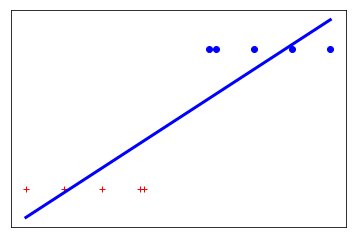

In [121]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
x = np.array([[0.1,0.2,0.3,0.4,0.41,0.58,0.6,0.7,0.8,0.9]])
x1 = x[0][0:5]
x2 = x[0][5:]
y = np.array([0,0,0,0,0,1,1,1,1,1])
y = y.reshape(10,1)
y1 = y[0:5]
y2 = y[5:]
X= x.reshape(10,1)

from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score

regr = linear_model.LinearRegression()

pre = regr.fit(X, y)

pre_y = pre.predict(X)
#pre_y = p/0.5 for p in pre_y
#pre_y=pre_y/0.5>1
#pre_y = pre_y > y
# The coefficients
print('Coefficients: \n', regr.coef_)
# The mean squared error

# Explained variance score: 1 is perfect prediction

print("Mean squared error: %.2f"
      % mean_squared_error(y, pre_y))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(y, pre_y))



# Plot outputs
plt.plot(x1,y1,'r+',x2,y2,'bo')    
plt.plot(X, pre_y, color='blue', linewidth=3)

plt.xticks(())
plt.yticks(())

plt.show()

You might think that if we assign some rule like if y_pre >0.5, then classify y as 1, otherwise 0. 

('Coefficients: \n', array([[ 1.76569187]]))
Mean squared error: 0.00
Variance score: 1.00


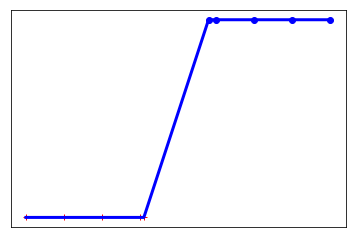

In [125]:

print('Coefficients: \n', regr.coef_)
# The mean squared error

# Explained variance score: 1 is perfect prediction

print("Mean squared error: %.2f"
      % mean_squared_error(y, pre_y))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(y, pre_y))


pre_y = pre_y >0.5
# Plot outputs
plt.plot(x1,y1,'r+',x2,y2,'bo')    
plt.plot(X, pre_y, color='blue', linewidth=3)

plt.xticks(())
plt.yticks(())

plt.show()

In this case, the model fits well, however, it might not work in other cases. What if X is some random variable?

('Coefficients: \n', array([[-0.32279996]]))
Mean squared error: 0.24
Variance score: 0.04


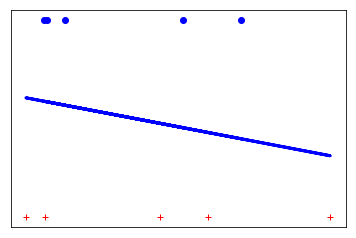

In [131]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
x = np.array([[0.1,0.2,0.3,0.4,0.41,0.58,0.6,0.7,0.8,0.9]])
x = np.random.random(10)
x1 = x[0:5]
x2 = x[5:]
y = np.array([0,0,0,0,0,1,1,1,1,1])
y = y.reshape(10,1)
y1 = y[0:5]
y2 = y[5:]
X= x.reshape(10,1)

from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score

regr = linear_model.LinearRegression()

pre = regr.fit(X, y)

pre_y = pre.predict(X)
#pre_y = p/0.5 for p in pre_y
#pre_y=pre_y/0.5>1
#pre_y = pre_y > y
# The coefficients
print('Coefficients: \n', regr.coef_)
# The mean squared error

# Explained variance score: 1 is perfect prediction

print("Mean squared error: %.2f"
      % mean_squared_error(y, pre_y))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(y, pre_y))



# Plot outputs
plt.plot(x1,y1,'r+',x2,y2,'bo')    
plt.plot(X, pre_y, color='blue', linewidth=3)

plt.xticks(())
plt.yticks(())

plt.show()

In this case, it is hard to get a decision boundary.

Actually, the biggest problem here is that the f(x) could have value range from -Inf to +Inf, while the y here only have discrete values in certain range like 0,1,2,3,4,5. 

However, based on the theory of generalized linear model, we could transform Y into g(y), they mapping y's value from discrete value to (-inf, +inf) using some math tricks.

You might heard about logistic regression, probit model, log log model, actually, they are the same kind of model and I will take logistic regression model as an example and discuss it with you in detail.

In the generalized model theory, there are the few concepts,
* Random Component:y
* Link Function: g(x)
* Systemetic Component:x

The link function for logistic regression is log (p/(1-p)) = b0+ b1x1 + ..bnxn
 
 p = exp(bx)/(1+exp(bx))

or

p = 1/(1+exp(-bx)


 usually if p > 0.5 then log (p/(1-p)>0, then y ^=0, otherwise, y =1
 
 However, as y is not differetiable, we could not apply OLS or Maximum likelihood method to get the parameter. 
 
 **The general idea is figuring out the parameter that minimize the loss**
 
 Loss function of logistic regression is defined as 
 
 L = Sum((1-y(i))*ln(p(y=1)) + (y(i)*ln(p(y=0))))

When y = 1, the loss is the possibility when y = 0
when y = 0, the loss is the possbility when y =1

to be more specific, logisitic regression loss is defined as

$$c = \sum_{i=1}^{n}(1-y(i))ln(\frac{1}{1+exp(-\beta x)})+y(i)ln(1-\frac{1}{1+exp(-\beta x)})$$

Deferential over $\beta$ then we could get the gradient 

for simplicity,let us write $\frac{1}{(1+exp(-\beta x))}$ as $f(\beta,x)$
$$\Delta_\theta = \sum_{i=1}^{n}-(\frac{(1-y(i)}{1-f(\beta,x)})-\frac{y(i)}{f(\beta,x)})*f'(\beta,x)$$

However, $$f'(\beta,x)=f(\beta,x)*(1-f(\beta,x)$$

so
$$\Delta_\theta = \sum_{i=1}^{n}((1-y(i)*f(\beta,x))-y(i)*(1-f(\beta,x)))*X$$

when y(i) = 0, it is  -$f(\beta,x)$

when y(i) = 1, it is - （$1- f(\beta,x)$）

to summarize, it will be $X*(f(\beta,x)-y)$



Because logistic loss is convex function (details find in the appendix)

we could use the gradient descent function to get the theta iteratively using the gradient descent algorithm:
* choose a scalar step $\eta$
* initiate $\theta_0$ small random vector
* $\theta_1 \leftarrow \theta_0 - \eta\Delta_\theta| \theta = \theta_0;t\leftarrow 1$
* while ($\theta_1 - \theta_0>\epsilon$)
{
$\theta_{t+1} = \theta_t - \eta*\delta_\theta|\theta_t$ $t\leftarrow t+1$}

For approriate $\theta$ will converge to local minimum

Here we are going to implement the code to estimate parameter using the scikit learn data set

Reference:
* [math formular in markdown](http://csrgxtu.github.io/2015/03/20/Writing-Mathematic-Fomulars-in-Markdown/)

In [384]:
import numpy as np
from sklearn import datasets, linear_model
breast = datasets.load_breast_cancer(return_X_y=False)

breast.feature_names

breast.target_names

y = breast.target

# Select the first two feature as an example
X = breast.data[:,0:2]

# Assume there is no beta_0
#betas = np.array([0.0001,0.0001])
betas = np.random.random(2)
eta = 0.01



def pre(features,weights):
    p = 1/(1+np.exp(-np.matmul(features, weights)))
    return p

def cost(features,weights,labels):
    '''
    Features:(100,3)
    Labels: (100,1)
    Weights:(3,1)
    Returns 1D matrix of predictions
    Cost = ( log(predictions) + (1-labels)*log(1-predictions) ) / len(labels)
    '''
    observations = len(labels)

    predictions = pre(features, weights)

    #Take the error when label=1
    class1_cost = -labels*np.log(predictions)

    #Take the error when label=0
    class2_cost = -(1-labels)*np.log(1-predictions)

    #Take the sum of both costs
    cost = class1_cost + class2_cost

    #Take the average cost
    cost = cost.sum()/observations

    return cost

def update_weights(features, labels, weights, lr):
    '''
    Vectorized Gradient Descent

    Features:(200, 3)
    Labels: (200, 1)
    Weights:(3, 1)
    '''
    N = len(features)

    #1 - Get Predictions
    predictions = pre(features, weights)

    #2 Transpose features from (200, 3) to (3, 200)
    # So we can multiply w the (200,1)  cost matrix.
    # Returns a (3,1) matrix holding 3 partial derivatives --
    # one for each feature -- representing the aggregate
    # slope of the cost function across all observations
    gradient = np.dot(features.T,  predictions - labels)

    #3 Take the average cost derivative for each feature
    gradient /= N

    #4 - Multiply the gradient by our learning rate
    gradient *= lr


    #5 - Subtract from our weights to minimize cost
    weights -= gradient

    return weights

def fit(features, labels, weights, lr,ctr):
    old_weights = copy.deepcopy(weights)
    new_weights = update_weights(features,labels,weights,lr)
   #while(sum(np.abs(new_weights - old_weights))>ctr):
   #what if we use euclidiean distance?
    print(weights,new_weights,old_weights)
    i = 0
    while(sum(np.abs(new_weights-old_weights))>ctr):
        i += 1
        print(i)
        print('enterloop')
        old_weights = copy.deepcopy(new_weights)
        print('old_weights')
        print(old_weights)
        weights = copy.deepcopy(old_weights)
        new_weights = update_weights(features,labels,weights,lr)
        print(new_weights,old_weights)
    return new_weights    

In [377]:
# How does eta affect fitting?
# How does stop criteria affect fitting?
# Why our function is less accurate vs the regular model?
# Does starting point affect the location?

#betas = np.random.random(2)
betas = np.array([0.1,0.1])
 
eta = 0.0001
fin=fit(X,y,betas,eta,0.0000001)
c = cost(X,fin,y)
print('after fitting')
print(sum(y == (pre(X,fin)>0.5))/len(y))
print(fin)
print(c)


(array([ 0.09940069,  0.09926476]), array([ 0.09940069,  0.09926476]), array([ 0.1,  0.1]))
1
enterloop
old_weights
[ 0.09940069  0.09926476]
(array([ 0.09880241,  0.09853095]), array([ 0.09940069,  0.09926476]))
2
enterloop
old_weights
[ 0.09880241  0.09853095]
(array([ 0.09820519,  0.09779858]), array([ 0.09880241,  0.09853095]))
3
enterloop
old_weights
[ 0.09820519  0.09779858]
(array([ 0.09760906,  0.09706769]), array([ 0.09820519,  0.09779858]))
4
enterloop
old_weights
[ 0.09760906  0.09706769]
(array([ 0.09701401,  0.0963383 ]), array([ 0.09760906,  0.09706769]))
5
enterloop
old_weights
[ 0.09701401  0.0963383 ]
(array([ 0.09642009,  0.09561044]), array([ 0.09701401,  0.0963383 ]))
6
enterloop
old_weights
[ 0.09642009  0.09561044]
(array([ 0.0958273 ,  0.09488414]), array([ 0.09642009,  0.09561044]))
7
enterloop
old_weights
[ 0.0958273   0.09488414]
(array([ 0.09523567,  0.09415942]), array([ 0.0958273 ,  0.09488414]))
8
enterloop
old_weights
[ 0.09523567  0.09415942]
(array([ 0.

(array([ 0.03080053,  0.01904369]), array([ 0.03102465,  0.01926334]))
160
enterloop
old_weights
[ 0.03080053  0.01904369]
(array([ 0.03057866,  0.01882712]), array([ 0.03080053,  0.01904369]))
161
enterloop
old_weights
[ 0.03057866  0.01882712]
(array([ 0.03035902,  0.0186136 ]), array([ 0.03057866,  0.01882712]))
162
enterloop
old_weights
[ 0.03035902  0.0186136 ]
(array([ 0.03014159,  0.0184031 ]), array([ 0.03035902,  0.0186136 ]))
163
enterloop
old_weights
[ 0.03014159  0.0184031 ]
(array([ 0.02992634,  0.01819559]), array([ 0.03014159,  0.0184031 ]))
164
enterloop
old_weights
[ 0.02992634  0.01819559]
(array([ 0.02971325,  0.01799105]), array([ 0.02992634,  0.01819559]))
165
enterloop
old_weights
[ 0.02971325  0.01799105]
(array([ 0.02950231,  0.01778944]), array([ 0.02971325,  0.01799105]))
166
enterloop
old_weights
[ 0.02950231  0.01778944]
(array([ 0.0292935 ,  0.01759074]), array([ 0.02950231,  0.01778944]))
167
enterloop
old_weights
[ 0.0292935   0.01759074]
(array([ 0.02908

(array([ 0.01276045,  0.00748548]), array([ 0.01282332,  0.00748631]))
312
enterloop
old_weights
[ 0.01276045  0.00748548]
(array([ 0.0126979 ,  0.00748508]), array([ 0.01276045,  0.00748548]))
313
enterloop
old_weights
[ 0.0126979   0.00748508]
(array([ 0.01263568,  0.0074851 ]), array([ 0.0126979 ,  0.00748508]))
314
enterloop
old_weights
[ 0.01263568  0.0074851 ]
(array([ 0.01257377,  0.00748554]), array([ 0.01263568,  0.0074851 ]))
315
enterloop
old_weights
[ 0.01257377  0.00748554]
(array([ 0.01251218,  0.0074864 ]), array([ 0.01257377,  0.00748554]))
316
enterloop
old_weights
[ 0.01251218  0.0074864 ]
(array([ 0.0124509 ,  0.00748766]), array([ 0.01251218,  0.0074864 ]))
317
enterloop
old_weights
[ 0.0124509   0.00748766]
(array([ 0.01238993,  0.00748932]), array([ 0.0124509 ,  0.00748766]))
318
enterloop
old_weights
[ 0.01238993  0.00748932]
(array([ 0.01232926,  0.00749137]), array([ 0.01238993,  0.00748932]))
319
enterloop
old_weights
[ 0.01232926  0.00749137]
(array([ 0.01226

467
enterloop
old_weights
[ 0.00521386  0.01013165]
(array([ 0.00517239,  0.01015706]), array([ 0.00521386,  0.01013165]))
468
enterloop
old_weights
[ 0.00517239  0.01015706]
(array([ 0.00513096,  0.01018251]), array([ 0.00517239,  0.01015706]))
469
enterloop
old_weights
[ 0.00513096  0.01018251]
(array([ 0.00508957,  0.010208  ]), array([ 0.00513096,  0.01018251]))
470
enterloop
old_weights
[ 0.00508957  0.010208  ]
(array([ 0.00504822,  0.01023353]), array([ 0.00508957,  0.010208  ]))
471
enterloop
old_weights
[ 0.00504822  0.01023353]
(array([ 0.00500691,  0.01025909]), array([ 0.00504822,  0.01023353]))
472
enterloop
old_weights
[ 0.00500691  0.01025909]
(array([ 0.00496565,  0.01028469]), array([ 0.00500691,  0.01025909]))
473
enterloop
old_weights
[ 0.00496565  0.01028469]
(array([ 0.00492442,  0.01031032]), array([ 0.00496565,  0.01028469]))
474
enterloop
old_weights
[ 0.00492442  0.01031032]
(array([ 0.00488324,  0.01033599]), array([ 0.00492442,  0.01031032]))
475
enterloop
ol

[ 0.0018437  0.0123536]
(array([ 0.00180463,  0.01238067]), array([ 0.0018437,  0.0123536]))
552
enterloop
old_weights
[ 0.00180463  0.01238067]
(array([ 0.00176559,  0.01240775]), array([ 0.00180463,  0.01238067]))
553
enterloop
old_weights
[ 0.00176559  0.01240775]
(array([ 0.00172656,  0.01243483]), array([ 0.00176559,  0.01240775]))
554
enterloop
old_weights
[ 0.00172656  0.01243483]
(array([ 0.00168755,  0.01246192]), array([ 0.00172656,  0.01243483]))
555
enterloop
old_weights
[ 0.00168755  0.01246192]
(array([ 0.00164856,  0.01248902]), array([ 0.00168755,  0.01246192]))
556
enterloop
old_weights
[ 0.00164856  0.01248902]
(array([ 0.00160959,  0.01251612]), array([ 0.00164856,  0.01248902]))
557
enterloop
old_weights
[ 0.00160959  0.01251612]
(array([ 0.00157064,  0.01254323]), array([ 0.00160959,  0.01251612]))
558
enterloop
old_weights
[ 0.00157064  0.01254323]
(array([ 0.00153171,  0.01257034]), array([ 0.00157064,  0.01254323]))
559
enterloop
old_weights
[ 0.00153171  0.0125

[-0.00693583  0.0186652 ]
(array([-0.00697213,  0.01869165]), array([-0.00693583,  0.0186652 ]))
786
enterloop
old_weights
[-0.00697213  0.01869165]
(array([-0.00700842,  0.01871811]), array([-0.00697213,  0.01869165]))
787
enterloop
old_weights
[-0.00700842  0.01871811]
(array([-0.00704469,  0.01874455]), array([-0.00700842,  0.01871811]))
788
enterloop
old_weights
[-0.00704469  0.01874455]
(array([-0.00708096,  0.01877099]), array([-0.00704469,  0.01874455]))
789
enterloop
old_weights
[-0.00708096  0.01877099]
(array([-0.00711722,  0.01879742]), array([-0.00708096,  0.01877099]))
790
enterloop
old_weights
[-0.00711722  0.01879742]
(array([-0.00715348,  0.01882385]), array([-0.00711722,  0.01879742]))
791
enterloop
old_weights
[-0.00715348  0.01882385]
(array([-0.00718972,  0.01885027]), array([-0.00715348,  0.01882385]))
792
enterloop
old_weights
[-0.00718972  0.01885027]
(array([-0.00722595,  0.01887669]), array([-0.00718972,  0.01885027]))
793
enterloop
old_weights
[-0.00722595  0.

(array([-0.01297955,  0.02307759]), array([-0.01294472,  0.02305214]))
955
enterloop
old_weights
[-0.01297955  0.02307759]
(array([-0.01301436,  0.02310303]), array([-0.01297955,  0.02307759]))
956
enterloop
old_weights
[-0.01301436  0.02310303]
(array([-0.01304917,  0.02312847]), array([-0.01301436,  0.02310303]))
957
enterloop
old_weights
[-0.01304917  0.02312847]
(array([-0.01308397,  0.02315391]), array([-0.01304917,  0.02312847]))
958
enterloop
old_weights
[-0.01308397  0.02315391]
(array([-0.01311876,  0.02317933]), array([-0.01308397,  0.02315391]))
959
enterloop
old_weights
[-0.01311876  0.02317933]
(array([-0.01315354,  0.02320475]), array([-0.01311876,  0.02317933]))
960
enterloop
old_weights
[-0.01315354  0.02320475]
(array([-0.01318831,  0.02323017]), array([-0.01315354,  0.02320475]))
961
enterloop
old_weights
[-0.01318831  0.02323017]
(array([-0.01322308,  0.02325558]), array([-0.01318831,  0.02323017]))
962
enterloop
old_weights
[-0.01322308  0.02325558]
(array([-0.01325

enterloop
old_weights
[-0.0250822   0.03193338]
(array([-0.0251141 ,  0.03195676]), array([-0.0250822 ,  0.03193338]))
1319
enterloop
old_weights
[-0.0251141   0.03195676]
(array([-0.025146  ,  0.03198012]), array([-0.0251141 ,  0.03195676]))
1320
enterloop
old_weights
[-0.025146    0.03198012]
(array([-0.02517789,  0.03200348]), array([-0.025146  ,  0.03198012]))
1321
enterloop
old_weights
[-0.02517789  0.03200348]
(array([-0.02520977,  0.03202684]), array([-0.02517789,  0.03200348]))
1322
enterloop
old_weights
[-0.02520977  0.03202684]
(array([-0.02524165,  0.03205019]), array([-0.02520977,  0.03202684]))
1323
enterloop
old_weights
[-0.02524165  0.03205019]
(array([-0.02527352,  0.03207353]), array([-0.02524165,  0.03205019]))
1324
enterloop
old_weights
[-0.02527352  0.03207353]
(array([-0.02530538,  0.03209687]), array([-0.02527352,  0.03207353]))
1325
enterloop
old_weights
[-0.02530538  0.03209687]
(array([-0.02533723,  0.03212021]), array([-0.02530538,  0.03209687]))
1326
enterloo

enterloop
old_weights
[-0.03079603  0.03612107]
(array([-0.03082657,  0.03614346]), array([-0.03079603,  0.03612107]))
1502
enterloop
old_weights
[-0.03082657  0.03614346]
(array([-0.03085711,  0.03616586]), array([-0.03082657,  0.03614346]))
1503
enterloop
old_weights
[-0.03085711  0.03616586]
(array([-0.03088764,  0.03618824]), array([-0.03085711,  0.03616586]))
1504
enterloop
old_weights
[-0.03088764  0.03618824]
(array([-0.03091816,  0.03621062]), array([-0.03088764,  0.03618824]))
1505
enterloop
old_weights
[-0.03091816  0.03621062]
(array([-0.03094867,  0.036233  ]), array([-0.03091816,  0.03621062]))
1506
enterloop
old_weights
[-0.03094867  0.036233  ]
(array([-0.03097918,  0.03625537]), array([-0.03094867,  0.036233  ]))
1507
enterloop
old_weights
[-0.03097918  0.03625537]
(array([-0.03100968,  0.03627774]), array([-0.03097918,  0.03625537]))
1508
enterloop
old_weights
[-0.03100968  0.03627774]
(array([-0.03104018,  0.0363001 ]), array([-0.03100968,  0.03627774]))
1509
enterloo

enterloop
old_weights
[-0.03614967  0.04004859]
(array([-0.03617894,  0.04007007]), array([-0.03614967,  0.04004859]))
1681
enterloop
old_weights
[-0.03617894  0.04007007]
(array([-0.03620821,  0.04009156]), array([-0.03617894,  0.04007007]))
1682
enterloop
old_weights
[-0.03620821  0.04009156]
(array([-0.03623747,  0.04011303]), array([-0.03620821,  0.04009156]))
1683
enterloop
old_weights
[-0.03623747  0.04011303]
(array([-0.03626673,  0.04013451]), array([-0.03623747,  0.04011303]))
1684
enterloop
old_weights
[-0.03626673  0.04013451]
(array([-0.03629598,  0.04015597]), array([-0.03626673,  0.04013451]))
1685
enterloop
old_weights
[-0.03629598  0.04015597]
(array([-0.03632522,  0.04017744]), array([-0.03629598,  0.04015597]))
1686
enterloop
old_weights
[-0.03632522  0.04017744]
(array([-0.03635445,  0.0401989 ]), array([-0.03632522,  0.04017744]))
1687
enterloop
old_weights
[-0.03635445  0.0401989 ]
(array([-0.03638368,  0.04022035]), array([-0.03635445,  0.0401989 ]))
1688
enterloo

1954
enterloop
old_weights
[-0.04391917  0.04575493]
(array([-0.04394662,  0.04577511]), array([-0.04391917,  0.04575493]))
1955
enterloop
old_weights
[-0.04394662  0.04577511]
(array([-0.04397407,  0.04579528]), array([-0.04394662,  0.04577511]))
1956
enterloop
old_weights
[-0.04397407  0.04579528]
(array([-0.04400151,  0.04581545]), array([-0.04397407,  0.04579528]))
1957
enterloop
old_weights
[-0.04400151  0.04581545]
(array([-0.04402894,  0.04583561]), array([-0.04400151,  0.04581545]))
1958
enterloop
old_weights
[-0.04402894  0.04583561]
(array([-0.04405637,  0.04585577]), array([-0.04402894,  0.04583561]))
1959
enterloop
old_weights
[-0.04405637  0.04585577]
(array([-0.04408379,  0.04587592]), array([-0.04405637,  0.04585577]))
1960
enterloop
old_weights
[-0.04408379  0.04587592]
(array([-0.0441112 ,  0.04589607]), array([-0.04408379,  0.04587592]))
1961
enterloop
old_weights
[-0.0441112   0.04589607]
(array([-0.04413861,  0.04591621]), array([-0.0441112 ,  0.04589607]))
1962
ent

(array([-0.05001558,  0.0502378 ]), array([-0.04998954,  0.05021864]))
2182
enterloop
old_weights
[-0.05001558  0.0502378 ]
(array([-0.05004161,  0.05025695]), array([-0.05001558,  0.0502378 ]))
2183
enterloop
old_weights
[-0.05004161  0.05025695]
(array([-0.05006764,  0.0502761 ]), array([-0.05004161,  0.05025695]))
2184
enterloop
old_weights
[-0.05006764  0.0502761 ]
(array([-0.05009366,  0.05029525]), array([-0.05006764,  0.0502761 ]))
2185
enterloop
old_weights
[-0.05009366  0.05029525]
(array([-0.05011968,  0.05031439]), array([-0.05009366,  0.05029525]))
2186
enterloop
old_weights
[-0.05011968  0.05031439]
(array([-0.05014569,  0.05033352]), array([-0.05011968,  0.05031439]))
2187
enterloop
old_weights
[-0.05014569  0.05033352]
(array([-0.05017169,  0.05035265]), array([-0.05014569,  0.05033352]))
2188
enterloop
old_weights
[-0.05017169  0.05035265]
(array([-0.05019769,  0.05037178]), array([-0.05017169,  0.05035265]))
2189
enterloop
old_weights
[-0.05019769  0.05037178]
(array([

2325
enterloop
old_weights
[-0.05367808  0.05293316]
(array([-0.05370327,  0.05295171]), array([-0.05367808,  0.05293316]))
2326
enterloop
old_weights
[-0.05370327  0.05295171]
(array([-0.05372845,  0.05297025]), array([-0.05370327,  0.05295171]))
2327
enterloop
old_weights
[-0.05372845  0.05297025]
(array([-0.05375363,  0.05298878]), array([-0.05372845,  0.05297025]))
2328
enterloop
old_weights
[-0.05375363  0.05298878]
(array([-0.0537788 ,  0.05300731]), array([-0.05375363,  0.05298878]))
2329
enterloop
old_weights
[-0.0537788   0.05300731]
(array([-0.05380397,  0.05302584]), array([-0.0537788 ,  0.05300731]))
2330
enterloop
old_weights
[-0.05380397  0.05302584]
(array([-0.05382913,  0.05304436]), array([-0.05380397,  0.05302584]))
2331
enterloop
old_weights
[-0.05382913  0.05304436]
(array([-0.05385428,  0.05306288]), array([-0.05382913,  0.05304436]))
2332
enterloop
old_weights
[-0.05385428  0.05306288]
(array([-0.05387943,  0.05308139]), array([-0.05385428,  0.05306288]))
2333
ent

enterloop
old_weights
[-0.05668436  0.05514683]
(array([-0.05670886,  0.05516488]), array([-0.05668436,  0.05514683]))
2447
enterloop
old_weights
[-0.05670886  0.05516488]
(array([-0.05673336,  0.05518292]), array([-0.05670886,  0.05516488]))
2448
enterloop
old_weights
[-0.05673336  0.05518292]
(array([-0.05675785,  0.05520095]), array([-0.05673336,  0.05518292]))
2449
enterloop
old_weights
[-0.05675785  0.05520095]
(array([-0.05678233,  0.05521899]), array([-0.05675785,  0.05520095]))
2450
enterloop
old_weights
[-0.05678233  0.05521899]
(array([-0.05680681,  0.05523701]), array([-0.05678233,  0.05521899]))
2451
enterloop
old_weights
[-0.05680681  0.05523701]
(array([-0.05683128,  0.05525504]), array([-0.05680681,  0.05523701]))
2452
enterloop
old_weights
[-0.05683128  0.05525504]
(array([-0.05685574,  0.05527306]), array([-0.05683128,  0.05525504]))
2453
enterloop
old_weights
[-0.05685574  0.05527306]
(array([-0.0568802 ,  0.05529108]), array([-0.05685574,  0.05527306]))
2454
enterloo

(array([-0.06076997,  0.05815702]), array([-0.0607464 ,  0.05813965]))
2616
enterloop
old_weights
[-0.06076997  0.05815702]
(array([-0.06079354,  0.05817439]), array([-0.06076997,  0.05815702]))
2617
enterloop
old_weights
[-0.06079354  0.05817439]
(array([-0.0608171 ,  0.05819176]), array([-0.06079354,  0.05817439]))
2618
enterloop
old_weights
[-0.0608171   0.05819176]
(array([-0.06084066,  0.05820912]), array([-0.0608171 ,  0.05819176]))
2619
enterloop
old_weights
[-0.06084066  0.05820912]
(array([-0.06086421,  0.05822648]), array([-0.06084066,  0.05820912]))
2620
enterloop
old_weights
[-0.06086421  0.05822648]
(array([-0.06088776,  0.05824383]), array([-0.06086421,  0.05822648]))
2621
enterloop
old_weights
[-0.06088776  0.05824383]
(array([-0.0609113 ,  0.05826119]), array([-0.06088776,  0.05824383]))
2622
enterloop
old_weights
[-0.0609113   0.05826119]
(array([-0.06093483,  0.05827853]), array([-0.0609113 ,  0.05826119]))
2623
enterloop
old_weights
[-0.06093483  0.05827853]
(array([

[-0.06481415  0.06113867]
(array([-0.0648368 ,  0.06115538]), array([-0.06481415,  0.06113867]))
2792
enterloop
old_weights
[-0.0648368   0.06115538]
(array([-0.06485945,  0.06117208]), array([-0.0648368 ,  0.06115538]))
2793
enterloop
old_weights
[-0.06485945  0.06117208]
(array([-0.06488209,  0.06118878]), array([-0.06485945,  0.06117208]))
2794
enterloop
old_weights
[-0.06488209  0.06118878]
(array([-0.06490473,  0.06120548]), array([-0.06488209,  0.06118878]))
2795
enterloop
old_weights
[-0.06490473  0.06120548]
(array([-0.06492736,  0.06122217]), array([-0.06490473,  0.06120548]))
2796
enterloop
old_weights
[-0.06492736  0.06122217]
(array([-0.06494999,  0.06123886]), array([-0.06492736,  0.06122217]))
2797
enterloop
old_weights
[-0.06494999  0.06123886]
(array([-0.06497261,  0.06125554]), array([-0.06494999,  0.06123886]))
2798
enterloop
old_weights
[-0.06497261  0.06125554]
(array([-0.06499523,  0.06127222]), array([-0.06497261,  0.06125554]))
2799
enterloop
old_weights
[-0.0649

(array([-0.06954772,  0.06463106]), array([-0.06952612,  0.06461512]))
3005
enterloop
old_weights
[-0.06954772  0.06463106]
(array([-0.06956931,  0.064647  ]), array([-0.06954772,  0.06463106]))
3006
enterloop
old_weights
[-0.06956931  0.064647  ]
(array([-0.0695909 ,  0.06466293]), array([-0.06956931,  0.064647  ]))
3007
enterloop
old_weights
[-0.0695909   0.06466293]
(array([-0.06961248,  0.06467886]), array([-0.0695909 ,  0.06466293]))
3008
enterloop
old_weights
[-0.06961248  0.06467886]
(array([-0.06963405,  0.06469478]), array([-0.06961248,  0.06467886]))
3009
enterloop
old_weights
[-0.06963405  0.06469478]
(array([-0.06965563,  0.06471071]), array([-0.06963405,  0.06469478]))
3010
enterloop
old_weights
[-0.06965563  0.06471071]
(array([-0.06967719,  0.06472662]), array([-0.06965563,  0.06471071]))
3011
enterloop
old_weights
[-0.06967719  0.06472662]
(array([-0.06969875,  0.06474254]), array([-0.06967719,  0.06472662]))
3012
enterloop
old_weights
[-0.06969875  0.06474254]
(array([

(array([-0.07567293,  0.06915409]), array([-0.07565269,  0.06913914]))
3298
enterloop
old_weights
[-0.07567293  0.06915409]
(array([-0.07569316,  0.06916904]), array([-0.07567293,  0.06915409]))
3299
enterloop
old_weights
[-0.07569316  0.06916904]
(array([-0.07571339,  0.06918398]), array([-0.07569316,  0.06916904]))
3300
enterloop
old_weights
[-0.07571339  0.06918398]
(array([-0.07573361,  0.06919892]), array([-0.07571339,  0.06918398]))
3301
enterloop
old_weights
[-0.07573361  0.06919892]
(array([-0.07575383,  0.06921386]), array([-0.07573361,  0.06919892]))
3302
enterloop
old_weights
[-0.07575383  0.06921386]
(array([-0.07577405,  0.0692288 ]), array([-0.07575383,  0.06921386]))
3303
enterloop
old_weights
[-0.07577405  0.0692288 ]
(array([-0.07579426,  0.06924373]), array([-0.07577405,  0.0692288 ]))
3304
enterloop
old_weights
[-0.07579426  0.06924373]
(array([-0.07581446,  0.06925865]), array([-0.07579426,  0.06924373]))
3305
enterloop
old_weights
[-0.07581446  0.06925865]
(array([

3469
enterloop
old_weights
[-0.07906877  0.07166354]
(array([-0.07908826,  0.07167794]), array([-0.07906877,  0.07166354]))
3470
enterloop
old_weights
[-0.07908826  0.07167794]
(array([-0.07910774,  0.07169234]), array([-0.07908826,  0.07167794]))
3471
enterloop
old_weights
[-0.07910774  0.07169234]
(array([-0.07912722,  0.07170674]), array([-0.07910774,  0.07169234]))
3472
enterloop
old_weights
[-0.07912722  0.07170674]
(array([-0.07914669,  0.07172114]), array([-0.07912722,  0.07170674]))
3473
enterloop
old_weights
[-0.07914669  0.07172114]
(array([-0.07916616,  0.07173553]), array([-0.07914669,  0.07172114]))
3474
enterloop
old_weights
[-0.07916616  0.07173553]
(array([-0.07918563,  0.07174991]), array([-0.07916616,  0.07173553]))
3475
enterloop
old_weights
[-0.07918563  0.07174991]
(array([-0.07920509,  0.0717643 ]), array([-0.07918563,  0.07174991]))
3476
enterloop
old_weights
[-0.07920509  0.0717643 ]
(array([-0.07922454,  0.07177868]), array([-0.07920509,  0.0717643 ]))
3477
ent

(array([-0.08213312,  0.07392914]), array([-0.0821143 ,  0.07391522]))
3629
enterloop
old_weights
[-0.08213312  0.07392914]
(array([-0.08215194,  0.07394306]), array([-0.08213312,  0.07392914]))
3630
enterloop
old_weights
[-0.08215194  0.07394306]
(array([-0.08217075,  0.07395697]), array([-0.08215194,  0.07394306]))
3631
enterloop
old_weights
[-0.08217075  0.07395697]
(array([-0.08218956,  0.07397088]), array([-0.08217075,  0.07395697]))
3632
enterloop
old_weights
[-0.08218956  0.07397088]
(array([-0.08220837,  0.07398479]), array([-0.08218956,  0.07397088]))
3633
enterloop
old_weights
[-0.08220837  0.07398479]
(array([-0.08222717,  0.0739987 ]), array([-0.08220837,  0.07398479]))
3634
enterloop
old_weights
[-0.08222717  0.0739987 ]
(array([-0.08224597,  0.0740126 ]), array([-0.08222717,  0.0739987 ]))
3635
enterloop
old_weights
[-0.08224597  0.0740126 ]
(array([-0.08226476,  0.0740265 ]), array([-0.08224597,  0.0740126 ]))
3636
enterloop
old_weights
[-0.08226476  0.0740265 ]
(array([

3796
enterloop
old_weights
[-0.08521991  0.07621241]
(array([-0.08523806,  0.07622584]), array([-0.08521991,  0.07621241]))
3797
enterloop
old_weights
[-0.08523806  0.07622584]
(array([-0.08525621,  0.07623926]), array([-0.08523806,  0.07622584]))
3798
enterloop
old_weights
[-0.08525621  0.07623926]
(array([-0.08527435,  0.07625268]), array([-0.08525621,  0.07623926]))
3799
enterloop
old_weights
[-0.08527435  0.07625268]
(array([-0.08529249,  0.0762661 ]), array([-0.08527435,  0.07625268]))
3800
enterloop
old_weights
[-0.08529249  0.0762661 ]
(array([-0.08531062,  0.07627952]), array([-0.08529249,  0.0762661 ]))
3801
enterloop
old_weights
[-0.08531062  0.07627952]
(array([-0.08532875,  0.07629294]), array([-0.08531062,  0.07627952]))
3802
enterloop
old_weights
[-0.08532875  0.07629294]
(array([-0.08534688,  0.07630635]), array([-0.08532875,  0.07629294]))
3803
enterloop
old_weights
[-0.08534688  0.07630635]
(array([-0.085365  ,  0.07631976]), array([-0.08534688,  0.07630635]))
3804
ent

(array([-0.08824998,  0.07845474]), array([-0.08823248,  0.07844178]))
3966
enterloop
old_weights
[-0.08824998  0.07845474]
(array([-0.08826748,  0.07846769]), array([-0.08824998,  0.07845474]))
3967
enterloop
old_weights
[-0.08826748  0.07846769]
(array([-0.08828498,  0.07848064]), array([-0.08826748,  0.07846769]))
3968
enterloop
old_weights
[-0.08828498  0.07848064]
(array([-0.08830247,  0.07849359]), array([-0.08828498,  0.07848064]))
3969
enterloop
old_weights
[-0.08830247  0.07849359]
(array([-0.08831996,  0.07850653]), array([-0.08830247,  0.07849359]))
3970
enterloop
old_weights
[-0.08831996  0.07850653]
(array([-0.08833744,  0.07851947]), array([-0.08831996,  0.07850653]))
3971
enterloop
old_weights
[-0.08833744  0.07851947]
(array([-0.08835492,  0.07853241]), array([-0.08833744,  0.07851947]))
3972
enterloop
old_weights
[-0.08835492  0.07853241]
(array([-0.0883724 ,  0.07854535]), array([-0.08835492,  0.07853241]))
3973
enterloop
old_weights
[-0.0883724   0.07854535]
(array([

old_weights
[-0.09118857  0.08063033]
(array([-0.09120544,  0.08064282]), array([-0.09118857,  0.08063033]))
4138
enterloop
old_weights
[-0.09120544  0.08064282]
(array([-0.09122231,  0.08065532]), array([-0.09120544,  0.08064282]))
4139
enterloop
old_weights
[-0.09122231  0.08065532]
(array([-0.09123917,  0.0806678 ]), array([-0.09122231,  0.08065532]))
4140
enterloop
old_weights
[-0.09123917  0.0806678 ]
(array([-0.09125603,  0.08068029]), array([-0.09123917,  0.0806678 ]))
4141
enterloop
old_weights
[-0.09125603  0.08068029]
(array([-0.09127289,  0.08069277]), array([-0.09125603,  0.08068029]))
4142
enterloop
old_weights
[-0.09127289  0.08069277]
(array([-0.09128974,  0.08070525]), array([-0.09127289,  0.08069277]))
4143
enterloop
old_weights
[-0.09128974  0.08070525]
(array([-0.09130659,  0.08071773]), array([-0.09128974,  0.08070525]))
4144
enterloop
old_weights
[-0.09130659  0.08071773]
(array([-0.09132344,  0.08073021]), array([-0.09130659,  0.08071773]))
4145
enterloop
old_weig

(array([-0.09402219,  0.0827291 ]), array([-0.09400592,  0.08271704]))
4308
enterloop
old_weights
[-0.09402219  0.0827291 ]
(array([-0.09403847,  0.08274115]), array([-0.09402219,  0.0827291 ]))
4309
enterloop
old_weights
[-0.09403847  0.08274115]
(array([-0.09405473,  0.0827532 ]), array([-0.09403847,  0.08274115]))
4310
enterloop
old_weights
[-0.09405473  0.0827532 ]
(array([-0.094071  ,  0.08276525]), array([-0.09405473,  0.0827532 ]))
4311
enterloop
old_weights
[-0.094071    0.08276525]
(array([-0.09408726,  0.0827773 ]), array([-0.094071  ,  0.08276525]))
4312
enterloop
old_weights
[-0.09408726  0.0827773 ]
(array([-0.09410352,  0.08278934]), array([-0.09408726,  0.0827773 ]))
4313
enterloop
old_weights
[-0.09410352  0.08278934]
(array([-0.09411977,  0.08280138]), array([-0.09410352,  0.08278934]))
4314
enterloop
old_weights
[-0.09411977  0.08280138]
(array([-0.09413602,  0.08281342]), array([-0.09411977,  0.08280138]))
4315
enterloop
old_weights
[-0.09413602  0.08281342]
(array([

(array([-0.09659816,  0.08463777]), array([-0.09658243,  0.08462611]))
4469
enterloop
old_weights
[-0.09659816  0.08463777]
(array([-0.09661389,  0.08464943]), array([-0.09659816,  0.08463777]))
4470
enterloop
old_weights
[-0.09661389  0.08464943]
(array([-0.09662962,  0.08466108]), array([-0.09661389,  0.08464943]))
4471
enterloop
old_weights
[-0.09662962  0.08466108]
(array([-0.09664534,  0.08467273]), array([-0.09662962,  0.08466108]))
4472
enterloop
old_weights
[-0.09664534  0.08467273]
(array([-0.09666106,  0.08468438]), array([-0.09664534,  0.08467273]))
4473
enterloop
old_weights
[-0.09666106  0.08468438]
(array([-0.09667677,  0.08469603]), array([-0.09666106,  0.08468438]))
4474
enterloop
old_weights
[-0.09667677  0.08469603]
(array([-0.09669249,  0.08470768]), array([-0.09667677,  0.08469603]))
4475
enterloop
old_weights
[-0.09669249  0.08470768]
(array([-0.09670819,  0.08471932]), array([-0.09669249,  0.08470768]))
4476
enterloop
old_weights
[-0.09670819  0.08471932]
(array([

(array([-0.09860022,  0.08612169]), array([-0.09858491,  0.08611034]))
4598
enterloop
old_weights
[-0.09860022  0.08612169]
(array([-0.09861553,  0.08613304]), array([-0.09860022,  0.08612169]))
4599
enterloop
old_weights
[-0.09861553  0.08613304]
(array([-0.09863084,  0.08614439]), array([-0.09861553,  0.08613304]))
4600
enterloop
old_weights
[-0.09863084  0.08614439]
(array([-0.09864614,  0.08615573]), array([-0.09863084,  0.08614439]))
4601
enterloop
old_weights
[-0.09864614  0.08615573]
(array([-0.09866144,  0.08616707]), array([-0.09864614,  0.08615573]))
4602
enterloop
old_weights
[-0.09866144  0.08616707]
(array([-0.09867674,  0.08617841]), array([-0.09866144,  0.08616707]))
4603
enterloop
old_weights
[-0.09867674  0.08617841]
(array([-0.09869203,  0.08618975]), array([-0.09867674,  0.08617841]))
4604
enterloop
old_weights
[-0.09869203  0.08618975]
(array([-0.09870732,  0.08620108]), array([-0.09869203,  0.08618975]))
4605
enterloop
old_weights
[-0.09870732  0.08620108]
(array([

(array([-0.10395381,  0.0900918 ]), array([-0.1039396 ,  0.09008126]))
4961
enterloop
old_weights
[-0.10395381  0.0900918 ]
(array([-0.10396801,  0.09010234]), array([-0.10395381,  0.0900918 ]))
4962
enterloop
old_weights
[-0.10396801  0.09010234]
(array([-0.1039822 ,  0.09011287]), array([-0.10396801,  0.09010234]))
4963
enterloop
old_weights
[-0.1039822   0.09011287]
(array([-0.1039964,  0.0901234]), array([-0.1039822 ,  0.09011287]))
4964
enterloop
old_weights
[-0.1039964  0.0901234]
(array([-0.10401059,  0.09013393]), array([-0.1039964,  0.0901234]))
4965
enterloop
old_weights
[-0.10401059  0.09013393]
(array([-0.10402478,  0.09014445]), array([-0.10401059,  0.09013393]))
4966
enterloop
old_weights
[-0.10402478  0.09014445]
(array([-0.10403896,  0.09015497]), array([-0.10402478,  0.09014445]))
4967
enterloop
old_weights
[-0.10403896  0.09015497]
(array([-0.10405315,  0.0901655 ]), array([-0.10403896,  0.09015497]))
4968
enterloop
old_weights
[-0.10405315  0.0901655 ]
(array([-0.104

(array([-0.10609282,  0.09167888]), array([-0.10607906,  0.09166866]))
5114
enterloop
old_weights
[-0.10609282  0.09167888]
(array([-0.10610659,  0.09168909]), array([-0.10609282,  0.09167888]))
5115
enterloop
old_weights
[-0.10610659  0.09168909]
(array([-0.10612034,  0.0916993 ]), array([-0.10610659,  0.09168909]))
5116
enterloop
old_weights
[-0.10612034  0.0916993 ]
(array([-0.1061341 ,  0.09170951]), array([-0.10612034,  0.0916993 ]))
5117
enterloop
old_weights
[-0.1061341   0.09170951]
(array([-0.10614785,  0.09171971]), array([-0.1061341 ,  0.09170951]))
5118
enterloop
old_weights
[-0.10614785  0.09171971]
(array([-0.1061616 ,  0.09172991]), array([-0.10614785,  0.09171971]))
5119
enterloop
old_weights
[-0.1061616   0.09172991]
(array([-0.10617535,  0.09174012]), array([-0.1061616 ,  0.09172991]))
5120
enterloop
old_weights
[-0.10617535  0.09174012]
(array([-0.10618909,  0.09175031]), array([-0.10617535,  0.09174012]))
5121
enterloop
old_weights
[-0.10618909  0.09175031]
(array([

5242
enterloop
old_weights
[-0.10783155  0.09296929]
(array([-0.10784496,  0.09297924]), array([-0.10783155,  0.09296929]))
5243
enterloop
old_weights
[-0.10784496  0.09297924]
(array([-0.10785836,  0.09298919]), array([-0.10784496,  0.09297924]))
5244
enterloop
old_weights
[-0.10785836  0.09298919]
(array([-0.10787176,  0.09299914]), array([-0.10785836,  0.09298919]))
5245
enterloop
old_weights
[-0.10787176  0.09299914]
(array([-0.10788516,  0.09300908]), array([-0.10787176,  0.09299914]))
5246
enterloop
old_weights
[-0.10788516  0.09300908]
(array([-0.10789856,  0.09301903]), array([-0.10788516,  0.09300908]))
5247
enterloop
old_weights
[-0.10789856  0.09301903]
(array([-0.10791195,  0.09302897]), array([-0.10789856,  0.09301903]))
5248
enterloop
old_weights
[-0.10791195  0.09302897]
(array([-0.10792534,  0.09303891]), array([-0.10791195,  0.09302897]))
5249
enterloop
old_weights
[-0.10792534  0.09303891]
(array([-0.10793872,  0.09304884]), array([-0.10792534,  0.09303891]))
5250
ent

old_weights
[-0.10925062  0.09402269]
(array([-0.10926373,  0.09403243]), array([-0.10925062,  0.09402269]))
5350
enterloop
old_weights
[-0.10926373  0.09403243]
(array([-0.10927685,  0.09404217]), array([-0.10926373,  0.09403243]))
5351
enterloop
old_weights
[-0.10927685  0.09404217]
(array([-0.10928996,  0.0940519 ]), array([-0.10927685,  0.09404217]))
5352
enterloop
old_weights
[-0.10928996  0.0940519 ]
(array([-0.10930307,  0.09406163]), array([-0.10928996,  0.0940519 ]))
5353
enterloop
old_weights
[-0.10930307  0.09406163]
(array([-0.10931618,  0.09407136]), array([-0.10930307,  0.09406163]))
5354
enterloop
old_weights
[-0.10931618  0.09407136]
(array([-0.10932928,  0.09408109]), array([-0.10931618,  0.09407136]))
5355
enterloop
old_weights
[-0.10932928  0.09408109]
(array([-0.10934238,  0.09409082]), array([-0.10932928,  0.09408109]))
5356
enterloop
old_weights
[-0.10934238  0.09409082]
(array([-0.10935548,  0.09410054]), array([-0.10934238,  0.09409082]))
5357
enterloop
old_weig

old_weights
[-0.11108691  0.09538611]
(array([-0.11109966,  0.09539557]), array([-0.11108691,  0.09538611]))
5492
enterloop
old_weights
[-0.11109966  0.09539557]
(array([-0.1111124 ,  0.09540504]), array([-0.11109966,  0.09539557]))
5493
enterloop
old_weights
[-0.1111124   0.09540504]
(array([-0.11112514,  0.0954145 ]), array([-0.1111124 ,  0.09540504]))
5494
enterloop
old_weights
[-0.11112514  0.0954145 ]
(array([-0.11113788,  0.09542395]), array([-0.11112514,  0.0954145 ]))
5495
enterloop
old_weights
[-0.11113788  0.09542395]
(array([-0.11115061,  0.09543341]), array([-0.11113788,  0.09542395]))
5496
enterloop
old_weights
[-0.11115061  0.09543341]
(array([-0.11116335,  0.09544287]), array([-0.11115061,  0.09543341]))
5497
enterloop
old_weights
[-0.11116335  0.09544287]
(array([-0.11117608,  0.09545232]), array([-0.11116335,  0.09544287]))
5498
enterloop
old_weights
[-0.11117608  0.09545232]
(array([-0.1111888 ,  0.09546177]), array([-0.11117608,  0.09545232]))
5499
enterloop
old_weig

5632
enterloop
old_weights
[-0.1128589  0.0967021]
(array([-0.11287129,  0.0967113 ]), array([-0.1128589,  0.0967021]))
5633
enterloop
old_weights
[-0.11287129  0.0967113 ]
(array([-0.11288367,  0.0967205 ]), array([-0.11287129,  0.0967113 ]))
5634
enterloop
old_weights
[-0.11288367  0.0967205 ]
(array([-0.11289606,  0.09672969]), array([-0.11288367,  0.0967205 ]))
5635
enterloop
old_weights
[-0.11289606  0.09672969]
(array([-0.11290844,  0.09673889]), array([-0.11289606,  0.09672969]))
5636
enterloop
old_weights
[-0.11290844  0.09673889]
(array([-0.11292082,  0.09674808]), array([-0.11290844,  0.09673889]))
5637
enterloop
old_weights
[-0.11292082  0.09674808]
(array([-0.11293319,  0.09675728]), array([-0.11292082,  0.09674808]))
5638
enterloop
old_weights
[-0.11293319  0.09675728]
(array([-0.11294557,  0.09676647]), array([-0.11293319,  0.09675728]))
5639
enterloop
old_weights
[-0.11294557  0.09676647]
(array([-0.11295794,  0.09677566]), array([-0.11294557,  0.09676647]))
5640
enterlo

old_weights
[-0.11437628  0.09782924]
(array([-0.11438836,  0.09783821]), array([-0.11437628,  0.09782924]))
5757
enterloop
old_weights
[-0.11438836  0.09783821]
(array([-0.11440044,  0.09784719]), array([-0.11438836,  0.09783821]))
5758
enterloop
old_weights
[-0.11440044  0.09784719]
(array([-0.11441252,  0.09785616]), array([-0.11440044,  0.09784719]))
5759
enterloop
old_weights
[-0.11441252  0.09785616]
(array([-0.1144246 ,  0.09786513]), array([-0.11441252,  0.09785616]))
5760
enterloop
old_weights
[-0.1144246   0.09786513]
(array([-0.11443667,  0.0978741 ]), array([-0.1144246 ,  0.09786513]))
5761
enterloop
old_weights
[-0.11443667  0.0978741 ]
(array([-0.11444874,  0.09788307]), array([-0.11443667,  0.0978741 ]))
5762
enterloop
old_weights
[-0.11444874  0.09788307]
(array([-0.11446081,  0.09789204]), array([-0.11444874,  0.09788307]))
5763
enterloop
old_weights
[-0.11446081  0.09789204]
(array([-0.11447288,  0.097901  ]), array([-0.11446081,  0.09789204]))
5764
enterloop
old_weig

(array([-0.11641967,  0.09934747]), array([-0.11640799,  0.09933879]))
5928
enterloop
old_weights
[-0.11641967  0.09934747]
(array([-0.11643135,  0.09935615]), array([-0.11641967,  0.09934747]))
5929
enterloop
old_weights
[-0.11643135  0.09935615]
(array([-0.11644302,  0.09936482]), array([-0.11643135,  0.09935615]))
5930
enterloop
old_weights
[-0.11644302  0.09936482]
(array([-0.1164547,  0.0993735]), array([-0.11644302,  0.09936482]))
5931
enterloop
old_weights
[-0.1164547  0.0993735]
(array([-0.11646637,  0.09938217]), array([-0.1164547,  0.0993735]))
5932
enterloop
old_weights
[-0.11646637  0.09938217]
(array([-0.11647803,  0.09939084]), array([-0.11646637,  0.09938217]))
5933
enterloop
old_weights
[-0.11647803  0.09939084]
(array([-0.1164897 ,  0.09939951]), array([-0.11647803,  0.09939084]))
5934
enterloop
old_weights
[-0.1164897   0.09939951]
(array([-0.11650136,  0.09940817]), array([-0.1164897 ,  0.09939951]))
5935
enterloop
old_weights
[-0.11650136  0.09940817]
(array([-0.116

6099
enterloop
old_weights
[-0.11838303  0.10080661]
(array([-0.11839431,  0.100815  ]), array([-0.11838303,  0.10080661]))
6100
enterloop
old_weights
[-0.11839431  0.100815  ]
(array([-0.1184056 ,  0.10082339]), array([-0.11839431,  0.100815  ]))
6101
enterloop
old_weights
[-0.1184056   0.10082339]
(array([-0.11841688,  0.10083178]), array([-0.1184056 ,  0.10082339]))
6102
enterloop
old_weights
[-0.11841688  0.10083178]
(array([-0.11842816,  0.10084016]), array([-0.11841688,  0.10083178]))
6103
enterloop
old_weights
[-0.11842816  0.10084016]
(array([-0.11843944,  0.10084855]), array([-0.11842816,  0.10084016]))
6104
enterloop
old_weights
[-0.11843944  0.10084855]
(array([-0.11845072,  0.10085693]), array([-0.11843944,  0.10084855]))
6105
enterloop
old_weights
[-0.11845072  0.10085693]
(array([-0.11846199,  0.10086531]), array([-0.11845072,  0.10085693]))
6106
enterloop
old_weights
[-0.11846199  0.10086531]
(array([-0.11847326,  0.10087368]), array([-0.11846199,  0.10086531]))
6107
ent

6365
enterloop
old_weights
[-0.12130821  0.10298126]
(array([-0.12131892,  0.10298923]), array([-0.12130821,  0.10298126]))
6366
enterloop
old_weights
[-0.12131892  0.10298923]
(array([-0.12132963,  0.10299719]), array([-0.12131892,  0.10298923]))
6367
enterloop
old_weights
[-0.12132963  0.10299719]
(array([-0.12134034,  0.10300515]), array([-0.12132963,  0.10299719]))
6368
enterloop
old_weights
[-0.12134034  0.10300515]
(array([-0.12135104,  0.10301311]), array([-0.12134034,  0.10300515]))
6369
enterloop
old_weights
[-0.12135104  0.10301311]
(array([-0.12136175,  0.10302107]), array([-0.12135104,  0.10301311]))
6370
enterloop
old_weights
[-0.12136175  0.10302107]
(array([-0.12137245,  0.10302902]), array([-0.12136175,  0.10302107]))
6371
enterloop
old_weights
[-0.12137245  0.10302902]
(array([-0.12138314,  0.10303698]), array([-0.12137245,  0.10302902]))
6372
enterloop
old_weights
[-0.12138314  0.10303698]
(array([-0.12139384,  0.10304493]), array([-0.12138314,  0.10303698]))
6373
ent

(array([-0.12325439,  0.10442854]), array([-0.12324406,  0.10442086]))
6550
enterloop
old_weights
[-0.12325439  0.10442854]
(array([-0.12326472,  0.10443623]), array([-0.12325439,  0.10442854]))
6551
enterloop
old_weights
[-0.12326472  0.10443623]
(array([-0.12327505,  0.10444391]), array([-0.12326472,  0.10443623]))
6552
enterloop
old_weights
[-0.12327505  0.10444391]
(array([-0.12328537,  0.10445159]), array([-0.12327505,  0.10444391]))
6553
enterloop
old_weights
[-0.12328537  0.10445159]
(array([-0.1232957 ,  0.10445926]), array([-0.12328537,  0.10445159]))
6554
enterloop
old_weights
[-0.1232957   0.10445926]
(array([-0.12330602,  0.10446694]), array([-0.1232957 ,  0.10445926]))
6555
enterloop
old_weights
[-0.12330602  0.10446694]
(array([-0.12331634,  0.10447462]), array([-0.12330602,  0.10446694]))
6556
enterloop
old_weights
[-0.12331634  0.10447462]
(array([-0.12332666,  0.10448229]), array([-0.12331634,  0.10447462]))
6557
enterloop
old_weights
[-0.12332666  0.10448229]
(array([

[-0.12493186  0.10567628]
(array([-0.12494187,  0.10568372]), array([-0.12493186,  0.10567628]))
6716
enterloop
old_weights
[-0.12494187  0.10568372]
(array([-0.12495187,  0.10569116]), array([-0.12494187,  0.10568372]))
6717
enterloop
old_weights
[-0.12495187  0.10569116]
(array([-0.12496187,  0.1056986 ]), array([-0.12495187,  0.10569116]))
6718
enterloop
old_weights
[-0.12496187  0.1056986 ]
(array([-0.12497186,  0.10570604]), array([-0.12496187,  0.1056986 ]))
6719
enterloop
old_weights
[-0.12497186  0.10570604]
(array([-0.12498186,  0.10571347]), array([-0.12497186,  0.10570604]))
6720
enterloop
old_weights
[-0.12498186  0.10571347]
(array([-0.12499185,  0.10572091]), array([-0.12498186,  0.10571347]))
6721
enterloop
old_weights
[-0.12499185  0.10572091]
(array([-0.12500184,  0.10572834]), array([-0.12499185,  0.10572091]))
6722
enterloop
old_weights
[-0.12500184  0.10572834]
(array([-0.12501183,  0.10573577]), array([-0.12500184,  0.10572834]))
6723
enterloop
old_weights
[-0.1250

6851
enterloop
old_weights
[-0.12627465  0.10667526]
(array([-0.12628439,  0.10668251]), array([-0.12627465,  0.10667526]))
6852
enterloop
old_weights
[-0.12628439  0.10668251]
(array([-0.12629414,  0.10668976]), array([-0.12628439,  0.10668251]))
6853
enterloop
old_weights
[-0.12629414  0.10668976]
(array([-0.12630387,  0.10669701]), array([-0.12629414,  0.10668976]))
6854
enterloop
old_weights
[-0.12630387  0.10669701]
(array([-0.12631361,  0.10670425]), array([-0.12630387,  0.10669701]))
6855
enterloop
old_weights
[-0.12631361  0.10670425]
(array([-0.12632335,  0.1067115 ]), array([-0.12631361,  0.10670425]))
6856
enterloop
old_weights
[-0.12632335  0.1067115 ]
(array([-0.12633308,  0.10671874]), array([-0.12632335,  0.1067115 ]))
6857
enterloop
old_weights
[-0.12633308  0.10671874]
(array([-0.12634281,  0.10672598]), array([-0.12633308,  0.10671874]))
6858
enterloop
old_weights
[-0.12634281  0.10672598]
(array([-0.12635254,  0.10673322]), array([-0.12634281,  0.10672598]))
6859
ent

(array([-0.12851333,  0.10834112]), array([-0.12850402,  0.10833419]))
7086
enterloop
old_weights
[-0.12851333  0.10834112]
(array([-0.12852264,  0.10834805]), array([-0.12851333,  0.10834112]))
7087
enterloop
old_weights
[-0.12852264  0.10834805]
(array([-0.12853195,  0.10835498]), array([-0.12852264,  0.10834805]))
7088
enterloop
old_weights
[-0.12853195  0.10835498]
(array([-0.12854126,  0.10836191]), array([-0.12853195,  0.10835498]))
7089
enterloop
old_weights
[-0.12854126  0.10836191]
(array([-0.12855057,  0.10836884]), array([-0.12854126,  0.10836191]))
7090
enterloop
old_weights
[-0.12855057  0.10836884]
(array([-0.12855987,  0.10837576]), array([-0.12855057,  0.10836884]))
7091
enterloop
old_weights
[-0.12855987  0.10837576]
(array([-0.12856917,  0.10838268]), array([-0.12855987,  0.10837576]))
7092
enterloop
old_weights
[-0.12856917  0.10838268]
(array([-0.12857848,  0.10838961]), array([-0.12856917,  0.10838268]))
7093
enterloop
old_weights
[-0.12857848  0.10838961]
(array([

(array([-0.13034053,  0.10970113]), array([-0.13033157,  0.10969446]))
7286
enterloop
old_weights
[-0.13034053  0.10970113]
(array([-0.13034949,  0.1097078 ]), array([-0.13034053,  0.10970113]))
7287
enterloop
old_weights
[-0.13034949  0.1097078 ]
(array([-0.13035845,  0.10971447]), array([-0.13034949,  0.1097078 ]))
7288
enterloop
old_weights
[-0.13035845  0.10971447]
(array([-0.13036741,  0.10972114]), array([-0.13035845,  0.10971447]))
7289
enterloop
old_weights
[-0.13036741  0.10972114]
(array([-0.13037637,  0.1097278 ]), array([-0.13036741,  0.10972114]))
7290
enterloop
old_weights
[-0.13037637  0.1097278 ]
(array([-0.13038532,  0.10973447]), array([-0.13037637,  0.1097278 ]))
7291
enterloop
old_weights
[-0.13038532  0.10973447]
(array([-0.13039427,  0.10974113]), array([-0.13038532,  0.10973447]))
7292
enterloop
old_weights
[-0.13039427  0.10974113]
(array([-0.13040323,  0.1097478 ]), array([-0.13039427,  0.10974113]))
7293
enterloop
old_weights
[-0.13040323  0.1097478 ]
(array([

old_weights
[-0.13177019  0.11076545]
(array([-0.13177888,  0.11077192]), array([-0.13177019,  0.11076545]))
7449
enterloop
old_weights
[-0.13177888  0.11077192]
(array([-0.13178757,  0.11077839]), array([-0.13177888,  0.11077192]))
7450
enterloop
old_weights
[-0.13178757  0.11077839]
(array([-0.13179625,  0.11078485]), array([-0.13178757,  0.11077839]))
7451
enterloop
old_weights
[-0.13179625  0.11078485]
(array([-0.13180494,  0.11079132]), array([-0.13179625,  0.11078485]))
7452
enterloop
old_weights
[-0.13180494  0.11079132]
(array([-0.13181362,  0.11079778]), array([-0.13180494,  0.11079132]))
7453
enterloop
old_weights
[-0.13181362  0.11079778]
(array([-0.1318223 ,  0.11080424]), array([-0.13181362,  0.11079778]))
7454
enterloop
old_weights
[-0.1318223   0.11080424]
(array([-0.13183098,  0.11081071]), array([-0.1318223 ,  0.11080424]))
7455
enterloop
old_weights
[-0.13183098  0.11081071]
(array([-0.13183965,  0.11081717]), array([-0.13183098,  0.11081071]))
7456
enterloop
old_weig

(array([-0.1332238 ,  0.11184779]), array([-0.13321539,  0.11184152]))
7618
enterloop
old_weights
[-0.1332238   0.11184779]
(array([-0.13323222,  0.11185405]), array([-0.1332238 ,  0.11184779]))
7619
enterloop
old_weights
[-0.13323222  0.11185405]
(array([-0.13324063,  0.11186032]), array([-0.13323222,  0.11185405]))
7620
enterloop
old_weights
[-0.13324063  0.11186032]
(array([-0.13324904,  0.11186658]), array([-0.13324063,  0.11186032]))
7621
enterloop
old_weights
[-0.13324904  0.11186658]
(array([-0.13325744,  0.11187284]), array([-0.13324904,  0.11186658]))
7622
enterloop
old_weights
[-0.13325744  0.11187284]
(array([-0.13326585,  0.1118791 ]), array([-0.13325744,  0.11187284]))
7623
enterloop
old_weights
[-0.13326585  0.1118791 ]
(array([-0.13327426,  0.11188536]), array([-0.13326585,  0.1118791 ]))
7624
enterloop
old_weights
[-0.13327426  0.11188536]
(array([-0.13328266,  0.11189162]), array([-0.13327426,  0.11188536]))
7625
enterloop
old_weights
[-0.13328266  0.11189162]
(array([

7729
enterloop
old_weights
[-0.13414796  0.112536  ]
(array([-0.13415619,  0.11254213]), array([-0.13414796,  0.112536  ]))
7730
enterloop
old_weights
[-0.13415619  0.11254213]
(array([-0.13416443,  0.11254827]), array([-0.13415619,  0.11254213]))
7731
enterloop
old_weights
[-0.13416443  0.11254827]
(array([-0.13417267,  0.1125544 ]), array([-0.13416443,  0.11254827]))
7732
enterloop
old_weights
[-0.13417267  0.1125544 ]
(array([-0.1341809 ,  0.11256053]), array([-0.13417267,  0.1125544 ]))
7733
enterloop
old_weights
[-0.1341809   0.11256053]
(array([-0.13418913,  0.11256666]), array([-0.1341809 ,  0.11256053]))
7734
enterloop
old_weights
[-0.13418913  0.11256666]
(array([-0.13419736,  0.11257279]), array([-0.13418913,  0.11256666]))
7735
enterloop
old_weights
[-0.13419736  0.11257279]
(array([-0.13420559,  0.11257892]), array([-0.13419736,  0.11257279]))
7736
enterloop
old_weights
[-0.13420559  0.11257892]
(array([-0.13421382,  0.11258505]), array([-0.13420559,  0.11257892]))
7737
ent

enterloop
old_weights
[-0.13726879  0.11486062]
(array([-0.13727645,  0.11486632]), array([-0.13726879,  0.11486062]))
8123
enterloop
old_weights
[-0.13727645  0.11486632]
(array([-0.1372841 ,  0.11487202]), array([-0.13727645,  0.11486632]))
8124
enterloop
old_weights
[-0.1372841   0.11487202]
(array([-0.13729174,  0.11487771]), array([-0.1372841 ,  0.11487202]))
8125
enterloop
old_weights
[-0.13729174  0.11487771]
(array([-0.13729939,  0.11488341]), array([-0.13729174,  0.11487771]))
8126
enterloop
old_weights
[-0.13729939  0.11488341]
(array([-0.13730704,  0.11488911]), array([-0.13729939,  0.11488341]))
8127
enterloop
old_weights
[-0.13730704  0.11488911]
(array([-0.13731468,  0.1148948 ]), array([-0.13730704,  0.11488911]))
8128
enterloop
old_weights
[-0.13731468  0.1148948 ]
(array([-0.13732232,  0.11490049]), array([-0.13731468,  0.1148948 ]))
8129
enterloop
old_weights
[-0.13732232  0.11490049]
(array([-0.13732996,  0.11490619]), array([-0.13732232,  0.11490049]))
8130
enterloo

old_weights
[-0.13860098  0.11585318]
(array([-0.13860838,  0.11585869]), array([-0.13860098,  0.11585318]))
8300
enterloop
old_weights
[-0.13860838  0.11585869]
(array([-0.13861578,  0.11586421]), array([-0.13860838,  0.11585869]))
8301
enterloop
old_weights
[-0.13861578  0.11586421]
(array([-0.13862318,  0.11586972]), array([-0.13861578,  0.11586421]))
8302
enterloop
old_weights
[-0.13862318  0.11586972]
(array([-0.13863058,  0.11587524]), array([-0.13862318,  0.11586972]))
8303
enterloop
old_weights
[-0.13863058  0.11587524]
(array([-0.13863798,  0.11588075]), array([-0.13863058,  0.11587524]))
8304
enterloop
old_weights
[-0.13863798  0.11588075]
(array([-0.13864537,  0.11588626]), array([-0.13863798,  0.11588075]))
8305
enterloop
old_weights
[-0.13864537  0.11588626]
(array([-0.13865277,  0.11589177]), array([-0.13864537,  0.11588626]))
8306
enterloop
old_weights
[-0.13865277  0.11589177]
(array([-0.13866016,  0.11589727]), array([-0.13865277,  0.11589177]))
8307
enterloop
old_weig

old_weights
[-0.14163981  0.11811788]
(array([-0.14164665,  0.11812297]), array([-0.14163981,  0.11811788]))
8727
enterloop
old_weights
[-0.14164665  0.11812297]
(array([-0.14165349,  0.11812807]), array([-0.14164665,  0.11812297]))
8728
enterloop
old_weights
[-0.14165349  0.11812807]
(array([-0.14166032,  0.11813317]), array([-0.14165349,  0.11812807]))
8729
enterloop
old_weights
[-0.14166032  0.11813317]
(array([-0.14166716,  0.11813826]), array([-0.14166032,  0.11813317]))
8730
enterloop
old_weights
[-0.14166716  0.11813826]
(array([-0.14167399,  0.11814335]), array([-0.14166716,  0.11813826]))
8731
enterloop
old_weights
[-0.14167399  0.11814335]
(array([-0.14168082,  0.11814845]), array([-0.14167399,  0.11814335]))
8732
enterloop
old_weights
[-0.14168082  0.11814845]
(array([-0.14168766,  0.11815354]), array([-0.14168082,  0.11814845]))
8733
enterloop
old_weights
[-0.14168766  0.11815354]
(array([-0.14169448,  0.11815863]), array([-0.14168766,  0.11815354]))
8734
enterloop
old_weig

old_weights
[-0.14327153  0.11933424]
(array([-0.14327807,  0.11933912]), array([-0.14327153,  0.11933424]))
8971
enterloop
old_weights
[-0.14327807  0.11933912]
(array([-0.1432846 ,  0.11934399]), array([-0.14327807,  0.11933912]))
8972
enterloop
old_weights
[-0.1432846   0.11934399]
(array([-0.14329114,  0.11934886]), array([-0.1432846 ,  0.11934399]))
8973
enterloop
old_weights
[-0.14329114  0.11934886]
(array([-0.14329767,  0.11935373]), array([-0.14329114,  0.11934886]))
8974
enterloop
old_weights
[-0.14329767  0.11935373]
(array([-0.14330421,  0.1193586 ]), array([-0.14329767,  0.11935373]))
8975
enterloop
old_weights
[-0.14330421  0.1193586 ]
(array([-0.14331074,  0.11936347]), array([-0.14330421,  0.1193586 ]))
8976
enterloop
old_weights
[-0.14331074  0.11936347]
(array([-0.14331727,  0.11936834]), array([-0.14331074,  0.11936347]))
8977
enterloop
old_weights
[-0.14331727  0.11936834]
(array([-0.1433238 ,  0.11937321]), array([-0.14331727,  0.11936834]))
8978
enterloop
old_weig

[-0.1452604   0.12081715]
(array([-0.14526657,  0.12082175]), array([-0.1452604 ,  0.12081715]))
9284
enterloop
old_weights
[-0.14526657  0.12082175]
(array([-0.14527274,  0.12082635]), array([-0.14526657,  0.12082175]))
9285
enterloop
old_weights
[-0.14527274  0.12082635]
(array([-0.14527891,  0.12083095]), array([-0.14527274,  0.12082635]))
9286
enterloop
old_weights
[-0.14527891  0.12083095]
(array([-0.14528508,  0.12083555]), array([-0.14527891,  0.12083095]))
9287
enterloop
old_weights
[-0.14528508  0.12083555]
(array([-0.14529125,  0.12084015]), array([-0.14528508,  0.12083555]))
9288
enterloop
old_weights
[-0.14529125  0.12084015]
(array([-0.14529742,  0.12084475]), array([-0.14529125,  0.12084015]))
9289
enterloop
old_weights
[-0.14529742  0.12084475]
(array([-0.14530359,  0.12084935]), array([-0.14529742,  0.12084475]))
9290
enterloop
old_weights
[-0.14530359  0.12084935]
(array([-0.14530975,  0.12085395]), array([-0.14530359,  0.12084935]))
9291
enterloop
old_weights
[-0.1453

(array([-0.14629386,  0.12158783]), array([-0.14628787,  0.12158336]))
9453
enterloop
old_weights
[-0.14629386  0.12158783]
(array([-0.14629984,  0.12159229]), array([-0.14629386,  0.12158783]))
9454
enterloop
old_weights
[-0.14629984  0.12159229]
(array([-0.14630583,  0.12159675]), array([-0.14629984,  0.12159229]))
9455
enterloop
old_weights
[-0.14630583  0.12159675]
(array([-0.14631181,  0.12160122]), array([-0.14630583,  0.12159675]))
9456
enterloop
old_weights
[-0.14631181  0.12160122]
(array([-0.14631779,  0.12160568]), array([-0.14631181,  0.12160122]))
9457
enterloop
old_weights
[-0.14631779  0.12160568]
(array([-0.14632377,  0.12161014]), array([-0.14631779,  0.12160568]))
9458
enterloop
old_weights
[-0.14632377  0.12161014]
(array([-0.14632975,  0.1216146 ]), array([-0.14632377,  0.12161014]))
9459
enterloop
old_weights
[-0.14632975  0.1216146 ]
(array([-0.14633573,  0.12161906]), array([-0.14632975,  0.1216146 ]))
9460
enterloop
old_weights
[-0.14633573  0.12161906]
(array([

9607
enterloop
old_weights
[-0.14720284  0.12226575]
(array([-0.14720866,  0.12227009]), array([-0.14720284,  0.12226575]))
9608
enterloop
old_weights
[-0.14720866  0.12227009]
(array([-0.14721447,  0.12227443]), array([-0.14720866,  0.12227009]))
9609
enterloop
old_weights
[-0.14721447  0.12227443]
(array([-0.14722029,  0.12227877]), array([-0.14721447,  0.12227443]))
9610
enterloop
old_weights
[-0.14722029  0.12227877]
(array([-0.14722611,  0.12228311]), array([-0.14722029,  0.12227877]))
9611
enterloop
old_weights
[-0.14722611  0.12228311]
(array([-0.14723192,  0.12228745]), array([-0.14722611,  0.12228311]))
9612
enterloop
old_weights
[-0.14723192  0.12228745]
(array([-0.14723774,  0.12229179]), array([-0.14723192,  0.12228745]))
9613
enterloop
old_weights
[-0.14723774  0.12229179]
(array([-0.14724355,  0.12229612]), array([-0.14723774,  0.12229179]))
9614
enterloop
old_weights
[-0.14724355  0.12229612]
(array([-0.14724936,  0.12230046]), array([-0.14724355,  0.12229612]))
9615
ent

(array([-0.14814895,  0.12297145]), array([-0.1481433 ,  0.12296724]))
9772
enterloop
old_weights
[-0.14814895  0.12297145]
(array([-0.1481546 ,  0.12297566]), array([-0.14814895,  0.12297145]))
9773
enterloop
old_weights
[-0.1481546   0.12297566]
(array([-0.14816025,  0.12297987]), array([-0.1481546 ,  0.12297566]))
9774
enterloop
old_weights
[-0.14816025  0.12297987]
(array([-0.14816589,  0.12298409]), array([-0.14816025,  0.12297987]))
9775
enterloop
old_weights
[-0.14816589  0.12298409]
(array([-0.14817154,  0.1229883 ]), array([-0.14816589,  0.12298409]))
9776
enterloop
old_weights
[-0.14817154  0.1229883 ]
(array([-0.14817718,  0.12299251]), array([-0.14817154,  0.1229883 ]))
9777
enterloop
old_weights
[-0.14817718  0.12299251]
(array([-0.14818283,  0.12299672]), array([-0.14817718,  0.12299251]))
9778
enterloop
old_weights
[-0.14818283  0.12299672]
(array([-0.14818847,  0.12300093]), array([-0.14818283,  0.12299672]))
9779
enterloop
old_weights
[-0.14818847  0.12300093]
(array([

9944
enterloop
old_weights
[-0.14910559  0.12368506]
(array([-0.14911106,  0.12368915]), array([-0.14910559,  0.12368506]))
9945
enterloop
old_weights
[-0.14911106  0.12368915]
(array([-0.14911654,  0.12369323]), array([-0.14911106,  0.12368915]))
9946
enterloop
old_weights
[-0.14911654  0.12369323]
(array([-0.14912201,  0.12369732]), array([-0.14911654,  0.12369323]))
9947
enterloop
old_weights
[-0.14912201  0.12369732]
(array([-0.14912748,  0.1237014 ]), array([-0.14912201,  0.12369732]))
9948
enterloop
old_weights
[-0.14912748  0.1237014 ]
(array([-0.14913295,  0.12370548]), array([-0.14912748,  0.1237014 ]))
9949
enterloop
old_weights
[-0.14913295  0.12370548]
(array([-0.14913843,  0.12370956]), array([-0.14913295,  0.12370548]))
9950
enterloop
old_weights
[-0.14913843  0.12370956]
(array([-0.14914389,  0.12371364]), array([-0.14913843,  0.12370956]))
9951
enterloop
old_weights
[-0.14914389  0.12371364]
(array([-0.14914936,  0.12371772]), array([-0.14914389,  0.12371364]))
9952
ent

(array([-0.15002237,  0.12436902]), array([-0.15001706,  0.12436506]))
10114
enterloop
old_weights
[-0.15002237  0.12436902]
(array([-0.15002768,  0.12437298]), array([-0.15002237,  0.12436902]))
10115
enterloop
old_weights
[-0.15002768  0.12437298]
(array([-0.15003299,  0.12437694]), array([-0.15002768,  0.12437298]))
10116
enterloop
old_weights
[-0.15003299  0.12437694]
(array([-0.15003829,  0.1243809 ]), array([-0.15003299,  0.12437694]))
10117
enterloop
old_weights
[-0.15003829  0.1243809 ]
(array([-0.1500436 ,  0.12438486]), array([-0.15003829,  0.1243809 ]))
10118
enterloop
old_weights
[-0.1500436   0.12438486]
(array([-0.15004891,  0.12438882]), array([-0.1500436 ,  0.12438486]))
10119
enterloop
old_weights
[-0.15004891  0.12438882]
(array([-0.15005421,  0.12439278]), array([-0.15004891,  0.12438882]))
10120
enterloop
old_weights
[-0.15005421  0.12439278]
(array([-0.15005952,  0.12439674]), array([-0.15005421,  0.12439278]))
10121
enterloop
old_weights
[-0.15005952  0.12439674]


(array([-0.15089607,  0.1250209 ]), array([-0.15089092,  0.12501705]))
10281
enterloop
old_weights
[-0.15089607  0.1250209 ]
(array([-0.15090122,  0.12502475]), array([-0.15089607,  0.1250209 ]))
10282
enterloop
old_weights
[-0.15090122  0.12502475]
(array([-0.15090638,  0.12502859]), array([-0.15090122,  0.12502475]))
10283
enterloop
old_weights
[-0.15090638  0.12502859]
(array([-0.15091153,  0.12503243]), array([-0.15090638,  0.12502859]))
10284
enterloop
old_weights
[-0.15091153  0.12503243]
(array([-0.15091668,  0.12503628]), array([-0.15091153,  0.12503243]))
10285
enterloop
old_weights
[-0.15091668  0.12503628]
(array([-0.15092183,  0.12504012]), array([-0.15091668,  0.12503628]))
10286
enterloop
old_weights
[-0.15092183  0.12504012]
(array([-0.15092698,  0.12504396]), array([-0.15092183,  0.12504012]))
10287
enterloop
old_weights
[-0.15092698  0.12504396]
(array([-0.15093212,  0.1250478 ]), array([-0.15092698,  0.12504396]))
10288
enterloop
old_weights
[-0.15093212  0.1250478 ]


(array([-0.1516538 ,  0.12558631]), array([-0.15164878,  0.12558256]))
10430
enterloop
old_weights
[-0.1516538   0.12558631]
(array([-0.15165882,  0.12559005]), array([-0.1516538 ,  0.12558631]))
10431
enterloop
old_weights
[-0.15165882  0.12559005]
(array([-0.15166384,  0.12559379]), array([-0.15165882,  0.12559005]))
10432
enterloop
old_weights
[-0.15166384  0.12559379]
(array([-0.15166885,  0.12559754]), array([-0.15166384,  0.12559379]))
10433
enterloop
old_weights
[-0.15166885  0.12559754]
(array([-0.15167387,  0.12560128]), array([-0.15166885,  0.12559754]))
10434
enterloop
old_weights
[-0.15167387  0.12560128]
(array([-0.15167888,  0.12560502]), array([-0.15167387,  0.12560128]))
10435
enterloop
old_weights
[-0.15167888  0.12560502]
(array([-0.15168389,  0.12560876]), array([-0.15167888,  0.12560502]))
10436
enterloop
old_weights
[-0.15168389  0.12560876]
(array([-0.15168891,  0.1256125 ]), array([-0.15168389,  0.12560876]))
10437
enterloop
old_weights
[-0.15168891  0.1256125 ]


enterloop
old_weights
[-0.15243065  0.12616602]
(array([-0.15243553,  0.12616966]), array([-0.15243065,  0.12616602]))
10588
enterloop
old_weights
[-0.15243553  0.12616966]
(array([-0.15244041,  0.1261733 ]), array([-0.15243553,  0.12616966]))
10589
enterloop
old_weights
[-0.15244041  0.1261733 ]
(array([-0.15244529,  0.12617694]), array([-0.15244041,  0.1261733 ]))
10590
enterloop
old_weights
[-0.15244529  0.12617694]
(array([-0.15245016,  0.12618058]), array([-0.15244529,  0.12617694]))
10591
enterloop
old_weights
[-0.15245016  0.12618058]
(array([-0.15245504,  0.12618422]), array([-0.15245016,  0.12618058]))
10592
enterloop
old_weights
[-0.15245504  0.12618422]
(array([-0.15245991,  0.12618786]), array([-0.15245504,  0.12618422]))
10593
enterloop
old_weights
[-0.15245991  0.12618786]
(array([-0.15246478,  0.12619149]), array([-0.15245991,  0.12618786]))
10594
enterloop
old_weights
[-0.15246478  0.12619149]
(array([-0.15246966,  0.12619513]), array([-0.15246478,  0.12619149]))
10595


old_weights
[-0.1532429  0.1267722]
(array([-0.15324763,  0.12677574]), array([-0.1532429,  0.1267722]))
10757
enterloop
old_weights
[-0.15324763  0.12677574]
(array([-0.15325236,  0.12677927]), array([-0.15324763,  0.12677574]))
10758
enterloop
old_weights
[-0.15325236  0.12677927]
(array([-0.15325709,  0.1267828 ]), array([-0.15325236,  0.12677927]))
10759
enterloop
old_weights
[-0.15325709  0.1267828 ]
(array([-0.15326183,  0.12678633]), array([-0.15325709,  0.1267828 ]))
10760
enterloop
old_weights
[-0.15326183  0.12678633]
(array([-0.15326656,  0.12678986]), array([-0.15326183,  0.12678633]))
10761
enterloop
old_weights
[-0.15326656  0.12678986]
(array([-0.15327129,  0.12679339]), array([-0.15326656,  0.12678986]))
10762
enterloop
old_weights
[-0.15327129  0.12679339]
(array([-0.15327601,  0.12679692]), array([-0.15327129,  0.12679339]))
10763
enterloop
old_weights
[-0.15327601  0.12679692]
(array([-0.15328074,  0.12680045]), array([-0.15327601,  0.12679692]))
10764
enterloop
old_

(array([-0.15400807,  0.12734331]), array([-0.15400348,  0.12733988]))
10920
enterloop
old_weights
[-0.15400807  0.12734331]
(array([-0.15401267,  0.12734674]), array([-0.15400807,  0.12734331]))
10921
enterloop
old_weights
[-0.15401267  0.12734674]
(array([-0.15401727,  0.12735017]), array([-0.15401267,  0.12734674]))
10922
enterloop
old_weights
[-0.15401727  0.12735017]
(array([-0.15402186,  0.1273536 ]), array([-0.15401727,  0.12735017]))
10923
enterloop
old_weights
[-0.15402186  0.1273536 ]
(array([-0.15402646,  0.12735703]), array([-0.15402186,  0.1273536 ]))
10924
enterloop
old_weights
[-0.15402646  0.12735703]
(array([-0.15403105,  0.12736046]), array([-0.15402646,  0.12735703]))
10925
enterloop
old_weights
[-0.15403105  0.12736046]
(array([-0.15403565,  0.12736389]), array([-0.15403105,  0.12736046]))
10926
enterloop
old_weights
[-0.15403565  0.12736389]
(array([-0.15404024,  0.12736732]), array([-0.15403565,  0.12736389]))
10927
enterloop
old_weights
[-0.15404024  0.12736732]


11081
enterloop
old_weights
[-0.15473788  0.12788805]
(array([-0.15474234,  0.12789139]), array([-0.15473788,  0.12788805]))
11082
enterloop
old_weights
[-0.15474234  0.12789139]
(array([-0.15474681,  0.12789472]), array([-0.15474234,  0.12789139]))
11083
enterloop
old_weights
[-0.15474681  0.12789472]
(array([-0.15475128,  0.12789806]), array([-0.15474681,  0.12789472]))
11084
enterloop
old_weights
[-0.15475128  0.12789806]
(array([-0.15475574,  0.12790139]), array([-0.15475128,  0.12789806]))
11085
enterloop
old_weights
[-0.15475574  0.12790139]
(array([-0.15476021,  0.12790472]), array([-0.15475574,  0.12790139]))
11086
enterloop
old_weights
[-0.15476021  0.12790472]
(array([-0.15476467,  0.12790805]), array([-0.15476021,  0.12790472]))
11087
enterloop
old_weights
[-0.15476467  0.12790805]
(array([-0.15476914,  0.12791139]), array([-0.15476467,  0.12790805]))
11088
enterloop
old_weights
[-0.15476914  0.12791139]
(array([-0.1547736 ,  0.12791472]), array([-0.15476914,  0.12791139]))


(array([-0.15542542,  0.12840129]), array([-0.15542107,  0.12839805]))
11237
enterloop
old_weights
[-0.15542542  0.12840129]
(array([-0.15542976,  0.12840453]), array([-0.15542542,  0.12840129]))
11238
enterloop
old_weights
[-0.15542976  0.12840453]
(array([-0.15543411,  0.12840778]), array([-0.15542976,  0.12840453]))
11239
enterloop
old_weights
[-0.15543411  0.12840778]
(array([-0.15543845,  0.12841102]), array([-0.15543411,  0.12840778]))
11240
enterloop
old_weights
[-0.15543845  0.12841102]
(array([-0.1554428 ,  0.12841427]), array([-0.15543845,  0.12841102]))
11241
enterloop
old_weights
[-0.1554428   0.12841427]
(array([-0.15544714,  0.12841751]), array([-0.1554428 ,  0.12841427]))
11242
enterloop
old_weights
[-0.15544714  0.12841751]
(array([-0.15545148,  0.12842075]), array([-0.15544714,  0.12841751]))
11243
enterloop
old_weights
[-0.15545148  0.12842075]
(array([-0.15545583,  0.12842399]), array([-0.15545148,  0.12842075]))
11244
enterloop
old_weights
[-0.15545583  0.12842399]


(array([-0.15611961,  0.12891953]), array([-0.15611538,  0.12891637]))
11399
enterloop
old_weights
[-0.15611961  0.12891953]
(array([-0.15612383,  0.12892268]), array([-0.15611961,  0.12891953]))
11400
enterloop
old_weights
[-0.15612383  0.12892268]
(array([-0.15612805,  0.12892583]), array([-0.15612383,  0.12892268]))
11401
enterloop
old_weights
[-0.15612805  0.12892583]
(array([-0.15613228,  0.12892899]), array([-0.15612805,  0.12892583]))
11402
enterloop
old_weights
[-0.15613228  0.12892899]
(array([-0.1561365 ,  0.12893214]), array([-0.15613228,  0.12892899]))
11403
enterloop
old_weights
[-0.1561365   0.12893214]
(array([-0.15614072,  0.12893529]), array([-0.1561365 ,  0.12893214]))
11404
enterloop
old_weights
[-0.15614072  0.12893529]
(array([-0.15614494,  0.12893844]), array([-0.15614072,  0.12893529]))
11405
enterloop
old_weights
[-0.15614494  0.12893844]
(array([-0.15614916,  0.12894159]), array([-0.15614494,  0.12893844]))
11406
enterloop
old_weights
[-0.15614916  0.12894159]


enterloop
old_weights
[-0.15679423  0.1294232 ]
(array([-0.15679833,  0.12942626]), array([-0.15679423,  0.1294232 ]))
11562
enterloop
old_weights
[-0.15679833  0.12942626]
(array([-0.15680244,  0.12942932]), array([-0.15679833,  0.12942626]))
11563
enterloop
old_weights
[-0.15680244  0.12942932]
(array([-0.15680654,  0.12943239]), array([-0.15680244,  0.12942932]))
11564
enterloop
old_weights
[-0.15680654  0.12943239]
(array([-0.15681064,  0.12943545]), array([-0.15680654,  0.12943239]))
11565
enterloop
old_weights
[-0.15681064  0.12943545]
(array([-0.15681475,  0.12943851]), array([-0.15681064,  0.12943545]))
11566
enterloop
old_weights
[-0.15681475  0.12943851]
(array([-0.15681885,  0.12944158]), array([-0.15681475,  0.12943851]))
11567
enterloop
old_weights
[-0.15681885  0.12944158]
(array([-0.15682295,  0.12944464]), array([-0.15681885,  0.12944158]))
11568
enterloop
old_weights
[-0.15682295  0.12944464]
(array([-0.15682705,  0.1294477 ]), array([-0.15682295,  0.12944464]))
11569


[-0.15746184  0.12992167]
(array([-0.15746583,  0.12992464]), array([-0.15746184,  0.12992167]))
11727
enterloop
old_weights
[-0.15746583  0.12992464]
(array([-0.15746982,  0.12992762]), array([-0.15746583,  0.12992464]))
11728
enterloop
old_weights
[-0.15746982  0.12992762]
(array([-0.1574738,  0.1299306]), array([-0.15746982,  0.12992762]))
11729
enterloop
old_weights
[-0.1574738  0.1299306]
(array([-0.15747779,  0.12993357]), array([-0.1574738,  0.1299306]))
11730
enterloop
old_weights
[-0.15747779  0.12993357]
(array([-0.15748177,  0.12993655]), array([-0.15747779,  0.12993357]))
11731
enterloop
old_weights
[-0.15748177  0.12993655]
(array([-0.15748576,  0.12993952]), array([-0.15748177,  0.12993655]))
11732
enterloop
old_weights
[-0.15748576  0.12993952]
(array([-0.15748974,  0.1299425 ]), array([-0.15748576,  0.12993952]))
11733
enterloop
old_weights
[-0.15748974  0.1299425 ]
(array([-0.15749372,  0.12994547]), array([-0.15748974,  0.1299425 ]))
11734
enterloop
old_weights
[-0.15

(array([-0.15811812,  0.13041171]), array([-0.15811425,  0.13040882]))
11893
enterloop
old_weights
[-0.15811812  0.13041171]
(array([-0.158122 ,  0.1304146]), array([-0.15811812,  0.13041171]))
11894
enterloop
old_weights
[-0.158122   0.1304146]
(array([-0.15812587,  0.13041749]), array([-0.158122 ,  0.1304146]))
11895
enterloop
old_weights
[-0.15812587  0.13041749]
(array([-0.15812974,  0.13042038]), array([-0.15812587,  0.13041749]))
11896
enterloop
old_weights
[-0.15812974  0.13042038]
(array([-0.15813361,  0.13042327]), array([-0.15812974,  0.13042038]))
11897
enterloop
old_weights
[-0.15813361  0.13042327]
(array([-0.15813748,  0.13042616]), array([-0.15813361,  0.13042327]))
11898
enterloop
old_weights
[-0.15813748  0.13042616]
(array([-0.15814135,  0.13042905]), array([-0.15813748,  0.13042616]))
11899
enterloop
old_weights
[-0.15814135  0.13042905]
(array([-0.15814522,  0.13043194]), array([-0.15814135,  0.13042905]))
11900
enterloop
old_weights
[-0.15814522  0.13043194]
(array

12046
enterloop
old_weights
[-0.15870275  0.13084827]
(array([-0.15870652,  0.13085109]), array([-0.15870275,  0.13084827]))
12047
enterloop
old_weights
[-0.15870652  0.13085109]
(array([-0.15871029,  0.1308539 ]), array([-0.15870652,  0.13085109]))
12048
enterloop
old_weights
[-0.15871029  0.1308539 ]
(array([-0.15871406,  0.13085672]), array([-0.15871029,  0.1308539 ]))
12049
enterloop
old_weights
[-0.15871406  0.13085672]
(array([-0.15871782,  0.13085953]), array([-0.15871406,  0.13085672]))
12050
enterloop
old_weights
[-0.15871782  0.13085953]
(array([-0.15872159,  0.13086234]), array([-0.15871782,  0.13085953]))
12051
enterloop
old_weights
[-0.15872159  0.13086234]
(array([-0.15872536,  0.13086516]), array([-0.15872159,  0.13086234]))
12052
enterloop
old_weights
[-0.15872536  0.13086516]
(array([-0.15872912,  0.13086797]), array([-0.15872536,  0.13086516]))
12053
enterloop
old_weights
[-0.15872912  0.13086797]
(array([-0.15873289,  0.13087078]), array([-0.15872912,  0.13086797]))


old_weights
[-0.1593086   0.13130071]
(array([-0.15931226,  0.13130345]), array([-0.1593086 ,  0.13130071]))
12210
enterloop
old_weights
[-0.15931226  0.13130345]
(array([-0.15931592,  0.13130619]), array([-0.15931226,  0.13130345]))
12211
enterloop
old_weights
[-0.15931592  0.13130619]
(array([-0.15931959,  0.13130892]), array([-0.15931592,  0.13130619]))
12212
enterloop
old_weights
[-0.15931959  0.13130892]
(array([-0.15932325,  0.13131166]), array([-0.15931959,  0.13130892]))
12213
enterloop
old_weights
[-0.15932325  0.13131166]
(array([-0.15932691,  0.13131439]), array([-0.15932325,  0.13131166]))
12214
enterloop
old_weights
[-0.15932691  0.13131439]
(array([-0.15933057,  0.13131712]), array([-0.15932691,  0.13131439]))
12215
enterloop
old_weights
[-0.15933057  0.13131712]
(array([-0.15933423,  0.13131986]), array([-0.15933057,  0.13131712]))
12216
enterloop
old_weights
[-0.15933423  0.13131986]
(array([-0.15933789,  0.13132259]), array([-0.15933423,  0.13131986]))
12217
enterloop


12375
enterloop
old_weights
[-0.15990812  0.13174846]
(array([-0.15991168,  0.13175112]), array([-0.15990812,  0.13174846]))
12376
enterloop
old_weights
[-0.15991168  0.13175112]
(array([-0.15991524,  0.13175377]), array([-0.15991168,  0.13175112]))
12377
enterloop
old_weights
[-0.15991524  0.13175377]
(array([-0.15991879,  0.13175643]), array([-0.15991524,  0.13175377]))
12378
enterloop
old_weights
[-0.15991879  0.13175643]
(array([-0.15992235,  0.13175909]), array([-0.15991879,  0.13175643]))
12379
enterloop
old_weights
[-0.15992235  0.13175909]
(array([-0.15992591,  0.13176174]), array([-0.15992235,  0.13175909]))
12380
enterloop
old_weights
[-0.15992591  0.13176174]
(array([-0.15992946,  0.1317644 ]), array([-0.15992591,  0.13176174]))
12381
enterloop
old_weights
[-0.15992946  0.1317644 ]
(array([-0.15993302,  0.13176706]), array([-0.15992946,  0.1317644 ]))
12382
enterloop
old_weights
[-0.15993302  0.13176706]
(array([-0.15993657,  0.13176971]), array([-0.15993302,  0.13176706]))


(array([-0.16048708,  0.13218087]), array([-0.16048362,  0.13217829]))
12540
enterloop
old_weights
[-0.16048708  0.13218087]
(array([-0.16049054,  0.13218346]), array([-0.16048708,  0.13218087]))
12541
enterloop
old_weights
[-0.16049054  0.13218346]
(array([-0.16049399,  0.13218604]), array([-0.16049054,  0.13218346]))
12542
enterloop
old_weights
[-0.16049399  0.13218604]
(array([-0.16049745,  0.13218862]), array([-0.16049399,  0.13218604]))
12543
enterloop
old_weights
[-0.16049745  0.13218862]
(array([-0.16050091,  0.1321912 ]), array([-0.16049745,  0.13218862]))
12544
enterloop
old_weights
[-0.16050091  0.1321912 ]
(array([-0.16050436,  0.13219378]), array([-0.16050091,  0.1321912 ]))
12545
enterloop
old_weights
[-0.16050436  0.13219378]
(array([-0.16050782,  0.13219636]), array([-0.16050436,  0.13219378]))
12546
enterloop
old_weights
[-0.16050782  0.13219636]
(array([-0.16051127,  0.13219895]), array([-0.16050782,  0.13219636]))
12547
enterloop
old_weights
[-0.16051127  0.13219895]


old_weights
[-0.16104965  0.13260107]
(array([-0.16105301,  0.13260358]), array([-0.16104965,  0.13260107]))
12706
enterloop
old_weights
[-0.16105301  0.13260358]
(array([-0.16105637,  0.13260609]), array([-0.16105301,  0.13260358]))
12707
enterloop
old_weights
[-0.16105637  0.13260609]
(array([-0.16105973,  0.1326086 ]), array([-0.16105637,  0.13260609]))
12708
enterloop
old_weights
[-0.16105973  0.1326086 ]
(array([-0.16106309,  0.13261111]), array([-0.16105973,  0.1326086 ]))
12709
enterloop
old_weights
[-0.16106309  0.13261111]
(array([-0.16106645,  0.13261362]), array([-0.16106309,  0.13261111]))
12710
enterloop
old_weights
[-0.16106645  0.13261362]
(array([-0.16106981,  0.13261613]), array([-0.16106645,  0.13261362]))
12711
enterloop
old_weights
[-0.16106981  0.13261613]
(array([-0.16107316,  0.13261863]), array([-0.16106981,  0.13261613]))
12712
enterloop
old_weights
[-0.16107316  0.13261863]
(array([-0.16107652,  0.13262114]), array([-0.16107316,  0.13261863]))
12713
enterloop


(array([-0.16156037,  0.13298256]), array([-0.16155709,  0.13298012]))
12859
enterloop
old_weights
[-0.16156037  0.13298256]
(array([-0.16156364,  0.132985  ]), array([-0.16156037,  0.13298256]))
12860
enterloop
old_weights
[-0.16156364  0.132985  ]
(array([-0.16156691,  0.13298745]), array([-0.16156364,  0.132985  ]))
12861
enterloop
old_weights
[-0.16156691  0.13298745]
(array([-0.16157018,  0.13298989]), array([-0.16156691,  0.13298745]))
12862
enterloop
old_weights
[-0.16157018  0.13298989]
(array([-0.16157345,  0.13299233]), array([-0.16157018,  0.13298989]))
12863
enterloop
old_weights
[-0.16157345  0.13299233]
(array([-0.16157672,  0.13299478]), array([-0.16157345,  0.13299233]))
12864
enterloop
old_weights
[-0.16157672  0.13299478]
(array([-0.16157999,  0.13299722]), array([-0.16157672,  0.13299478]))
12865
enterloop
old_weights
[-0.16157999  0.13299722]
(array([-0.16158326,  0.13299966]), array([-0.16157999,  0.13299722]))
12866
enterloop
old_weights
[-0.16158326  0.13299966]


enterloop
old_weights
[-0.16208627  0.13337542]
(array([-0.16208946,  0.13337779]), array([-0.16208627,  0.13337542]))
13023
enterloop
old_weights
[-0.16208946  0.13337779]
(array([-0.16209264,  0.13338017]), array([-0.16208946,  0.13337779]))
13024
enterloop
old_weights
[-0.16209264  0.13338017]
(array([-0.16209582,  0.13338254]), array([-0.16209264,  0.13338017]))
13025
enterloop
old_weights
[-0.16209582  0.13338254]
(array([-0.16209899,  0.13338492]), array([-0.16209582,  0.13338254]))
13026
enterloop
old_weights
[-0.16209899  0.13338492]
(array([-0.16210217,  0.13338729]), array([-0.16209899,  0.13338492]))
13027
enterloop
old_weights
[-0.16210217  0.13338729]
(array([-0.16210535,  0.13338967]), array([-0.16210217,  0.13338729]))
13028
enterloop
old_weights
[-0.16210535  0.13338967]
(array([-0.16210853,  0.13339204]), array([-0.16210535,  0.13338967]))
13029
enterloop
old_weights
[-0.16210853  0.13339204]
(array([-0.16211171,  0.13339441]), array([-0.16210853,  0.13339204]))
13030


enterloop
old_weights
[-0.16260682  0.13376429]
(array([-0.16260992,  0.1337666 ]), array([-0.16260682,  0.13376429]))
13189
enterloop
old_weights
[-0.16260992  0.1337666 ]
(array([-0.16261301,  0.13376891]), array([-0.16260992,  0.1337666 ]))
13190
enterloop
old_weights
[-0.16261301  0.13376891]
(array([-0.1626161 ,  0.13377122]), array([-0.16261301,  0.13376891]))
13191
enterloop
old_weights
[-0.1626161   0.13377122]
(array([-0.16261918,  0.13377352]), array([-0.1626161 ,  0.13377122]))
13192
enterloop
old_weights
[-0.16261918  0.13377352]
(array([-0.16262227,  0.13377583]), array([-0.16261918,  0.13377352]))
13193
enterloop
old_weights
[-0.16262227  0.13377583]
(array([-0.16262536,  0.13377814]), array([-0.16262227,  0.13377583]))
13194
enterloop
old_weights
[-0.16262536  0.13377814]
(array([-0.16262845,  0.13378045]), array([-0.16262536,  0.13377814]))
13195
enterloop
old_weights
[-0.16262845  0.13378045]
(array([-0.16263154,  0.13378275]), array([-0.16262845,  0.13378045]))
13196


[-0.16309763  0.13413096]
(array([-0.16310063,  0.13413321]), array([-0.16309763,  0.13413096]))
13350
enterloop
old_weights
[-0.16310063  0.13413321]
(array([-0.16310364,  0.13413545]), array([-0.16310063,  0.13413321]))
13351
enterloop
old_weights
[-0.16310364  0.13413545]
(array([-0.16310664,  0.1341377 ]), array([-0.16310364,  0.13413545]))
13352
enterloop
old_weights
[-0.16310664  0.1341377 ]
(array([-0.16310965,  0.13413994]), array([-0.16310664,  0.1341377 ]))
13353
enterloop
old_weights
[-0.16310965  0.13413994]
(array([-0.16311265,  0.13414219]), array([-0.16310965,  0.13413994]))
13354
enterloop
old_weights
[-0.16311265  0.13414219]
(array([-0.16311565,  0.13414443]), array([-0.16311265,  0.13414219]))
13355
enterloop
old_weights
[-0.16311565  0.13414443]
(array([-0.16311866,  0.13414667]), array([-0.16311565,  0.13414443]))
13356
enterloop
old_weights
[-0.16311866  0.13414667]
(array([-0.16312166,  0.13414892]), array([-0.16311866,  0.13414667]))
13357
enterloop
old_weights


old_weights
[-0.16358667  0.13449634]
(array([-0.16358959,  0.13449852]), array([-0.16358667,  0.13449634]))
13515
enterloop
old_weights
[-0.16358959  0.13449852]
(array([-0.16359251,  0.1345007 ]), array([-0.16358959,  0.13449852]))
13516
enterloop
old_weights
[-0.16359251  0.1345007 ]
(array([-0.16359544,  0.13450288]), array([-0.16359251,  0.1345007 ]))
13517
enterloop
old_weights
[-0.16359544  0.13450288]
(array([-0.16359836,  0.13450507]), array([-0.16359544,  0.13450288]))
13518
enterloop
old_weights
[-0.16359836  0.13450507]
(array([-0.16360128,  0.13450725]), array([-0.16359836,  0.13450507]))
13519
enterloop
old_weights
[-0.16360128  0.13450725]
(array([-0.16360419,  0.13450943]), array([-0.16360128,  0.13450725]))
13520
enterloop
old_weights
[-0.16360419  0.13450943]
(array([-0.16360711,  0.13451161]), array([-0.16360419,  0.13450943]))
13521
enterloop
old_weights
[-0.16360711  0.13451161]
(array([-0.16361003,  0.13451379]), array([-0.16360711,  0.13451161]))
13522
enterloop


old_weights
[-0.1640222   0.13482174]
(array([-0.16402505,  0.13482387]), array([-0.1640222 ,  0.13482174]))
13666
enterloop
old_weights
[-0.16402505  0.13482387]
(array([-0.16402789,  0.134826  ]), array([-0.16402505,  0.13482387]))
13667
enterloop
old_weights
[-0.16402789  0.134826  ]
(array([-0.16403074,  0.13482812]), array([-0.16402789,  0.134826  ]))
13668
enterloop
old_weights
[-0.16403074  0.13482812]
(array([-0.16403358,  0.13483025]), array([-0.16403074,  0.13482812]))
13669
enterloop
old_weights
[-0.16403358  0.13483025]
(array([-0.16403643,  0.13483238]), array([-0.16403358,  0.13483025]))
13670
enterloop
old_weights
[-0.16403643  0.13483238]
(array([-0.16403927,  0.1348345 ]), array([-0.16403643,  0.13483238]))
13671
enterloop
old_weights
[-0.16403927  0.1348345 ]
(array([-0.16404212,  0.13483663]), array([-0.16403927,  0.1348345 ]))
13672
enterloop
old_weights
[-0.16404212  0.13483663]
(array([-0.16404496,  0.13483875]), array([-0.16404212,  0.13483663]))
13673
enterloop


(array([-0.16447704,  0.1351616 ]), array([-0.16447428,  0.13515953]))
13827
enterloop
old_weights
[-0.16447704  0.1351616 ]
(array([-0.16447981,  0.13516367]), array([-0.16447704,  0.1351616 ]))
13828
enterloop
old_weights
[-0.16447981  0.13516367]
(array([-0.16448258,  0.13516574]), array([-0.16447981,  0.13516367]))
13829
enterloop
old_weights
[-0.16448258  0.13516574]
(array([-0.16448535,  0.1351678 ]), array([-0.16448258,  0.13516574]))
13830
enterloop
old_weights
[-0.16448535  0.1351678 ]
(array([-0.16448812,  0.13516987]), array([-0.16448535,  0.1351678 ]))
13831
enterloop
old_weights
[-0.16448812  0.13516987]
(array([-0.16449088,  0.13517194]), array([-0.16448812,  0.13516987]))
13832
enterloop
old_weights
[-0.16449088  0.13517194]
(array([-0.16449365,  0.13517401]), array([-0.16449088,  0.13517194]))
13833
enterloop
old_weights
[-0.16449365  0.13517401]
(array([-0.16449641,  0.13517607]), array([-0.16449365,  0.13517401]))
13834
enterloop
old_weights
[-0.16449641  0.13517607]


13992
enterloop
old_weights
[-0.16492748  0.13549818]
(array([-0.16493017,  0.13550019]), array([-0.16492748,  0.13549818]))
13993
enterloop
old_weights
[-0.16493017  0.13550019]
(array([-0.16493286,  0.1355022 ]), array([-0.16493017,  0.13550019]))
13994
enterloop
old_weights
[-0.16493286  0.1355022 ]
(array([-0.16493555,  0.13550421]), array([-0.16493286,  0.1355022 ]))
13995
enterloop
old_weights
[-0.16493555  0.13550421]
(array([-0.16493824,  0.13550622]), array([-0.16493555,  0.13550421]))
13996
enterloop
old_weights
[-0.16493824  0.13550622]
(array([-0.16494093,  0.13550823]), array([-0.16493824,  0.13550622]))
13997
enterloop
old_weights
[-0.16494093  0.13550823]
(array([-0.16494362,  0.13551024]), array([-0.16494093,  0.13550823]))
13998
enterloop
old_weights
[-0.16494362  0.13551024]
(array([-0.16494631,  0.13551225]), array([-0.16494362,  0.13551024]))
13999
enterloop
old_weights
[-0.16494631  0.13551225]
(array([-0.164949  ,  0.13551425]), array([-0.16494631,  0.13551225]))


[-0.16535488  0.13581755]
(array([-0.1653575 ,  0.13581951]), array([-0.16535488,  0.13581755]))
14154
enterloop
old_weights
[-0.1653575   0.13581951]
(array([-0.16536011,  0.13582146]), array([-0.1653575 ,  0.13581951]))
14155
enterloop
old_weights
[-0.16536011  0.13582146]
(array([-0.16536273,  0.13582342]), array([-0.16536011,  0.13582146]))
14156
enterloop
old_weights
[-0.16536273  0.13582342]
(array([-0.16536535,  0.13582537]), array([-0.16536273,  0.13582342]))
14157
enterloop
old_weights
[-0.16536535  0.13582537]
(array([-0.16536796,  0.13582733]), array([-0.16536535,  0.13582537]))
14158
enterloop
old_weights
[-0.16536796  0.13582733]
(array([-0.16537058,  0.13582928]), array([-0.16536796,  0.13582733]))
14159
enterloop
old_weights
[-0.16537058  0.13582928]
(array([-0.16537319,  0.13583124]), array([-0.16537058,  0.13582928]))
14160
enterloop
old_weights
[-0.16537319  0.13583124]
(array([-0.16537581,  0.13583319]), array([-0.16537319,  0.13583124]))
14161
enterloop
old_weights


(array([-0.16576301,  0.13612254]), array([-0.16576046,  0.13612063]))
14311
enterloop
old_weights
[-0.16576301  0.13612254]
(array([-0.16576555,  0.13612444]), array([-0.16576301,  0.13612254]))
14312
enterloop
old_weights
[-0.16576555  0.13612444]
(array([-0.1657681 ,  0.13612635]), array([-0.16576555,  0.13612444]))
14313
enterloop
old_weights
[-0.1657681   0.13612635]
(array([-0.16577065,  0.13612825]), array([-0.1657681 ,  0.13612635]))
14314
enterloop
old_weights
[-0.16577065  0.13612825]
(array([-0.1657732 ,  0.13613015]), array([-0.16577065,  0.13612825]))
14315
enterloop
old_weights
[-0.1657732   0.13613015]
(array([-0.16577574,  0.13613206]), array([-0.1657732 ,  0.13613015]))
14316
enterloop
old_weights
[-0.16577574  0.13613206]
(array([-0.16577829,  0.13613396]), array([-0.16577574,  0.13613206]))
14317
enterloop
old_weights
[-0.16577829  0.13613396]
(array([-0.16578083,  0.13613586]), array([-0.16577829,  0.13613396]))
14318
enterloop
old_weights
[-0.16578083  0.13613586]


old_weights
[-0.16614536  0.13640828]
(array([-0.16614784,  0.13641013]), array([-0.16614536,  0.13640828]))
14464
enterloop
old_weights
[-0.16614784  0.13641013]
(array([-0.16615032,  0.13641199]), array([-0.16614784,  0.13641013]))
14465
enterloop
old_weights
[-0.16615032  0.13641199]
(array([-0.16615281,  0.13641384]), array([-0.16615032,  0.13641199]))
14466
enterloop
old_weights
[-0.16615281  0.13641384]
(array([-0.16615529,  0.1364157 ]), array([-0.16615281,  0.13641384]))
14467
enterloop
old_weights
[-0.16615529  0.1364157 ]
(array([-0.16615777,  0.13641755]), array([-0.16615529,  0.1364157 ]))
14468
enterloop
old_weights
[-0.16615777  0.13641755]
(array([-0.16616025,  0.13641941]), array([-0.16615777,  0.13641755]))
14469
enterloop
old_weights
[-0.16616025  0.13641941]
(array([-0.16616273,  0.13642126]), array([-0.16616025,  0.13641941]))
14470
enterloop
old_weights
[-0.16616273  0.13642126]
(array([-0.16616521,  0.13642311]), array([-0.16616273,  0.13642126]))
14471
enterloop


enterloop
old_weights
[-0.16653242  0.13669754]
(array([-0.16653483,  0.13669935]), array([-0.16653242,  0.13669754]))
14622
enterloop
old_weights
[-0.16653483  0.13669935]
(array([-0.16653725,  0.13670116]), array([-0.16653483,  0.13669935]))
14623
enterloop
old_weights
[-0.16653725  0.13670116]
(array([-0.16653967,  0.13670296]), array([-0.16653725,  0.13670116]))
14624
enterloop
old_weights
[-0.16653967  0.13670296]
(array([-0.16654208,  0.13670477]), array([-0.16653967,  0.13670296]))
14625
enterloop
old_weights
[-0.16654208  0.13670477]
(array([-0.1665445 ,  0.13670657]), array([-0.16654208,  0.13670477]))
14626
enterloop
old_weights
[-0.1665445   0.13670657]
(array([-0.16654691,  0.13670838]), array([-0.1665445 ,  0.13670657]))
14627
enterloop
old_weights
[-0.16654691  0.13670838]
(array([-0.16654933,  0.13671018]), array([-0.16654691,  0.13670838]))
14628
enterloop
old_weights
[-0.16654933  0.13671018]
(array([-0.16655174,  0.13671198]), array([-0.16654933,  0.13671018]))
14629


old_weights
[-0.16692094  0.13698791]
(array([-0.16692329,  0.13698967]), array([-0.16692094,  0.13698791]))
14785
enterloop
old_weights
[-0.16692329  0.13698967]
(array([-0.16692564,  0.13699143]), array([-0.16692329,  0.13698967]))
14786
enterloop
old_weights
[-0.16692564  0.13699143]
(array([-0.16692799,  0.13699318]), array([-0.16692564,  0.13699143]))
14787
enterloop
old_weights
[-0.16692799  0.13699318]
(array([-0.16693034,  0.13699494]), array([-0.16692799,  0.13699318]))
14788
enterloop
old_weights
[-0.16693034  0.13699494]
(array([-0.16693269,  0.13699669]), array([-0.16693034,  0.13699494]))
14789
enterloop
old_weights
[-0.16693269  0.13699669]
(array([-0.16693503,  0.13699845]), array([-0.16693269,  0.13699669]))
14790
enterloop
old_weights
[-0.16693503  0.13699845]
(array([-0.16693738,  0.1370002 ]), array([-0.16693503,  0.13699845]))
14791
enterloop
old_weights
[-0.16693738  0.1370002 ]
(array([-0.16693973,  0.13700196]), array([-0.16693738,  0.1370002 ]))
14792
enterloop


enterloop
old_weights
[-0.16734902  0.13730786]
(array([-0.16735129,  0.13730956]), array([-0.16734902,  0.13730786]))
14970
enterloop
old_weights
[-0.16735129  0.13730956]
(array([-0.16735357,  0.13731127]), array([-0.16735129,  0.13730956]))
14971
enterloop
old_weights
[-0.16735357  0.13731127]
(array([-0.16735585,  0.13731297]), array([-0.16735357,  0.13731127]))
14972
enterloop
old_weights
[-0.16735585  0.13731297]
(array([-0.16735812,  0.13731467]), array([-0.16735585,  0.13731297]))
14973
enterloop
old_weights
[-0.16735812  0.13731467]
(array([-0.1673604 ,  0.13731637]), array([-0.16735812,  0.13731467]))
14974
enterloop
old_weights
[-0.1673604   0.13731637]
(array([-0.16736267,  0.13731807]), array([-0.1673604 ,  0.13731637]))
14975
enterloop
old_weights
[-0.16736267  0.13731807]
(array([-0.16736495,  0.13731977]), array([-0.16736267,  0.13731807]))
14976
enterloop
old_weights
[-0.16736495  0.13731977]
(array([-0.16736722,  0.13732147]), array([-0.16736495,  0.13731977]))
14977


(array([-0.16794573,  0.13775387]), array([-0.16794355,  0.13775225]))
15237
enterloop
old_weights
[-0.16794573  0.13775387]
(array([-0.16794791,  0.1377555 ]), array([-0.16794573,  0.13775387]))
15238
enterloop
old_weights
[-0.16794791  0.1377555 ]
(array([-0.16795008,  0.13775712]), array([-0.16794791,  0.1377555 ]))
15239
enterloop
old_weights
[-0.16795008  0.13775712]
(array([-0.16795226,  0.13775875]), array([-0.16795008,  0.13775712]))
15240
enterloop
old_weights
[-0.16795226  0.13775875]
(array([-0.16795443,  0.13776038]), array([-0.16795226,  0.13775875]))
15241
enterloop
old_weights
[-0.16795443  0.13776038]
(array([-0.16795661,  0.137762  ]), array([-0.16795443,  0.13776038]))
15242
enterloop
old_weights
[-0.16795661  0.137762  ]
(array([-0.16795878,  0.13776363]), array([-0.16795661,  0.137762  ]))
15243
enterloop
old_weights
[-0.16795878  0.13776363]
(array([-0.16796096,  0.13776525]), array([-0.16795878,  0.13776363]))
15244
enterloop
old_weights
[-0.16796096  0.13776525]


(array([-0.16848674,  0.13815827]), array([-0.16848466,  0.13815671]))
15491
enterloop
old_weights
[-0.16848674  0.13815827]
(array([-0.16848883,  0.13815983]), array([-0.16848674,  0.13815827]))
15492
enterloop
old_weights
[-0.16848883  0.13815983]
(array([-0.16849091,  0.13816139]), array([-0.16848883,  0.13815983]))
15493
enterloop
old_weights
[-0.16849091  0.13816139]
(array([-0.168493  ,  0.13816294]), array([-0.16849091,  0.13816139]))
15494
enterloop
old_weights
[-0.168493    0.13816294]
(array([-0.16849508,  0.1381645 ]), array([-0.168493  ,  0.13816294]))
15495
enterloop
old_weights
[-0.16849508  0.1381645 ]
(array([-0.16849716,  0.13816606]), array([-0.16849508,  0.1381645 ]))
15496
enterloop
old_weights
[-0.16849716  0.13816606]
(array([-0.16849924,  0.13816761]), array([-0.16849716,  0.13816606]))
15497
enterloop
old_weights
[-0.16849924  0.13816761]
(array([-0.16850133,  0.13816917]), array([-0.16849924,  0.13816761]))
15498
enterloop
old_weights
[-0.16850133  0.13816917]


old_weights
[-0.16891275  0.13847672]
(array([-0.16891476,  0.13847822]), array([-0.16891275,  0.13847672]))
15700
enterloop
old_weights
[-0.16891476  0.13847822]
(array([-0.16891677,  0.13847972]), array([-0.16891476,  0.13847822]))
15701
enterloop
old_weights
[-0.16891677  0.13847972]
(array([-0.16891878,  0.13848123]), array([-0.16891677,  0.13847972]))
15702
enterloop
old_weights
[-0.16891878  0.13848123]
(array([-0.16892079,  0.13848273]), array([-0.16891878,  0.13848123]))
15703
enterloop
old_weights
[-0.16892079  0.13848273]
(array([-0.1689228 ,  0.13848423]), array([-0.16892079,  0.13848273]))
15704
enterloop
old_weights
[-0.1689228   0.13848423]
(array([-0.16892481,  0.13848574]), array([-0.1689228 ,  0.13848423]))
15705
enterloop
old_weights
[-0.16892481  0.13848574]
(array([-0.16892682,  0.13848724]), array([-0.16892481,  0.13848574]))
15706
enterloop
old_weights
[-0.16892682  0.13848724]
(array([-0.16892883,  0.13848874]), array([-0.16892682,  0.13848724]))
15707
enterloop


15921
enterloop
old_weights
[-0.16935117  0.13880446]
(array([-0.16935311,  0.13880591]), array([-0.16935117,  0.13880446]))
15922
enterloop
old_weights
[-0.16935311  0.13880591]
(array([-0.16935505,  0.13880736]), array([-0.16935311,  0.13880591]))
15923
enterloop
old_weights
[-0.16935505  0.13880736]
(array([-0.16935699,  0.13880881]), array([-0.16935505,  0.13880736]))
15924
enterloop
old_weights
[-0.16935699  0.13880881]
(array([-0.16935892,  0.13881025]), array([-0.16935699,  0.13880881]))
15925
enterloop
old_weights
[-0.16935892  0.13881025]
(array([-0.16936086,  0.1388117 ]), array([-0.16935892,  0.13881025]))
15926
enterloop
old_weights
[-0.16936086  0.1388117 ]
(array([-0.16936279,  0.13881315]), array([-0.16936086,  0.1388117 ]))
15927
enterloop
old_weights
[-0.16936279  0.13881315]
(array([-0.16936473,  0.1388146 ]), array([-0.16936279,  0.13881315]))
15928
enterloop
old_weights
[-0.16936473  0.1388146 ]
(array([-0.16936667,  0.13881604]), array([-0.16936473,  0.1388146 ]))


old_weights
[-0.16965144  0.13902894]
(array([-0.16965333,  0.13903035]), array([-0.16965144,  0.13902894]))
16079
enterloop
old_weights
[-0.16965333  0.13903035]
(array([-0.16965522,  0.13903176]), array([-0.16965333,  0.13903035]))
16080
enterloop
old_weights
[-0.16965522  0.13903176]
(array([-0.1696571 ,  0.13903317]), array([-0.16965522,  0.13903176]))
16081
enterloop
old_weights
[-0.1696571   0.13903317]
(array([-0.16965899,  0.13903458]), array([-0.1696571 ,  0.13903317]))
16082
enterloop
old_weights
[-0.16965899  0.13903458]
(array([-0.16966087,  0.13903599]), array([-0.16965899,  0.13903458]))
16083
enterloop
old_weights
[-0.16966087  0.13903599]
(array([-0.16966276,  0.1390374 ]), array([-0.16966087,  0.13903599]))
16084
enterloop
old_weights
[-0.16966276  0.1390374 ]
(array([-0.16966465,  0.13903881]), array([-0.16966276,  0.1390374 ]))
16085
enterloop
old_weights
[-0.16966465  0.13903881]
(array([-0.16966653,  0.13904022]), array([-0.16966465,  0.13903881]))
16086
enterloop


(array([-0.16994018,  0.13924479]), array([-0.16993834,  0.13924342]))
16233
enterloop
old_weights
[-0.16994018  0.13924479]
(array([-0.16994202,  0.13924617]), array([-0.16994018,  0.13924479]))
16234
enterloop
old_weights
[-0.16994202  0.13924617]
(array([-0.16994385,  0.13924754]), array([-0.16994202,  0.13924617]))
16235
enterloop
old_weights
[-0.16994385  0.13924754]
(array([-0.16994569,  0.13924892]), array([-0.16994385,  0.13924754]))
16236
enterloop
old_weights
[-0.16994569  0.13924892]
(array([-0.16994753,  0.13925029]), array([-0.16994569,  0.13924892]))
16237
enterloop
old_weights
[-0.16994753  0.13925029]
(array([-0.16994937,  0.13925166]), array([-0.16994753,  0.13925029]))
16238
enterloop
old_weights
[-0.16994937  0.13925166]
(array([-0.1699512 ,  0.13925304]), array([-0.16994937,  0.13925166]))
16239
enterloop
old_weights
[-0.1699512   0.13925304]
(array([-0.16995304,  0.13925441]), array([-0.1699512 ,  0.13925304]))
16240
enterloop
old_weights
[-0.16995304  0.13925441]


[-0.17023041  0.13946178]
(array([-0.1702322 ,  0.13946311]), array([-0.17023041,  0.13946178]))
16394
enterloop
old_weights
[-0.1702322   0.13946311]
(array([-0.17023399,  0.13946445]), array([-0.1702322 ,  0.13946311]))
16395
enterloop
old_weights
[-0.17023399  0.13946445]
(array([-0.17023578,  0.13946579]), array([-0.17023399,  0.13946445]))
16396
enterloop
old_weights
[-0.17023578  0.13946579]
(array([-0.17023757,  0.13946713]), array([-0.17023578,  0.13946579]))
16397
enterloop
old_weights
[-0.17023757  0.13946713]
(array([-0.17023935,  0.13946846]), array([-0.17023757,  0.13946713]))
16398
enterloop
old_weights
[-0.17023935  0.13946846]
(array([-0.17024114,  0.1394698 ]), array([-0.17023935,  0.13946846]))
16399
enterloop
old_weights
[-0.17024114  0.1394698 ]
(array([-0.17024293,  0.13947114]), array([-0.17024114,  0.1394698 ]))
16400
enterloop
old_weights
[-0.17024293  0.13947114]
(array([-0.17024472,  0.13947247]), array([-0.17024293,  0.13947114]))
16401
enterloop
old_weights


16558
enterloop
old_weights
[-0.17052162  0.1396795 ]
(array([-0.17052336,  0.1396808 ]), array([-0.17052162,  0.1396795 ]))
16559
enterloop
old_weights
[-0.17052336  0.1396808 ]
(array([-0.1705251,  0.1396821]), array([-0.17052336,  0.1396808 ]))
16560
enterloop
old_weights
[-0.1705251  0.1396821]
(array([-0.17052684,  0.1396834 ]), array([-0.1705251,  0.1396821]))
16561
enterloop
old_weights
[-0.17052684  0.1396834 ]
(array([-0.17052858,  0.1396847 ]), array([-0.17052684,  0.1396834 ]))
16562
enterloop
old_weights
[-0.17052858  0.1396847 ]
(array([-0.17053032,  0.139686  ]), array([-0.17052858,  0.1396847 ]))
16563
enterloop
old_weights
[-0.17053032  0.139686  ]
(array([-0.17053206,  0.1396873 ]), array([-0.17053032,  0.139686  ]))
16564
enterloop
old_weights
[-0.17053206  0.1396873 ]
(array([-0.1705338,  0.1396886]), array([-0.17053206,  0.1396873 ]))
16565
enterloop
old_weights
[-0.1705338  0.1396886]
(array([-0.17053554,  0.1396899 ]), array([-0.1705338,  0.1396886]))
16566
enterl

old_weights
[-0.17080147  0.13988873]
(array([-0.17080316,  0.13989   ]), array([-0.17080147,  0.13988873]))
16722
enterloop
old_weights
[-0.17080316  0.13989   ]
(array([-0.17080485,  0.13989126]), array([-0.17080316,  0.13989   ]))
16723
enterloop
old_weights
[-0.17080485  0.13989126]
(array([-0.17080655,  0.13989253]), array([-0.17080485,  0.13989126]))
16724
enterloop
old_weights
[-0.17080655  0.13989253]
(array([-0.17080824,  0.13989379]), array([-0.17080655,  0.13989253]))
16725
enterloop
old_weights
[-0.17080824  0.13989379]
(array([-0.17080993,  0.13989506]), array([-0.17080824,  0.13989379]))
16726
enterloop
old_weights
[-0.17080993  0.13989506]
(array([-0.17081162,  0.13989632]), array([-0.17080993,  0.13989506]))
16727
enterloop
old_weights
[-0.17081162  0.13989632]
(array([-0.17081332,  0.13989759]), array([-0.17081162,  0.13989632]))
16728
enterloop
old_weights
[-0.17081332  0.13989759]
(array([-0.17081501,  0.13989885]), array([-0.17081332,  0.13989759]))
16729
enterloop


16881
enterloop
old_weights
[-0.1710688   0.14008861]
(array([-0.17107045,  0.14008984]), array([-0.1710688 ,  0.14008861]))
16882
enterloop
old_weights
[-0.17107045  0.14008984]
(array([-0.17107209,  0.14009107]), array([-0.17107045,  0.14008984]))
16883
enterloop
old_weights
[-0.17107209  0.14009107]
(array([-0.17107374,  0.1400923 ]), array([-0.17107209,  0.14009107]))
16884
enterloop
old_weights
[-0.17107374  0.1400923 ]
(array([-0.17107539,  0.14009354]), array([-0.17107374,  0.1400923 ]))
16885
enterloop
old_weights
[-0.17107539  0.14009354]
(array([-0.17107704,  0.14009477]), array([-0.17107539,  0.14009354]))
16886
enterloop
old_weights
[-0.17107704  0.14009477]
(array([-0.17107868,  0.140096  ]), array([-0.17107704,  0.14009477]))
16887
enterloop
old_weights
[-0.17107868  0.140096  ]
(array([-0.17108033,  0.14009723]), array([-0.17107868,  0.140096  ]))
16888
enterloop
old_weights
[-0.17108033  0.14009723]
(array([-0.17108198,  0.14009846]), array([-0.17108033,  0.14009723]))


[-0.17130976  0.14026877]
(array([-0.17131136,  0.14026997]), array([-0.17130976,  0.14026877]))
17030
enterloop
old_weights
[-0.17131136  0.14026997]
(array([-0.17131297,  0.14027118]), array([-0.17131136,  0.14026997]))
17031
enterloop
old_weights
[-0.17131297  0.14027118]
(array([-0.17131458,  0.14027238]), array([-0.17131297,  0.14027118]))
17032
enterloop
old_weights
[-0.17131458  0.14027238]
(array([-0.17131619,  0.14027358]), array([-0.17131458,  0.14027238]))
17033
enterloop
old_weights
[-0.17131619  0.14027358]
(array([-0.17131779,  0.14027478]), array([-0.17131619,  0.14027358]))
17034
enterloop
old_weights
[-0.17131779  0.14027478]
(array([-0.1713194 ,  0.14027598]), array([-0.17131779,  0.14027478]))
17035
enterloop
old_weights
[-0.1713194   0.14027598]
(array([-0.171321  ,  0.14027718]), array([-0.1713194 ,  0.14027598]))
17036
enterloop
old_weights
[-0.171321    0.14027718]
(array([-0.17132261,  0.14027838]), array([-0.171321  ,  0.14027718]))
17037
enterloop
old_weights


old_weights
[-0.1715636   0.14045857]
(array([-0.17156516,  0.14045974]), array([-0.1715636 ,  0.14045857]))
17190
enterloop
old_weights
[-0.17156516  0.14045974]
(array([-0.17156673,  0.14046091]), array([-0.17156516,  0.14045974]))
17191
enterloop
old_weights
[-0.17156673  0.14046091]
(array([-0.17156829,  0.14046208]), array([-0.17156673,  0.14046091]))
17192
enterloop
old_weights
[-0.17156829  0.14046208]
(array([-0.17156986,  0.14046325]), array([-0.17156829,  0.14046208]))
17193
enterloop
old_weights
[-0.17156986  0.14046325]
(array([-0.17157142,  0.14046442]), array([-0.17156986,  0.14046325]))
17194
enterloop
old_weights
[-0.17157142  0.14046442]
(array([-0.17157299,  0.14046559]), array([-0.17157142,  0.14046442]))
17195
enterloop
old_weights
[-0.17157299  0.14046559]
(array([-0.17157455,  0.14046676]), array([-0.17157299,  0.14046559]))
17196
enterloop
old_weights
[-0.17157455  0.14046676]
(array([-0.17157611,  0.14046793]), array([-0.17157455,  0.14046676]))
17197
enterloop


enterloop
old_weights
[-0.17181833  0.14064905]
(array([-0.17181985,  0.14065019]), array([-0.17181833,  0.14064905]))
17355
enterloop
old_weights
[-0.17181985  0.14065019]
(array([-0.17182138,  0.14065132]), array([-0.17181985,  0.14065019]))
17356
enterloop
old_weights
[-0.17182138  0.14065132]
(array([-0.1718229 ,  0.14065246]), array([-0.17182138,  0.14065132]))
17357
enterloop
old_weights
[-0.1718229   0.14065246]
(array([-0.17182442,  0.1406536 ]), array([-0.1718229 ,  0.14065246]))
17358
enterloop
old_weights
[-0.17182442  0.1406536 ]
(array([-0.17182594,  0.14065474]), array([-0.17182442,  0.1406536 ]))
17359
enterloop
old_weights
[-0.17182594  0.14065474]
(array([-0.17182746,  0.14065587]), array([-0.17182594,  0.14065474]))
17360
enterloop
old_weights
[-0.17182746  0.14065587]
(array([-0.17182898,  0.14065701]), array([-0.17182746,  0.14065587]))
17361
enterloop
old_weights
[-0.17182898  0.14065701]
(array([-0.1718305 ,  0.14065815]), array([-0.17182898,  0.14065701]))
17362


old_weights
[-0.17205722  0.14082768]
(array([-0.1720587 ,  0.14082879]), array([-0.17205722,  0.14082768]))
17514
enterloop
old_weights
[-0.1720587   0.14082879]
(array([-0.17206018,  0.14082989]), array([-0.1720587 ,  0.14082879]))
17515
enterloop
old_weights
[-0.17206018  0.14082989]
(array([-0.17206167,  0.140831  ]), array([-0.17206018,  0.14082989]))
17516
enterloop
old_weights
[-0.17206167  0.140831  ]
(array([-0.17206315,  0.14083211]), array([-0.17206167,  0.140831  ]))
17517
enterloop
old_weights
[-0.17206315  0.14083211]
(array([-0.17206463,  0.14083322]), array([-0.17206315,  0.14083211]))
17518
enterloop
old_weights
[-0.17206463  0.14083322]
(array([-0.17206611,  0.14083433]), array([-0.17206463,  0.14083322]))
17519
enterloop
old_weights
[-0.17206611  0.14083433]
(array([-0.17206759,  0.14083543]), array([-0.17206611,  0.14083433]))
17520
enterloop
old_weights
[-0.17206759  0.14083543]
(array([-0.17206907,  0.14083654]), array([-0.17206759,  0.14083543]))
17521
enterloop


[-0.17229271  0.14100377]
(array([-0.17229416,  0.14100485]), array([-0.17229271,  0.14100377]))
17675
enterloop
old_weights
[-0.17229416  0.14100485]
(array([-0.1722956 ,  0.14100593]), array([-0.17229416,  0.14100485]))
17676
enterloop
old_weights
[-0.1722956   0.14100593]
(array([-0.17229704,  0.14100701]), array([-0.1722956 ,  0.14100593]))
17677
enterloop
old_weights
[-0.17229704  0.14100701]
(array([-0.17229848,  0.14100809]), array([-0.17229704,  0.14100701]))
17678
enterloop
old_weights
[-0.17229848  0.14100809]
(array([-0.17229993,  0.14100917]), array([-0.17229848,  0.14100809]))
17679
enterloop
old_weights
[-0.17229993  0.14100917]
(array([-0.17230137,  0.14101024]), array([-0.17229993,  0.14100917]))
17680
enterloop
old_weights
[-0.17230137  0.14101024]
(array([-0.17230281,  0.14101132]), array([-0.17230137,  0.14101024]))
17681
enterloop
old_weights
[-0.17230281  0.14101132]
(array([-0.17230425,  0.1410124 ]), array([-0.17230281,  0.14101132]))
17682
enterloop
old_weights


old_weights
[-0.17250226  0.14116046]
(array([-0.17250366,  0.14116152]), array([-0.17250226,  0.14116046]))
17822
enterloop
old_weights
[-0.17250366  0.14116152]
(array([-0.17250507,  0.14116257]), array([-0.17250366,  0.14116152]))
17823
enterloop
old_weights
[-0.17250507  0.14116257]
(array([-0.17250648,  0.14116362]), array([-0.17250507,  0.14116257]))
17824
enterloop
old_weights
[-0.17250648  0.14116362]
(array([-0.17250789,  0.14116467]), array([-0.17250648,  0.14116362]))
17825
enterloop
old_weights
[-0.17250789  0.14116467]
(array([-0.17250929,  0.14116573]), array([-0.17250789,  0.14116467]))
17826
enterloop
old_weights
[-0.17250929  0.14116573]
(array([-0.1725107 ,  0.14116678]), array([-0.17250929,  0.14116573]))
17827
enterloop
old_weights
[-0.1725107   0.14116678]
(array([-0.17251211,  0.14116783]), array([-0.1725107 ,  0.14116678]))
17828
enterloop
old_weights
[-0.17251211  0.14116783]
(array([-0.17251351,  0.14116888]), array([-0.17251211,  0.14116783]))
17829
enterloop


[-0.17272454  0.14132669]
(array([-0.17272592,  0.14132772]), array([-0.17272454,  0.14132669]))
17982
enterloop
old_weights
[-0.17272592  0.14132772]
(array([-0.17272729,  0.14132874]), array([-0.17272592,  0.14132772]))
17983
enterloop
old_weights
[-0.17272729  0.14132874]
(array([-0.17272866,  0.14132977]), array([-0.17272729,  0.14132874]))
17984
enterloop
old_weights
[-0.17272866  0.14132977]
(array([-0.17273003,  0.14133079]), array([-0.17272866,  0.14132977]))
17985
enterloop
old_weights
[-0.17273003  0.14133079]
(array([-0.1727314 ,  0.14133182]), array([-0.17273003,  0.14133079]))
17986
enterloop
old_weights
[-0.1727314   0.14133182]
(array([-0.17273277,  0.14133284]), array([-0.1727314 ,  0.14133182]))
17987
enterloop
old_weights
[-0.17273277  0.14133284]
(array([-0.17273413,  0.14133386]), array([-0.17273277,  0.14133284]))
17988
enterloop
old_weights
[-0.17273413  0.14133386]
(array([-0.1727355 ,  0.14133489]), array([-0.17273413,  0.14133386]))
17989
enterloop
old_weights


old_weights
[-0.17294497  0.14149153]
(array([-0.1729463 ,  0.14149253]), array([-0.17294497,  0.14149153]))
18145
enterloop
old_weights
[-0.1729463   0.14149253]
(array([-0.17294764,  0.14149352]), array([-0.1729463 ,  0.14149253]))
18146
enterloop
old_weights
[-0.17294764  0.14149352]
(array([-0.17294897,  0.14149452]), array([-0.17294764,  0.14149352]))
18147
enterloop
old_weights
[-0.17294897  0.14149452]
(array([-0.1729503 ,  0.14149552]), array([-0.17294897,  0.14149452]))
18148
enterloop
old_weights
[-0.1729503   0.14149552]
(array([-0.17295163,  0.14149652]), array([-0.1729503 ,  0.14149552]))
18149
enterloop
old_weights
[-0.17295163  0.14149652]
(array([-0.17295297,  0.14149751]), array([-0.17295163,  0.14149652]))
18150
enterloop
old_weights
[-0.17295297  0.14149751]
(array([-0.1729543 ,  0.14149851]), array([-0.17295297,  0.14149751]))
18151
enterloop
old_weights
[-0.1729543   0.14149851]
(array([-0.17295563,  0.1414995 ]), array([-0.1729543 ,  0.14149851]))
18152
enterloop


(array([-0.17316206,  0.14165388]), array([-0.17316077,  0.14165291]))
18309
enterloop
old_weights
[-0.17316206  0.14165388]
(array([-0.17316336,  0.14165485]), array([-0.17316206,  0.14165388]))
18310
enterloop
old_weights
[-0.17316336  0.14165485]
(array([-0.17316466,  0.14165582]), array([-0.17316336,  0.14165485]))
18311
enterloop
old_weights
[-0.17316466  0.14165582]
(array([-0.17316596,  0.14165679]), array([-0.17316466,  0.14165582]))
18312
enterloop
old_weights
[-0.17316596  0.14165679]
(array([-0.17316725,  0.14165776]), array([-0.17316596,  0.14165679]))
18313
enterloop
old_weights
[-0.17316725  0.14165776]
(array([-0.17316855,  0.14165873]), array([-0.17316725,  0.14165776]))
18314
enterloop
old_weights
[-0.17316855  0.14165873]
(array([-0.17316985,  0.1416597 ]), array([-0.17316855,  0.14165873]))
18315
enterloop
old_weights
[-0.17316985  0.1416597 ]
(array([-0.17317114,  0.14166067]), array([-0.17316985,  0.1416597 ]))
18316
enterloop
old_weights
[-0.17317114  0.14166067]


(array([-0.17337074,  0.14180994]), array([-0.17336947,  0.14180899]))
18472
enterloop
old_weights
[-0.17337074  0.14180994]
(array([-0.173372  ,  0.14181088]), array([-0.17337074,  0.14180994]))
18473
enterloop
old_weights
[-0.173372    0.14181088]
(array([-0.17337326,  0.14181182]), array([-0.173372  ,  0.14181088]))
18474
enterloop
old_weights
[-0.17337326  0.14181182]
(array([-0.17337452,  0.14181277]), array([-0.17337326,  0.14181182]))
18475
enterloop
old_weights
[-0.17337452  0.14181277]
(array([-0.17337579,  0.14181371]), array([-0.17337452,  0.14181277]))
18476
enterloop
old_weights
[-0.17337579  0.14181371]
(array([-0.17337705,  0.14181466]), array([-0.17337579,  0.14181371]))
18477
enterloop
old_weights
[-0.17337705  0.14181466]
(array([-0.17337831,  0.1418156 ]), array([-0.17337705,  0.14181466]))
18478
enterloop
old_weights
[-0.17337831  0.1418156 ]
(array([-0.17337957,  0.14181654]), array([-0.17337831,  0.1418156 ]))
18479
enterloop
old_weights
[-0.17337957  0.14181654]


enterloop
old_weights
[-0.17356028  0.14195169]
(array([-0.17356151,  0.14195261]), array([-0.17356028,  0.14195169]))
18625
enterloop
old_weights
[-0.17356151  0.14195261]
(array([-0.17356274,  0.14195353]), array([-0.17356151,  0.14195261]))
18626
enterloop
old_weights
[-0.17356274  0.14195353]
(array([-0.17356397,  0.14195445]), array([-0.17356274,  0.14195353]))
18627
enterloop
old_weights
[-0.17356397  0.14195445]
(array([-0.1735652 ,  0.14195537]), array([-0.17356397,  0.14195445]))
18628
enterloop
old_weights
[-0.1735652   0.14195537]
(array([-0.17356643,  0.14195629]), array([-0.1735652 ,  0.14195537]))
18629
enterloop
old_weights
[-0.17356643  0.14195629]
(array([-0.17356766,  0.14195721]), array([-0.17356643,  0.14195629]))
18630
enterloop
old_weights
[-0.17356766  0.14195721]
(array([-0.17356889,  0.14195813]), array([-0.17356766,  0.14195721]))
18631
enterloop
old_weights
[-0.17356889  0.14195813]
(array([-0.17357012,  0.14195905]), array([-0.17356889,  0.14195813]))
18632


(array([-0.17375587,  0.14209797]), array([-0.17375467,  0.14209707]))
18785
enterloop
old_weights
[-0.17375587  0.14209797]
(array([-0.17375707,  0.14209886]), array([-0.17375587,  0.14209797]))
18786
enterloop
old_weights
[-0.17375707  0.14209886]
(array([-0.17375827,  0.14209976]), array([-0.17375707,  0.14209886]))
18787
enterloop
old_weights
[-0.17375827  0.14209976]
(array([-0.17375946,  0.14210065]), array([-0.17375827,  0.14209976]))
18788
enterloop
old_weights
[-0.17375946  0.14210065]
(array([-0.17376066,  0.14210155]), array([-0.17375946,  0.14210065]))
18789
enterloop
old_weights
[-0.17376066  0.14210155]
(array([-0.17376186,  0.14210245]), array([-0.17376066,  0.14210155]))
18790
enterloop
old_weights
[-0.17376186  0.14210245]
(array([-0.17376306,  0.14210334]), array([-0.17376186,  0.14210245]))
18791
enterloop
old_weights
[-0.17376306  0.14210334]
(array([-0.17376425,  0.14210424]), array([-0.17376306,  0.14210334]))
18792
enterloop
old_weights
[-0.17376425  0.14210424]


18946
enterloop
old_weights
[-0.17394628  0.14224038]
(array([-0.17394745,  0.14224125]), array([-0.17394628,  0.14224038]))
18947
enterloop
old_weights
[-0.17394745  0.14224125]
(array([-0.17394862,  0.14224212]), array([-0.17394745,  0.14224125]))
18948
enterloop
old_weights
[-0.17394862  0.14224212]
(array([-0.17394978,  0.14224299]), array([-0.17394862,  0.14224212]))
18949
enterloop
old_weights
[-0.17394978  0.14224299]
(array([-0.17395095,  0.14224387]), array([-0.17394978,  0.14224299]))
18950
enterloop
old_weights
[-0.17395095  0.14224387]
(array([-0.17395212,  0.14224474]), array([-0.17395095,  0.14224387]))
18951
enterloop
old_weights
[-0.17395212  0.14224474]
(array([-0.17395328,  0.14224561]), array([-0.17395212,  0.14224474]))
18952
enterloop
old_weights
[-0.17395328  0.14224561]
(array([-0.17395445,  0.14224648]), array([-0.17395328,  0.14224561]))
18953
enterloop
old_weights
[-0.17395445  0.14224648]
(array([-0.17395561,  0.14224735]), array([-0.17395445,  0.14224648]))


old_weights
[-0.17413052  0.14237817]
(array([-0.17413166,  0.14237902]), array([-0.17413052,  0.14237817]))
19107
enterloop
old_weights
[-0.17413166  0.14237902]
(array([-0.1741328 ,  0.14237987]), array([-0.17413166,  0.14237902]))
19108
enterloop
old_weights
[-0.1741328   0.14237987]
(array([-0.17413393,  0.14238072]), array([-0.1741328 ,  0.14237987]))
19109
enterloop
old_weights
[-0.17413393  0.14238072]
(array([-0.17413507,  0.14238157]), array([-0.17413393,  0.14238072]))
19110
enterloop
old_weights
[-0.17413507  0.14238157]
(array([-0.1741362 ,  0.14238242]), array([-0.17413507,  0.14238157]))
19111
enterloop
old_weights
[-0.1741362   0.14238242]
(array([-0.17413734,  0.14238327]), array([-0.1741362 ,  0.14238242]))
19112
enterloop
old_weights
[-0.17413734  0.14238327]
(array([-0.17413847,  0.14238411]), array([-0.17413734,  0.14238327]))
19113
enterloop
old_weights
[-0.17413847  0.14238411]
(array([-0.17413961,  0.14238496]), array([-0.17413847,  0.14238411]))
19114
enterloop


(array([-0.17431214,  0.142514  ]), array([-0.17431103,  0.14251317]))
19268
enterloop
old_weights
[-0.17431214  0.142514  ]
(array([-0.17431324,  0.14251483]), array([-0.17431214,  0.142514  ]))
19269
enterloop
old_weights
[-0.17431324  0.14251483]
(array([-0.17431435,  0.14251565]), array([-0.17431324,  0.14251483]))
19270
enterloop
old_weights
[-0.17431435  0.14251565]
(array([-0.17431545,  0.14251648]), array([-0.17431435,  0.14251565]))
19271
enterloop
old_weights
[-0.17431545  0.14251648]
(array([-0.17431656,  0.14251731]), array([-0.17431545,  0.14251648]))
19272
enterloop
old_weights
[-0.17431656  0.14251731]
(array([-0.17431766,  0.14251813]), array([-0.17431656,  0.14251731]))
19273
enterloop
old_weights
[-0.17431766  0.14251813]
(array([-0.17431877,  0.14251896]), array([-0.17431766,  0.14251813]))
19274
enterloop
old_weights
[-0.17431877  0.14251896]
(array([-0.17431987,  0.14251979]), array([-0.17431877,  0.14251896]))
19275
enterloop
old_weights
[-0.17431987  0.14251979]


19389
enterloop
old_weights
[-0.17444463  0.14261309]
(array([-0.17444571,  0.1426139 ]), array([-0.17444463,  0.14261309]))
19390
enterloop
old_weights
[-0.17444571  0.1426139 ]
(array([-0.17444679,  0.14261471]), array([-0.17444571,  0.1426139 ]))
19391
enterloop
old_weights
[-0.17444679  0.14261471]
(array([-0.17444788,  0.14261552]), array([-0.17444679,  0.14261471]))
19392
enterloop
old_weights
[-0.17444788  0.14261552]
(array([-0.17444896,  0.14261633]), array([-0.17444788,  0.14261552]))
19393
enterloop
old_weights
[-0.17444896  0.14261633]
(array([-0.17445004,  0.14261714]), array([-0.17444896,  0.14261633]))
19394
enterloop
old_weights
[-0.17445004  0.14261714]
(array([-0.17445113,  0.14261795]), array([-0.17445004,  0.14261714]))
19395
enterloop
old_weights
[-0.17445113  0.14261795]
(array([-0.17445221,  0.14261876]), array([-0.17445113,  0.14261795]))
19396
enterloop
old_weights
[-0.17445221  0.14261876]
(array([-0.17445329,  0.14261957]), array([-0.17445221,  0.14261876]))


19572
enterloop
old_weights
[-0.17464001  0.14275923]
(array([-0.17464106,  0.14276001]), array([-0.17464001,  0.14275923]))
19573
enterloop
old_weights
[-0.17464106  0.14276001]
(array([-0.17464211,  0.1427608 ]), array([-0.17464106,  0.14276001]))
19574
enterloop
old_weights
[-0.17464211  0.1427608 ]
(array([-0.17464316,  0.14276158]), array([-0.17464211,  0.1427608 ]))
19575
enterloop
old_weights
[-0.17464316  0.14276158]
(array([-0.17464421,  0.14276237]), array([-0.17464316,  0.14276158]))
19576
enterloop
old_weights
[-0.17464421  0.14276237]
(array([-0.17464526,  0.14276316]), array([-0.17464421,  0.14276237]))
19577
enterloop
old_weights
[-0.17464526  0.14276316]
(array([-0.17464631,  0.14276394]), array([-0.17464526,  0.14276316]))
19578
enterloop
old_weights
[-0.17464631  0.14276394]
(array([-0.17464736,  0.14276473]), array([-0.17464631,  0.14276394]))
19579
enterloop
old_weights
[-0.17464736  0.14276473]
(array([-0.17464841,  0.14276551]), array([-0.17464736,  0.14276473]))


enterloop
old_weights
[-0.17481115  0.14288723]
(array([-0.17481217,  0.142888  ]), array([-0.17481115,  0.14288723]))
19738
enterloop
old_weights
[-0.17481217  0.142888  ]
(array([-0.17481319,  0.14288876]), array([-0.17481217,  0.142888  ]))
19739
enterloop
old_weights
[-0.17481319  0.14288876]
(array([-0.17481422,  0.14288953]), array([-0.17481319,  0.14288876]))
19740
enterloop
old_weights
[-0.17481422  0.14288953]
(array([-0.17481524,  0.14289029]), array([-0.17481422,  0.14288953]))
19741
enterloop
old_weights
[-0.17481524  0.14289029]
(array([-0.17481626,  0.14289106]), array([-0.17481524,  0.14289029]))
19742
enterloop
old_weights
[-0.17481626  0.14289106]
(array([-0.17481728,  0.14289182]), array([-0.17481626,  0.14289106]))
19743
enterloop
old_weights
[-0.17481728  0.14289182]
(array([-0.17481831,  0.14289259]), array([-0.17481728,  0.14289182]))
19744
enterloop
old_weights
[-0.17481831  0.14289259]
(array([-0.17481933,  0.14289335]), array([-0.17481831,  0.14289259]))
19745


old_weights
[-0.17497169  0.14300731]
(array([-0.17497269,  0.14300806]), array([-0.17497169,  0.14300731]))
19897
enterloop
old_weights
[-0.17497269  0.14300806]
(array([-0.17497368,  0.1430088 ]), array([-0.17497269,  0.14300806]))
19898
enterloop
old_weights
[-0.17497368  0.1430088 ]
(array([-0.17497468,  0.14300955]), array([-0.17497368,  0.1430088 ]))
19899
enterloop
old_weights
[-0.17497468  0.14300955]
(array([-0.17497567,  0.14301029]), array([-0.17497468,  0.14300955]))
19900
enterloop
old_weights
[-0.17497567  0.14301029]
(array([-0.17497667,  0.14301104]), array([-0.17497567,  0.14301029]))
19901
enterloop
old_weights
[-0.17497667  0.14301104]
(array([-0.17497766,  0.14301178]), array([-0.17497667,  0.14301104]))
19902
enterloop
old_weights
[-0.17497766  0.14301178]
(array([-0.17497866,  0.14301252]), array([-0.17497766,  0.14301178]))
19903
enterloop
old_weights
[-0.17497866  0.14301252]
(array([-0.17497966,  0.14301327]), array([-0.17497866,  0.14301252]))
19904
enterloop


old_weights
[-0.17512999  0.14312571]
(array([-0.17513096,  0.14312644]), array([-0.17512999,  0.14312571]))
20058
enterloop
old_weights
[-0.17513096  0.14312644]
(array([-0.17513193,  0.14312717]), array([-0.17513096,  0.14312644]))
20059
enterloop
old_weights
[-0.17513193  0.14312717]
(array([-0.1751329 ,  0.14312789]), array([-0.17513193,  0.14312717]))
20060
enterloop
old_weights
[-0.1751329   0.14312789]
(array([-0.17513387,  0.14312862]), array([-0.1751329 ,  0.14312789]))
20061
enterloop
old_weights
[-0.17513387  0.14312862]
(array([-0.17513484,  0.14312934]), array([-0.17513387,  0.14312862]))
20062
enterloop
old_weights
[-0.17513484  0.14312934]
(array([-0.17513581,  0.14313007]), array([-0.17513484,  0.14312934]))
20063
enterloop
old_weights
[-0.17513581  0.14313007]
(array([-0.17513678,  0.14313079]), array([-0.17513581,  0.14313007]))
20064
enterloop
old_weights
[-0.17513678  0.14313079]
(array([-0.17513774,  0.14313152]), array([-0.17513678,  0.14313079]))
20065
enterloop


enterloop
old_weights
[-0.17527561  0.14323464]
(array([-0.17527655,  0.14323534]), array([-0.17527561,  0.14323464]))
20210
enterloop
old_weights
[-0.17527655  0.14323534]
(array([-0.1752775 ,  0.14323605]), array([-0.17527655,  0.14323534]))
20211
enterloop
old_weights
[-0.1752775   0.14323605]
(array([-0.17527845,  0.14323676]), array([-0.1752775 ,  0.14323605]))
20212
enterloop
old_weights
[-0.17527845  0.14323676]
(array([-0.17527939,  0.14323747]), array([-0.17527845,  0.14323676]))
20213
enterloop
old_weights
[-0.17527939  0.14323747]
(array([-0.17528034,  0.14323817]), array([-0.17527939,  0.14323747]))
20214
enterloop
old_weights
[-0.17528034  0.14323817]
(array([-0.17528128,  0.14323888]), array([-0.17528034,  0.14323817]))
20215
enterloop
old_weights
[-0.17528128  0.14323888]
(array([-0.17528223,  0.14323959]), array([-0.17528128,  0.14323888]))
20216
enterloop
old_weights
[-0.17528223  0.14323959]
(array([-0.17528317,  0.14324029]), array([-0.17528223,  0.14323959]))
20217


20369
enterloop
old_weights
[-0.17542498  0.14334636]
(array([-0.1754259 ,  0.14334705]), array([-0.17542498,  0.14334636]))
20370
enterloop
old_weights
[-0.1754259   0.14334705]
(array([-0.17542682,  0.14334774]), array([-0.1754259 ,  0.14334705]))
20371
enterloop
old_weights
[-0.17542682  0.14334774]
(array([-0.17542774,  0.14334843]), array([-0.17542682,  0.14334774]))
20372
enterloop
old_weights
[-0.17542774  0.14334843]
(array([-0.17542866,  0.14334912]), array([-0.17542774,  0.14334843]))
20373
enterloop
old_weights
[-0.17542866  0.14334912]
(array([-0.17542958,  0.14334981]), array([-0.17542866,  0.14334912]))
20374
enterloop
old_weights
[-0.17542958  0.14334981]
(array([-0.1754305,  0.1433505]), array([-0.17542958,  0.14334981]))
20375
enterloop
old_weights
[-0.1754305  0.1433505]
(array([-0.17543142,  0.14335118]), array([-0.1754305,  0.1433505]))
20376
enterloop
old_weights
[-0.17543142  0.14335118]
(array([-0.17543234,  0.14335187]), array([-0.17543142,  0.14335118]))
20377


[-0.17556864  0.14345383]
(array([-0.17556954,  0.1434545 ]), array([-0.17556864,  0.14345383]))
20528
enterloop
old_weights
[-0.17556954  0.1434545 ]
(array([-0.17557044,  0.14345517]), array([-0.17556954,  0.1434545 ]))
20529
enterloop
old_weights
[-0.17557044  0.14345517]
(array([-0.17557134,  0.14345584]), array([-0.17557044,  0.14345517]))
20530
enterloop
old_weights
[-0.17557134  0.14345584]
(array([-0.17557223,  0.14345651]), array([-0.17557134,  0.14345584]))
20531
enterloop
old_weights
[-0.17557223  0.14345651]
(array([-0.17557313,  0.14345718]), array([-0.17557223,  0.14345651]))
20532
enterloop
old_weights
[-0.17557313  0.14345718]
(array([-0.17557403,  0.14345785]), array([-0.17557313,  0.14345718]))
20533
enterloop
old_weights
[-0.17557403  0.14345785]
(array([-0.17557492,  0.14345852]), array([-0.17557403,  0.14345785]))
20534
enterloop
old_weights
[-0.17557492  0.14345852]
(array([-0.17557582,  0.14345919]), array([-0.17557492,  0.14345852]))
20535
enterloop
old_weights


old_weights
[-0.1757121   0.14356113]
(array([-0.17571297,  0.14356178]), array([-0.1757121 ,  0.14356113]))
20690
enterloop
old_weights
[-0.17571297  0.14356178]
(array([-0.17571384,  0.14356244]), array([-0.17571297,  0.14356178]))
20691
enterloop
old_weights
[-0.17571384  0.14356244]
(array([-0.17571472,  0.14356309]), array([-0.17571384,  0.14356244]))
20692
enterloop
old_weights
[-0.17571472  0.14356309]
(array([-0.17571559,  0.14356374]), array([-0.17571472,  0.14356309]))
20693
enterloop
old_weights
[-0.17571559  0.14356374]
(array([-0.17571646,  0.1435644 ]), array([-0.17571559,  0.14356374]))
20694
enterloop
old_weights
[-0.17571646  0.1435644 ]
(array([-0.17571733,  0.14356505]), array([-0.17571646,  0.1435644 ]))
20695
enterloop
old_weights
[-0.17571733  0.14356505]
(array([-0.17571821,  0.1435657 ]), array([-0.17571733,  0.14356505]))
20696
enterloop
old_weights
[-0.17571821  0.1435657 ]
(array([-0.17571908,  0.14356636]), array([-0.17571821,  0.1435657 ]))
20697
enterloop


20852
enterloop
old_weights
[-0.1758526   0.14366623]
(array([-0.17585345,  0.14366687]), array([-0.1758526 ,  0.14366623]))
20853
enterloop
old_weights
[-0.17585345  0.14366687]
(array([-0.1758543,  0.1436675]), array([-0.17585345,  0.14366687]))
20854
enterloop
old_weights
[-0.1758543  0.1436675]
(array([-0.17585515,  0.14366814]), array([-0.1758543,  0.1436675]))
20855
enterloop
old_weights
[-0.17585515  0.14366814]
(array([-0.175856  ,  0.14366878]), array([-0.17585515,  0.14366814]))
20856
enterloop
old_weights
[-0.175856    0.14366878]
(array([-0.17585685,  0.14366941]), array([-0.175856  ,  0.14366878]))
20857
enterloop
old_weights
[-0.17585685  0.14366941]
(array([-0.1758577 ,  0.14367005]), array([-0.17585685,  0.14366941]))
20858
enterloop
old_weights
[-0.1758577   0.14367005]
(array([-0.17585855,  0.14367068]), array([-0.1758577 ,  0.14367005]))
20859
enterloop
old_weights
[-0.17585855  0.14367068]
(array([-0.1758594 ,  0.14367132]), array([-0.17585855,  0.14367068]))
20860


(array([-0.1759935 ,  0.14377163]), array([-0.17599267,  0.14377101]))
21020
enterloop
old_weights
[-0.1759935   0.14377163]
(array([-0.17599433,  0.14377225]), array([-0.1759935 ,  0.14377163]))
21021
enterloop
old_weights
[-0.17599433  0.14377225]
(array([-0.17599516,  0.14377287]), array([-0.17599433,  0.14377225]))
21022
enterloop
old_weights
[-0.17599516  0.14377287]
(array([-0.17599598,  0.14377349]), array([-0.17599516,  0.14377287]))
21023
enterloop
old_weights
[-0.17599598  0.14377349]
(array([-0.17599681,  0.14377411]), array([-0.17599598,  0.14377349]))
21024
enterloop
old_weights
[-0.17599681  0.14377411]
(array([-0.17599764,  0.14377472]), array([-0.17599681,  0.14377411]))
21025
enterloop
old_weights
[-0.17599764  0.14377472]
(array([-0.17599846,  0.14377534]), array([-0.17599764,  0.14377472]))
21026
enterloop
old_weights
[-0.17599846  0.14377534]
(array([-0.17599929,  0.14377596]), array([-0.17599846,  0.14377534]))
21027
enterloop
old_weights
[-0.17599929  0.14377596]


(array([-0.1761241 ,  0.14386933]), array([-0.1761233 ,  0.14386872]))
21180
enterloop
old_weights
[-0.1761241   0.14386933]
(array([-0.17612491,  0.14386993]), array([-0.1761241 ,  0.14386933]))
21181
enterloop
old_weights
[-0.17612491  0.14386993]
(array([-0.17612571,  0.14387053]), array([-0.17612491,  0.14386993]))
21182
enterloop
old_weights
[-0.17612571  0.14387053]
(array([-0.17612652,  0.14387113]), array([-0.17612571,  0.14387053]))
21183
enterloop
old_weights
[-0.17612652  0.14387113]
(array([-0.17612732,  0.14387174]), array([-0.17612652,  0.14387113]))
21184
enterloop
old_weights
[-0.17612732  0.14387174]
(array([-0.17612813,  0.14387234]), array([-0.17612732,  0.14387174]))
21185
enterloop
old_weights
[-0.17612813  0.14387234]
(array([-0.17612893,  0.14387294]), array([-0.17612813,  0.14387234]))
21186
enterloop
old_weights
[-0.17612893  0.14387294]
(array([-0.17612974,  0.14387354]), array([-0.17612893,  0.14387294]))
21187
enterloop
old_weights
[-0.17612974  0.14387354]


old_weights
[-0.17625051  0.14396389]
(array([-0.17625129,  0.14396447]), array([-0.17625051,  0.14396389]))
21340
enterloop
old_weights
[-0.17625129  0.14396447]
(array([-0.17625208,  0.14396506]), array([-0.17625129,  0.14396447]))
21341
enterloop
old_weights
[-0.17625208  0.14396506]
(array([-0.17625286,  0.14396565]), array([-0.17625208,  0.14396506]))
21342
enterloop
old_weights
[-0.17625286  0.14396565]
(array([-0.17625365,  0.14396623]), array([-0.17625286,  0.14396565]))
21343
enterloop
old_weights
[-0.17625365  0.14396623]
(array([-0.17625443,  0.14396682]), array([-0.17625365,  0.14396623]))
21344
enterloop
old_weights
[-0.17625443  0.14396682]
(array([-0.17625521,  0.14396741]), array([-0.17625443,  0.14396682]))
21345
enterloop
old_weights
[-0.17625521  0.14396741]
(array([-0.176256  ,  0.14396799]), array([-0.17625521,  0.14396741]))
21346
enterloop
old_weights
[-0.176256    0.14396799]
(array([-0.17625678,  0.14396858]), array([-0.176256  ,  0.14396799]))
21347
enterloop


enterloop
old_weights
[-0.17637364  0.14405599]
(array([-0.1763744 ,  0.14405656]), array([-0.17637364,  0.14405599]))
21499
enterloop
old_weights
[-0.1763744   0.14405656]
(array([-0.17637516,  0.14405714]), array([-0.1763744 ,  0.14405656]))
21500
enterloop
old_weights
[-0.17637516  0.14405714]
(array([-0.17637593,  0.14405771]), array([-0.17637516,  0.14405714]))
21501
enterloop
old_weights
[-0.17637593  0.14405771]
(array([-0.17637669,  0.14405828]), array([-0.17637593,  0.14405771]))
21502
enterloop
old_weights
[-0.17637669  0.14405828]
(array([-0.17637745,  0.14405885]), array([-0.17637669,  0.14405828]))
21503
enterloop
old_weights
[-0.17637745  0.14405885]
(array([-0.17637822,  0.14405942]), array([-0.17637745,  0.14405885]))
21504
enterloop
old_weights
[-0.17637822  0.14405942]
(array([-0.17637898,  0.14405999]), array([-0.17637822,  0.14405942]))
21505
enterloop
old_weights
[-0.17637898  0.14405999]
(array([-0.17637975,  0.14406056]), array([-0.17637898,  0.14405999]))
21506


enterloop
old_weights
[-0.17648463  0.14413902]
(array([-0.17648537,  0.14413958]), array([-0.17648463,  0.14413902]))
21646
enterloop
old_weights
[-0.17648537  0.14413958]
(array([-0.17648612,  0.14414014]), array([-0.17648537,  0.14413958]))
21647
enterloop
old_weights
[-0.17648612  0.14414014]
(array([-0.17648687,  0.1441407 ]), array([-0.17648612,  0.14414014]))
21648
enterloop
old_weights
[-0.17648687  0.1441407 ]
(array([-0.17648761,  0.14414125]), array([-0.17648687,  0.1441407 ]))
21649
enterloop
old_weights
[-0.17648761  0.14414125]
(array([-0.17648836,  0.14414181]), array([-0.17648761,  0.14414125]))
21650
enterloop
old_weights
[-0.17648836  0.14414181]
(array([-0.1764891 ,  0.14414237]), array([-0.17648836,  0.14414181]))
21651
enterloop
old_weights
[-0.1764891   0.14414237]
(array([-0.17648985,  0.14414293]), array([-0.1764891 ,  0.14414237]))
21652
enterloop
old_weights
[-0.17648985  0.14414293]
(array([-0.17649059,  0.14414348]), array([-0.17648985,  0.14414293]))
21653


old_weights
[-0.17661619  0.14423745]
(array([-0.17661692,  0.14423799]), array([-0.17661619,  0.14423745]))
21825
enterloop
old_weights
[-0.17661692  0.14423799]
(array([-0.17661764,  0.14423853]), array([-0.17661692,  0.14423799]))
21826
enterloop
old_weights
[-0.17661764  0.14423853]
(array([-0.17661837,  0.14423907]), array([-0.17661764,  0.14423853]))
21827
enterloop
old_weights
[-0.17661837  0.14423907]
(array([-0.17661909,  0.14423961]), array([-0.17661837,  0.14423907]))
21828
enterloop
old_weights
[-0.17661909  0.14423961]
(array([-0.17661981,  0.14424015]), array([-0.17661909,  0.14423961]))
21829
enterloop
old_weights
[-0.17661981  0.14424015]
(array([-0.17662054,  0.14424069]), array([-0.17661981,  0.14424015]))
21830
enterloop
old_weights
[-0.17662054  0.14424069]
(array([-0.17662126,  0.14424124]), array([-0.17662054,  0.14424069]))
21831
enterloop
old_weights
[-0.17662126  0.14424124]
(array([-0.17662198,  0.14424178]), array([-0.17662126,  0.14424124]))
21832
enterloop


(array([-0.17680536,  0.14437896]), array([-0.17680466,  0.14437844]))
22091
enterloop
old_weights
[-0.17680536  0.14437896]
(array([-0.17680605,  0.14437947]), array([-0.17680536,  0.14437896]))
22092
enterloop
old_weights
[-0.17680605  0.14437947]
(array([-0.17680674,  0.14437999]), array([-0.17680605,  0.14437947]))
22093
enterloop
old_weights
[-0.17680674  0.14437999]
(array([-0.17680743,  0.14438051]), array([-0.17680674,  0.14437999]))
22094
enterloop
old_weights
[-0.17680743  0.14438051]
(array([-0.17680813,  0.14438103]), array([-0.17680743,  0.14438051]))
22095
enterloop
old_weights
[-0.17680813  0.14438103]
(array([-0.17680882,  0.14438155]), array([-0.17680813,  0.14438103]))
22096
enterloop
old_weights
[-0.17680882  0.14438155]
(array([-0.17680951,  0.14438207]), array([-0.17680882,  0.14438155]))
22097
enterloop
old_weights
[-0.17680951  0.14438207]
(array([-0.1768102 ,  0.14438258]), array([-0.17680951,  0.14438207]))
22098
enterloop
old_weights
[-0.1768102   0.14438258]


[-0.17699961  0.14452428]
(array([-0.17700027,  0.14452477]), array([-0.17699961,  0.14452428]))
22379
enterloop
old_weights
[-0.17700027  0.14452477]
(array([-0.17700093,  0.14452527]), array([-0.17700027,  0.14452477]))
22380
enterloop
old_weights
[-0.17700093  0.14452527]
(array([-0.17700159,  0.14452576]), array([-0.17700093,  0.14452527]))
22381
enterloop
old_weights
[-0.17700159  0.14452576]
(array([-0.17700225,  0.14452625]), array([-0.17700159,  0.14452576]))
22382
enterloop
old_weights
[-0.17700225  0.14452625]
(array([-0.17700291,  0.14452675]), array([-0.17700225,  0.14452625]))
22383
enterloop
old_weights
[-0.17700291  0.14452675]
(array([-0.17700357,  0.14452724]), array([-0.17700291,  0.14452675]))
22384
enterloop
old_weights
[-0.17700357  0.14452724]
(array([-0.17700423,  0.14452774]), array([-0.17700357,  0.14452724]))
22385
enterloop
old_weights
[-0.17700423  0.14452774]
(array([-0.17700489,  0.14452823]), array([-0.17700423,  0.14452774]))
22386
enterloop
old_weights


old_weights
[-0.17708656  0.14458932]
(array([-0.1770872 ,  0.14458981]), array([-0.17708656,  0.14458932]))
22512
enterloop
old_weights
[-0.1770872   0.14458981]
(array([-0.17708785,  0.14459029]), array([-0.1770872 ,  0.14458981]))
22513
enterloop
old_weights
[-0.17708785  0.14459029]
(array([-0.1770885 ,  0.14459078]), array([-0.17708785,  0.14459029]))
22514
enterloop
old_weights
[-0.1770885   0.14459078]
(array([-0.17708914,  0.14459126]), array([-0.1770885 ,  0.14459078]))
22515
enterloop
old_weights
[-0.17708914  0.14459126]
(array([-0.17708979,  0.14459174]), array([-0.17708914,  0.14459126]))
22516
enterloop
old_weights
[-0.17708979  0.14459174]
(array([-0.17709043,  0.14459223]), array([-0.17708979,  0.14459174]))
22517
enterloop
old_weights
[-0.17709043  0.14459223]
(array([-0.17709108,  0.14459271]), array([-0.17709043,  0.14459223]))
22518
enterloop
old_weights
[-0.17709108  0.14459271]
(array([-0.17709173,  0.14459319]), array([-0.17709108,  0.14459271]))
22519
enterloop


old_weights
[-0.17718236  0.144661  ]
(array([-0.17718299,  0.14466147]), array([-0.17718236,  0.144661  ]))
22662
enterloop
old_weights
[-0.17718299  0.14466147]
(array([-0.17718362,  0.14466194]), array([-0.17718299,  0.14466147]))
22663
enterloop
old_weights
[-0.17718362  0.14466194]
(array([-0.17718425,  0.14466241]), array([-0.17718362,  0.14466194]))
22664
enterloop
old_weights
[-0.17718425  0.14466241]
(array([-0.17718488,  0.14466288]), array([-0.17718425,  0.14466241]))
22665
enterloop
old_weights
[-0.17718488  0.14466288]
(array([-0.17718551,  0.14466335]), array([-0.17718488,  0.14466288]))
22666
enterloop
old_weights
[-0.17718551  0.14466335]
(array([-0.17718614,  0.14466383]), array([-0.17718551,  0.14466335]))
22667
enterloop
old_weights
[-0.17718614  0.14466383]
(array([-0.17718677,  0.1446643 ]), array([-0.17718614,  0.14466383]))
22668
enterloop
old_weights
[-0.17718677  0.1446643 ]
(array([-0.1771874 ,  0.14466477]), array([-0.17718677,  0.1446643 ]))
22669
enterloop


[-0.17729056  0.14474195]
(array([-0.17729118,  0.14474241]), array([-0.17729056,  0.14474195]))
22836
enterloop
old_weights
[-0.17729118  0.14474241]
(array([-0.17729179,  0.14474286]), array([-0.17729118,  0.14474241]))
22837
enterloop
old_weights
[-0.17729179  0.14474286]
(array([-0.1772924 ,  0.14474332]), array([-0.17729179,  0.14474286]))
22838
enterloop
old_weights
[-0.1772924   0.14474332]
(array([-0.17729301,  0.14474378]), array([-0.1772924 ,  0.14474332]))
22839
enterloop
old_weights
[-0.17729301  0.14474378]
(array([-0.17729363,  0.14474424]), array([-0.17729301,  0.14474378]))
22840
enterloop
old_weights
[-0.17729363  0.14474424]
(array([-0.17729424,  0.1447447 ]), array([-0.17729363,  0.14474424]))
22841
enterloop
old_weights
[-0.17729424  0.1447447 ]
(array([-0.17729485,  0.14474516]), array([-0.17729424,  0.1447447 ]))
22842
enterloop
old_weights
[-0.17729485  0.14474516]
(array([-0.17729546,  0.14474561]), array([-0.17729485,  0.14474516]))
22843
enterloop
old_weights


23133
enterloop
old_weights
[-0.17746883  0.14487531]
(array([-0.17746941,  0.14487575]), array([-0.17746883,  0.14487531]))
23134
enterloop
old_weights
[-0.17746941  0.14487575]
(array([-0.17746999,  0.14487619]), array([-0.17746941,  0.14487575]))
23135
enterloop
old_weights
[-0.17746999  0.14487619]
(array([-0.17747058,  0.14487662]), array([-0.17746999,  0.14487619]))
23136
enterloop
old_weights
[-0.17747058  0.14487662]
(array([-0.17747116,  0.14487706]), array([-0.17747058,  0.14487662]))
23137
enterloop
old_weights
[-0.17747116  0.14487706]
(array([-0.17747174,  0.14487749]), array([-0.17747116,  0.14487706]))
23138
enterloop
old_weights
[-0.17747174  0.14487749]
(array([-0.17747233,  0.14487793]), array([-0.17747174,  0.14487749]))
23139
enterloop
old_weights
[-0.17747233  0.14487793]
(array([-0.17747291,  0.14487837]), array([-0.17747233,  0.14487793]))
23140
enterloop
old_weights
[-0.17747291  0.14487837]
(array([-0.17747349,  0.1448788 ]), array([-0.17747291,  0.14487837]))


old_weights
[-0.17758591  0.14496291]
(array([-0.17758648,  0.14496333]), array([-0.17758591,  0.14496291]))
23338
enterloop
old_weights
[-0.17758648  0.14496333]
(array([-0.17758704,  0.14496375]), array([-0.17758648,  0.14496333]))
23339
enterloop
old_weights
[-0.17758704  0.14496375]
(array([-0.1775876 ,  0.14496418]), array([-0.17758704,  0.14496375]))
23340
enterloop
old_weights
[-0.1775876   0.14496418]
(array([-0.17758817,  0.1449646 ]), array([-0.1775876 ,  0.14496418]))
23341
enterloop
old_weights
[-0.17758817  0.1449646 ]
(array([-0.17758873,  0.14496502]), array([-0.17758817,  0.1449646 ]))
23342
enterloop
old_weights
[-0.17758873  0.14496502]
(array([-0.1775893 ,  0.14496544]), array([-0.17758873,  0.14496502]))
23343
enterloop
old_weights
[-0.1775893   0.14496544]
(array([-0.17758986,  0.14496586]), array([-0.1775893 ,  0.14496544]))
23344
enterloop
old_weights
[-0.17758986  0.14496586]
(array([-0.17759042,  0.14496629]), array([-0.17758986,  0.14496586]))
23345
enterloop


old_weights
[-0.17775272  0.14508771]
(array([-0.17775326,  0.14508811]), array([-0.17775272,  0.14508771]))
23641
enterloop
old_weights
[-0.17775326  0.14508811]
(array([-0.1777538 ,  0.14508851]), array([-0.17775326,  0.14508811]))
23642
enterloop
old_weights
[-0.1777538   0.14508851]
(array([-0.17775433,  0.14508892]), array([-0.1777538 ,  0.14508851]))
23643
enterloop
old_weights
[-0.17775433  0.14508892]
(array([-0.17775487,  0.14508932]), array([-0.17775433,  0.14508892]))
23644
enterloop
old_weights
[-0.17775487  0.14508932]
(array([-0.17775541,  0.14508972]), array([-0.17775487,  0.14508932]))
23645
enterloop
old_weights
[-0.17775541  0.14508972]
(array([-0.17775594,  0.14509012]), array([-0.17775541,  0.14508972]))
23646
enterloop
old_weights
[-0.17775594  0.14509012]
(array([-0.17775648,  0.14509052]), array([-0.17775594,  0.14509012]))
23647
enterloop
old_weights
[-0.17775648  0.14509052]
(array([-0.17775702,  0.14509092]), array([-0.17775648,  0.14509052]))
23648
enterloop


[-0.17782336  0.14514056]
(array([-0.17782388,  0.14514095]), array([-0.17782336,  0.14514056]))
23774
enterloop
old_weights
[-0.17782388  0.14514095]
(array([-0.17782441,  0.14514135]), array([-0.17782388,  0.14514095]))
23775
enterloop
old_weights
[-0.17782441  0.14514135]
(array([-0.17782494,  0.14514174]), array([-0.17782441,  0.14514135]))
23776
enterloop
old_weights
[-0.17782494  0.14514174]
(array([-0.17782546,  0.14514213]), array([-0.17782494,  0.14514174]))
23777
enterloop
old_weights
[-0.17782546  0.14514213]
(array([-0.17782599,  0.14514252]), array([-0.17782546,  0.14514213]))
23778
enterloop
old_weights
[-0.17782599  0.14514252]
(array([-0.17782651,  0.14514292]), array([-0.17782599,  0.14514252]))
23779
enterloop
old_weights
[-0.17782651  0.14514292]
(array([-0.17782703,  0.14514331]), array([-0.17782651,  0.14514292]))
23780
enterloop
old_weights
[-0.17782703  0.14514331]
(array([-0.17782756,  0.1451437 ]), array([-0.17782703,  0.14514331]))
23781
enterloop
old_weights


old_weights
[-0.17791245  0.14520721]
(array([-0.17791296,  0.14520759]), array([-0.17791245,  0.14520721]))
23946
enterloop
old_weights
[-0.17791296  0.14520759]
(array([-0.17791347,  0.14520798]), array([-0.17791296,  0.14520759]))
23947
enterloop
old_weights
[-0.17791347  0.14520798]
(array([-0.17791398,  0.14520836]), array([-0.17791347,  0.14520798]))
23948
enterloop
old_weights
[-0.17791398  0.14520836]
(array([-0.17791449,  0.14520874]), array([-0.17791398,  0.14520836]))
23949
enterloop
old_weights
[-0.17791449  0.14520874]
(array([-0.177915  ,  0.14520912]), array([-0.17791449,  0.14520874]))
23950
enterloop
old_weights
[-0.177915    0.14520912]
(array([-0.17791551,  0.1452095 ]), array([-0.177915  ,  0.14520912]))
23951
enterloop
old_weights
[-0.17791551  0.1452095 ]
(array([-0.17791602,  0.14520989]), array([-0.17791551,  0.1452095 ]))
23952
enterloop
old_weights
[-0.17791602  0.14520989]
(array([-0.17791653,  0.14521027]), array([-0.17791602,  0.14520989]))
23953
enterloop


24232
enterloop
old_weights
[-0.17805561  0.14531432]
(array([-0.17805609,  0.14531469]), array([-0.17805561,  0.14531432]))
24233
enterloop
old_weights
[-0.17805609  0.14531469]
(array([-0.17805658,  0.14531505]), array([-0.17805609,  0.14531469]))
24234
enterloop
old_weights
[-0.17805658  0.14531505]
(array([-0.17805707,  0.14531541]), array([-0.17805658,  0.14531505]))
24235
enterloop
old_weights
[-0.17805707  0.14531541]
(array([-0.17805755,  0.14531578]), array([-0.17805707,  0.14531541]))
24236
enterloop
old_weights
[-0.17805755  0.14531578]
(array([-0.17805804,  0.14531614]), array([-0.17805755,  0.14531578]))
24237
enterloop
old_weights
[-0.17805804  0.14531614]
(array([-0.17805853,  0.14531651]), array([-0.17805804,  0.14531614]))
24238
enterloop
old_weights
[-0.17805853  0.14531651]
(array([-0.17805901,  0.14531687]), array([-0.17805853,  0.14531651]))
24239
enterloop
old_weights
[-0.17805901  0.14531687]
(array([-0.1780595 ,  0.14531724]), array([-0.17805901,  0.14531687]))


(array([-0.17813633,  0.14537472]), array([-0.17813585,  0.14537436]))
24400
enterloop
old_weights
[-0.17813633  0.14537472]
(array([-0.1781368 ,  0.14537507]), array([-0.17813633,  0.14537472]))
24401
enterloop
old_weights
[-0.1781368   0.14537507]
(array([-0.17813727,  0.14537542]), array([-0.1781368 ,  0.14537507]))
24402
enterloop
old_weights
[-0.17813727  0.14537542]
(array([-0.17813775,  0.14537578]), array([-0.17813727,  0.14537542]))
24403
enterloop
old_weights
[-0.17813775  0.14537578]
(array([-0.17813822,  0.14537613]), array([-0.17813775,  0.14537578]))
24404
enterloop
old_weights
[-0.17813822  0.14537613]
(array([-0.1781387 ,  0.14537649]), array([-0.17813822,  0.14537613]))
24405
enterloop
old_weights
[-0.1781387   0.14537649]
(array([-0.17813917,  0.14537684]), array([-0.1781387 ,  0.14537649]))
24406
enterloop
old_weights
[-0.17813917  0.14537684]
(array([-0.17813964,  0.1453772 ]), array([-0.17813917,  0.14537684]))
24407
enterloop
old_weights
[-0.17813964  0.1453772 ]


enterloop
old_weights
[-0.17819589  0.14541928]
(array([-0.17819635,  0.14541962]), array([-0.17819589,  0.14541928]))
24528
enterloop
old_weights
[-0.17819635  0.14541962]
(array([-0.17819681,  0.14541997]), array([-0.17819635,  0.14541962]))
24529
enterloop
old_weights
[-0.17819681  0.14541997]
(array([-0.17819728,  0.14542032]), array([-0.17819681,  0.14541997]))
24530
enterloop
old_weights
[-0.17819728  0.14542032]
(array([-0.17819774,  0.14542067]), array([-0.17819728,  0.14542032]))
24531
enterloop
old_weights
[-0.17819774  0.14542067]
(array([-0.17819821,  0.14542101]), array([-0.17819774,  0.14542067]))
24532
enterloop
old_weights
[-0.17819821  0.14542101]
(array([-0.17819867,  0.14542136]), array([-0.17819821,  0.14542101]))
24533
enterloop
old_weights
[-0.17819867  0.14542136]
(array([-0.17819913,  0.14542171]), array([-0.17819867,  0.14542136]))
24534
enterloop
old_weights
[-0.17819913  0.14542171]
(array([-0.1781996 ,  0.14542205]), array([-0.17819913,  0.14542171]))
24535


24687
enterloop
old_weights
[-0.17826918  0.14547411]
(array([-0.17826963,  0.14547445]), array([-0.17826918,  0.14547411]))
24688
enterloop
old_weights
[-0.17826963  0.14547445]
(array([-0.17827008,  0.14547479]), array([-0.17826963,  0.14547445]))
24689
enterloop
old_weights
[-0.17827008  0.14547479]
(array([-0.17827053,  0.14547513]), array([-0.17827008,  0.14547479]))
24690
enterloop
old_weights
[-0.17827053  0.14547513]
(array([-0.17827098,  0.14547546]), array([-0.17827053,  0.14547513]))
24691
enterloop
old_weights
[-0.17827098  0.14547546]
(array([-0.17827143,  0.1454758 ]), array([-0.17827098,  0.14547546]))
24692
enterloop
old_weights
[-0.17827143  0.1454758 ]
(array([-0.17827189,  0.14547614]), array([-0.17827143,  0.1454758 ]))
24693
enterloop
old_weights
[-0.17827189  0.14547614]
(array([-0.17827234,  0.14547648]), array([-0.17827189,  0.14547614]))
24694
enterloop
old_weights
[-0.17827234  0.14547648]
(array([-0.17827279,  0.14547682]), array([-0.17827234,  0.14547648]))


(array([-0.1783388 ,  0.14552621]), array([-0.17833836,  0.14552588]))
24843
enterloop
old_weights
[-0.1783388   0.14552621]
(array([-0.17833924,  0.14552654]), array([-0.1783388 ,  0.14552621]))
24844
enterloop
old_weights
[-0.17833924  0.14552654]
(array([-0.17833968,  0.14552687]), array([-0.17833924,  0.14552654]))
24845
enterloop
old_weights
[-0.17833968  0.14552687]
(array([-0.17834012,  0.1455272 ]), array([-0.17833968,  0.14552687]))
24846
enterloop
old_weights
[-0.17834012  0.1455272 ]
(array([-0.17834056,  0.14552753]), array([-0.17834012,  0.1455272 ]))
24847
enterloop
old_weights
[-0.17834056  0.14552753]
(array([-0.178341  ,  0.14552785]), array([-0.17834056,  0.14552753]))
24848
enterloop
old_weights
[-0.178341    0.14552785]
(array([-0.17834144,  0.14552818]), array([-0.178341  ,  0.14552785]))
24849
enterloop
old_weights
[-0.17834144  0.14552818]
(array([-0.17834188,  0.14552851]), array([-0.17834144,  0.14552818]))
24850
enterloop
old_weights
[-0.17834188  0.14552851]


(array([-0.17840581,  0.14557634]), array([-0.17840538,  0.14557602]))
24997
enterloop
old_weights
[-0.17840581  0.14557634]
(array([-0.17840624,  0.14557666]), array([-0.17840581,  0.14557634]))
24998
enterloop
old_weights
[-0.17840624  0.14557666]
(array([-0.17840667,  0.14557698]), array([-0.17840624,  0.14557666]))
24999
enterloop
old_weights
[-0.17840667  0.14557698]
(array([-0.1784071 ,  0.14557731]), array([-0.17840667,  0.14557698]))
25000
enterloop
old_weights
[-0.1784071   0.14557731]
(array([-0.17840753,  0.14557763]), array([-0.1784071 ,  0.14557731]))
25001
enterloop
old_weights
[-0.17840753  0.14557763]
(array([-0.17840796,  0.14557795]), array([-0.17840753,  0.14557763]))
25002
enterloop
old_weights
[-0.17840796  0.14557795]
(array([-0.17840839,  0.14557827]), array([-0.17840796,  0.14557795]))
25003
enterloop
old_weights
[-0.17840839  0.14557827]
(array([-0.17840881,  0.14557859]), array([-0.17840839,  0.14557827]))
25004
enterloop
old_weights
[-0.17840881  0.14557859]


enterloop
old_weights
[-0.17844969  0.14560917]
(array([-0.17845011,  0.14560949]), array([-0.17844969,  0.14560917]))
25101
enterloop
old_weights
[-0.17845011  0.14560949]
(array([-0.17845053,  0.14560981]), array([-0.17845011,  0.14560949]))
25102
enterloop
old_weights
[-0.17845053  0.14560981]
(array([-0.17845096,  0.14561012]), array([-0.17845053,  0.14560981]))
25103
enterloop
old_weights
[-0.17845096  0.14561012]
(array([-0.17845138,  0.14561044]), array([-0.17845096,  0.14561012]))
25104
enterloop
old_weights
[-0.17845138  0.14561044]
(array([-0.1784518 ,  0.14561075]), array([-0.17845138,  0.14561044]))
25105
enterloop
old_weights
[-0.1784518   0.14561075]
(array([-0.17845222,  0.14561107]), array([-0.1784518 ,  0.14561075]))
25106
enterloop
old_weights
[-0.17845222  0.14561107]
(array([-0.17845265,  0.14561139]), array([-0.17845222,  0.14561107]))
25107
enterloop
old_weights
[-0.17845265  0.14561139]
(array([-0.17845307,  0.1456117 ]), array([-0.17845265,  0.14561139]))
25108


25375
enterloop
old_weights
[-0.17856328  0.14569416]
(array([-0.17856368,  0.14569446]), array([-0.17856328,  0.14569416]))
25376
enterloop
old_weights
[-0.17856368  0.14569446]
(array([-0.17856409,  0.14569477]), array([-0.17856368,  0.14569446]))
25377
enterloop
old_weights
[-0.17856409  0.14569477]
(array([-0.17856449,  0.14569507]), array([-0.17856409,  0.14569477]))
25378
enterloop
old_weights
[-0.17856449  0.14569507]
(array([-0.17856489,  0.14569537]), array([-0.17856449,  0.14569507]))
25379
enterloop
old_weights
[-0.17856489  0.14569537]
(array([-0.1785653 ,  0.14569567]), array([-0.17856489,  0.14569537]))
25380
enterloop
old_weights
[-0.1785653   0.14569567]
(array([-0.1785657 ,  0.14569597]), array([-0.1785653 ,  0.14569567]))
25381
enterloop
old_weights
[-0.1785657   0.14569597]
(array([-0.1785661 ,  0.14569628]), array([-0.1785657 ,  0.14569597]))
25382
enterloop
old_weights
[-0.1785661   0.14569628]
(array([-0.17856651,  0.14569658]), array([-0.1785661 ,  0.14569628]))


old_weights
[-0.17862705  0.14574188]
(array([-0.17862744,  0.14574217]), array([-0.17862705,  0.14574188]))
25536
enterloop
old_weights
[-0.17862744  0.14574217]
(array([-0.17862783,  0.14574246]), array([-0.17862744,  0.14574217]))
25537
enterloop
old_weights
[-0.17862783  0.14574246]
(array([-0.17862823,  0.14574276]), array([-0.17862783,  0.14574246]))
25538
enterloop
old_weights
[-0.17862823  0.14574276]
(array([-0.17862862,  0.14574305]), array([-0.17862823,  0.14574276]))
25539
enterloop
old_weights
[-0.17862862  0.14574305]
(array([-0.17862901,  0.14574335]), array([-0.17862862,  0.14574305]))
25540
enterloop
old_weights
[-0.17862901  0.14574335]
(array([-0.17862941,  0.14574364]), array([-0.17862901,  0.14574335]))
25541
enterloop
old_weights
[-0.17862941  0.14574364]
(array([-0.1786298 ,  0.14574393]), array([-0.17862941,  0.14574364]))
25542
enterloop
old_weights
[-0.1786298   0.14574393]
(array([-0.17863019,  0.14574423]), array([-0.1786298 ,  0.14574393]))
25543
enterloop


(array([-0.17873357,  0.14582158]), array([-0.17873319,  0.14582129]))
25812
enterloop
old_weights
[-0.17873357  0.14582158]
(array([-0.17873394,  0.14582186]), array([-0.17873357,  0.14582158]))
25813
enterloop
old_weights
[-0.17873394  0.14582186]
(array([-0.17873432,  0.14582214]), array([-0.17873394,  0.14582186]))
25814
enterloop
old_weights
[-0.17873432  0.14582214]
(array([-0.17873469,  0.14582242]), array([-0.17873432,  0.14582214]))
25815
enterloop
old_weights
[-0.17873469  0.14582242]
(array([-0.17873507,  0.1458227 ]), array([-0.17873469,  0.14582242]))
25816
enterloop
old_weights
[-0.17873507  0.1458227 ]
(array([-0.17873544,  0.14582298]), array([-0.17873507,  0.1458227 ]))
25817
enterloop
old_weights
[-0.17873544  0.14582298]
(array([-0.17873582,  0.14582326]), array([-0.17873544,  0.14582298]))
25818
enterloop
old_weights
[-0.17873582  0.14582326]
(array([-0.17873619,  0.14582354]), array([-0.17873582,  0.14582326]))
25819
enterloop
old_weights
[-0.17873619  0.14582354]


(array([-0.17878081,  0.14585692]), array([-0.17878044,  0.14585665]))
25939
enterloop
old_weights
[-0.17878081  0.14585692]
(array([-0.17878118,  0.1458572 ]), array([-0.17878081,  0.14585692]))
25940
enterloop
old_weights
[-0.17878118  0.1458572 ]
(array([-0.17878154,  0.14585748]), array([-0.17878118,  0.1458572 ]))
25941
enterloop
old_weights
[-0.17878154  0.14585748]
(array([-0.17878191,  0.14585775]), array([-0.17878154,  0.14585748]))
25942
enterloop
old_weights
[-0.17878191  0.14585775]
(array([-0.17878228,  0.14585803]), array([-0.17878191,  0.14585775]))
25943
enterloop
old_weights
[-0.17878228  0.14585803]
(array([-0.17878265,  0.1458583 ]), array([-0.17878228,  0.14585803]))
25944
enterloop
old_weights
[-0.17878265  0.1458583 ]
(array([-0.17878302,  0.14585858]), array([-0.17878265,  0.1458583 ]))
25945
enterloop
old_weights
[-0.17878302  0.14585858]
(array([-0.17878338,  0.14585885]), array([-0.17878302,  0.14585858]))
25946
enterloop
old_weights
[-0.17878338  0.14585885]


(array([-0.17883607,  0.14589828]), array([-0.17883571,  0.14589801]))
26091
enterloop
old_weights
[-0.17883607  0.14589828]
(array([-0.17883643,  0.14589855]), array([-0.17883607,  0.14589828]))
26092
enterloop
old_weights
[-0.17883643  0.14589855]
(array([-0.17883679,  0.14589881]), array([-0.17883643,  0.14589855]))
26093
enterloop
old_weights
[-0.17883679  0.14589881]
(array([-0.17883715,  0.14589908]), array([-0.17883679,  0.14589881]))
26094
enterloop
old_weights
[-0.17883715  0.14589908]
(array([-0.17883751,  0.14589935]), array([-0.17883715,  0.14589908]))
26095
enterloop
old_weights
[-0.17883751  0.14589935]
(array([-0.17883787,  0.14589962]), array([-0.17883751,  0.14589935]))
26096
enterloop
old_weights
[-0.17883787  0.14589962]
(array([-0.17883823,  0.14589989]), array([-0.17883787,  0.14589962]))
26097
enterloop
old_weights
[-0.17883823  0.14589989]
(array([-0.17883859,  0.14590016]), array([-0.17883823,  0.14589989]))
26098
enterloop
old_weights
[-0.17883859  0.14590016]


enterloop
old_weights
[-0.17889243  0.14594044]
(array([-0.17889278,  0.14594071]), array([-0.17889243,  0.14594044]))
26251
enterloop
old_weights
[-0.17889278  0.14594071]
(array([-0.17889313,  0.14594097]), array([-0.17889278,  0.14594071]))
26252
enterloop
old_weights
[-0.17889313  0.14594097]
(array([-0.17889348,  0.14594123]), array([-0.17889313,  0.14594097]))
26253
enterloop
old_weights
[-0.17889348  0.14594123]
(array([-0.17889383,  0.14594149]), array([-0.17889348,  0.14594123]))
26254
enterloop
old_weights
[-0.17889383  0.14594149]
(array([-0.17889418,  0.14594175]), array([-0.17889383,  0.14594149]))
26255
enterloop
old_weights
[-0.17889418  0.14594175]
(array([-0.17889453,  0.14594201]), array([-0.17889418,  0.14594175]))
26256
enterloop
old_weights
[-0.17889453  0.14594201]
(array([-0.17889488,  0.14594228]), array([-0.17889453,  0.14594201]))
26257
enterloop
old_weights
[-0.17889488  0.14594228]
(array([-0.17889523,  0.14594254]), array([-0.17889488,  0.14594228]))
26258


enterloop
old_weights
[-0.17894597  0.14598051]
(array([-0.17894631,  0.14598076]), array([-0.17894597,  0.14598051]))
26406
enterloop
old_weights
[-0.17894631  0.14598076]
(array([-0.17894665,  0.14598102]), array([-0.17894631,  0.14598076]))
26407
enterloop
old_weights
[-0.17894665  0.14598102]
(array([-0.178947  ,  0.14598127]), array([-0.17894665,  0.14598102]))
26408
enterloop
old_weights
[-0.178947    0.14598127]
(array([-0.17894734,  0.14598153]), array([-0.178947  ,  0.14598127]))
26409
enterloop
old_weights
[-0.17894734  0.14598153]
(array([-0.17894768,  0.14598178]), array([-0.17894734,  0.14598153]))
26410
enterloop
old_weights
[-0.17894768  0.14598178]
(array([-0.17894802,  0.14598204]), array([-0.17894768,  0.14598178]))
26411
enterloop
old_weights
[-0.17894802  0.14598204]
(array([-0.17894836,  0.14598229]), array([-0.17894802,  0.14598204]))
26412
enterloop
old_weights
[-0.17894836  0.14598229]
(array([-0.1789487 ,  0.14598255]), array([-0.17894836,  0.14598229]))
26413


old_weights
[-0.17899984  0.14602081]
(array([-0.17900017,  0.14602106]), array([-0.17899984,  0.14602081]))
26566
enterloop
old_weights
[-0.17900017  0.14602106]
(array([-0.1790005 ,  0.14602131]), array([-0.17900017,  0.14602106]))
26567
enterloop
old_weights
[-0.1790005   0.14602131]
(array([-0.17900083,  0.14602156]), array([-0.1790005 ,  0.14602131]))
26568
enterloop
old_weights
[-0.17900083  0.14602156]
(array([-0.17900116,  0.1460218 ]), array([-0.17900083,  0.14602156]))
26569
enterloop
old_weights
[-0.17900116  0.1460218 ]
(array([-0.1790015 ,  0.14602205]), array([-0.17900116,  0.1460218 ]))
26570
enterloop
old_weights
[-0.1790015   0.14602205]
(array([-0.17900183,  0.1460223 ]), array([-0.1790015 ,  0.14602205]))
26571
enterloop
old_weights
[-0.17900183  0.1460223 ]
(array([-0.17900216,  0.14602255]), array([-0.17900183,  0.1460223 ]))
26572
enterloop
old_weights
[-0.17900216  0.14602255]
(array([-0.17900249,  0.1460228 ]), array([-0.17900216,  0.14602255]))
26573
enterloop


old_weights
[-0.17904647  0.14605571]
(array([-0.17904679,  0.14605595]), array([-0.17904647,  0.14605571]))
26708
enterloop
old_weights
[-0.17904679  0.14605595]
(array([-0.17904712,  0.14605619]), array([-0.17904679,  0.14605595]))
26709
enterloop
old_weights
[-0.17904712  0.14605619]
(array([-0.17904744,  0.14605643]), array([-0.17904712,  0.14605619]))
26710
enterloop
old_weights
[-0.17904744  0.14605643]
(array([-0.17904777,  0.14605668]), array([-0.17904744,  0.14605643]))
26711
enterloop
old_weights
[-0.17904777  0.14605668]
(array([-0.17904809,  0.14605692]), array([-0.17904777,  0.14605668]))
26712
enterloop
old_weights
[-0.17904809  0.14605692]
(array([-0.17904842,  0.14605716]), array([-0.17904809,  0.14605692]))
26713
enterloop
old_weights
[-0.17904842  0.14605716]
(array([-0.17904874,  0.1460574 ]), array([-0.17904842,  0.14605716]))
26714
enterloop
old_weights
[-0.17904874  0.1460574 ]
(array([-0.17904907,  0.14605765]), array([-0.17904874,  0.1460574 ]))
26715
enterloop


(array([-0.17909678,  0.14609335]), array([-0.17909647,  0.14609312]))
26864
enterloop
old_weights
[-0.17909678  0.14609335]
(array([-0.1790971 ,  0.14609359]), array([-0.17909678,  0.14609335]))
26865
enterloop
old_weights
[-0.1790971   0.14609359]
(array([-0.17909742,  0.14609383]), array([-0.1790971 ,  0.14609359]))
26866
enterloop
old_weights
[-0.17909742  0.14609383]
(array([-0.17909773,  0.14609406]), array([-0.17909742,  0.14609383]))
26867
enterloop
old_weights
[-0.17909773  0.14609406]
(array([-0.17909805,  0.1460943 ]), array([-0.17909773,  0.14609406]))
26868
enterloop
old_weights
[-0.17909805  0.1460943 ]
(array([-0.17909837,  0.14609454]), array([-0.17909805,  0.1460943 ]))
26869
enterloop
old_weights
[-0.17909837  0.14609454]
(array([-0.17909868,  0.14609477]), array([-0.17909837,  0.14609454]))
26870
enterloop
old_weights
[-0.17909868  0.14609477]
(array([-0.179099  ,  0.14609501]), array([-0.17909868,  0.14609477]))
26871
enterloop
old_weights
[-0.179099    0.14609501]


old_weights
[-0.17915444  0.14613649]
(array([-0.17915474,  0.14613672]), array([-0.17915444,  0.14613649]))
27050
enterloop
old_weights
[-0.17915474  0.14613672]
(array([-0.17915505,  0.14613695]), array([-0.17915474,  0.14613672]))
27051
enterloop
old_weights
[-0.17915505  0.14613695]
(array([-0.17915536,  0.14613718]), array([-0.17915505,  0.14613695]))
27052
enterloop
old_weights
[-0.17915536  0.14613718]
(array([-0.17915566,  0.14613741]), array([-0.17915536,  0.14613718]))
27053
enterloop
old_weights
[-0.17915566  0.14613741]
(array([-0.17915597,  0.14613764]), array([-0.17915566,  0.14613741]))
27054
enterloop
old_weights
[-0.17915597  0.14613764]
(array([-0.17915628,  0.14613787]), array([-0.17915597,  0.14613764]))
27055
enterloop
old_weights
[-0.17915628  0.14613787]
(array([-0.17915658,  0.1461381 ]), array([-0.17915628,  0.14613787]))
27056
enterloop
old_weights
[-0.17915658  0.1461381 ]
(array([-0.17915689,  0.14613833]), array([-0.17915658,  0.1461381 ]))
27057
enterloop


27274
enterloop
old_weights
[-0.17922224  0.14618723]
(array([-0.17922254,  0.14618745]), array([-0.17922224,  0.14618723]))
27275
enterloop
old_weights
[-0.17922254  0.14618745]
(array([-0.17922283,  0.14618767]), array([-0.17922254,  0.14618745]))
27276
enterloop
old_weights
[-0.17922283  0.14618767]
(array([-0.17922313,  0.14618789]), array([-0.17922283,  0.14618767]))
27277
enterloop
old_weights
[-0.17922313  0.14618789]
(array([-0.17922342,  0.14618811]), array([-0.17922313,  0.14618789]))
27278
enterloop
old_weights
[-0.17922342  0.14618811]
(array([-0.17922372,  0.14618833]), array([-0.17922342,  0.14618811]))
27279
enterloop
old_weights
[-0.17922372  0.14618833]
(array([-0.17922401,  0.14618855]), array([-0.17922372,  0.14618833]))
27280
enterloop
old_weights
[-0.17922401  0.14618855]
(array([-0.17922431,  0.14618878]), array([-0.17922401,  0.14618855]))
27281
enterloop
old_weights
[-0.17922431  0.14618878]
(array([-0.17922461,  0.146189  ]), array([-0.17922431,  0.14618878]))


enterloop
old_weights
[-0.17928074  0.146231  ]
(array([-0.17928102,  0.14623121]), array([-0.17928074,  0.146231  ]))
27476
enterloop
old_weights
[-0.17928102  0.14623121]
(array([-0.17928131,  0.14623143]), array([-0.17928102,  0.14623121]))
27477
enterloop
old_weights
[-0.17928131  0.14623143]
(array([-0.1792816 ,  0.14623164]), array([-0.17928131,  0.14623143]))
27478
enterloop
old_weights
[-0.1792816   0.14623164]
(array([-0.17928188,  0.14623185]), array([-0.1792816 ,  0.14623164]))
27479
enterloop
old_weights
[-0.17928188  0.14623185]
(array([-0.17928217,  0.14623207]), array([-0.17928188,  0.14623185]))
27480
enterloop
old_weights
[-0.17928217  0.14623207]
(array([-0.17928245,  0.14623228]), array([-0.17928217,  0.14623207]))
27481
enterloop
old_weights
[-0.17928245  0.14623228]
(array([-0.17928274,  0.1462325 ]), array([-0.17928245,  0.14623228]))
27482
enterloop
old_weights
[-0.17928274  0.1462325 ]
(array([-0.17928303,  0.14623271]), array([-0.17928274,  0.1462325 ]))
27483


27745
enterloop
old_weights
[-0.17935635  0.14628757]
(array([-0.17935662,  0.14628778]), array([-0.17935635,  0.14628757]))
27746
enterloop
old_weights
[-0.17935662  0.14628778]
(array([-0.17935689,  0.14628798]), array([-0.17935662,  0.14628778]))
27747
enterloop
old_weights
[-0.17935689  0.14628798]
(array([-0.17935717,  0.14628819]), array([-0.17935689,  0.14628798]))
27748
enterloop
old_weights
[-0.17935717  0.14628819]
(array([-0.17935744,  0.14628839]), array([-0.17935717,  0.14628819]))
27749
enterloop
old_weights
[-0.17935744  0.14628839]
(array([-0.17935771,  0.1462886 ]), array([-0.17935744,  0.14628839]))
27750
enterloop
old_weights
[-0.17935771  0.1462886 ]
(array([-0.17935799,  0.1462888 ]), array([-0.17935771,  0.1462886 ]))
27751
enterloop
old_weights
[-0.17935799  0.1462888 ]
(array([-0.17935826,  0.14628901]), array([-0.17935799,  0.1462888 ]))
27752
enterloop
old_weights
[-0.17935826  0.14628901]
(array([-0.17935854,  0.14628921]), array([-0.17935826,  0.14628901]))


(array([-0.17939693,  0.14631794]), array([-0.17939666,  0.14631774]))
27895
enterloop
old_weights
[-0.17939693  0.14631794]
(array([-0.1793972 ,  0.14631814]), array([-0.17939693,  0.14631794]))
27896
enterloop
old_weights
[-0.1793972   0.14631814]
(array([-0.17939746,  0.14631834]), array([-0.1793972 ,  0.14631814]))
27897
enterloop
old_weights
[-0.17939746  0.14631834]
(array([-0.17939773,  0.14631854]), array([-0.17939746,  0.14631834]))
27898
enterloop
old_weights
[-0.17939773  0.14631854]
(array([-0.179398  ,  0.14631874]), array([-0.17939773,  0.14631854]))
27899
enterloop
old_weights
[-0.179398    0.14631874]
(array([-0.17939827,  0.14631894]), array([-0.179398  ,  0.14631874]))
27900
enterloop
old_weights
[-0.17939827  0.14631894]
(array([-0.17939853,  0.14631914]), array([-0.17939827,  0.14631894]))
27901
enterloop
old_weights
[-0.17939853  0.14631914]
(array([-0.1793988 ,  0.14631934]), array([-0.17939853,  0.14631914]))
27902
enterloop
old_weights
[-0.1793988   0.14631934]


(array([-0.17943888,  0.14634933]), array([-0.17943861,  0.14634913]))
28054
enterloop
old_weights
[-0.17943888  0.14634933]
(array([-0.17943914,  0.14634952]), array([-0.17943888,  0.14634933]))
28055
enterloop
old_weights
[-0.17943914  0.14634952]
(array([-0.1794394 ,  0.14634972]), array([-0.17943914,  0.14634952]))
28056
enterloop
old_weights
[-0.1794394   0.14634972]
(array([-0.17943966,  0.14634991]), array([-0.1794394 ,  0.14634972]))
28057
enterloop
old_weights
[-0.17943966  0.14634991]
(array([-0.17943992,  0.14635011]), array([-0.17943966,  0.14634991]))
28058
enterloop
old_weights
[-0.17943992  0.14635011]
(array([-0.17944018,  0.1463503 ]), array([-0.17943992,  0.14635011]))
28059
enterloop
old_weights
[-0.17944018  0.1463503 ]
(array([-0.17944044,  0.1463505 ]), array([-0.17944018,  0.1463503 ]))
28060
enterloop
old_weights
[-0.17944044  0.1463505 ]
(array([-0.1794407 ,  0.14635069]), array([-0.17944044,  0.1463505 ]))
28061
enterloop
old_weights
[-0.1794407   0.14635069]


(array([-0.17948025,  0.14638029]), array([-0.17948  ,  0.1463801]))
28215
enterloop
old_weights
[-0.17948025  0.14638029]
(array([-0.17948051,  0.14638048]), array([-0.17948025,  0.14638029]))
28216
enterloop
old_weights
[-0.17948051  0.14638048]
(array([-0.17948076,  0.14638067]), array([-0.17948051,  0.14638048]))
28217
enterloop
old_weights
[-0.17948076  0.14638067]
(array([-0.17948101,  0.14638086]), array([-0.17948076,  0.14638067]))
28218
enterloop
old_weights
[-0.17948101  0.14638086]
(array([-0.17948127,  0.14638105]), array([-0.17948101,  0.14638086]))
28219
enterloop
old_weights
[-0.17948127  0.14638105]
(array([-0.17948152,  0.14638124]), array([-0.17948127,  0.14638105]))
28220
enterloop
old_weights
[-0.17948152  0.14638124]
(array([-0.17948177,  0.14638143]), array([-0.17948152,  0.14638124]))
28221
enterloop
old_weights
[-0.17948177  0.14638143]
(array([-0.17948203,  0.14638162]), array([-0.17948177,  0.14638143]))
28222
enterloop
old_weights
[-0.17948203  0.14638162]
(a

old_weights
[-0.17951585  0.14640693]
(array([-0.1795161 ,  0.14640712]), array([-0.17951585,  0.14640693]))
28358
enterloop
old_weights
[-0.1795161   0.14640712]
(array([-0.17951635,  0.1464073 ]), array([-0.1795161 ,  0.14640712]))
28359
enterloop
old_weights
[-0.17951635  0.1464073 ]
(array([-0.1795166 ,  0.14640749]), array([-0.17951635,  0.1464073 ]))
28360
enterloop
old_weights
[-0.1795166   0.14640749]
(array([-0.17951684,  0.14640767]), array([-0.1795166 ,  0.14640749]))
28361
enterloop
old_weights
[-0.17951684  0.14640767]
(array([-0.17951709,  0.14640786]), array([-0.17951684,  0.14640767]))
28362
enterloop
old_weights
[-0.17951709  0.14640786]
(array([-0.17951734,  0.14640804]), array([-0.17951709,  0.14640786]))
28363
enterloop
old_weights
[-0.17951734  0.14640804]
(array([-0.17951759,  0.14640823]), array([-0.17951734,  0.14640804]))
28364
enterloop
old_weights
[-0.17951759  0.14640823]
(array([-0.17951783,  0.14640841]), array([-0.17951759,  0.14640823]))
28365
enterloop


enterloop
old_weights
[-0.17955475  0.14643603]
(array([-0.17955499,  0.14643621]), array([-0.17955475,  0.14643603]))
28517
enterloop
old_weights
[-0.17955499  0.14643621]
(array([-0.17955523,  0.14643639]), array([-0.17955499,  0.14643621]))
28518
enterloop
old_weights
[-0.17955523  0.14643639]
(array([-0.17955547,  0.14643658]), array([-0.17955523,  0.14643639]))
28519
enterloop
old_weights
[-0.17955547  0.14643658]
(array([-0.17955571,  0.14643676]), array([-0.17955547,  0.14643658]))
28520
enterloop
old_weights
[-0.17955571  0.14643676]
(array([-0.17955595,  0.14643694]), array([-0.17955571,  0.14643676]))
28521
enterloop
old_weights
[-0.17955595  0.14643694]
(array([-0.17955619,  0.14643712]), array([-0.17955595,  0.14643694]))
28522
enterloop
old_weights
[-0.17955619  0.14643712]
(array([-0.17955643,  0.1464373 ]), array([-0.17955619,  0.14643712]))
28523
enterloop
old_weights
[-0.17955643  0.1464373 ]
(array([-0.17955668,  0.14643748]), array([-0.17955643,  0.1464373 ]))
28524


[-0.17958982  0.14646228]
(array([-0.17959005,  0.14646245]), array([-0.17958982,  0.14646228]))
28664
enterloop
old_weights
[-0.17959005  0.14646245]
(array([-0.17959029,  0.14646263]), array([-0.17959005,  0.14646245]))
28665
enterloop
old_weights
[-0.17959029  0.14646263]
(array([-0.17959052,  0.1464628 ]), array([-0.17959029,  0.14646263]))
28666
enterloop
old_weights
[-0.17959052  0.1464628 ]
(array([-0.17959076,  0.14646298]), array([-0.17959052,  0.1464628 ]))
28667
enterloop
old_weights
[-0.17959076  0.14646298]
(array([-0.17959099,  0.14646316]), array([-0.17959076,  0.14646298]))
28668
enterloop
old_weights
[-0.17959099  0.14646316]
(array([-0.17959123,  0.14646333]), array([-0.17959099,  0.14646316]))
28669
enterloop
old_weights
[-0.17959123  0.14646333]
(array([-0.17959146,  0.14646351]), array([-0.17959123,  0.14646333]))
28670
enterloop
old_weights
[-0.17959146  0.14646351]
(array([-0.1795917 ,  0.14646369]), array([-0.17959146,  0.14646351]))
28671
enterloop
old_weights


(array([-0.17962612,  0.14648944]), array([-0.17962589,  0.14648927]))
28819
enterloop
old_weights
[-0.17962612  0.14648944]
(array([-0.17962635,  0.14648962]), array([-0.17962612,  0.14648944]))
28820
enterloop
old_weights
[-0.17962635  0.14648962]
(array([-0.17962658,  0.14648979]), array([-0.17962635,  0.14648962]))
28821
enterloop
old_weights
[-0.17962658  0.14648979]
(array([-0.17962681,  0.14648996]), array([-0.17962658,  0.14648979]))
28822
enterloop
old_weights
[-0.17962681  0.14648996]
(array([-0.17962704,  0.14649013]), array([-0.17962681,  0.14648996]))
28823
enterloop
old_weights
[-0.17962704  0.14649013]
(array([-0.17962727,  0.1464903 ]), array([-0.17962704,  0.14649013]))
28824
enterloop
old_weights
[-0.17962727  0.1464903 ]
(array([-0.1796275 ,  0.14649048]), array([-0.17962727,  0.1464903 ]))
28825
enterloop
old_weights
[-0.1796275   0.14649048]
(array([-0.17962773,  0.14649065]), array([-0.1796275 ,  0.14649048]))
28826
enterloop
old_weights
[-0.17962773  0.14649065]


old_weights
[-0.17966107  0.14651559]
(array([-0.17966129,  0.14651576]), array([-0.17966107,  0.14651559]))
28974
enterloop
old_weights
[-0.17966129  0.14651576]
(array([-0.17966152,  0.14651593]), array([-0.17966129,  0.14651576]))
28975
enterloop
old_weights
[-0.17966152  0.14651593]
(array([-0.17966174,  0.1465161 ]), array([-0.17966152,  0.14651593]))
28976
enterloop
old_weights
[-0.17966174  0.1465161 ]
(array([-0.17966196,  0.14651626]), array([-0.17966174,  0.1465161 ]))
28977
enterloop
old_weights
[-0.17966196  0.14651626]
(array([-0.17966219,  0.14651643]), array([-0.17966196,  0.14651626]))
28978
enterloop
old_weights
[-0.17966219  0.14651643]
(array([-0.17966241,  0.1465166 ]), array([-0.17966219,  0.14651643]))
28979
enterloop
old_weights
[-0.17966241  0.1465166 ]
(array([-0.17966263,  0.14651677]), array([-0.17966241,  0.1465166 ]))
28980
enterloop
old_weights
[-0.17966263  0.14651677]
(array([-0.17966286,  0.14651693]), array([-0.17966263,  0.14651677]))
28981
enterloop


(array([-0.1796912 ,  0.14653814]), array([-0.17969099,  0.14653798]))
29109
enterloop
old_weights
[-0.1796912   0.14653814]
(array([-0.17969142,  0.14653831]), array([-0.1796912 ,  0.14653814]))
29110
enterloop
old_weights
[-0.17969142  0.14653831]
(array([-0.17969164,  0.14653847]), array([-0.17969142,  0.14653831]))
29111
enterloop
old_weights
[-0.17969164  0.14653847]
(array([-0.17969186,  0.14653864]), array([-0.17969164,  0.14653847]))
29112
enterloop
old_weights
[-0.17969186  0.14653864]
(array([-0.17969208,  0.1465388 ]), array([-0.17969186,  0.14653864]))
29113
enterloop
old_weights
[-0.17969208  0.1465388 ]
(array([-0.1796923 ,  0.14653896]), array([-0.17969208,  0.1465388 ]))
29114
enterloop
old_weights
[-0.1796923   0.14653896]
(array([-0.17969252,  0.14653913]), array([-0.1796923 ,  0.14653896]))
29115
enterloop
old_weights
[-0.17969252  0.14653913]
(array([-0.17969274,  0.14653929]), array([-0.17969252,  0.14653913]))
29116
enterloop
old_weights
[-0.17969274  0.14653929]


enterloop
old_weights
[-0.17972325  0.14656212]
(array([-0.17972346,  0.14656228]), array([-0.17972325,  0.14656212]))
29258
enterloop
old_weights
[-0.17972346  0.14656228]
(array([-0.17972368,  0.14656244]), array([-0.17972346,  0.14656228]))
29259
enterloop
old_weights
[-0.17972368  0.14656244]
(array([-0.17972389,  0.1465626 ]), array([-0.17972368,  0.14656244]))
29260
enterloop
old_weights
[-0.17972389  0.1465626 ]
(array([-0.1797241 ,  0.14656276]), array([-0.17972389,  0.1465626 ]))
29261
enterloop
old_weights
[-0.1797241   0.14656276]
(array([-0.17972432,  0.14656292]), array([-0.1797241 ,  0.14656276]))
29262
enterloop
old_weights
[-0.17972432  0.14656292]
(array([-0.17972453,  0.14656308]), array([-0.17972432,  0.14656292]))
29263
enterloop
old_weights
[-0.17972453  0.14656308]
(array([-0.17972475,  0.14656324]), array([-0.17972453,  0.14656308]))
29264
enterloop
old_weights
[-0.17972475  0.14656324]
(array([-0.17972496,  0.1465634 ]), array([-0.17972475,  0.14656324]))
29265


(array([-0.17975724,  0.14658756]), array([-0.17975703,  0.1465874 ]))
29418
enterloop
old_weights
[-0.17975724  0.14658756]
(array([-0.17975745,  0.14658771]), array([-0.17975724,  0.14658756]))
29419
enterloop
old_weights
[-0.17975745  0.14658771]
(array([-0.17975766,  0.14658787]), array([-0.17975745,  0.14658771]))
29420
enterloop
old_weights
[-0.17975766  0.14658787]
(array([-0.17975786,  0.14658803]), array([-0.17975766,  0.14658787]))
29421
enterloop
old_weights
[-0.17975786  0.14658803]
(array([-0.17975807,  0.14658818]), array([-0.17975786,  0.14658803]))
29422
enterloop
old_weights
[-0.17975807  0.14658818]
(array([-0.17975828,  0.14658834]), array([-0.17975807,  0.14658818]))
29423
enterloop
old_weights
[-0.17975828  0.14658834]
(array([-0.17975849,  0.14658849]), array([-0.17975828,  0.14658834]))
29424
enterloop
old_weights
[-0.17975849  0.14658849]
(array([-0.1797587 ,  0.14658865]), array([-0.17975849,  0.14658849]))
29425
enterloop
old_weights
[-0.1797587   0.14658865]


(array([-0.17978933,  0.14661157]), array([-0.17978913,  0.14661142]))
29574
enterloop
old_weights
[-0.17978933  0.14661157]
(array([-0.17978954,  0.14661173]), array([-0.17978933,  0.14661157]))
29575
enterloop
old_weights
[-0.17978954  0.14661173]
(array([-0.17978974,  0.14661188]), array([-0.17978954,  0.14661173]))
29576
enterloop
old_weights
[-0.17978974  0.14661188]
(array([-0.17978994,  0.14661203]), array([-0.17978974,  0.14661188]))
29577
enterloop
old_weights
[-0.17978994  0.14661203]
(array([-0.17979014,  0.14661218]), array([-0.17978994,  0.14661203]))
29578
enterloop
old_weights
[-0.17979014  0.14661218]
(array([-0.17979035,  0.14661233]), array([-0.17979014,  0.14661218]))
29579
enterloop
old_weights
[-0.17979035  0.14661233]
(array([-0.17979055,  0.14661249]), array([-0.17979035,  0.14661233]))
29580
enterloop
old_weights
[-0.17979055  0.14661249]
(array([-0.17979075,  0.14661264]), array([-0.17979055,  0.14661249]))
29581
enterloop
old_weights
[-0.17979075  0.14661264]


[-0.17982042  0.14663484]
(array([-0.17982062,  0.14663498]), array([-0.17982042,  0.14663484]))
29730
enterloop
old_weights
[-0.17982062  0.14663498]
(array([-0.17982082,  0.14663513]), array([-0.17982062,  0.14663498]))
29731
enterloop
old_weights
[-0.17982082  0.14663513]
(array([-0.17982101,  0.14663528]), array([-0.17982082,  0.14663513]))
29732
enterloop
old_weights
[-0.17982101  0.14663528]
(array([-0.17982121,  0.14663543]), array([-0.17982101,  0.14663528]))
29733
enterloop
old_weights
[-0.17982121  0.14663543]
(array([-0.17982141,  0.14663558]), array([-0.17982121,  0.14663543]))
29734
enterloop
old_weights
[-0.17982141  0.14663558]
(array([-0.17982161,  0.14663573]), array([-0.17982141,  0.14663558]))
29735
enterloop
old_weights
[-0.17982161  0.14663573]
(array([-0.17982181,  0.14663587]), array([-0.17982161,  0.14663573]))
29736
enterloop
old_weights
[-0.17982181  0.14663587]
(array([-0.179822  ,  0.14663602]), array([-0.17982181,  0.14663587]))
29737
enterloop
old_weights


old_weights
[-0.17984899  0.14665622]
(array([-0.17984918,  0.14665636]), array([-0.17984899,  0.14665622]))
29876
enterloop
old_weights
[-0.17984918  0.14665636]
(array([-0.17984938,  0.14665651]), array([-0.17984918,  0.14665636]))
29877
enterloop
old_weights
[-0.17984938  0.14665651]
(array([-0.17984957,  0.14665665]), array([-0.17984938,  0.14665651]))
29878
enterloop
old_weights
[-0.17984957  0.14665665]
(array([-0.17984976,  0.1466568 ]), array([-0.17984957,  0.14665665]))
29879
enterloop
old_weights
[-0.17984976  0.1466568 ]
(array([-0.17984996,  0.14665694]), array([-0.17984976,  0.1466568 ]))
29880
enterloop
old_weights
[-0.17984996  0.14665694]
(array([-0.17985015,  0.14665708]), array([-0.17984996,  0.14665694]))
29881
enterloop
old_weights
[-0.17985015  0.14665708]
(array([-0.17985034,  0.14665723]), array([-0.17985015,  0.14665708]))
29882
enterloop
old_weights
[-0.17985034  0.14665723]
(array([-0.17985054,  0.14665737]), array([-0.17985034,  0.14665723]))
29883
enterloop


(array([-0.17987802,  0.14667794]), array([-0.17987783,  0.1466778 ]))
30027
enterloop
old_weights
[-0.17987802  0.14667794]
(array([-0.17987821,  0.14667808]), array([-0.17987802,  0.14667794]))
30028
enterloop
old_weights
[-0.17987821  0.14667808]
(array([-0.1798784 ,  0.14667822]), array([-0.17987821,  0.14667808]))
30029
enterloop
old_weights
[-0.1798784   0.14667822]
(array([-0.17987859,  0.14667836]), array([-0.1798784 ,  0.14667822]))
30030
enterloop
old_weights
[-0.17987859  0.14667836]
(array([-0.17987878,  0.1466785 ]), array([-0.17987859,  0.14667836]))
30031
enterloop
old_weights
[-0.17987878  0.1466785 ]
(array([-0.17987896,  0.14667865]), array([-0.17987878,  0.1466785 ]))
30032
enterloop
old_weights
[-0.17987896  0.14667865]
(array([-0.17987915,  0.14667879]), array([-0.17987896,  0.14667865]))
30033
enterloop
old_weights
[-0.17987915  0.14667879]
(array([-0.17987934,  0.14667893]), array([-0.17987915,  0.14667879]))
30034
enterloop
old_weights
[-0.17987934  0.14667893]


old_weights
[-0.17990744  0.14669996]
(array([-0.17990763,  0.14670009]), array([-0.17990744,  0.14669996]))
30186
enterloop
old_weights
[-0.17990763  0.14670009]
(array([-0.17990781,  0.14670023]), array([-0.17990763,  0.14670009]))
30187
enterloop
old_weights
[-0.17990781  0.14670023]
(array([-0.17990799,  0.14670037]), array([-0.17990781,  0.14670023]))
30188
enterloop
old_weights
[-0.17990799  0.14670037]
(array([-0.17990818,  0.14670051]), array([-0.17990799,  0.14670037]))
30189
enterloop
old_weights
[-0.17990818  0.14670051]
(array([-0.17990836,  0.14670064]), array([-0.17990818,  0.14670051]))
30190
enterloop
old_weights
[-0.17990836  0.14670064]
(array([-0.17990855,  0.14670078]), array([-0.17990836,  0.14670064]))
30191
enterloop
old_weights
[-0.17990855  0.14670078]
(array([-0.17990873,  0.14670092]), array([-0.17990855,  0.14670078]))
30192
enterloop
old_weights
[-0.17990873  0.14670092]
(array([-0.17990891,  0.14670106]), array([-0.17990873,  0.14670092]))
30193
enterloop


old_weights
[-0.17993629  0.14672155]
(array([-0.17993647,  0.14672168]), array([-0.17993629,  0.14672155]))
30345
enterloop
old_weights
[-0.17993647  0.14672168]
(array([-0.17993665,  0.14672182]), array([-0.17993647,  0.14672168]))
30346
enterloop
old_weights
[-0.17993665  0.14672182]
(array([-0.17993683,  0.14672195]), array([-0.17993665,  0.14672182]))
30347
enterloop
old_weights
[-0.17993683  0.14672195]
(array([-0.17993701,  0.14672208]), array([-0.17993683,  0.14672195]))
30348
enterloop
old_weights
[-0.17993701  0.14672208]
(array([-0.17993719,  0.14672222]), array([-0.17993701,  0.14672208]))
30349
enterloop
old_weights
[-0.17993719  0.14672222]
(array([-0.17993737,  0.14672235]), array([-0.17993719,  0.14672222]))
30350
enterloop
old_weights
[-0.17993737  0.14672235]
(array([-0.17993755,  0.14672248]), array([-0.17993737,  0.14672235]))
30351
enterloop
old_weights
[-0.17993755  0.14672248]
(array([-0.17993773,  0.14672262]), array([-0.17993755,  0.14672248]))
30352
enterloop


30503
enterloop
old_weights
[-0.17996441  0.14674258]
(array([-0.17996458,  0.14674271]), array([-0.17996441,  0.14674258]))
30504
enterloop
old_weights
[-0.17996458  0.14674271]
(array([-0.17996476,  0.14674285]), array([-0.17996458,  0.14674271]))
30505
enterloop
old_weights
[-0.17996476  0.14674285]
(array([-0.17996493,  0.14674298]), array([-0.17996476,  0.14674285]))
30506
enterloop
old_weights
[-0.17996493  0.14674298]
(array([-0.1799651 ,  0.14674311]), array([-0.17996493,  0.14674298]))
30507
enterloop
old_weights
[-0.1799651   0.14674311]
(array([-0.17996528,  0.14674324]), array([-0.1799651 ,  0.14674311]))
30508
enterloop
old_weights
[-0.17996528  0.14674324]
(array([-0.17996545,  0.14674337]), array([-0.17996528,  0.14674324]))
30509
enterloop
old_weights
[-0.17996545  0.14674337]
(array([-0.17996563,  0.1467435 ]), array([-0.17996545,  0.14674337]))
30510
enterloop
old_weights
[-0.17996563  0.1467435 ]
(array([-0.1799658 ,  0.14674363]), array([-0.17996563,  0.1467435 ]))


old_weights
[-0.1799889   0.14676092]
(array([-0.17998907,  0.14676104]), array([-0.1799889 ,  0.14676092]))
30646
enterloop
old_weights
[-0.17998907  0.14676104]
(array([-0.17998925,  0.14676117]), array([-0.17998907,  0.14676104]))
30647
enterloop
old_weights
[-0.17998925  0.14676117]
(array([-0.17998942,  0.1467613 ]), array([-0.17998925,  0.14676117]))
30648
enterloop
old_weights
[-0.17998942  0.1467613 ]
(array([-0.17998959,  0.14676143]), array([-0.17998942,  0.1467613 ]))
30649
enterloop
old_weights
[-0.17998959  0.14676143]
(array([-0.17998976,  0.14676155]), array([-0.17998959,  0.14676143]))
30650
enterloop
old_weights
[-0.17998976  0.14676155]
(array([-0.17998993,  0.14676168]), array([-0.17998976,  0.14676155]))
30651
enterloop
old_weights
[-0.17998993  0.14676168]
(array([-0.1799901 ,  0.14676181]), array([-0.17998993,  0.14676168]))
30652
enterloop
old_weights
[-0.1799901   0.14676181]
(array([-0.17999027,  0.14676194]), array([-0.1799901 ,  0.14676181]))
30653
enterloop


old_weights
[-0.18001517  0.14678057]
(array([-0.18001534,  0.1467807 ]), array([-0.18001517,  0.14678057]))
30802
enterloop
old_weights
[-0.18001534  0.1467807 ]
(array([-0.1800155 ,  0.14678082]), array([-0.18001534,  0.1467807 ]))
30803
enterloop
old_weights
[-0.1800155   0.14678082]
(array([-0.18001567,  0.14678094]), array([-0.1800155 ,  0.14678082]))
30804
enterloop
old_weights
[-0.18001567  0.14678094]
(array([-0.18001583,  0.14678107]), array([-0.18001567,  0.14678094]))
30805
enterloop
old_weights
[-0.18001583  0.14678107]
(array([-0.180016  ,  0.14678119]), array([-0.18001583,  0.14678107]))
30806
enterloop
old_weights
[-0.180016    0.14678119]
(array([-0.18001617,  0.14678132]), array([-0.180016  ,  0.14678119]))
30807
enterloop
old_weights
[-0.18001617  0.14678132]
(array([-0.18001633,  0.14678144]), array([-0.18001617,  0.14678132]))
30808
enterloop
old_weights
[-0.18001633  0.14678144]
(array([-0.1800165 ,  0.14678157]), array([-0.18001633,  0.14678144]))
30809
enterloop


30958
enterloop
old_weights
[-0.18004094  0.14679985]
(array([-0.1800411 ,  0.14679997]), array([-0.18004094,  0.14679985]))
30959
enterloop
old_weights
[-0.1800411   0.14679997]
(array([-0.18004126,  0.1468001 ]), array([-0.1800411 ,  0.14679997]))
30960
enterloop
old_weights
[-0.18004126  0.1468001 ]
(array([-0.18004142,  0.14680022]), array([-0.18004126,  0.1468001 ]))
30961
enterloop
old_weights
[-0.18004142  0.14680022]
(array([-0.18004159,  0.14680034]), array([-0.18004142,  0.14680022]))
30962
enterloop
old_weights
[-0.18004159  0.14680034]
(array([-0.18004175,  0.14680046]), array([-0.18004159,  0.14680034]))
30963
enterloop
old_weights
[-0.18004175  0.14680046]
(array([-0.18004191,  0.14680058]), array([-0.18004175,  0.14680046]))
30964
enterloop
old_weights
[-0.18004191  0.14680058]
(array([-0.18004207,  0.1468007 ]), array([-0.18004191,  0.14680058]))
30965
enterloop
old_weights
[-0.18004207  0.1468007 ]
(array([-0.18004223,  0.14680082]), array([-0.18004207,  0.1468007 ]))


old_weights
[-0.1800659   0.14681853]
(array([-0.18006605,  0.14681865]), array([-0.1800659 ,  0.14681853]))
31115
enterloop
old_weights
[-0.18006605  0.14681865]
(array([-0.18006621,  0.14681877]), array([-0.18006605,  0.14681865]))
31116
enterloop
old_weights
[-0.18006621  0.14681877]
(array([-0.18006637,  0.14681888]), array([-0.18006621,  0.14681877]))
31117
enterloop
old_weights
[-0.18006637  0.14681888]
(array([-0.18006653,  0.146819  ]), array([-0.18006637,  0.14681888]))
31118
enterloop
old_weights
[-0.18006653  0.146819  ]
(array([-0.18006668,  0.14681912]), array([-0.18006653,  0.146819  ]))
31119
enterloop
old_weights
[-0.18006668  0.14681912]
(array([-0.18006684,  0.14681924]), array([-0.18006668,  0.14681912]))
31120
enterloop
old_weights
[-0.18006684  0.14681924]
(array([-0.180067  ,  0.14681936]), array([-0.18006684,  0.14681924]))
31121
enterloop
old_weights
[-0.180067    0.14681936]
(array([-0.18006716,  0.14681947]), array([-0.180067  ,  0.14681936]))
31122
enterloop


(array([-0.18008992,  0.14683651]), array([-0.18008976,  0.14683639]))
31268
enterloop
old_weights
[-0.18008992  0.14683651]
(array([-0.18009007,  0.14683662]), array([-0.18008992,  0.14683651]))
31269
enterloop
old_weights
[-0.18009007  0.14683662]
(array([-0.18009023,  0.14683674]), array([-0.18009007,  0.14683662]))
31270
enterloop
old_weights
[-0.18009023  0.14683674]
(array([-0.18009038,  0.14683685]), array([-0.18009023,  0.14683674]))
31271
enterloop
old_weights
[-0.18009038  0.14683685]
(array([-0.18009053,  0.14683697]), array([-0.18009038,  0.14683685]))
31272
enterloop
old_weights
[-0.18009053  0.14683697]
(array([-0.18009069,  0.14683708]), array([-0.18009053,  0.14683697]))
31273
enterloop
old_weights
[-0.18009069  0.14683708]
(array([-0.18009084,  0.1468372 ]), array([-0.18009069,  0.14683708]))
31274
enterloop
old_weights
[-0.18009084  0.1468372 ]
(array([-0.18009099,  0.14683731]), array([-0.18009084,  0.1468372 ]))
31275
enterloop
old_weights
[-0.18009099  0.14683731]


(array([-0.18011169,  0.1468528 ]), array([-0.18011154,  0.14685269]))
31411
enterloop
old_weights
[-0.18011169  0.1468528 ]
(array([-0.18011184,  0.14685291]), array([-0.18011169,  0.1468528 ]))
31412
enterloop
old_weights
[-0.18011184  0.14685291]
(array([-0.18011199,  0.14685302]), array([-0.18011184,  0.14685291]))
31413
enterloop
old_weights
[-0.18011199  0.14685302]
(array([-0.18011214,  0.14685314]), array([-0.18011199,  0.14685302]))
31414
enterloop
old_weights
[-0.18011214  0.14685314]
(array([-0.18011229,  0.14685325]), array([-0.18011214,  0.14685314]))
31415
enterloop
old_weights
[-0.18011229  0.14685325]
(array([-0.18011244,  0.14685336]), array([-0.18011229,  0.14685325]))
31416
enterloop
old_weights
[-0.18011244  0.14685336]
(array([-0.18011259,  0.14685347]), array([-0.18011244,  0.14685336]))
31417
enterloop
old_weights
[-0.18011259  0.14685347]
(array([-0.18011274,  0.14685359]), array([-0.18011259,  0.14685347]))
31418
enterloop
old_weights
[-0.18011274  0.14685359]


(array([-0.18013399,  0.14686949]), array([-0.18013384,  0.14686938]))
31561
enterloop
old_weights
[-0.18013399  0.14686949]
(array([-0.18013413,  0.1468696 ]), array([-0.18013399,  0.14686949]))
31562
enterloop
old_weights
[-0.18013413  0.1468696 ]
(array([-0.18013428,  0.14686971]), array([-0.18013413,  0.1468696 ]))
31563
enterloop
old_weights
[-0.18013428  0.14686971]
(array([-0.18013443,  0.14686982]), array([-0.18013428,  0.14686971]))
31564
enterloop
old_weights
[-0.18013443  0.14686982]
(array([-0.18013458,  0.14686992]), array([-0.18013443,  0.14686982]))
31565
enterloop
old_weights
[-0.18013458  0.14686992]
(array([-0.18013472,  0.14687003]), array([-0.18013458,  0.14686992]))
31566
enterloop
old_weights
[-0.18013472  0.14687003]
(array([-0.18013487,  0.14687014]), array([-0.18013472,  0.14687003]))
31567
enterloop
old_weights
[-0.18013487  0.14687014]
(array([-0.18013502,  0.14687025]), array([-0.18013487,  0.14687014]))
31568
enterloop
old_weights
[-0.18013502  0.14687025]


old_weights
[-0.18015675  0.14688652]
(array([-0.18015689,  0.14688663]), array([-0.18015675,  0.14688652]))
31719
enterloop
old_weights
[-0.18015689  0.14688663]
(array([-0.18015704,  0.14688673]), array([-0.18015689,  0.14688663]))
31720
enterloop
old_weights
[-0.18015704  0.14688673]
(array([-0.18015718,  0.14688684]), array([-0.18015704,  0.14688673]))
31721
enterloop
old_weights
[-0.18015718  0.14688684]
(array([-0.18015732,  0.14688695]), array([-0.18015718,  0.14688684]))
31722
enterloop
old_weights
[-0.18015732  0.14688695]
(array([-0.18015747,  0.14688705]), array([-0.18015732,  0.14688695]))
31723
enterloop
old_weights
[-0.18015747  0.14688705]
(array([-0.18015761,  0.14688716]), array([-0.18015747,  0.14688705]))
31724
enterloop
old_weights
[-0.18015761  0.14688716]
(array([-0.18015775,  0.14688727]), array([-0.18015761,  0.14688716]))
31725
enterloop
old_weights
[-0.18015775  0.14688727]
(array([-0.18015789,  0.14688738]), array([-0.18015775,  0.14688727]))
31726
enterloop


31872
enterloop
old_weights
[-0.18017852  0.14690281]
(array([-0.18017866,  0.14690291]), array([-0.18017852,  0.14690281]))
31873
enterloop
old_weights
[-0.18017866  0.14690291]
(array([-0.1801788 ,  0.14690302]), array([-0.18017866,  0.14690291]))
31874
enterloop
old_weights
[-0.1801788   0.14690302]
(array([-0.18017894,  0.14690312]), array([-0.1801788 ,  0.14690302]))
31875
enterloop
old_weights
[-0.18017894  0.14690312]
(array([-0.18017908,  0.14690323]), array([-0.18017894,  0.14690312]))
31876
enterloop
old_weights
[-0.18017908  0.14690323]
(array([-0.18017922,  0.14690333]), array([-0.18017908,  0.14690323]))
31877
enterloop
old_weights
[-0.18017922  0.14690333]
(array([-0.18017935,  0.14690343]), array([-0.18017922,  0.14690333]))
31878
enterloop
old_weights
[-0.18017935  0.14690343]
(array([-0.18017949,  0.14690354]), array([-0.18017935,  0.14690343]))
31879
enterloop
old_weights
[-0.18017949  0.14690354]
(array([-0.18017963,  0.14690364]), array([-0.18017949,  0.14690354]))


[-0.18019988  0.1469188 ]
(array([-0.18020002,  0.1469189 ]), array([-0.18019988,  0.1469188 ]))
32028
enterloop
old_weights
[-0.18020002  0.1469189 ]
(array([-0.18020015,  0.146919  ]), array([-0.18020002,  0.1469189 ]))
32029
enterloop
old_weights
[-0.18020015  0.146919  ]
(array([-0.18020029,  0.1469191 ]), array([-0.18020015,  0.146919  ]))
32030
enterloop
old_weights
[-0.18020029  0.1469191 ]
(array([-0.18020043,  0.1469192 ]), array([-0.18020029,  0.1469191 ]))
32031
enterloop
old_weights
[-0.18020043  0.1469192 ]
(array([-0.18020056,  0.1469193 ]), array([-0.18020043,  0.1469192 ]))
32032
enterloop
old_weights
[-0.18020056  0.1469193 ]
(array([-0.1802007 ,  0.14691941]), array([-0.18020056,  0.1469193 ]))
32033
enterloop
old_weights
[-0.1802007   0.14691941]
(array([-0.18020083,  0.14691951]), array([-0.1802007 ,  0.14691941]))
32034
enterloop
old_weights
[-0.18020083  0.14691951]
(array([-0.18020097,  0.14691961]), array([-0.18020083,  0.14691951]))
32035
enterloop
old_weights


(array([-0.18021912,  0.14693319]), array([-0.18021898,  0.14693309]))
32170
enterloop
old_weights
[-0.18021912  0.14693319]
(array([-0.18021925,  0.14693329]), array([-0.18021912,  0.14693319]))
32171
enterloop
old_weights
[-0.18021925  0.14693329]
(array([-0.18021938,  0.14693339]), array([-0.18021925,  0.14693329]))
32172
enterloop
old_weights
[-0.18021938  0.14693339]
(array([-0.18021952,  0.14693349]), array([-0.18021938,  0.14693339]))
32173
enterloop
old_weights
[-0.18021952  0.14693349]
(array([-0.18021965,  0.14693359]), array([-0.18021952,  0.14693349]))
32174
enterloop
old_weights
[-0.18021965  0.14693359]
(array([-0.18021978,  0.14693369]), array([-0.18021965,  0.14693359]))
32175
enterloop
old_weights
[-0.18021978  0.14693369]
(array([-0.18021991,  0.14693379]), array([-0.18021978,  0.14693369]))
32176
enterloop
old_weights
[-0.18021991  0.14693379]
(array([-0.18022005,  0.14693389]), array([-0.18021991,  0.14693379]))
32177
enterloop
old_weights
[-0.18022005  0.14693389]


(array([-0.18023921,  0.14694822]), array([-0.18023908,  0.14694813]))
32323
enterloop
old_weights
[-0.18023921  0.14694822]
(array([-0.18023934,  0.14694832]), array([-0.18023921,  0.14694822]))
32324
enterloop
old_weights
[-0.18023934  0.14694832]
(array([-0.18023947,  0.14694842]), array([-0.18023934,  0.14694832]))
32325
enterloop
old_weights
[-0.18023947  0.14694842]
(array([-0.1802396 ,  0.14694852]), array([-0.18023947,  0.14694842]))
32326
enterloop
old_weights
[-0.1802396   0.14694852]
(array([-0.18023973,  0.14694861]), array([-0.1802396 ,  0.14694852]))
32327
enterloop
old_weights
[-0.18023973  0.14694861]
(array([-0.18023986,  0.14694871]), array([-0.18023973,  0.14694861]))
32328
enterloop
old_weights
[-0.18023986  0.14694871]
(array([-0.18023999,  0.14694881]), array([-0.18023986,  0.14694871]))
32329
enterloop
old_weights
[-0.18023999  0.14694881]
(array([-0.18024012,  0.1469489 ]), array([-0.18023999,  0.14694881]))
32330
enterloop
old_weights
[-0.18024012  0.1469489 ]


enterloop
old_weights
[-0.1802583   0.14696251]
(array([-0.18025842,  0.1469626 ]), array([-0.1802583 ,  0.14696251]))
32473
enterloop
old_weights
[-0.18025842  0.1469626 ]
(array([-0.18025855,  0.1469627 ]), array([-0.18025842,  0.1469626 ]))
32474
enterloop
old_weights
[-0.18025855  0.1469627 ]
(array([-0.18025868,  0.14696279]), array([-0.18025855,  0.1469627 ]))
32475
enterloop
old_weights
[-0.18025868  0.14696279]
(array([-0.1802588 ,  0.14696289]), array([-0.18025868,  0.14696279]))
32476
enterloop
old_weights
[-0.1802588   0.14696289]
(array([-0.18025893,  0.14696298]), array([-0.1802588 ,  0.14696289]))
32477
enterloop
old_weights
[-0.18025893  0.14696298]
(array([-0.18025906,  0.14696308]), array([-0.18025893,  0.14696298]))
32478
enterloop
old_weights
[-0.18025906  0.14696308]
(array([-0.18025918,  0.14696317]), array([-0.18025906,  0.14696308]))
32479
enterloop
old_weights
[-0.18025918  0.14696317]
(array([-0.18025931,  0.14696327]), array([-0.18025918,  0.14696317]))
32480


old_weights
[-0.18027779  0.1469771 ]
(array([-0.18027792,  0.14697719]), array([-0.18027779,  0.1469771 ]))
32629
enterloop
old_weights
[-0.18027792  0.14697719]
(array([-0.18027804,  0.14697728]), array([-0.18027792,  0.14697719]))
32630
enterloop
old_weights
[-0.18027804  0.14697728]
(array([-0.18027816,  0.14697738]), array([-0.18027804,  0.14697728]))
32631
enterloop
old_weights
[-0.18027816  0.14697738]
(array([-0.18027829,  0.14697747]), array([-0.18027816,  0.14697738]))
32632
enterloop
old_weights
[-0.18027829  0.14697747]
(array([-0.18027841,  0.14697756]), array([-0.18027829,  0.14697747]))
32633
enterloop
old_weights
[-0.18027841  0.14697756]
(array([-0.18027853,  0.14697765]), array([-0.18027841,  0.14697756]))
32634
enterloop
old_weights
[-0.18027853  0.14697765]
(array([-0.18027866,  0.14697775]), array([-0.18027853,  0.14697765]))
32635
enterloop
old_weights
[-0.18027866  0.14697775]
(array([-0.18027878,  0.14697784]), array([-0.18027866,  0.14697775]))
32636
enterloop


(array([-0.18029644,  0.14699105]), array([-0.18029632,  0.14699096]))
32781
enterloop
old_weights
[-0.18029644  0.14699105]
(array([-0.18029656,  0.14699114]), array([-0.18029644,  0.14699105]))
32782
enterloop
old_weights
[-0.18029656  0.14699114]
(array([-0.18029668,  0.14699123]), array([-0.18029656,  0.14699114]))
32783
enterloop
old_weights
[-0.18029668  0.14699123]
(array([-0.1802968 ,  0.14699132]), array([-0.18029668,  0.14699123]))
32784
enterloop
old_weights
[-0.1802968   0.14699132]
(array([-0.18029692,  0.14699141]), array([-0.1802968 ,  0.14699132]))
32785
enterloop
old_weights
[-0.18029692  0.14699141]
(array([-0.18029704,  0.1469915 ]), array([-0.18029692,  0.14699141]))
32786
enterloop
old_weights
[-0.18029704  0.1469915 ]
(array([-0.18029716,  0.14699159]), array([-0.18029704,  0.1469915 ]))
32787
enterloop
old_weights
[-0.18029716  0.14699159]
(array([-0.18029728,  0.14699168]), array([-0.18029716,  0.14699159]))
32788
enterloop
old_weights
[-0.18029728  0.14699168]


(array([-0.18031357,  0.14700387]), array([-0.18031345,  0.14700378]))
32925
enterloop
old_weights
[-0.18031357  0.14700387]
(array([-0.18031368,  0.14700396]), array([-0.18031357,  0.14700387]))
32926
enterloop
old_weights
[-0.18031368  0.14700396]
(array([-0.1803138 ,  0.14700405]), array([-0.18031368,  0.14700396]))
32927
enterloop
old_weights
[-0.1803138   0.14700405]
(array([-0.18031392,  0.14700413]), array([-0.1803138 ,  0.14700405]))
32928
enterloop
old_weights
[-0.18031392  0.14700413]
(array([-0.18031404,  0.14700422]), array([-0.18031392,  0.14700413]))
32929
enterloop
old_weights
[-0.18031404  0.14700422]
(array([-0.18031415,  0.14700431]), array([-0.18031404,  0.14700422]))
32930
enterloop
old_weights
[-0.18031415  0.14700431]
(array([-0.18031427,  0.1470044 ]), array([-0.18031415,  0.14700431]))
32931
enterloop
old_weights
[-0.18031427  0.1470044 ]
(array([-0.18031439,  0.14700448]), array([-0.18031427,  0.1470044 ]))
32932
enterloop
old_weights
[-0.18031439  0.14700448]


old_weights
[-0.18033133  0.14701716]
(array([-0.18033144,  0.14701725]), array([-0.18033133,  0.14701716]))
33079
enterloop
old_weights
[-0.18033144  0.14701725]
(array([-0.18033156,  0.14701733]), array([-0.18033144,  0.14701725]))
33080
enterloop
old_weights
[-0.18033156  0.14701733]
(array([-0.18033167,  0.14701742]), array([-0.18033156,  0.14701733]))
33081
enterloop
old_weights
[-0.18033167  0.14701742]
(array([-0.18033179,  0.14701751]), array([-0.18033167,  0.14701742]))
33082
enterloop
old_weights
[-0.18033179  0.14701751]
(array([-0.1803319 ,  0.14701759]), array([-0.18033179,  0.14701751]))
33083
enterloop
old_weights
[-0.1803319   0.14701759]
(array([-0.18033202,  0.14701768]), array([-0.1803319 ,  0.14701759]))
33084
enterloop
old_weights
[-0.18033202  0.14701768]
(array([-0.18033213,  0.14701776]), array([-0.18033202,  0.14701768]))
33085
enterloop
old_weights
[-0.18033213  0.14701776]
(array([-0.18033224,  0.14701785]), array([-0.18033213,  0.14701776]))
33086
enterloop


old_weights
[-0.180352    0.14703263]
(array([-0.18035211,  0.14703272]), array([-0.180352  ,  0.14703263]))
33262
enterloop
old_weights
[-0.18035211  0.14703272]
(array([-0.18035222,  0.1470328 ]), array([-0.18035211,  0.14703272]))
33263
enterloop
old_weights
[-0.18035222  0.1470328 ]
(array([-0.18035233,  0.14703288]), array([-0.18035222,  0.1470328 ]))
33264
enterloop
old_weights
[-0.18035233  0.14703288]
(array([-0.18035245,  0.14703297]), array([-0.18035233,  0.14703288]))
33265
enterloop
old_weights
[-0.18035245  0.14703297]
(array([-0.18035256,  0.14703305]), array([-0.18035245,  0.14703297]))
33266
enterloop
old_weights
[-0.18035256  0.14703305]
(array([-0.18035267,  0.14703313]), array([-0.18035256,  0.14703305]))
33267
enterloop
old_weights
[-0.18035267  0.14703313]
(array([-0.18035278,  0.14703321]), array([-0.18035267,  0.14703313]))
33268
enterloop
old_weights
[-0.18035278  0.14703321]
(array([-0.18035289,  0.1470333 ]), array([-0.18035278,  0.14703321]))
33269
enterloop


(array([-0.18037347,  0.1470487 ]), array([-0.18037336,  0.14704862]))
33457
enterloop
old_weights
[-0.18037347  0.1470487 ]
(array([-0.18037358,  0.14704878]), array([-0.18037347,  0.1470487 ]))
33458
enterloop
old_weights
[-0.18037358  0.14704878]
(array([-0.18037368,  0.14704886]), array([-0.18037358,  0.14704878]))
33459
enterloop
old_weights
[-0.18037368  0.14704886]
(array([-0.18037379,  0.14704894]), array([-0.18037368,  0.14704886]))
33460
enterloop
old_weights
[-0.18037379  0.14704894]
(array([-0.1803739 ,  0.14704902]), array([-0.18037379,  0.14704894]))
33461
enterloop
old_weights
[-0.1803739   0.14704902]
(array([-0.18037401,  0.1470491 ]), array([-0.1803739 ,  0.14704902]))
33462
enterloop
old_weights
[-0.18037401  0.1470491 ]
(array([-0.18037411,  0.14704918]), array([-0.18037401,  0.1470491 ]))
33463
enterloop
old_weights
[-0.18037411  0.14704918]
(array([-0.18037422,  0.14704926]), array([-0.18037411,  0.14704918]))
33464
enterloop
old_weights
[-0.18037422  0.14704926]


(array([-0.1803928 ,  0.14706316]), array([-0.18039269,  0.14706308]))
33639
enterloop
old_weights
[-0.1803928   0.14706316]
(array([-0.1803929 ,  0.14706324]), array([-0.1803928 ,  0.14706316]))
33640
enterloop
old_weights
[-0.1803929   0.14706324]
(array([-0.18039301,  0.14706332]), array([-0.1803929 ,  0.14706324]))
33641
enterloop
old_weights
[-0.18039301  0.14706332]
(array([-0.18039311,  0.1470634 ]), array([-0.18039301,  0.14706332]))
33642
enterloop
old_weights
[-0.18039311  0.1470634 ]
(array([-0.18039321,  0.14706347]), array([-0.18039311,  0.1470634 ]))
33643
enterloop
old_weights
[-0.18039321  0.14706347]
(array([-0.18039332,  0.14706355]), array([-0.18039321,  0.14706347]))
33644
enterloop
old_weights
[-0.18039332  0.14706355]
(array([-0.18039342,  0.14706363]), array([-0.18039332,  0.14706355]))
33645
enterloop
old_weights
[-0.18039342  0.14706363]
(array([-0.18039353,  0.14706371]), array([-0.18039342,  0.14706363]))
33646
enterloop
old_weights
[-0.18039353  0.14706371]


(array([-0.18040523,  0.14707247]), array([-0.18040513,  0.14707239]))
33759
enterloop
old_weights
[-0.18040523  0.14707247]
(array([-0.18040533,  0.14707254]), array([-0.18040523,  0.14707247]))
33760
enterloop
old_weights
[-0.18040533  0.14707254]
(array([-0.18040544,  0.14707262]), array([-0.18040533,  0.14707254]))
33761
enterloop
old_weights
[-0.18040544  0.14707262]
(array([-0.18040554,  0.1470727 ]), array([-0.18040544,  0.14707262]))
33762
enterloop
old_weights
[-0.18040554  0.1470727 ]
(array([-0.18040564,  0.14707277]), array([-0.18040554,  0.1470727 ]))
33763
enterloop
old_weights
[-0.18040564  0.14707277]
(array([-0.18040574,  0.14707285]), array([-0.18040564,  0.14707277]))
33764
enterloop
old_weights
[-0.18040574  0.14707285]
(array([-0.18040585,  0.14707293]), array([-0.18040574,  0.14707285]))
33765
enterloop
old_weights
[-0.18040585  0.14707293]
(array([-0.18040595,  0.147073  ]), array([-0.18040585,  0.14707293]))
33766
enterloop
old_weights
[-0.18040595  0.147073  ]


33908
enterloop
old_weights
[-0.18042033  0.14708377]
(array([-0.18042043,  0.14708384]), array([-0.18042033,  0.14708377]))
33909
enterloop
old_weights
[-0.18042043  0.14708384]
(array([-0.18042054,  0.14708392]), array([-0.18042043,  0.14708384]))
33910
enterloop
old_weights
[-0.18042054  0.14708392]
(array([-0.18042064,  0.14708399]), array([-0.18042054,  0.14708392]))
33911
enterloop
old_weights
[-0.18042064  0.14708399]
(array([-0.18042074,  0.14708407]), array([-0.18042064,  0.14708399]))
33912
enterloop
old_weights
[-0.18042074  0.14708407]
(array([-0.18042084,  0.14708414]), array([-0.18042074,  0.14708407]))
33913
enterloop
old_weights
[-0.18042084  0.14708414]
(array([-0.18042094,  0.14708422]), array([-0.18042084,  0.14708414]))
33914
enterloop
old_weights
[-0.18042094  0.14708422]
(array([-0.18042104,  0.14708429]), array([-0.18042094,  0.14708422]))
33915
enterloop
old_weights
[-0.18042104  0.14708429]
(array([-0.18042114,  0.14708437]), array([-0.18042104,  0.14708429]))


enterloop
old_weights
[-0.18043566  0.14709524]
(array([-0.18043576,  0.14709531]), array([-0.18043566,  0.14709524]))
34064
enterloop
old_weights
[-0.18043576  0.14709531]
(array([-0.18043586,  0.14709539]), array([-0.18043576,  0.14709531]))
34065
enterloop
old_weights
[-0.18043586  0.14709539]
(array([-0.18043596,  0.14709546]), array([-0.18043586,  0.14709539]))
34066
enterloop
old_weights
[-0.18043596  0.14709546]
(array([-0.18043605,  0.14709553]), array([-0.18043596,  0.14709546]))
34067
enterloop
old_weights
[-0.18043605  0.14709553]
(array([-0.18043615,  0.14709561]), array([-0.18043605,  0.14709553]))
34068
enterloop
old_weights
[-0.18043615  0.14709561]
(array([-0.18043625,  0.14709568]), array([-0.18043615,  0.14709561]))
34069
enterloop
old_weights
[-0.18043625  0.14709568]
(array([-0.18043635,  0.14709575]), array([-0.18043625,  0.14709568]))
34070
enterloop
old_weights
[-0.18043635  0.14709575]
(array([-0.18043644,  0.14709582]), array([-0.18043635,  0.14709575]))
34071


(array([-0.18045023,  0.14710614]), array([-0.18045013,  0.14710607]))
34214
enterloop
old_weights
[-0.18045023  0.14710614]
(array([-0.18045032,  0.14710621]), array([-0.18045023,  0.14710614]))
34215
enterloop
old_weights
[-0.18045032  0.14710621]
(array([-0.18045042,  0.14710628]), array([-0.18045032,  0.14710621]))
34216
enterloop
old_weights
[-0.18045042  0.14710628]
(array([-0.18045051,  0.14710635]), array([-0.18045042,  0.14710628]))
34217
enterloop
old_weights
[-0.18045051  0.14710635]
(array([-0.18045061,  0.14710643]), array([-0.18045051,  0.14710635]))
34218
enterloop
old_weights
[-0.18045061  0.14710643]
(array([-0.1804507,  0.1471065]), array([-0.18045061,  0.14710643]))
34219
enterloop
old_weights
[-0.1804507  0.1471065]
(array([-0.1804508 ,  0.14710657]), array([-0.1804507,  0.1471065]))
34220
enterloop
old_weights
[-0.1804508   0.14710657]
(array([-0.18045089,  0.14710664]), array([-0.1804508 ,  0.14710657]))
34221
enterloop
old_weights
[-0.18045089  0.14710664]
(array

(array([-0.18046472,  0.14711698]), array([-0.18046462,  0.14711691]))
34368
enterloop
old_weights
[-0.18046472  0.14711698]
(array([-0.18046481,  0.14711705]), array([-0.18046472,  0.14711698]))
34369
enterloop
old_weights
[-0.18046481  0.14711705]
(array([-0.1804649 ,  0.14711712]), array([-0.18046481,  0.14711705]))
34370
enterloop
old_weights
[-0.1804649   0.14711712]
(array([-0.180465  ,  0.14711719]), array([-0.1804649 ,  0.14711712]))
34371
enterloop
old_weights
[-0.180465    0.14711719]
(array([-0.18046509,  0.14711726]), array([-0.180465  ,  0.14711719]))
34372
enterloop
old_weights
[-0.18046509  0.14711726]
(array([-0.18046518,  0.14711733]), array([-0.18046509,  0.14711726]))
34373
enterloop
old_weights
[-0.18046518  0.14711733]
(array([-0.18046527,  0.1471174 ]), array([-0.18046518,  0.14711733]))
34374
enterloop
old_weights
[-0.18046527  0.1471174 ]
(array([-0.18046537,  0.14711747]), array([-0.18046527,  0.1471174 ]))
34375
enterloop
old_weights
[-0.18046537  0.14711747]


(array([-0.18047785,  0.14712681]), array([-0.18047776,  0.14712674]))
34511
enterloop
old_weights
[-0.18047785  0.14712681]
(array([-0.18047794,  0.14712688]), array([-0.18047785,  0.14712681]))
34512
enterloop
old_weights
[-0.18047794  0.14712688]
(array([-0.18047803,  0.14712695]), array([-0.18047794,  0.14712688]))
34513
enterloop
old_weights
[-0.18047803  0.14712695]
(array([-0.18047812,  0.14712701]), array([-0.18047803,  0.14712695]))
34514
enterloop
old_weights
[-0.18047812  0.14712701]
(array([-0.18047821,  0.14712708]), array([-0.18047812,  0.14712701]))
34515
enterloop
old_weights
[-0.18047821  0.14712708]
(array([-0.1804783 ,  0.14712715]), array([-0.18047821,  0.14712708]))
34516
enterloop
old_weights
[-0.1804783   0.14712715]
(array([-0.18047839,  0.14712722]), array([-0.1804783 ,  0.14712715]))
34517
enterloop
old_weights
[-0.18047839  0.14712722]
(array([-0.18047848,  0.14712729]), array([-0.18047839,  0.14712722]))
34518
enterloop
old_weights
[-0.18047848  0.14712729]


(array([-0.18049148,  0.14713701]), array([-0.18049139,  0.14713694]))
34663
enterloop
old_weights
[-0.18049148  0.14713701]
(array([-0.18049157,  0.14713708]), array([-0.18049148,  0.14713701]))
34664
enterloop
old_weights
[-0.18049157  0.14713708]
(array([-0.18049165,  0.14713714]), array([-0.18049157,  0.14713708]))
34665
enterloop
old_weights
[-0.18049165  0.14713714]
(array([-0.18049174,  0.14713721]), array([-0.18049165,  0.14713714]))
34666
enterloop
old_weights
[-0.18049174  0.14713721]
(array([-0.18049183,  0.14713727]), array([-0.18049174,  0.14713721]))
34667
enterloop
old_weights
[-0.18049183  0.14713727]
(array([-0.18049192,  0.14713734]), array([-0.18049183,  0.14713727]))
34668
enterloop
old_weights
[-0.18049192  0.14713734]
(array([-0.18049201,  0.14713741]), array([-0.18049192,  0.14713734]))
34669
enterloop
old_weights
[-0.18049201  0.14713741]
(array([-0.1804921 ,  0.14713747]), array([-0.18049201,  0.14713741]))
34670
enterloop
old_weights
[-0.1804921   0.14713747]


34820
enterloop
old_weights
[-0.1805052   0.14714728]
(array([-0.18050529,  0.14714735]), array([-0.1805052 ,  0.14714728]))
34821
enterloop
old_weights
[-0.18050529  0.14714735]
(array([-0.18050538,  0.14714741]), array([-0.18050529,  0.14714735]))
34822
enterloop
old_weights
[-0.18050538  0.14714741]
(array([-0.18050546,  0.14714747]), array([-0.18050538,  0.14714741]))
34823
enterloop
old_weights
[-0.18050546  0.14714747]
(array([-0.18050555,  0.14714754]), array([-0.18050546,  0.14714747]))
34824
enterloop
old_weights
[-0.18050555  0.14714754]
(array([-0.18050563,  0.1471476 ]), array([-0.18050555,  0.14714754]))
34825
enterloop
old_weights
[-0.18050563  0.1471476 ]
(array([-0.18050572,  0.14714767]), array([-0.18050563,  0.1471476 ]))
34826
enterloop
old_weights
[-0.18050572  0.14714767]
(array([-0.18050581,  0.14714773]), array([-0.18050572,  0.14714767]))
34827
enterloop
old_weights
[-0.18050581  0.14714773]
(array([-0.18050589,  0.1471478 ]), array([-0.18050581,  0.14714773]))


old_weights
[-0.18051808  0.14715692]
(array([-0.18051816,  0.14715698]), array([-0.18051808,  0.14715692]))
34972
enterloop
old_weights
[-0.18051816  0.14715698]
(array([-0.18051825,  0.14715704]), array([-0.18051816,  0.14715698]))
34973
enterloop
old_weights
[-0.18051825  0.14715704]
(array([-0.18051833,  0.1471571 ]), array([-0.18051825,  0.14715704]))
34974
enterloop
old_weights
[-0.18051833  0.1471571 ]
(array([-0.18051841,  0.14715717]), array([-0.18051833,  0.1471571 ]))
34975
enterloop
old_weights
[-0.18051841  0.14715717]
(array([-0.1805185 ,  0.14715723]), array([-0.18051841,  0.14715717]))
34976
enterloop
old_weights
[-0.1805185   0.14715723]
(array([-0.18051858,  0.14715729]), array([-0.1805185 ,  0.14715723]))
34977
enterloop
old_weights
[-0.18051858  0.14715729]
(array([-0.18051867,  0.14715736]), array([-0.18051858,  0.14715729]))
34978
enterloop
old_weights
[-0.18051867  0.14715736]
(array([-0.18051875,  0.14715742]), array([-0.18051867,  0.14715736]))
34979
enterloop


enterloop
old_weights
[-0.18053089  0.1471665 ]
(array([-0.18053097,  0.14716656]), array([-0.18053089,  0.1471665 ]))
35126
enterloop
old_weights
[-0.18053097  0.14716656]
(array([-0.18053105,  0.14716662]), array([-0.18053097,  0.14716656]))
35127
enterloop
old_weights
[-0.18053105  0.14716662]
(array([-0.18053113,  0.14716668]), array([-0.18053105,  0.14716662]))
35128
enterloop
old_weights
[-0.18053113  0.14716668]
(array([-0.18053121,  0.14716675]), array([-0.18053113,  0.14716668]))
35129
enterloop
old_weights
[-0.18053121  0.14716675]
(array([-0.1805313 ,  0.14716681]), array([-0.18053121,  0.14716675]))
35130
enterloop
old_weights
[-0.1805313   0.14716681]
(array([-0.18053138,  0.14716687]), array([-0.1805313 ,  0.14716681]))
35131
enterloop
old_weights
[-0.18053138  0.14716687]
(array([-0.18053146,  0.14716693]), array([-0.18053138,  0.14716687]))
35132
enterloop
old_weights
[-0.18053146  0.14716693]
(array([-0.18053154,  0.14716699]), array([-0.18053146,  0.14716693]))
35133


old_weights
[-0.18054177  0.14717465]
(array([-0.18054185,  0.14717471]), array([-0.18054177,  0.14717465]))
35260
enterloop
old_weights
[-0.18054185  0.14717471]
(array([-0.18054193,  0.14717477]), array([-0.18054185,  0.14717471]))
35261
enterloop
old_weights
[-0.18054193  0.14717477]
(array([-0.18054201,  0.14717483]), array([-0.18054193,  0.14717477]))
35262
enterloop
old_weights
[-0.18054201  0.14717483]
(array([-0.18054209,  0.14717489]), array([-0.18054201,  0.14717483]))
35263
enterloop
old_weights
[-0.18054209  0.14717489]
(array([-0.18054217,  0.14717495]), array([-0.18054209,  0.14717489]))
35264
enterloop
old_weights
[-0.18054217  0.14717495]
(array([-0.18054225,  0.14717501]), array([-0.18054217,  0.14717495]))
35265
enterloop
old_weights
[-0.18054225  0.14717501]
(array([-0.18054233,  0.14717507]), array([-0.18054225,  0.14717501]))
35266
enterloop
old_weights
[-0.18054233  0.14717507]
(array([-0.18054241,  0.14717513]), array([-0.18054233,  0.14717507]))
35267
enterloop


old_weights
[-0.18055399  0.14718379]
(array([-0.18055407,  0.14718385]), array([-0.18055399,  0.14718379]))
35414
enterloop
old_weights
[-0.18055407  0.14718385]
(array([-0.18055415,  0.14718391]), array([-0.18055407,  0.14718385]))
35415
enterloop
old_weights
[-0.18055415  0.14718391]
(array([-0.18055423,  0.14718397]), array([-0.18055415,  0.14718391]))
35416
enterloop
old_weights
[-0.18055423  0.14718397]
(array([-0.1805543 ,  0.14718403]), array([-0.18055423,  0.14718397]))
35417
enterloop
old_weights
[-0.1805543   0.14718403]
(array([-0.18055438,  0.14718409]), array([-0.1805543 ,  0.14718403]))
35418
enterloop
old_weights
[-0.18055438  0.14718409]
(array([-0.18055446,  0.14718414]), array([-0.18055438,  0.14718409]))
35419
enterloop
old_weights
[-0.18055446  0.14718414]
(array([-0.18055454,  0.1471842 ]), array([-0.18055446,  0.14718414]))
35420
enterloop
old_weights
[-0.18055454  0.1471842 ]
(array([-0.18055462,  0.14718426]), array([-0.18055454,  0.1471842 ]))
35421
enterloop


(array([-0.18056591,  0.14719271]), array([-0.18056583,  0.14719265]))
35567
enterloop
old_weights
[-0.18056591  0.14719271]
(array([-0.18056599,  0.14719277]), array([-0.18056591,  0.14719271]))
35568
enterloop
old_weights
[-0.18056599  0.14719277]
(array([-0.18056606,  0.14719283]), array([-0.18056599,  0.14719277]))
35569
enterloop
old_weights
[-0.18056606  0.14719283]
(array([-0.18056614,  0.14719288]), array([-0.18056606,  0.14719283]))
35570
enterloop
old_weights
[-0.18056614  0.14719288]
(array([-0.18056621,  0.14719294]), array([-0.18056614,  0.14719288]))
35571
enterloop
old_weights
[-0.18056621  0.14719294]
(array([-0.18056629,  0.147193  ]), array([-0.18056621,  0.14719294]))
35572
enterloop
old_weights
[-0.18056629  0.147193  ]
(array([-0.18056637,  0.14719305]), array([-0.18056629,  0.147193  ]))
35573
enterloop
old_weights
[-0.18056637  0.14719305]
(array([-0.18056644,  0.14719311]), array([-0.18056637,  0.14719305]))
35574
enterloop
old_weights
[-0.18056644  0.14719311]


old_weights
[-0.18057266  0.14719776]
(array([-0.18057274,  0.14719782]), array([-0.18057266,  0.14719776]))
35657
enterloop
old_weights
[-0.18057274  0.14719782]
(array([-0.18057281,  0.14719788]), array([-0.18057274,  0.14719782]))
35658
enterloop
old_weights
[-0.18057281  0.14719788]
(array([-0.18057289,  0.14719793]), array([-0.18057281,  0.14719788]))
35659
enterloop
old_weights
[-0.18057289  0.14719793]
(array([-0.18057296,  0.14719799]), array([-0.18057289,  0.14719793]))
35660
enterloop
old_weights
[-0.18057296  0.14719799]
(array([-0.18057304,  0.14719805]), array([-0.18057296,  0.14719799]))
35661
enterloop
old_weights
[-0.18057304  0.14719805]
(array([-0.18057311,  0.1471981 ]), array([-0.18057304,  0.14719805]))
35662
enterloop
old_weights
[-0.18057311  0.1471981 ]
(array([-0.18057319,  0.14719816]), array([-0.18057311,  0.1471981 ]))
35663
enterloop
old_weights
[-0.18057319  0.14719816]
(array([-0.18057326,  0.14719821]), array([-0.18057319,  0.14719816]))
35664
enterloop


(array([-0.18057991,  0.14720319]), array([-0.18057984,  0.14720313]))
35753
enterloop
old_weights
[-0.18057991  0.14720319]
(array([-0.18057998,  0.14720324]), array([-0.18057991,  0.14720319]))
35754
enterloop
old_weights
[-0.18057998  0.14720324]
(array([-0.18058006,  0.1472033 ]), array([-0.18057998,  0.14720324]))
35755
enterloop
old_weights
[-0.18058006  0.1472033 ]
(array([-0.18058013,  0.14720336]), array([-0.18058006,  0.1472033 ]))
35756
enterloop
old_weights
[-0.18058013  0.14720336]
(array([-0.18058021,  0.14720341]), array([-0.18058013,  0.14720336]))
35757
enterloop
old_weights
[-0.18058021  0.14720341]
(array([-0.18058028,  0.14720347]), array([-0.18058021,  0.14720341]))
35758
enterloop
old_weights
[-0.18058028  0.14720347]
(array([-0.18058035,  0.14720352]), array([-0.18058028,  0.14720347]))
35759
enterloop
old_weights
[-0.18058035  0.14720352]
(array([-0.18058043,  0.14720358]), array([-0.18058035,  0.14720352]))
35760
enterloop
old_weights
[-0.18058043  0.14720358]


(array([-0.18058923,  0.14721016]), array([-0.18058916,  0.14721011]))
35880
enterloop
old_weights
[-0.18058923  0.14721016]
(array([-0.1805893 ,  0.14721022]), array([-0.18058923,  0.14721016]))
35881
enterloop
old_weights
[-0.1805893   0.14721022]
(array([-0.18058937,  0.14721027]), array([-0.1805893 ,  0.14721022]))
35882
enterloop
old_weights
[-0.18058937  0.14721027]
(array([-0.18058945,  0.14721033]), array([-0.18058937,  0.14721027]))
35883
enterloop
old_weights
[-0.18058945  0.14721033]
(array([-0.18058952,  0.14721038]), array([-0.18058945,  0.14721033]))
35884
enterloop
old_weights
[-0.18058952  0.14721038]
(array([-0.18058959,  0.14721043]), array([-0.18058952,  0.14721038]))
35885
enterloop
old_weights
[-0.18058959  0.14721043]
(array([-0.18058966,  0.14721049]), array([-0.18058959,  0.14721043]))
35886
enterloop
old_weights
[-0.18058966  0.14721049]
(array([-0.18058974,  0.14721054]), array([-0.18058966,  0.14721049]))
35887
enterloop
old_weights
[-0.18058974  0.14721054]


[-0.1805945   0.14721411]
(array([-0.18059457,  0.14721416]), array([-0.1805945 ,  0.14721411]))
35954
enterloop
old_weights
[-0.18059457  0.14721416]
(array([-0.18059464,  0.14721421]), array([-0.18059457,  0.14721416]))
35955
enterloop
old_weights
[-0.18059464  0.14721421]
(array([-0.18059471,  0.14721427]), array([-0.18059464,  0.14721421]))
35956
enterloop
old_weights
[-0.18059471  0.14721427]
(array([-0.18059479,  0.14721432]), array([-0.18059471,  0.14721427]))
35957
enterloop
old_weights
[-0.18059479  0.14721432]
(array([-0.18059486,  0.14721437]), array([-0.18059479,  0.14721432]))
35958
enterloop
old_weights
[-0.18059486  0.14721437]
(array([-0.18059493,  0.14721443]), array([-0.18059486,  0.14721437]))
35959
enterloop
old_weights
[-0.18059493  0.14721443]
(array([-0.180595  ,  0.14721448]), array([-0.18059493,  0.14721443]))
35960
enterloop
old_weights
[-0.180595    0.14721448]
(array([-0.18059507,  0.14721454]), array([-0.180595  ,  0.14721448]))
35961
enterloop
old_weights


[-0.18059921  0.14721763]
(array([-0.18059928,  0.14721769]), array([-0.18059921,  0.14721763]))
36020
enterloop
old_weights
[-0.18059928  0.14721769]
(array([-0.18059935,  0.14721774]), array([-0.18059928,  0.14721769]))
36021
enterloop
old_weights
[-0.18059935  0.14721774]
(array([-0.18059942,  0.14721779]), array([-0.18059935,  0.14721774]))
36022
enterloop
old_weights
[-0.18059942  0.14721779]
(array([-0.18059949,  0.14721784]), array([-0.18059942,  0.14721779]))
36023
enterloop
old_weights
[-0.18059949  0.14721784]
(array([-0.18059956,  0.1472179 ]), array([-0.18059949,  0.14721784]))
36024
enterloop
old_weights
[-0.18059956  0.1472179 ]
(array([-0.18059964,  0.14721795]), array([-0.18059956,  0.1472179 ]))
36025
enterloop
old_weights
[-0.18059964  0.14721795]
(array([-0.18059971,  0.147218  ]), array([-0.18059964,  0.14721795]))
36026
enterloop
old_weights
[-0.18059971  0.147218  ]
(array([-0.18059978,  0.14721806]), array([-0.18059971,  0.147218  ]))
36027
enterloop
old_weights


enterloop
old_weights
[-0.18061414  0.14722881]
(array([-0.18061421,  0.14722886]), array([-0.18061414,  0.14722881]))
36234
enterloop
old_weights
[-0.18061421  0.14722886]
(array([-0.18061428,  0.14722891]), array([-0.18061421,  0.14722886]))
36235
enterloop
old_weights
[-0.18061428  0.14722891]
(array([-0.18061435,  0.14722896]), array([-0.18061428,  0.14722891]))
36236
enterloop
old_weights
[-0.18061435  0.14722896]
(array([-0.18061442,  0.14722901]), array([-0.18061435,  0.14722896]))
36237
enterloop
old_weights
[-0.18061442  0.14722901]
(array([-0.18061448,  0.14722906]), array([-0.18061442,  0.14722901]))
36238
enterloop
old_weights
[-0.18061448  0.14722906]
(array([-0.18061455,  0.14722911]), array([-0.18061448,  0.14722906]))
36239
enterloop
old_weights
[-0.18061455  0.14722911]
(array([-0.18061462,  0.14722916]), array([-0.18061455,  0.14722911]))
36240
enterloop
old_weights
[-0.18061462  0.14722916]
(array([-0.18061469,  0.14722922]), array([-0.18061462,  0.14722916]))
36241


enterloop
old_weights
[-0.1806273   0.14723865]
(array([-0.18062737,  0.1472387 ]), array([-0.1806273 ,  0.14723865]))
36429
enterloop
old_weights
[-0.18062737  0.1472387 ]
(array([-0.18062743,  0.14723875]), array([-0.18062737,  0.1472387 ]))
36430
enterloop
old_weights
[-0.18062743  0.14723875]
(array([-0.1806275,  0.1472388]), array([-0.18062743,  0.14723875]))
36431
enterloop
old_weights
[-0.1806275  0.1472388]
(array([-0.18062757,  0.14723885]), array([-0.1806275,  0.1472388]))
36432
enterloop
old_weights
[-0.18062757  0.14723885]
(array([-0.18062763,  0.1472389 ]), array([-0.18062757,  0.14723885]))
36433
enterloop
old_weights
[-0.18062763  0.1472389 ]
(array([-0.1806277 ,  0.14723895]), array([-0.18062763,  0.1472389 ]))
36434
enterloop
old_weights
[-0.1806277   0.14723895]
(array([-0.18062777,  0.147239  ]), array([-0.1806277 ,  0.14723895]))
36435
enterloop
old_weights
[-0.18062777  0.147239  ]
(array([-0.18062783,  0.14723905]), array([-0.18062777,  0.147239  ]))
36436
enterl

old_weights
[-0.1806335   0.14724329]
(array([-0.18063356,  0.14724334]), array([-0.1806335 ,  0.14724329]))
36523
enterloop
old_weights
[-0.18063356  0.14724334]
(array([-0.18063363,  0.14724339]), array([-0.18063356,  0.14724334]))
36524
enterloop
old_weights
[-0.18063363  0.14724339]
(array([-0.18063369,  0.14724344]), array([-0.18063363,  0.14724339]))
36525
enterloop
old_weights
[-0.18063369  0.14724344]
(array([-0.18063376,  0.14724349]), array([-0.18063369,  0.14724344]))
36526
enterloop
old_weights
[-0.18063376  0.14724349]
(array([-0.18063382,  0.14724354]), array([-0.18063376,  0.14724349]))
36527
enterloop
old_weights
[-0.18063382  0.14724354]
(array([-0.18063389,  0.14724358]), array([-0.18063382,  0.14724354]))
36528
enterloop
old_weights
[-0.18063389  0.14724358]
(array([-0.18063395,  0.14724363]), array([-0.18063389,  0.14724358]))
36529
enterloop
old_weights
[-0.18063395  0.14724363]
(array([-0.18063402,  0.14724368]), array([-0.18063395,  0.14724363]))
36530
enterloop


(array([-0.18063831,  0.14724689]), array([-0.18063824,  0.14724684]))
36596
enterloop
old_weights
[-0.18063831  0.14724689]
(array([-0.18063837,  0.14724694]), array([-0.18063831,  0.14724689]))
36597
enterloop
old_weights
[-0.18063837  0.14724694]
(array([-0.18063844,  0.14724699]), array([-0.18063837,  0.14724694]))
36598
enterloop
old_weights
[-0.18063844  0.14724699]
(array([-0.1806385 ,  0.14724704]), array([-0.18063844,  0.14724699]))
36599
enterloop
old_weights
[-0.1806385   0.14724704]
(array([-0.18063857,  0.14724708]), array([-0.1806385 ,  0.14724704]))
36600
enterloop
old_weights
[-0.18063857  0.14724708]
(array([-0.18063863,  0.14724713]), array([-0.18063857,  0.14724708]))
36601
enterloop
old_weights
[-0.18063863  0.14724713]
(array([-0.1806387 ,  0.14724718]), array([-0.18063863,  0.14724713]))
36602
enterloop
old_weights
[-0.1806387   0.14724718]
(array([-0.18063876,  0.14724723]), array([-0.1806387 ,  0.14724718]))
36603
enterloop
old_weights
[-0.18063876  0.14724723]


[-0.18064274  0.14725021]
(array([-0.18064281,  0.14725026]), array([-0.18064274,  0.14725021]))
36666
enterloop
old_weights
[-0.18064281  0.14725026]
(array([-0.18064287,  0.14725031]), array([-0.18064281,  0.14725026]))
36667
enterloop
old_weights
[-0.18064287  0.14725031]
(array([-0.18064293,  0.14725035]), array([-0.18064287,  0.14725031]))
36668
enterloop
old_weights
[-0.18064293  0.14725035]
(array([-0.180643 ,  0.1472504]), array([-0.18064293,  0.14725035]))
36669
enterloop
old_weights
[-0.180643   0.1472504]
(array([-0.18064306,  0.14725045]), array([-0.180643 ,  0.1472504]))
36670
enterloop
old_weights
[-0.18064306  0.14725045]
(array([-0.18064313,  0.1472505 ]), array([-0.18064306,  0.14725045]))
36671
enterloop
old_weights
[-0.18064313  0.1472505 ]
(array([-0.18064319,  0.14725054]), array([-0.18064313,  0.1472505 ]))
36672
enterloop
old_weights
[-0.18064319  0.14725054]
(array([-0.18064325,  0.14725059]), array([-0.18064319,  0.14725054]))
36673
enterloop
old_weights
[-0.18

old_weights
[-0.1806494   0.14725519]
(array([-0.18064946,  0.14725524]), array([-0.1806494 ,  0.14725519]))
36771
enterloop
old_weights
[-0.18064946  0.14725524]
(array([-0.18064952,  0.14725528]), array([-0.18064946,  0.14725524]))
36772
enterloop
old_weights
[-0.18064952  0.14725528]
(array([-0.18064958,  0.14725533]), array([-0.18064952,  0.14725528]))
36773
enterloop
old_weights
[-0.18064958  0.14725533]
(array([-0.18064965,  0.14725538]), array([-0.18064958,  0.14725533]))
36774
enterloop
old_weights
[-0.18064965  0.14725538]
(array([-0.18064971,  0.14725542]), array([-0.18064965,  0.14725538]))
36775
enterloop
old_weights
[-0.18064971  0.14725542]
(array([-0.18064977,  0.14725547]), array([-0.18064971,  0.14725542]))
36776
enterloop
old_weights
[-0.18064977  0.14725547]
(array([-0.18064983,  0.14725552]), array([-0.18064977,  0.14725547]))
36777
enterloop
old_weights
[-0.18064983  0.14725552]
(array([-0.1806499 ,  0.14725556]), array([-0.18064983,  0.14725552]))
36778
enterloop


(array([-0.18065631,  0.14726036]), array([-0.18065624,  0.14726031]))
36881
enterloop
old_weights
[-0.18065631  0.14726036]
(array([-0.18065637,  0.14726041]), array([-0.18065631,  0.14726036]))
36882
enterloop
old_weights
[-0.18065637  0.14726041]
(array([-0.18065643,  0.14726045]), array([-0.18065637,  0.14726041]))
36883
enterloop
old_weights
[-0.18065643  0.14726045]
(array([-0.18065649,  0.1472605 ]), array([-0.18065643,  0.14726045]))
36884
enterloop
old_weights
[-0.18065649  0.1472605 ]
(array([-0.18065655,  0.14726054]), array([-0.18065649,  0.1472605 ]))
36885
enterloop
old_weights
[-0.18065655  0.14726054]
(array([-0.18065661,  0.14726059]), array([-0.18065655,  0.14726054]))
36886
enterloop
old_weights
[-0.18065661  0.14726059]
(array([-0.18065668,  0.14726064]), array([-0.18065661,  0.14726059]))
36887
enterloop
old_weights
[-0.18065668  0.14726064]
(array([-0.18065674,  0.14726068]), array([-0.18065668,  0.14726064]))
36888
enterloop
old_weights
[-0.18065674  0.14726068]


(array([-0.1806697 ,  0.14727038]), array([-0.18066964,  0.14727034]))
37102
enterloop
old_weights
[-0.1806697   0.14727038]
(array([-0.18066976,  0.14727043]), array([-0.1806697 ,  0.14727038]))
37103
enterloop
old_weights
[-0.18066976  0.14727043]
(array([-0.18066982,  0.14727047]), array([-0.18066976,  0.14727043]))
37104
enterloop
old_weights
[-0.18066982  0.14727047]
(array([-0.18066988,  0.14727052]), array([-0.18066982,  0.14727047]))
37105
enterloop
old_weights
[-0.18066988  0.14727052]
(array([-0.18066994,  0.14727056]), array([-0.18066988,  0.14727052]))
37106
enterloop
old_weights
[-0.18066994  0.14727056]
(array([-0.18067  ,  0.1472706]), array([-0.18066994,  0.14727056]))
37107
enterloop
old_weights
[-0.18067    0.1472706]
(array([-0.18067005,  0.14727065]), array([-0.18067  ,  0.1472706]))
37108
enterloop
old_weights
[-0.18067005  0.14727065]
(array([-0.18067011,  0.14727069]), array([-0.18067005,  0.14727065]))
37109
enterloop
old_weights
[-0.18067011  0.14727069]
(array

37306
enterloop
old_weights
[-0.18068164  0.14727932]
(array([-0.1806817 ,  0.14727936]), array([-0.18068164,  0.14727932]))
37307
enterloop
old_weights
[-0.1806817   0.14727936]
(array([-0.18068175,  0.1472794 ]), array([-0.1806817 ,  0.14727936]))
37308
enterloop
old_weights
[-0.18068175  0.1472794 ]
(array([-0.18068181,  0.14727945]), array([-0.18068175,  0.1472794 ]))
37309
enterloop
old_weights
[-0.18068181  0.14727945]
(array([-0.18068187,  0.14727949]), array([-0.18068181,  0.14727945]))
37310
enterloop
old_weights
[-0.18068187  0.14727949]
(array([-0.18068193,  0.14727953]), array([-0.18068187,  0.14727949]))
37311
enterloop
old_weights
[-0.18068193  0.14727953]
(array([-0.18068198,  0.14727958]), array([-0.18068193,  0.14727953]))
37312
enterloop
old_weights
[-0.18068198  0.14727958]
(array([-0.18068204,  0.14727962]), array([-0.18068198,  0.14727958]))
37313
enterloop
old_weights
[-0.18068204  0.14727962]
(array([-0.1806821 ,  0.14727966]), array([-0.18068204,  0.14727962]))


In [365]:
# here we have betas as random varibale
c = cost(X,fin,y)
betas = np.random.random(2)


print('after fitting')
print(sum(y == (pre(X,fin)>0.5))/len(y))
print(fin)
print(c)



after fitting
0.648506151142
[-0.18068398  0.14728107]
0.631058253851


In [379]:
# here we have betas as 
c = cost(X,fin,y)
betas = np.array(0.1,0.1)
print(betas)
print('after fitting')
print(sum(y == (pre(X,fin)>0.5))/len(y))
print(fin)
print(c)



[ 0.09940069  0.09926476]
after fitting
0.648506151142
[-0.18068399  0.14728108]
0.631058253838


Actually, the first one starts at [0.3,0.4], the second one start at [0.1,0.1] and they all converge to the variable 
coef [-0.18068399  0.14728108]. 


Let us try to compare our coefficient with the one fitted by the scikit learn package, we could see that the package the coef is [-1.05705249 -0.21813007] and the prediction acurracy is much higher than that of our implementaion. let us fit a round based on the starting point of scikit learn

In [381]:
betas = np.array([-1.0,-0.15])
 
eta = 0.0001
fin=fit(X,y,betas,eta,0.0000001)

(array([-0.99923791, -0.148876  ]), array([-0.99923791, -0.148876  ]), array([-1.  , -0.15]))
1
enterloop
old_weights
[-0.99923791 -0.148876  ]
(array([-0.99847582, -0.147752  ]), array([-0.99923791, -0.148876  ]))
2
enterloop
old_weights
[-0.99847582 -0.147752  ]
(array([-0.99771372, -0.146628  ]), array([-0.99847582, -0.147752  ]))
3
enterloop
old_weights
[-0.99771372 -0.146628  ]
(array([-0.99695163, -0.145504  ]), array([-0.99771372, -0.146628  ]))
4
enterloop
old_weights
[-0.99695163 -0.145504  ]
(array([-0.99618954, -0.14438   ]), array([-0.99695163, -0.145504  ]))
5
enterloop
old_weights
[-0.99618954 -0.14438   ]
(array([-0.99542745, -0.143256  ]), array([-0.99618954, -0.14438   ]))
6
enterloop
old_weights
[-0.99542745 -0.143256  ]
(array([-0.99466536, -0.142132  ]), array([-0.99542745, -0.143256  ]))
7
enterloop
old_weights
[-0.99466536 -0.142132  ]
(array([-0.99390327, -0.141008  ]), array([-0.99466536, -0.142132  ]))
8
enterloop
old_weights
[-0.99390327 -0.141008  ]
(array([-

old_weights
[-0.89635685  0.00286145]
(array([-0.8955948 ,  0.00398537]), array([-0.89635685,  0.00286145]))
137
enterloop
old_weights
[-0.8955948   0.00398537]
(array([-0.89483275,  0.00510929]), array([-0.8955948 ,  0.00398537]))
138
enterloop
old_weights
[-0.89483275  0.00510929]
(array([-0.89407071,  0.0062332 ]), array([-0.89483275,  0.00510929]))
139
enterloop
old_weights
[-0.89407071  0.0062332 ]
(array([-0.89330866,  0.00735712]), array([-0.89407071,  0.0062332 ]))
140
enterloop
old_weights
[-0.89330866  0.00735712]
(array([-0.89254661,  0.00848103]), array([-0.89330866,  0.00735712]))
141
enterloop
old_weights
[-0.89254661  0.00848103]
(array([-0.89178457,  0.00960494]), array([-0.89254661,  0.00848103]))
142
enterloop
old_weights
[-0.89178457  0.00960494]
(array([-0.89102253,  0.01072884]), array([-0.89178457,  0.00960494]))
143
enterloop
old_weights
[-0.89102253  0.01072884]
(array([-0.89026049,  0.01185274]), array([-0.89102253,  0.01072884]))
144
enterloop
old_weights
[-0.

(array([-0.77382209,  0.18347328]), array([-0.77457927,  0.18236018]))
297
enterloop
old_weights
[-0.77382209  0.18347328]
(array([-0.77306506,  0.18458605]), array([-0.77382209,  0.18347328]))
298
enterloop
old_weights
[-0.77306506  0.18458605]
(array([-0.77230819,  0.18569846]), array([-0.77306506,  0.18458605]))
299
enterloop
old_weights
[-0.77230819  0.18569846]
(array([-0.77155147,  0.18681051]), array([-0.77230819,  0.18569846]))
300
enterloop
old_weights
[-0.77155147  0.18681051]
(array([-0.77079492,  0.18792219]), array([-0.77155147,  0.18681051]))
301
enterloop
old_weights
[-0.77079492  0.18792219]
(array([-0.77003854,  0.18903349]), array([-0.77079492,  0.18792219]))
302
enterloop
old_weights
[-0.77003854  0.18903349]
(array([-0.76928234,  0.1901444 ]), array([-0.77003854,  0.18903349]))
303
enterloop
old_weights
[-0.76928234  0.1901444 ]
(array([-0.76852632,  0.1912549 ]), array([-0.76928234,  0.1901444 ]))
304
enterloop
old_weights
[-0.76852632  0.1912549 ]
(array([-0.76777

enterloop
old_weights
[-0.65432322  0.35317804]
(array([-0.65378844,  0.35388111]), array([-0.65432322,  0.35317804]))
472
enterloop
old_weights
[-0.65378844  0.35388111]
(array([-0.65325622,  0.35457997]), array([-0.65378844,  0.35388111]))
473
enterloop
old_weights
[-0.65325622  0.35457997]
(array([-0.65272656,  0.35527463]), array([-0.65325622,  0.35457997]))
474
enterloop
old_weights
[-0.65272656  0.35527463]
(array([-0.65219946,  0.35596508]), array([-0.65272656,  0.35527463]))
475
enterloop
old_weights
[-0.65219946  0.35596508]
(array([-0.65167493,  0.35665132]), array([-0.65219946,  0.35596508]))
476
enterloop
old_weights
[-0.65167493  0.35665132]
(array([-0.65115298,  0.35733336]), array([-0.65167493,  0.35665132]))
477
enterloop
old_weights
[-0.65115298  0.35733336]
(array([-0.6506336,  0.3580112]), array([-0.65115298,  0.35733336]))
478
enterloop
old_weights
[-0.6506336  0.3580112]
(array([-0.65011681,  0.35868483]), array([-0.6506336,  0.3580112]))
479
enterloop
old_weights


old_weights
[-0.59953279  0.41867488]
(array([-0.59932673,  0.41888042]), array([-0.59953279,  0.41867488]))
627
enterloop
old_weights
[-0.59932673  0.41888042]
(array([-0.599122  ,  0.41908408]), array([-0.59932673,  0.41888042]))
628
enterloop
old_weights
[-0.599122    0.41908408]
(array([-0.5989186 ,  0.41928589]), array([-0.599122  ,  0.41908408]))
629
enterloop
old_weights
[-0.5989186   0.41928589]
(array([-0.59871652,  0.41948584]), array([-0.5989186 ,  0.41928589]))
630
enterloop
old_weights
[-0.59871652  0.41948584]
(array([-0.59851574,  0.41968396]), array([-0.59871652,  0.41948584]))
631
enterloop
old_weights
[-0.59851574  0.41968396]
(array([-0.59831626,  0.41988026]), array([-0.59851574,  0.41968396]))
632
enterloop
old_weights
[-0.59831626  0.41988026]
(array([-0.59811806,  0.42007475]), array([-0.59831626,  0.41988026]))
633
enterloop
old_weights
[-0.59811806  0.42007475]
(array([-0.59792115,  0.42026745]), array([-0.59811806,  0.42007475]))
634
enterloop
old_weights
[-0.

(array([-0.57828699,  0.43529327]), array([-0.57836981,  0.43525677]))
787
enterloop
old_weights
[-0.57828699  0.43529327]
(array([-0.57820456,  0.43532926]), array([-0.57828699,  0.43529327]))
788
enterloop
old_weights
[-0.57820456  0.43532926]
(array([-0.57812251,  0.43536474]), array([-0.57820456,  0.43532926]))
789
enterloop
old_weights
[-0.57812251  0.43536474]
(array([-0.57804083,  0.43539972]), array([-0.57812251,  0.43536474]))
790
enterloop
old_weights
[-0.57804083  0.43539972]
(array([-0.57795953,  0.43543421]), array([-0.57804083,  0.43539972]))
791
enterloop
old_weights
[-0.57795953  0.43543421]
(array([-0.57787859,  0.4354682 ]), array([-0.57795953,  0.43543421]))
792
enterloop
old_weights
[-0.57787859  0.4354682 ]
(array([-0.57779802,  0.4355017 ]), array([-0.57787859,  0.4354682 ]))
793
enterloop
old_weights
[-0.57779802  0.4355017 ]
(array([-0.57771782,  0.43553472]), array([-0.57779802,  0.4355017 ]))
794
enterloop
old_weights
[-0.57771782  0.43553472]
(array([-0.57763

old_weights
[-0.5696877   0.43687338]
(array([-0.56963655,  0.43686804]), array([-0.5696877 ,  0.43687338]))
922
enterloop
old_weights
[-0.56963655  0.43686804]
(array([-0.56958554,  0.43686254]), array([-0.56963655,  0.43686804]))
923
enterloop
old_weights
[-0.56958554  0.43686254]
(array([-0.56953465,  0.43685686]), array([-0.56958554,  0.43686254]))
924
enterloop
old_weights
[-0.56953465  0.43685686]
(array([-0.56948389,  0.43685102]), array([-0.56953465,  0.43685686]))
925
enterloop
old_weights
[-0.56948389  0.43685102]
(array([-0.56943326,  0.43684501]), array([-0.56948389,  0.43685102]))
926
enterloop
old_weights
[-0.56943326  0.43684501]
(array([-0.56938276,  0.43683884]), array([-0.56943326,  0.43684501]))
927
enterloop
old_weights
[-0.56938276  0.43683884]
(array([-0.56933238,  0.4368325 ]), array([-0.56938276,  0.43683884]))
928
enterloop
old_weights
[-0.56933238  0.4368325 ]
(array([-0.56928212,  0.43682601]), array([-0.56933238,  0.4368325 ]))
929
enterloop
old_weights
[-0.

1092
enterloop
old_weights
[-0.56221432  0.43432334]
(array([-0.56217546,  0.4343023 ]), array([-0.56221432,  0.43432334]))
1093
enterloop
old_weights
[-0.56217546  0.4343023 ]
(array([-0.56213664,  0.43428122]), array([-0.56217546,  0.4343023 ]))
1094
enterloop
old_weights
[-0.56213664  0.43428122]
(array([-0.56209785,  0.4342601 ]), array([-0.56213664,  0.43428122]))
1095
enterloop
old_weights
[-0.56209785  0.4342601 ]
(array([-0.5620591 ,  0.43423894]), array([-0.56209785,  0.4342601 ]))
1096
enterloop
old_weights
[-0.5620591   0.43423894]
(array([-0.56202037,  0.43421774]), array([-0.5620591 ,  0.43423894]))
1097
enterloop
old_weights
[-0.56202037  0.43421774]
(array([-0.56198169,  0.4341965 ]), array([-0.56202037,  0.43421774]))
1098
enterloop
old_weights
[-0.56198169  0.4341965 ]
(array([-0.56194303,  0.43417521]), array([-0.56198169,  0.4341965 ]))
1099
enterloop
old_weights
[-0.56194303  0.43417521]
(array([-0.56190441,  0.43415389]), array([-0.56194303,  0.43417521]))
1100
ent

[-0.55672987  0.43089504]
(array([-0.55669408,  0.43087045]), array([-0.55672987,  0.43089504]))
1241
enterloop
old_weights
[-0.55669408  0.43087045]
(array([-0.55665831,  0.43084585]), array([-0.55669408,  0.43087045]))
1242
enterloop
old_weights
[-0.55665831  0.43084585]
(array([-0.55662254,  0.43082124]), array([-0.55665831,  0.43084585]))
1243
enterloop
old_weights
[-0.55662254  0.43082124]
(array([-0.55658679,  0.43079661]), array([-0.55662254,  0.43082124]))
1244
enterloop
old_weights
[-0.55658679  0.43079661]
(array([-0.55655105,  0.43077198]), array([-0.55658679,  0.43079661]))
1245
enterloop
old_weights
[-0.55655105  0.43077198]
(array([-0.55651532,  0.43074733]), array([-0.55655105,  0.43077198]))
1246
enterloop
old_weights
[-0.55651532  0.43074733]
(array([-0.5564796 ,  0.43072267]), array([-0.55651532,  0.43074733]))
1247
enterloop
old_weights
[-0.5564796   0.43072267]
(array([-0.55644389,  0.430698  ]), array([-0.5564796 ,  0.43072267]))
1248
enterloop
old_weights
[-0.5564

(array([-0.55246498,  0.42785835]), array([-0.55249981,  0.4278838 ]))
1361
enterloop
old_weights
[-0.55246498  0.42785835]
(array([-0.55243016,  0.4278329 ]), array([-0.55246498,  0.42785835]))
1362
enterloop
old_weights
[-0.55243016  0.4278329 ]
(array([-0.55239534,  0.42780745]), array([-0.55243016,  0.4278329 ]))
1363
enterloop
old_weights
[-0.55239534  0.42780745]
(array([-0.55236053,  0.427782  ]), array([-0.55239534,  0.42780745]))
1364
enterloop
old_weights
[-0.55236053  0.427782  ]
(array([-0.55232572,  0.42775654]), array([-0.55236053,  0.427782  ]))
1365
enterloop
old_weights
[-0.55232572  0.42775654]
(array([-0.55229092,  0.42773107]), array([-0.55232572,  0.42775654]))
1366
enterloop
old_weights
[-0.55229092  0.42773107]
(array([-0.55225612,  0.42770561]), array([-0.55229092,  0.42773107]))
1367
enterloop
old_weights
[-0.55225612  0.42770561]
(array([-0.55222133,  0.42768014]), array([-0.55225612,  0.42770561]))
1368
enterloop
old_weights
[-0.55222133  0.42768014]
(array([

[-0.54674115  0.42360606]
(array([-0.54670694,  0.42358037]), array([-0.54674115,  0.42360606]))
1528
enterloop
old_weights
[-0.54670694  0.42358037]
(array([-0.54667274,  0.42355469]), array([-0.54670694,  0.42358037]))
1529
enterloop
old_weights
[-0.54667274  0.42355469]
(array([-0.54663853,  0.423529  ]), array([-0.54667274,  0.42355469]))
1530
enterloop
old_weights
[-0.54663853  0.423529  ]
(array([-0.54660433,  0.42350331]), array([-0.54663853,  0.423529  ]))
1531
enterloop
old_weights
[-0.54660433  0.42350331]
(array([-0.54657013,  0.42347762]), array([-0.54660433,  0.42350331]))
1532
enterloop
old_weights
[-0.54657013  0.42347762]
(array([-0.54653594,  0.42345194]), array([-0.54657013,  0.42347762]))
1533
enterloop
old_weights
[-0.54653594  0.42345194]
(array([-0.54650174,  0.42342625]), array([-0.54653594,  0.42345194]))
1534
enterloop
old_weights
[-0.54650174  0.42342625]
(array([-0.54646755,  0.42340056]), array([-0.54650174,  0.42342625]))
1535
enterloop
old_weights
[-0.5464

enterloop
old_weights
[-0.54238156  0.42032089]
(array([-0.54234764,  0.42029526]), array([-0.54238156,  0.42032089]))
1656
enterloop
old_weights
[-0.54234764  0.42029526]
(array([-0.54231372,  0.42026964]), array([-0.54234764,  0.42029526]))
1657
enterloop
old_weights
[-0.54231372  0.42026964]
(array([-0.54227981,  0.42024401]), array([-0.54231372,  0.42026964]))
1658
enterloop
old_weights
[-0.54227981  0.42024401]
(array([-0.54224589,  0.42021839]), array([-0.54227981,  0.42024401]))
1659
enterloop
old_weights
[-0.54224589  0.42021839]
(array([-0.54221198,  0.42019277]), array([-0.54224589,  0.42021839]))
1660
enterloop
old_weights
[-0.54221198  0.42019277]
(array([-0.54217807,  0.42016715]), array([-0.54221198,  0.42019277]))
1661
enterloop
old_weights
[-0.54217807  0.42016715]
(array([-0.54214416,  0.42014153]), array([-0.54217807,  0.42016715]))
1662
enterloop
old_weights
[-0.54214416  0.42014153]
(array([-0.54211026,  0.42011591]), array([-0.54214416,  0.42014153]))
1663
enterloo

(array([-0.53691133,  0.41618227]), array([-0.53694495,  0.41620773]))
1817
enterloop
old_weights
[-0.53691133  0.41618227]
(array([-0.53687771,  0.41615682]), array([-0.53691133,  0.41618227]))
1818
enterloop
old_weights
[-0.53687771  0.41615682]
(array([-0.53684409,  0.41613136]), array([-0.53687771,  0.41615682]))
1819
enterloop
old_weights
[-0.53684409  0.41613136]
(array([-0.53681048,  0.4161059 ]), array([-0.53684409,  0.41613136]))
1820
enterloop
old_weights
[-0.53681048  0.4161059 ]
(array([-0.53677686,  0.41608045]), array([-0.53681048,  0.4161059 ]))
1821
enterloop
old_weights
[-0.53677686  0.41608045]
(array([-0.53674325,  0.41605499]), array([-0.53677686,  0.41608045]))
1822
enterloop
old_weights
[-0.53674325  0.41605499]
(array([-0.53670964,  0.41602954]), array([-0.53674325,  0.41605499]))
1823
enterloop
old_weights
[-0.53670964  0.41602954]
(array([-0.53667604,  0.41600409]), array([-0.53670964,  0.41602954]))
1824
enterloop
old_weights
[-0.53667604  0.41600409]
(array([

1960
enterloop
old_weights
[-0.5321217   0.41255395]
(array([-0.53208833,  0.41252867]), array([-0.5321217 ,  0.41255395]))
1961
enterloop
old_weights
[-0.53208833  0.41252867]
(array([-0.53205496,  0.41250338]), array([-0.53208833,  0.41252867]))
1962
enterloop
old_weights
[-0.53205496  0.41250338]
(array([-0.5320216,  0.4124781]), array([-0.53205496,  0.41250338]))
1963
enterloop
old_weights
[-0.5320216  0.4124781]
(array([-0.53198823,  0.41245282]), array([-0.5320216,  0.4124781]))
1964
enterloop
old_weights
[-0.53198823  0.41245282]
(array([-0.53195487,  0.41242754]), array([-0.53198823,  0.41245282]))
1965
enterloop
old_weights
[-0.53195487  0.41242754]
(array([-0.53192151,  0.41240227]), array([-0.53195487,  0.41242754]))
1966
enterloop
old_weights
[-0.53192151  0.41240227]
(array([-0.53188815,  0.41237699]), array([-0.53192151,  0.41240227]))
1967
enterloop
old_weights
[-0.53188815  0.41237699]
(array([-0.5318548 ,  0.41235171]), array([-0.53188815,  0.41237699]))
1968
enterloop

(array([-0.52899253,  0.41018279]), array([-0.52902574,  0.41020796]))
2054
enterloop
old_weights
[-0.52899253  0.41018279]
(array([-0.52895932,  0.41015763]), array([-0.52899253,  0.41018279]))
2055
enterloop
old_weights
[-0.52895932  0.41015763]
(array([-0.52892611,  0.41013247]), array([-0.52895932,  0.41015763]))
2056
enterloop
old_weights
[-0.52892611  0.41013247]
(array([-0.52889291,  0.4101073 ]), array([-0.52892611,  0.41013247]))
2057
enterloop
old_weights
[-0.52889291  0.4101073 ]
(array([-0.52885971,  0.41008214]), array([-0.52889291,  0.4101073 ]))
2058
enterloop
old_weights
[-0.52885971  0.41008214]
(array([-0.52882651,  0.41005698]), array([-0.52885971,  0.41008214]))
2059
enterloop
old_weights
[-0.52882651  0.41005698]
(array([-0.52879331,  0.41003183]), array([-0.52882651,  0.41005698]))
2060
enterloop
old_weights
[-0.52879331  0.41003183]
(array([-0.52876011,  0.41000667]), array([-0.52879331,  0.41003183]))
2061
enterloop
old_weights
[-0.52876011  0.41000667]
(array([

2123
enterloop
old_weights
[-0.52670523  0.40844946]
(array([-0.52667214,  0.40842439]), array([-0.52670523,  0.40844946]))
2124
enterloop
old_weights
[-0.52667214  0.40842439]
(array([-0.52663906,  0.40839931]), array([-0.52667214,  0.40842439]))
2125
enterloop
old_weights
[-0.52663906  0.40839931]
(array([-0.52660597,  0.40837424]), array([-0.52663906,  0.40839931]))
2126
enterloop
old_weights
[-0.52660597  0.40837424]
(array([-0.52657289,  0.40834917]), array([-0.52660597,  0.40837424]))
2127
enterloop
old_weights
[-0.52657289  0.40834917]
(array([-0.52653981,  0.4083241 ]), array([-0.52657289,  0.40834917]))
2128
enterloop
old_weights
[-0.52653981  0.4083241 ]
(array([-0.52650673,  0.40829903]), array([-0.52653981,  0.4083241 ]))
2129
enterloop
old_weights
[-0.52650673  0.40829903]
(array([-0.52647365,  0.40827396]), array([-0.52650673,  0.40829903]))
2130
enterloop
old_weights
[-0.52647365  0.40827396]
(array([-0.52644057,  0.40824889]), array([-0.52647365,  0.40827396]))
2131
ent

(array([-0.51992519,  0.4033114 ]), array([-0.51995792,  0.40333621]))
2329
enterloop
old_weights
[-0.51992519  0.4033114 ]
(array([-0.51989245,  0.40328659]), array([-0.51992519,  0.4033114 ]))
2330
enterloop
old_weights
[-0.51989245  0.40328659]
(array([-0.51985972,  0.40326179]), array([-0.51989245,  0.40328659]))
2331
enterloop
old_weights
[-0.51985972  0.40326179]
(array([-0.51982699,  0.40323699]), array([-0.51985972,  0.40326179]))
2332
enterloop
old_weights
[-0.51982699  0.40323699]
(array([-0.51979426,  0.40321218]), array([-0.51982699,  0.40323699]))
2333
enterloop
old_weights
[-0.51979426  0.40321218]
(array([-0.51976153,  0.40318738]), array([-0.51979426,  0.40321218]))
2334
enterloop
old_weights
[-0.51976153  0.40318738]
(array([-0.51972881,  0.40316258]), array([-0.51976153,  0.40318738]))
2335
enterloop
old_weights
[-0.51972881  0.40316258]
(array([-0.51969608,  0.40313778]), array([-0.51972881,  0.40316258]))
2336
enterloop
old_weights
[-0.51969608  0.40313778]
(array([

(array([-0.51734449,  0.40135574]), array([-0.51737709,  0.40138045]))
2408
enterloop
old_weights
[-0.51734449  0.40135574]
(array([-0.51731189,  0.40133104]), array([-0.51734449,  0.40135574]))
2409
enterloop
old_weights
[-0.51731189  0.40133104]
(array([-0.5172793 ,  0.40130634]), array([-0.51731189,  0.40133104]))
2410
enterloop
old_weights
[-0.5172793   0.40130634]
(array([-0.5172467 ,  0.40128164]), array([-0.5172793 ,  0.40130634]))
2411
enterloop
old_weights
[-0.5172467   0.40128164]
(array([-0.51721411,  0.40125694]), array([-0.5172467 ,  0.40128164]))
2412
enterloop
old_weights
[-0.51721411  0.40125694]
(array([-0.51718152,  0.40123224]), array([-0.51721411,  0.40125694]))
2413
enterloop
old_weights
[-0.51718152  0.40123224]
(array([-0.51714893,  0.40120755]), array([-0.51718152,  0.40123224]))
2414
enterloop
old_weights
[-0.51714893  0.40120755]
(array([-0.51711634,  0.40118285]), array([-0.51714893,  0.40120755]))
2415
enterloop
old_weights
[-0.51711634  0.40118285]
(array([

old_weights
[-0.51461233  0.39928535]
(array([-0.51457988,  0.39926076]), array([-0.51461233,  0.39928535]))
2493
enterloop
old_weights
[-0.51457988  0.39926076]
(array([-0.51454743,  0.39923617]), array([-0.51457988,  0.39926076]))
2494
enterloop
old_weights
[-0.51454743  0.39923617]
(array([-0.51451498,  0.39921158]), array([-0.51454743,  0.39923617]))
2495
enterloop
old_weights
[-0.51451498  0.39921158]
(array([-0.51448253,  0.39918699]), array([-0.51451498,  0.39921158]))
2496
enterloop
old_weights
[-0.51448253  0.39918699]
(array([-0.51445009,  0.3991624 ]), array([-0.51448253,  0.39918699]))
2497
enterloop
old_weights
[-0.51445009  0.3991624 ]
(array([-0.51441765,  0.39913782]), array([-0.51445009,  0.3991624 ]))
2498
enterloop
old_weights
[-0.51441765  0.39913782]
(array([-0.5143852 ,  0.39911324]), array([-0.51441765,  0.39913782]))
2499
enterloop
old_weights
[-0.5143852   0.39911324]
(array([-0.51435276,  0.39908866]), array([-0.5143852 ,  0.39911324]))
2500
enterloop
old_weig

(array([-0.51202169,  0.39732224]), array([-0.512054  ,  0.39734673]))
2572
enterloop
old_weights
[-0.51202169  0.39732224]
(array([-0.51198938,  0.39729776]), array([-0.51202169,  0.39732224]))
2573
enterloop
old_weights
[-0.51198938  0.39729776]
(array([-0.51195706,  0.39727328]), array([-0.51198938,  0.39729776]))
2574
enterloop
old_weights
[-0.51195706  0.39727328]
(array([-0.51192476,  0.39724879]), array([-0.51195706,  0.39727328]))
2575
enterloop
old_weights
[-0.51192476  0.39724879]
(array([-0.51189245,  0.39722431]), array([-0.51192476,  0.39724879]))
2576
enterloop
old_weights
[-0.51189245  0.39722431]
(array([-0.51186014,  0.39719983]), array([-0.51189245,  0.39722431]))
2577
enterloop
old_weights
[-0.51186014  0.39719983]
(array([-0.51182784,  0.39717535]), array([-0.51186014,  0.39719983]))
2578
enterloop
old_weights
[-0.51182784  0.39717535]
(array([-0.51179554,  0.39715088]), array([-0.51182784,  0.39717535]))
2579
enterloop
old_weights
[-0.51179554  0.39715088]
(array([

[-0.50937788  0.39531891]
(array([-0.50934571,  0.39529453]), array([-0.50937788,  0.39531891]))
2655
enterloop
old_weights
[-0.50934571  0.39529453]
(array([-0.50931354,  0.39527016]), array([-0.50934571,  0.39529453]))
2656
enterloop
old_weights
[-0.50931354  0.39527016]
(array([-0.50928138,  0.39524578]), array([-0.50931354,  0.39527016]))
2657
enterloop
old_weights
[-0.50928138  0.39524578]
(array([-0.50924921,  0.39522141]), array([-0.50928138,  0.39524578]))
2658
enterloop
old_weights
[-0.50924921  0.39522141]
(array([-0.50921705,  0.39519704]), array([-0.50924921,  0.39522141]))
2659
enterloop
old_weights
[-0.50921705  0.39519704]
(array([-0.50918489,  0.39517267]), array([-0.50921705,  0.39519704]))
2660
enterloop
old_weights
[-0.50918489  0.39517267]
(array([-0.50915273,  0.3951483 ]), array([-0.50918489,  0.39517267]))
2661
enterloop
old_weights
[-0.50915273  0.3951483 ]
(array([-0.50912057,  0.39512394]), array([-0.50915273,  0.3951483 ]))
2662
enterloop
old_weights
[-0.5091

2767
enterloop
old_weights
[-0.50575389  0.39257294]
(array([-0.50572192,  0.39254871]), array([-0.50575389,  0.39257294]))
2768
enterloop
old_weights
[-0.50572192  0.39254871]
(array([-0.50568996,  0.39252449]), array([-0.50572192,  0.39254871]))
2769
enterloop
old_weights
[-0.50568996  0.39252449]
(array([-0.50565799,  0.39250027]), array([-0.50568996,  0.39252449]))
2770
enterloop
old_weights
[-0.50565799  0.39250027]
(array([-0.50562602,  0.39247605]), array([-0.50565799,  0.39250027]))
2771
enterloop
old_weights
[-0.50562602  0.39247605]
(array([-0.50559406,  0.39245183]), array([-0.50562602,  0.39247605]))
2772
enterloop
old_weights
[-0.50559406  0.39245183]
(array([-0.5055621 ,  0.39242761]), array([-0.50559406,  0.39245183]))
2773
enterloop
old_weights
[-0.5055621   0.39242761]
(array([-0.50553014,  0.3924034 ]), array([-0.5055621 ,  0.39242761]))
2774
enterloop
old_weights
[-0.50553014  0.3924034 ]
(array([-0.50549818,  0.39237918]), array([-0.50553014,  0.3924034 ]))
2775
ent

[-0.50358392  0.39092876]
(array([-0.50355207,  0.39090462]), array([-0.50358392,  0.39092876]))
2836
enterloop
old_weights
[-0.50355207  0.39090462]
(array([-0.50352022,  0.39088049]), array([-0.50355207,  0.39090462]))
2837
enterloop
old_weights
[-0.50352022  0.39088049]
(array([-0.50348838,  0.39085636]), array([-0.50352022,  0.39088049]))
2838
enterloop
old_weights
[-0.50348838  0.39085636]
(array([-0.50345653,  0.39083223]), array([-0.50348838,  0.39085636]))
2839
enterloop
old_weights
[-0.50345653  0.39083223]
(array([-0.50342469,  0.39080811]), array([-0.50345653,  0.39083223]))
2840
enterloop
old_weights
[-0.50342469  0.39080811]
(array([-0.50339285,  0.39078398]), array([-0.50342469,  0.39080811]))
2841
enterloop
old_weights
[-0.50339285  0.39078398]
(array([-0.50336101,  0.39075985]), array([-0.50339285,  0.39078398]))
2842
enterloop
old_weights
[-0.50336101  0.39075985]
(array([-0.50332917,  0.39073573]), array([-0.50336101,  0.39075985]))
2843
enterloop
old_weights
[-0.5033

[-0.50021762  0.3883782 ]
(array([-0.50018596,  0.38835421]), array([-0.50021762,  0.3883782 ]))
2942
enterloop
old_weights
[-0.50018596  0.38835421]
(array([-0.5001543 ,  0.38833022]), array([-0.50018596,  0.38835421]))
2943
enterloop
old_weights
[-0.5001543   0.38833022]
(array([-0.50012264,  0.38830623]), array([-0.5001543 ,  0.38833022]))
2944
enterloop
old_weights
[-0.50012264  0.38830623]
(array([-0.50009098,  0.38828224]), array([-0.50012264,  0.38830623]))
2945
enterloop
old_weights
[-0.50009098  0.38828224]
(array([-0.50005932,  0.38825826]), array([-0.50009098,  0.38828224]))
2946
enterloop
old_weights
[-0.50005932  0.38825826]
(array([-0.50002767,  0.38823428]), array([-0.50005932,  0.38825826]))
2947
enterloop
old_weights
[-0.50002767  0.38823428]
(array([-0.49999602,  0.3882103 ]), array([-0.50002767,  0.38823428]))
2948
enterloop
old_weights
[-0.49999602  0.3882103 ]
(array([-0.49996437,  0.38818632]), array([-0.49999602,  0.3882103 ]))
2949
enterloop
old_weights
[-0.4999

(array([-0.49611636,  0.38527091]), array([-0.49614779,  0.38529473]))
3071
enterloop
old_weights
[-0.49611636  0.38527091]
(array([-0.49608493,  0.3852471 ]), array([-0.49611636,  0.38527091]))
3072
enterloop
old_weights
[-0.49608493  0.3852471 ]
(array([-0.4960535 ,  0.38522329]), array([-0.49608493,  0.3852471 ]))
3073
enterloop
old_weights
[-0.4960535   0.38522329]
(array([-0.49602207,  0.38519948]), array([-0.4960535 ,  0.38522329]))
3074
enterloop
old_weights
[-0.49602207  0.38519948]
(array([-0.49599065,  0.38517567]), array([-0.49602207,  0.38519948]))
3075
enterloop
old_weights
[-0.49599065  0.38517567]
(array([-0.49595922,  0.38515186]), array([-0.49599065,  0.38517567]))
3076
enterloop
old_weights
[-0.49595922  0.38515186]
(array([-0.4959278 ,  0.38512805]), array([-0.49595922,  0.38515186]))
3077
enterloop
old_weights
[-0.4959278   0.38512805]
(array([-0.49589638,  0.38510425]), array([-0.4959278 ,  0.38512805]))
3078
enterloop
old_weights
[-0.49589638  0.38510425]
(array([

old_weights
[-0.49341978  0.38322795]
(array([-0.4933885 ,  0.38320426]), array([-0.49341978,  0.38322795]))
3158
enterloop
old_weights
[-0.4933885   0.38320426]
(array([-0.49335723,  0.38318056]), array([-0.4933885 ,  0.38320426]))
3159
enterloop
old_weights
[-0.49335723  0.38318056]
(array([-0.49332595,  0.38315687]), array([-0.49335723,  0.38318056]))
3160
enterloop
old_weights
[-0.49332595  0.38315687]
(array([-0.49329468,  0.38313318]), array([-0.49332595,  0.38315687]))
3161
enterloop
old_weights
[-0.49329468  0.38313318]
(array([-0.49326341,  0.38310948]), array([-0.49329468,  0.38313318]))
3162
enterloop
old_weights
[-0.49326341  0.38310948]
(array([-0.49323214,  0.3830858 ]), array([-0.49326341,  0.38310948]))
3163
enterloop
old_weights
[-0.49323214  0.3830858 ]
(array([-0.49320087,  0.38306211]), array([-0.49323214,  0.3830858 ]))
3164
enterloop
old_weights
[-0.49320087  0.38306211]
(array([-0.49316961,  0.38303842]), array([-0.49320087,  0.38306211]))
3165
enterloop
old_weig

(array([-0.49104778,  0.38143095]), array([-0.49107892,  0.38145454]))
3233
enterloop
old_weights
[-0.49104778  0.38143095]
(array([-0.49101663,  0.38140735]), array([-0.49104778,  0.38143095]))
3234
enterloop
old_weights
[-0.49101663  0.38140735]
(array([-0.49098549,  0.38138376]), array([-0.49101663,  0.38140735]))
3235
enterloop
old_weights
[-0.49098549  0.38138376]
(array([-0.49095436,  0.38136017]), array([-0.49098549,  0.38138376]))
3236
enterloop
old_weights
[-0.49095436  0.38136017]
(array([-0.49092322,  0.38133659]), array([-0.49095436,  0.38136017]))
3237
enterloop
old_weights
[-0.49092322  0.38133659]
(array([-0.49089209,  0.381313  ]), array([-0.49092322,  0.38133659]))
3238
enterloop
old_weights
[-0.49089209  0.381313  ]
(array([-0.49086095,  0.38128941]), array([-0.49089209,  0.381313  ]))
3239
enterloop
old_weights
[-0.49086095  0.38128941]
(array([-0.49082982,  0.38126583]), array([-0.49086095,  0.38128941]))
3240
enterloop
old_weights
[-0.49082982  0.38126583]
(array([

enterloop
old_weights
[-0.48819028  0.37926621]
(array([-0.4881593 ,  0.37924274]), array([-0.48819028,  0.37926621]))
3326
enterloop
old_weights
[-0.4881593   0.37924274]
(array([-0.48812833,  0.37921928]), array([-0.4881593 ,  0.37924274]))
3327
enterloop
old_weights
[-0.48812833  0.37921928]
(array([-0.48809736,  0.37919581]), array([-0.48812833,  0.37921928]))
3328
enterloop
old_weights
[-0.48809736  0.37919581]
(array([-0.48806639,  0.37917235]), array([-0.48809736,  0.37919581]))
3329
enterloop
old_weights
[-0.48806639  0.37917235]
(array([-0.48803542,  0.37914889]), array([-0.48806639,  0.37917235]))
3330
enterloop
old_weights
[-0.48803542  0.37914889]
(array([-0.48800445,  0.37912543]), array([-0.48803542,  0.37914889]))
3331
enterloop
old_weights
[-0.48800445  0.37912543]
(array([-0.48797348,  0.37910197]), array([-0.48800445,  0.37912543]))
3332
enterloop
old_weights
[-0.48797348  0.37910197]
(array([-0.48794252,  0.37907852]), array([-0.48797348,  0.37910197]))
3333
enterloo

(array([-0.48230663,  0.3748092 ]), array([-0.48233726,  0.37483241]))
3516
enterloop
old_weights
[-0.48230663  0.3748092 ]
(array([-0.482276,  0.374786]), array([-0.48230663,  0.3748092 ]))
3517
enterloop
old_weights
[-0.482276  0.374786]
(array([-0.48224537,  0.3747628 ]), array([-0.482276,  0.374786]))
3518
enterloop
old_weights
[-0.48224537  0.3747628 ]
(array([-0.48221474,  0.3747396 ]), array([-0.48224537,  0.3747628 ]))
3519
enterloop
old_weights
[-0.48221474  0.3747396 ]
(array([-0.48218412,  0.3747164 ]), array([-0.48221474,  0.3747396 ]))
3520
enterloop
old_weights
[-0.48218412  0.3747164 ]
(array([-0.48215349,  0.3746932 ]), array([-0.48218412,  0.3747164 ]))
3521
enterloop
old_weights
[-0.48215349  0.3746932 ]
(array([-0.48212287,  0.37467001]), array([-0.48215349,  0.3746932 ]))
3522
enterloop
old_weights
[-0.48212287  0.37467001]
(array([-0.48209225,  0.37464681]), array([-0.48212287,  0.37467001]))
3523
enterloop
old_weights
[-0.48209225  0.37464681]
(array([-0.48206164,

[-0.47809679  0.37162035]
(array([-0.47806641,  0.37159734]), array([-0.47809679,  0.37162035]))
3655
enterloop
old_weights
[-0.47806641  0.37159734]
(array([-0.47803603,  0.37157433]), array([-0.47806641,  0.37159734]))
3656
enterloop
old_weights
[-0.47803603  0.37157433]
(array([-0.47800566,  0.37155132]), array([-0.47803603,  0.37157433]))
3657
enterloop
old_weights
[-0.47800566  0.37155132]
(array([-0.47797528,  0.37152832]), array([-0.47800566,  0.37155132]))
3658
enterloop
old_weights
[-0.47797528  0.37152832]
(array([-0.47794491,  0.37150531]), array([-0.47797528,  0.37152832]))
3659
enterloop
old_weights
[-0.47794491  0.37150531]
(array([-0.47791454,  0.37148231]), array([-0.47794491,  0.37150531]))
3660
enterloop
old_weights
[-0.47791454  0.37148231]
(array([-0.47788417,  0.3714593 ]), array([-0.47791454,  0.37148231]))
3661
enterloop
old_weights
[-0.47788417  0.3714593 ]
(array([-0.4778538,  0.3714363]), array([-0.47788417,  0.3714593 ]))
3662
enterloop
old_weights
[-0.477853

[-0.47600488  0.37003585]
(array([-0.47597463,  0.37001293]), array([-0.47600488,  0.37003585]))
3724
enterloop
old_weights
[-0.47597463  0.37001293]
(array([-0.47594438,  0.36999002]), array([-0.47597463,  0.37001293]))
3725
enterloop
old_weights
[-0.47594438  0.36999002]
(array([-0.47591413,  0.36996711]), array([-0.47594438,  0.36999002]))
3726
enterloop
old_weights
[-0.47591413  0.36996711]
(array([-0.47588388,  0.3699442 ]), array([-0.47591413,  0.36996711]))
3727
enterloop
old_weights
[-0.47588388  0.3699442 ]
(array([-0.47585363,  0.36992129]), array([-0.47588388,  0.3699442 ]))
3728
enterloop
old_weights
[-0.47585363  0.36992129]
(array([-0.47582339,  0.36989838]), array([-0.47585363,  0.36992129]))
3729
enterloop
old_weights
[-0.47582339  0.36989838]
(array([-0.47579315,  0.36987547]), array([-0.47582339,  0.36989838]))
3730
enterloop
old_weights
[-0.47579315  0.36987547]
(array([-0.47576291,  0.36985257]), array([-0.47579315,  0.36987547]))
3731
enterloop
old_weights
[-0.4757

(array([-0.47389156,  0.36843517]), array([-0.47392168,  0.36845798]))
3793
enterloop
old_weights
[-0.47389156  0.36843517]
(array([-0.47386143,  0.36841235]), array([-0.47389156,  0.36843517]))
3794
enterloop
old_weights
[-0.47386143  0.36841235]
(array([-0.47383131,  0.36838953]), array([-0.47386143,  0.36841235]))
3795
enterloop
old_weights
[-0.47383131  0.36838953]
(array([-0.47380119,  0.36836672]), array([-0.47383131,  0.36838953]))
3796
enterloop
old_weights
[-0.47380119  0.36836672]
(array([-0.47377107,  0.3683439 ]), array([-0.47380119,  0.36836672]))
3797
enterloop
old_weights
[-0.47377107  0.3683439 ]
(array([-0.47374095,  0.36832109]), array([-0.47377107,  0.3683439 ]))
3798
enterloop
old_weights
[-0.47374095  0.36832109]
(array([-0.47371083,  0.36829828]), array([-0.47374095,  0.36832109]))
3799
enterloop
old_weights
[-0.47371083  0.36829828]
(array([-0.47368072,  0.36827547]), array([-0.47371083,  0.36829828]))
3800
enterloop
old_weights
[-0.47368072  0.36827547]
(array([

(array([-0.46933357,  0.36498299]), array([-0.46936341,  0.3650056 ]))
3945
enterloop
old_weights
[-0.46933357  0.36498299]
(array([-0.46930372,  0.36496039]), array([-0.46933357,  0.36498299]))
3946
enterloop
old_weights
[-0.46930372  0.36496039]
(array([-0.46927387,  0.36493778]), array([-0.46930372,  0.36496039]))
3947
enterloop
old_weights
[-0.46927387  0.36493778]
(array([-0.46924403,  0.36491518]), array([-0.46927387,  0.36493778]))
3948
enterloop
old_weights
[-0.46924403  0.36491518]
(array([-0.46921419,  0.36489258]), array([-0.46924403,  0.36491518]))
3949
enterloop
old_weights
[-0.46921419  0.36489258]
(array([-0.46918435,  0.36486998]), array([-0.46921419,  0.36489258]))
3950
enterloop
old_weights
[-0.46918435  0.36486998]
(array([-0.46915452,  0.36484739]), array([-0.46918435,  0.36486998]))
3951
enterloop
old_weights
[-0.46915452  0.36484739]
(array([-0.46912468,  0.36482479]), array([-0.46915452,  0.36484739]))
3952
enterloop
old_weights
[-0.46912468  0.36482479]
(array([

(array([-0.46704081,  0.36324657]), array([-0.46707052,  0.36326906]))
4022
enterloop
old_weights
[-0.46704081  0.36324657]
(array([-0.46701111,  0.36322407]), array([-0.46704081,  0.36324657]))
4023
enterloop
old_weights
[-0.46701111  0.36322407]
(array([-0.4669814 ,  0.36320157]), array([-0.46701111,  0.36322407]))
4024
enterloop
old_weights
[-0.4669814   0.36320157]
(array([-0.4669517 ,  0.36317908]), array([-0.4669814 ,  0.36320157]))
4025
enterloop
old_weights
[-0.4669517   0.36317908]
(array([-0.466922  ,  0.36315659]), array([-0.4669517 ,  0.36317908]))
4026
enterloop
old_weights
[-0.466922    0.36315659]
(array([-0.46689231,  0.3631341 ]), array([-0.466922  ,  0.36315659]))
4027
enterloop
old_weights
[-0.46689231  0.3631341 ]
(array([-0.46686261,  0.36311161]), array([-0.46689231,  0.3631341 ]))
4028
enterloop
old_weights
[-0.46686261  0.36311161]
(array([-0.46683292,  0.36308912]), array([-0.46686261,  0.36311161]))
4029
enterloop
old_weights
[-0.46683292  0.36308912]
(array([

enterloop
old_weights
[-0.46272359  0.35997705]
(array([-0.46269415,  0.35995476]), array([-0.46272359,  0.35997705]))
4169
enterloop
old_weights
[-0.46269415  0.35995476]
(array([-0.46266472,  0.35993247]), array([-0.46269415,  0.35995476]))
4170
enterloop
old_weights
[-0.46266472  0.35993247]
(array([-0.46263529,  0.35991019]), array([-0.46266472,  0.35993247]))
4171
enterloop
old_weights
[-0.46263529  0.35991019]
(array([-0.46260586,  0.3598879 ]), array([-0.46263529,  0.35991019]))
4172
enterloop
old_weights
[-0.46260586  0.3598879 ]
(array([-0.46257644,  0.35986562]), array([-0.46260586,  0.3598879 ]))
4173
enterloop
old_weights
[-0.46257644  0.35986562]
(array([-0.46254701,  0.35984333]), array([-0.46257644,  0.35986562]))
4174
enterloop
old_weights
[-0.46254701  0.35984333]
(array([-0.46251759,  0.35982105]), array([-0.46254701,  0.35984333]))
4175
enterloop
old_weights
[-0.46251759  0.35982105]
(array([-0.46248817,  0.35979877]), array([-0.46251759,  0.35982105]))
4176
enterloo

(array([-0.45999418,  0.35791013]), array([-0.46002344,  0.35793229]))
4261
enterloop
old_weights
[-0.45999418  0.35791013]
(array([-0.45996492,  0.35788797]), array([-0.45999418,  0.35791013]))
4262
enterloop
old_weights
[-0.45996492  0.35788797]
(array([-0.45993566,  0.35786581]), array([-0.45996492,  0.35788797]))
4263
enterloop
old_weights
[-0.45993566  0.35786581]
(array([-0.4599064 ,  0.35784366]), array([-0.45993566,  0.35786581]))
4264
enterloop
old_weights
[-0.4599064   0.35784366]
(array([-0.45987714,  0.3578215 ]), array([-0.4599064 ,  0.35784366]))
4265
enterloop
old_weights
[-0.45987714  0.3578215 ]
(array([-0.45984789,  0.35779935]), array([-0.45987714,  0.3578215 ]))
4266
enterloop
old_weights
[-0.45984789  0.35779935]
(array([-0.45981864,  0.3577772 ]), array([-0.45984789,  0.35779935]))
4267
enterloop
old_weights
[-0.45981864  0.3577772 ]
(array([-0.45978939,  0.35775505]), array([-0.45981864,  0.3577772 ]))
4268
enterloop
old_weights
[-0.45978939  0.35775505]
(array([

[-0.45792126  0.3563404 ]
(array([-0.45789213,  0.35631835]), array([-0.45792126,  0.3563404 ]))
4333
enterloop
old_weights
[-0.45789213  0.35631835]
(array([-0.45786301,  0.35629629]), array([-0.45789213,  0.35631835]))
4334
enterloop
old_weights
[-0.45786301  0.35629629]
(array([-0.45783388,  0.35627423]), array([-0.45786301,  0.35629629]))
4335
enterloop
old_weights
[-0.45783388  0.35627423]
(array([-0.45780476,  0.35625218]), array([-0.45783388,  0.35627423]))
4336
enterloop
old_weights
[-0.45780476  0.35625218]
(array([-0.45777564,  0.35623013]), array([-0.45780476,  0.35625218]))
4337
enterloop
old_weights
[-0.45777564  0.35623013]
(array([-0.45774652,  0.35620808]), array([-0.45777564,  0.35623013]))
4338
enterloop
old_weights
[-0.45774652  0.35620808]
(array([-0.4577174 ,  0.35618603]), array([-0.45774652,  0.35620808]))
4339
enterloop
old_weights
[-0.4577174   0.35618603]
(array([-0.45768828,  0.35616398]), array([-0.4577174 ,  0.35618603]))
4340
enterloop
old_weights
[-0.4576

(array([-0.45597375,  0.35486568]), array([-0.45600275,  0.35488765]))
4399
enterloop
old_weights
[-0.45597375  0.35486568]
(array([-0.45594474,  0.35484372]), array([-0.45597375,  0.35486568]))
4400
enterloop
old_weights
[-0.45594474  0.35484372]
(array([-0.45591574,  0.35482176]), array([-0.45594474,  0.35484372]))
4401
enterloop
old_weights
[-0.45591574  0.35482176]
(array([-0.45588674,  0.3547998 ]), array([-0.45591574,  0.35482176]))
4402
enterloop
old_weights
[-0.45588674  0.3547998 ]
(array([-0.45585774,  0.35477784]), array([-0.45588674,  0.3547998 ]))
4403
enterloop
old_weights
[-0.45585774  0.35477784]
(array([-0.45582875,  0.35475589]), array([-0.45585774,  0.35477784]))
4404
enterloop
old_weights
[-0.45582875  0.35475589]
(array([-0.45579975,  0.35473393]), array([-0.45582875,  0.35475589]))
4405
enterloop
old_weights
[-0.45579975  0.35473393]
(array([-0.45577076,  0.35471198]), array([-0.45579975,  0.35473393]))
4406
enterloop
old_weights
[-0.45577076  0.35471198]
(array([

old_weights
[-0.45302497  0.35263286]
(array([-0.45299616,  0.35261105]), array([-0.45302497,  0.35263286]))
4502
enterloop
old_weights
[-0.45299616  0.35261105]
(array([-0.45296735,  0.35258923]), array([-0.45299616,  0.35261105]))
4503
enterloop
old_weights
[-0.45296735  0.35258923]
(array([-0.45293854,  0.35256742]), array([-0.45296735,  0.35258923]))
4504
enterloop
old_weights
[-0.45293854  0.35256742]
(array([-0.45290973,  0.3525456 ]), array([-0.45293854,  0.35256742]))
4505
enterloop
old_weights
[-0.45290973  0.3525456 ]
(array([-0.45288092,  0.35252379]), array([-0.45290973,  0.3525456 ]))
4506
enterloop
old_weights
[-0.45288092  0.35252379]
(array([-0.45285212,  0.35250198]), array([-0.45288092,  0.35252379]))
4507
enterloop
old_weights
[-0.45285212  0.35250198]
(array([-0.45282332,  0.35248017]), array([-0.45285212,  0.35250198]))
4508
enterloop
old_weights
[-0.45282332  0.35248017]
(array([-0.45279452,  0.35245837]), array([-0.45282332,  0.35248017]))
4509
enterloop
old_weig

(array([-0.45035336,  0.35061   ]), array([-0.450382  ,  0.35063168]))
4594
enterloop
old_weights
[-0.45035336  0.35061   ]
(array([-0.45032472,  0.35058831]), array([-0.45035336,  0.35061   ]))
4595
enterloop
old_weights
[-0.45032472  0.35058831]
(array([-0.45029608,  0.35056663]), array([-0.45032472,  0.35058831]))
4596
enterloop
old_weights
[-0.45029608  0.35056663]
(array([-0.45026745,  0.35054495]), array([-0.45029608,  0.35056663]))
4597
enterloop
old_weights
[-0.45026745  0.35054495]
(array([-0.45023881,  0.35052327]), array([-0.45026745,  0.35054495]))
4598
enterloop
old_weights
[-0.45023881  0.35052327]
(array([-0.45021018,  0.35050159]), array([-0.45023881,  0.35052327]))
4599
enterloop
old_weights
[-0.45021018  0.35050159]
(array([-0.45018155,  0.35047991]), array([-0.45021018,  0.35050159]))
4600
enterloop
old_weights
[-0.45018155  0.35047991]
(array([-0.45015293,  0.35045824]), array([-0.45018155,  0.35047991]))
4601
enterloop
old_weights
[-0.45015293  0.35045824]
(array([

4716
enterloop
old_weights
[-0.44687329  0.34797512]
(array([-0.44684488,  0.34795361]), array([-0.44687329,  0.34797512]))
4717
enterloop
old_weights
[-0.44684488  0.34795361]
(array([-0.44681647,  0.3479321 ]), array([-0.44684488,  0.34795361]))
4718
enterloop
old_weights
[-0.44681647  0.3479321 ]
(array([-0.44678806,  0.34791059]), array([-0.44681647,  0.3479321 ]))
4719
enterloop
old_weights
[-0.44678806  0.34791059]
(array([-0.44675966,  0.34788909]), array([-0.44678806,  0.34791059]))
4720
enterloop
old_weights
[-0.44675966  0.34788909]
(array([-0.44673126,  0.34786758]), array([-0.44675966,  0.34788909]))
4721
enterloop
old_weights
[-0.44673126  0.34786758]
(array([-0.44670286,  0.34784608]), array([-0.44673126,  0.34786758]))
4722
enterloop
old_weights
[-0.44670286  0.34784608]
(array([-0.44667446,  0.34782458]), array([-0.44670286,  0.34784608]))
4723
enterloop
old_weights
[-0.44667446  0.34782458]
(array([-0.44664606,  0.34780308]), array([-0.44667446,  0.34782458]))
4724
ent

(array([-0.44364674,  0.34553232]), array([-0.44367494,  0.34555367]))
4830
enterloop
old_weights
[-0.44364674  0.34553232]
(array([-0.44361855,  0.34551097]), array([-0.44364674,  0.34553232]))
4831
enterloop
old_weights
[-0.44361855  0.34551097]
(array([-0.44359036,  0.34548963]), array([-0.44361855,  0.34551097]))
4832
enterloop
old_weights
[-0.44359036  0.34548963]
(array([-0.44356217,  0.34546829]), array([-0.44359036,  0.34548963]))
4833
enterloop
old_weights
[-0.44356217  0.34546829]
(array([-0.44353398,  0.34544695]), array([-0.44356217,  0.34546829]))
4834
enterloop
old_weights
[-0.44353398  0.34544695]
(array([-0.44350579,  0.34542561]), array([-0.44353398,  0.34544695]))
4835
enterloop
old_weights
[-0.44350579  0.34542561]
(array([-0.4434776 ,  0.34540427]), array([-0.44350579,  0.34542561]))
4836
enterloop
old_weights
[-0.4434776   0.34540427]
(array([-0.44344942,  0.34538293]), array([-0.4434776 ,  0.34540427]))
4837
enterloop
old_weights
[-0.44344942  0.34538293]
(array([

(array([-0.44094868,  0.34348973]), array([-0.4409767 ,  0.34351094]))
4926
enterloop
old_weights
[-0.44094868  0.34348973]
(array([-0.44092067,  0.34346853]), array([-0.44094868,  0.34348973]))
4927
enterloop
old_weights
[-0.44092067  0.34346853]
(array([-0.44089266,  0.34344732]), array([-0.44092067,  0.34346853]))
4928
enterloop
old_weights
[-0.44089266  0.34344732]
(array([-0.44086465,  0.34342612]), array([-0.44089266,  0.34344732]))
4929
enterloop
old_weights
[-0.44086465  0.34342612]
(array([-0.44083664,  0.34340491]), array([-0.44086465,  0.34342612]))
4930
enterloop
old_weights
[-0.44083664  0.34340491]
(array([-0.44080864,  0.34338371]), array([-0.44083664,  0.34340491]))
4931
enterloop
old_weights
[-0.44080864  0.34338371]
(array([-0.44078063,  0.34336251]), array([-0.44080864,  0.34338371]))
4932
enterloop
old_weights
[-0.44078063  0.34336251]
(array([-0.44075263,  0.34334131]), array([-0.44078063,  0.34336251]))
4933
enterloop
old_weights
[-0.44075263  0.34334131]
(array([

old_weights
[-0.4381011   0.34133405]
(array([-0.43807328,  0.34131299]), array([-0.4381011 ,  0.34133405]))
5029
enterloop
old_weights
[-0.43807328  0.34131299]
(array([-0.43804546,  0.34129193]), array([-0.43807328,  0.34131299]))
5030
enterloop
old_weights
[-0.43804546  0.34129193]
(array([-0.43801765,  0.34127087]), array([-0.43804546,  0.34129193]))
5031
enterloop
old_weights
[-0.43801765  0.34127087]
(array([-0.43798983,  0.34124982]), array([-0.43801765,  0.34127087]))
5032
enterloop
old_weights
[-0.43798983  0.34124982]
(array([-0.43796202,  0.34122876]), array([-0.43798983,  0.34124982]))
5033
enterloop
old_weights
[-0.43796202  0.34122876]
(array([-0.43793421,  0.34120771]), array([-0.43796202,  0.34122876]))
5034
enterloop
old_weights
[-0.43793421  0.34120771]
(array([-0.4379064 ,  0.34118666]), array([-0.43793421,  0.34120771]))
5035
enterloop
old_weights
[-0.4379064   0.34118666]
(array([-0.43787859,  0.34116561]), array([-0.4379064 ,  0.34118666]))
5036
enterloop
old_weig

[-0.43485905  0.33887987]
(array([-0.43483145,  0.33885898]), array([-0.43485905,  0.33887987]))
5146
enterloop
old_weights
[-0.43483145  0.33885898]
(array([-0.43480386,  0.33883809]), array([-0.43483145,  0.33885898]))
5147
enterloop
old_weights
[-0.43480386  0.33883809]
(array([-0.43477626,  0.3388172 ]), array([-0.43480386,  0.33883809]))
5148
enterloop
old_weights
[-0.43477626  0.3388172 ]
(array([-0.43474867,  0.33879632]), array([-0.43477626,  0.3388172 ]))
5149
enterloop
old_weights
[-0.43474867  0.33879632]
(array([-0.43472108,  0.33877543]), array([-0.43474867,  0.33879632]))
5150
enterloop
old_weights
[-0.43472108  0.33877543]
(array([-0.43469349,  0.33875455]), array([-0.43472108,  0.33877543]))
5151
enterloop
old_weights
[-0.43469349  0.33875455]
(array([-0.43466591,  0.33873367]), array([-0.43469349,  0.33875455]))
5152
enterloop
old_weights
[-0.43466591  0.33873367]
(array([-0.43463832,  0.33871279]), array([-0.43466591,  0.33873367]))
5153
enterloop
old_weights
[-0.4346

5238
enterloop
old_weights
[-0.4323006   0.33694326]
(array([-0.43227318,  0.3369225 ]), array([-0.4323006 ,  0.33694326]))
5239
enterloop
old_weights
[-0.43227318  0.3369225 ]
(array([-0.43224576,  0.33690175]), array([-0.43227318,  0.3369225 ]))
5240
enterloop
old_weights
[-0.43224576  0.33690175]
(array([-0.43221834,  0.336881  ]), array([-0.43224576,  0.33690175]))
5241
enterloop
old_weights
[-0.43221834  0.336881  ]
(array([-0.43219093,  0.33686025]), array([-0.43221834,  0.336881  ]))
5242
enterloop
old_weights
[-0.43219093  0.33686025]
(array([-0.43216351,  0.3368395 ]), array([-0.43219093,  0.33686025]))
5243
enterloop
old_weights
[-0.43216351  0.3368395 ]
(array([-0.4321361 ,  0.33681875]), array([-0.43216351,  0.3368395 ]))
5244
enterloop
old_weights
[-0.4321361   0.33681875]
(array([-0.43210869,  0.336798  ]), array([-0.4321361 ,  0.33681875]))
5245
enterloop
old_weights
[-0.43210869  0.336798  ]
(array([-0.43208129,  0.33677726]), array([-0.43210869,  0.336798  ]))
5246
ent

old_weights
[-0.42397203  0.33063959]
(array([-0.4239452 ,  0.33061928]), array([-0.42397203,  0.33063959]))
5546
enterloop
old_weights
[-0.4239452   0.33061928]
(array([-0.42391836,  0.33059897]), array([-0.4239452 ,  0.33061928]))
5547
enterloop
old_weights
[-0.42391836  0.33059897]
(array([-0.42389153,  0.33057867]), array([-0.42391836,  0.33059897]))
5548
enterloop
old_weights
[-0.42389153  0.33057867]
(array([-0.4238647 ,  0.33055836]), array([-0.42389153,  0.33057867]))
5549
enterloop
old_weights
[-0.4238647   0.33055836]
(array([-0.42383788,  0.33053806]), array([-0.4238647 ,  0.33055836]))
5550
enterloop
old_weights
[-0.42383788  0.33053806]
(array([-0.42381105,  0.33051776]), array([-0.42383788,  0.33053806]))
5551
enterloop
old_weights
[-0.42381105  0.33051776]
(array([-0.42378423,  0.33049746]), array([-0.42381105,  0.33051776]))
5552
enterloop
old_weights
[-0.42378423  0.33049746]
(array([-0.42375741,  0.33047716]), array([-0.42378423,  0.33049746]))
5553
enterloop
old_weig

5871
enterloop
old_weights
[-0.41532554  0.32409633]
(array([-0.41529933,  0.32407649]), array([-0.41532554,  0.32409633]))
5872
enterloop
old_weights
[-0.41529933  0.32407649]
(array([-0.41527313,  0.32405666]), array([-0.41529933,  0.32407649]))
5873
enterloop
old_weights
[-0.41527313  0.32405666]
(array([-0.41524692,  0.32403683]), array([-0.41527313,  0.32405666]))
5874
enterloop
old_weights
[-0.41524692  0.32403683]
(array([-0.41522072,  0.32401701]), array([-0.41524692,  0.32403683]))
5875
enterloop
old_weights
[-0.41522072  0.32401701]
(array([-0.41519452,  0.32399718]), array([-0.41522072,  0.32401701]))
5876
enterloop
old_weights
[-0.41519452  0.32399718]
(array([-0.41516832,  0.32397736]), array([-0.41519452,  0.32399718]))
5877
enterloop
old_weights
[-0.41516832  0.32397736]
(array([-0.41514212,  0.32395753]), array([-0.41516832,  0.32397736]))
5878
enterloop
old_weights
[-0.41514212  0.32395753]
(array([-0.41511593,  0.32393771]), array([-0.41514212,  0.32395753]))
5879
ent

[-0.41128612  0.32103985]
(array([-0.41126021,  0.32102024]), array([-0.41128612,  0.32103985]))
6027
enterloop
old_weights
[-0.41126021  0.32102024]
(array([-0.4112343 ,  0.32100064]), array([-0.41126021,  0.32102024]))
6028
enterloop
old_weights
[-0.4112343   0.32100064]
(array([-0.41120839,  0.32098104]), array([-0.4112343 ,  0.32100064]))
6029
enterloop
old_weights
[-0.41120839  0.32098104]
(array([-0.41118249,  0.32096144]), array([-0.41120839,  0.32098104]))
6030
enterloop
old_weights
[-0.41118249  0.32096144]
(array([-0.41115658,  0.32094184]), array([-0.41118249,  0.32096144]))
6031
enterloop
old_weights
[-0.41115658  0.32094184]
(array([-0.41113068,  0.32092224]), array([-0.41115658,  0.32094184]))
6032
enterloop
old_weights
[-0.41113068  0.32092224]
(array([-0.41110478,  0.32090265]), array([-0.41113068,  0.32092224]))
6033
enterloop
old_weights
[-0.41110478  0.32090265]
(array([-0.41107889,  0.32088305]), array([-0.41110478,  0.32090265]))
6034
enterloop
old_weights
[-0.4110

old_weights
[-0.40942548  0.31963206]
(array([-0.4093997 ,  0.31961256]), array([-0.40942548,  0.31963206]))
6099
enterloop
old_weights
[-0.4093997   0.31961256]
(array([-0.40937393,  0.31959306]), array([-0.4093997 ,  0.31961256]))
6100
enterloop
old_weights
[-0.40937393  0.31959306]
(array([-0.40934817,  0.31957356]), array([-0.40937393,  0.31959306]))
6101
enterloop
old_weights
[-0.40934817  0.31957356]
(array([-0.4093224 ,  0.31955407]), array([-0.40934817,  0.31957356]))
6102
enterloop
old_weights
[-0.4093224   0.31955407]
(array([-0.40929664,  0.31953457]), array([-0.4093224 ,  0.31955407]))
6103
enterloop
old_weights
[-0.40929664  0.31953457]
(array([-0.40927087,  0.31951508]), array([-0.40929664,  0.31953457]))
6104
enterloop
old_weights
[-0.40927087  0.31951508]
(array([-0.40924511,  0.31949559]), array([-0.40927087,  0.31951508]))
6105
enterloop
old_weights
[-0.40924511  0.31949559]
(array([-0.40921935,  0.3194761 ]), array([-0.40924511,  0.31949559]))
6106
enterloop
old_weig

6178
enterloop
old_weights
[-0.40736982  0.31807677]
(array([-0.4073442 ,  0.31805739]), array([-0.40736982,  0.31807677]))
6179
enterloop
old_weights
[-0.4073442   0.31805739]
(array([-0.40731858,  0.31803801]), array([-0.4073442 ,  0.31805739]))
6180
enterloop
old_weights
[-0.40731858  0.31803801]
(array([-0.40729297,  0.31801863]), array([-0.40731858,  0.31803801]))
6181
enterloop
old_weights
[-0.40729297  0.31801863]
(array([-0.40726736,  0.31799925]), array([-0.40729297,  0.31801863]))
6182
enterloop
old_weights
[-0.40726736  0.31799925]
(array([-0.40724175,  0.31797988]), array([-0.40726736,  0.31799925]))
6183
enterloop
old_weights
[-0.40724175  0.31797988]
(array([-0.40721614,  0.3179605 ]), array([-0.40724175,  0.31797988]))
6184
enterloop
old_weights
[-0.40721614  0.3179605 ]
(array([-0.40719053,  0.31794113]), array([-0.40721614,  0.3179605 ]))
6185
enterloop
old_weights
[-0.40719053  0.31794113]
(array([-0.40716493,  0.31792176]), array([-0.40719053,  0.31794113]))
6186
ent

(array([-0.40175525,  0.3138292 ]), array([-0.40178044,  0.31384826]))
6399
enterloop
old_weights
[-0.40175525  0.3138292 ]
(array([-0.40173006,  0.31381014]), array([-0.40175525,  0.3138292 ]))
6400
enterloop
old_weights
[-0.40173006  0.31381014]
(array([-0.40170487,  0.31379109]), array([-0.40173006,  0.31381014]))
6401
enterloop
old_weights
[-0.40170487  0.31379109]
(array([-0.40167968,  0.31377204]), array([-0.40170487,  0.31379109]))
6402
enterloop
old_weights
[-0.40167968  0.31377204]
(array([-0.40165449,  0.31375298]), array([-0.40167968,  0.31377204]))
6403
enterloop
old_weights
[-0.40165449  0.31375298]
(array([-0.40162931,  0.31373393]), array([-0.40165449,  0.31375298]))
6404
enterloop
old_weights
[-0.40162931  0.31373393]
(array([-0.40160413,  0.31371488]), array([-0.40162931,  0.31373393]))
6405
enterloop
old_weights
[-0.40160413  0.31371488]
(array([-0.40157895,  0.31369584]), array([-0.40160413,  0.31371488]))
6406
enterloop
old_weights
[-0.40157895  0.31369584]
(array([

6542
enterloop
old_weights
[-0.39817257  0.31111907]
(array([-0.39814765,  0.31110023]), array([-0.39817257,  0.31111907]))
6543
enterloop
old_weights
[-0.39814765  0.31110023]
(array([-0.39812274,  0.31108138]), array([-0.39814765,  0.31110023]))
6544
enterloop
old_weights
[-0.39812274  0.31108138]
(array([-0.39809783,  0.31106254]), array([-0.39812274,  0.31108138]))
6545
enterloop
old_weights
[-0.39809783  0.31106254]
(array([-0.39807292,  0.3110437 ]), array([-0.39809783,  0.31106254]))
6546
enterloop
old_weights
[-0.39807292  0.3110437 ]
(array([-0.39804801,  0.31102486]), array([-0.39807292,  0.3110437 ]))
6547
enterloop
old_weights
[-0.39804801  0.31102486]
(array([-0.39802311,  0.31100602]), array([-0.39804801,  0.31102486]))
6548
enterloop
old_weights
[-0.39802311  0.31100602]
(array([-0.39799821,  0.31098718]), array([-0.39802311,  0.31100602]))
6549
enterloop
old_weights
[-0.39799821  0.31098718]
(array([-0.3979733 ,  0.31096835]), array([-0.39799821,  0.31098718]))
6550
ent

enterloop
old_weights
[-0.3931791   0.30734211]
(array([-0.39315457,  0.30732356]), array([-0.3931791 ,  0.30734211]))
6745
enterloop
old_weights
[-0.39315457  0.30732356]
(array([-0.39313005,  0.30730501]), array([-0.39315457,  0.30732356]))
6746
enterloop
old_weights
[-0.39313005  0.30730501]
(array([-0.39310553,  0.30728647]), array([-0.39313005,  0.30730501]))
6747
enterloop
old_weights
[-0.39310553  0.30728647]
(array([-0.39308101,  0.30726792]), array([-0.39310553,  0.30728647]))
6748
enterloop
old_weights
[-0.39308101  0.30726792]
(array([-0.3930565 ,  0.30724938]), array([-0.39308101,  0.30726792]))
6749
enterloop
old_weights
[-0.3930565   0.30724938]
(array([-0.39303198,  0.30723084]), array([-0.3930565 ,  0.30724938]))
6750
enterloop
old_weights
[-0.39303198  0.30723084]
(array([-0.39300747,  0.3072123 ]), array([-0.39303198,  0.30723084]))
6751
enterloop
old_weights
[-0.39300747  0.3072123 ]
(array([-0.39298296,  0.30719376]), array([-0.39300747,  0.3072123 ]))
6752
enterloo

6912
enterloop
old_weights
[-0.38908624  0.30424667]
(array([-0.38906204,  0.30422837]), array([-0.38908624,  0.30424667]))
6913
enterloop
old_weights
[-0.38906204  0.30422837]
(array([-0.38903784,  0.30421007]), array([-0.38906204,  0.30422837]))
6914
enterloop
old_weights
[-0.38903784  0.30421007]
(array([-0.38901365,  0.30419177]), array([-0.38903784,  0.30421007]))
6915
enterloop
old_weights
[-0.38901365  0.30419177]
(array([-0.38898946,  0.30417347]), array([-0.38901365,  0.30419177]))
6916
enterloop
old_weights
[-0.38898946  0.30417347]
(array([-0.38896527,  0.30415518]), array([-0.38898946,  0.30417347]))
6917
enterloop
old_weights
[-0.38896527  0.30415518]
(array([-0.38894108,  0.30413688]), array([-0.38896527,  0.30415518]))
6918
enterloop
old_weights
[-0.38894108  0.30413688]
(array([-0.38891689,  0.30411859]), array([-0.38894108,  0.30413688]))
6919
enterloop
old_weights
[-0.38891689  0.30411859]
(array([-0.3888927,  0.3041003]), array([-0.38891689,  0.30411859]))
6920
enter

(array([-0.38490479,  0.30108452]), array([-0.38492865,  0.30110257]))
7086
enterloop
old_weights
[-0.38490479  0.30108452]
(array([-0.38488093,  0.30106648]), array([-0.38490479,  0.30108452]))
7087
enterloop
old_weights
[-0.38488093  0.30106648]
(array([-0.38485706,  0.30104844]), array([-0.38488093,  0.30106648]))
7088
enterloop
old_weights
[-0.38485706  0.30104844]
(array([-0.38483321,  0.30103039]), array([-0.38485706,  0.30104844]))
7089
enterloop
old_weights
[-0.38483321  0.30103039]
(array([-0.38480935,  0.30101235]), array([-0.38483321,  0.30103039]))
7090
enterloop
old_weights
[-0.38480935  0.30101235]
(array([-0.3847855 ,  0.30099432]), array([-0.38480935,  0.30101235]))
7091
enterloop
old_weights
[-0.3847855   0.30099432]
(array([-0.38476164,  0.30097628]), array([-0.3847855 ,  0.30099432]))
7092
enterloop
old_weights
[-0.38476164  0.30097628]
(array([-0.38473779,  0.30095824]), array([-0.38476164,  0.30097628]))
7093
enterloop
old_weights
[-0.38473779  0.30095824]
(array([

(array([-0.38125282,  0.29832306]), array([-0.38127639,  0.29834087]))
7240
enterloop
old_weights
[-0.38125282  0.29832306]
(array([-0.38122926,  0.29830524]), array([-0.38125282,  0.29832306]))
7241
enterloop
old_weights
[-0.38122926  0.29830524]
(array([-0.3812057 ,  0.29828742]), array([-0.38122926,  0.29830524]))
7242
enterloop
old_weights
[-0.3812057   0.29828742]
(array([-0.38118214,  0.29826961]), array([-0.3812057 ,  0.29828742]))
7243
enterloop
old_weights
[-0.38118214  0.29826961]
(array([-0.38115858,  0.29825179]), array([-0.38118214,  0.29826961]))
7244
enterloop
old_weights
[-0.38115858  0.29825179]
(array([-0.38113502,  0.29823398]), array([-0.38115858,  0.29825179]))
7245
enterloop
old_weights
[-0.38113502  0.29823398]
(array([-0.38111147,  0.29821617]), array([-0.38113502,  0.29823398]))
7246
enterloop
old_weights
[-0.38111147  0.29821617]
(array([-0.38108792,  0.29819836]), array([-0.38111147,  0.29821617]))
7247
enterloop
old_weights
[-0.38108792  0.29819836]
(array([

enterloop
old_weights
[-0.37574529  0.29415895]
(array([-0.37572218,  0.29414148]), array([-0.37574529,  0.29415895]))
7477
enterloop
old_weights
[-0.37572218  0.29414148]
(array([-0.37569908,  0.29412401]), array([-0.37572218,  0.29414148]))
7478
enterloop
old_weights
[-0.37569908  0.29412401]
(array([-0.37567597,  0.29410654]), array([-0.37569908,  0.29412401]))
7479
enterloop
old_weights
[-0.37567597  0.29410654]
(array([-0.37565287,  0.29408908]), array([-0.37567597,  0.29410654]))
7480
enterloop
old_weights
[-0.37565287  0.29408908]
(array([-0.37562977,  0.29407161]), array([-0.37565287,  0.29408908]))
7481
enterloop
old_weights
[-0.37562977  0.29407161]
(array([-0.37560667,  0.29405415]), array([-0.37562977,  0.29407161]))
7482
enterloop
old_weights
[-0.37560667  0.29405415]
(array([-0.37558358,  0.29403669]), array([-0.37560667,  0.29405415]))
7483
enterloop
old_weights
[-0.37558358  0.29403669]
(array([-0.37556048,  0.29401923]), array([-0.37558358,  0.29403669]))
7484
enterloo

enterloop
old_weights
[-0.37296324  0.29205573]
(array([-0.37294037,  0.29203844]), array([-0.37296324,  0.29205573]))
7598
enterloop
old_weights
[-0.37294037  0.29203844]
(array([-0.37291749,  0.29202115]), array([-0.37294037,  0.29203844]))
7599
enterloop
old_weights
[-0.37291749  0.29202115]
(array([-0.37289462,  0.29200386]), array([-0.37291749,  0.29202115]))
7600
enterloop
old_weights
[-0.37289462  0.29200386]
(array([-0.37287176,  0.29198657]), array([-0.37289462,  0.29200386]))
7601
enterloop
old_weights
[-0.37287176  0.29198657]
(array([-0.37284889,  0.29196929]), array([-0.37287176,  0.29198657]))
7602
enterloop
old_weights
[-0.37284889  0.29196929]
(array([-0.37282602,  0.291952  ]), array([-0.37284889,  0.29196929]))
7603
enterloop
old_weights
[-0.37282602  0.291952  ]
(array([-0.37280316,  0.29193472]), array([-0.37282602,  0.291952  ]))
7604
enterloop
old_weights
[-0.37280316  0.29193472]
(array([-0.3727803 ,  0.29191744]), array([-0.37280316,  0.29193472]))
7605
enterloo

old_weights
[-0.3691474   0.28917122]
(array([-0.36912485,  0.28915417]), array([-0.3691474 ,  0.28917122]))
7766
enterloop
old_weights
[-0.36912485  0.28915417]
(array([-0.3691023 ,  0.28913713]), array([-0.36912485,  0.28915417]))
7767
enterloop
old_weights
[-0.3691023   0.28913713]
(array([-0.36907975,  0.28912009]), array([-0.3691023 ,  0.28913713]))
7768
enterloop
old_weights
[-0.36907975  0.28912009]
(array([-0.36905721,  0.28910305]), array([-0.36907975,  0.28912009]))
7769
enterloop
old_weights
[-0.36905721  0.28910305]
(array([-0.36903466,  0.28908601]), array([-0.36905721,  0.28910305]))
7770
enterloop
old_weights
[-0.36903466  0.28908601]
(array([-0.36901212,  0.28906897]), array([-0.36903466,  0.28908601]))
7771
enterloop
old_weights
[-0.36901212  0.28906897]
(array([-0.36898958,  0.28905193]), array([-0.36901212,  0.28906897]))
7772
enterloop
old_weights
[-0.36898958  0.28905193]
(array([-0.36896705,  0.2890349 ]), array([-0.36898958,  0.28905193]))
7773
enterloop
old_weig

(array([-0.36661138,  0.28725433]), array([-0.36663372,  0.28727121]))
7878
enterloop
old_weights
[-0.36661138  0.28725433]
(array([-0.36658905,  0.28723745]), array([-0.36661138,  0.28725433]))
7879
enterloop
old_weights
[-0.36658905  0.28723745]
(array([-0.36656672,  0.28722057]), array([-0.36658905,  0.28723745]))
7880
enterloop
old_weights
[-0.36656672  0.28722057]
(array([-0.36654439,  0.28720369]), array([-0.36656672,  0.28722057]))
7881
enterloop
old_weights
[-0.36654439  0.28720369]
(array([-0.36652206,  0.28718682]), array([-0.36654439,  0.28720369]))
7882
enterloop
old_weights
[-0.36652206  0.28718682]
(array([-0.36649974,  0.28716994]), array([-0.36652206,  0.28718682]))
7883
enterloop
old_weights
[-0.36649974  0.28716994]
(array([-0.36647742,  0.28715307]), array([-0.36649974,  0.28716994]))
7884
enterloop
old_weights
[-0.36647742  0.28715307]
(array([-0.36645509,  0.2871362 ]), array([-0.36647742,  0.28715307]))
7885
enterloop
old_weights
[-0.36645509  0.2871362 ]
(array([

old_weights
[-0.36249056  0.28413981]
(array([-0.36246858,  0.28412321]), array([-0.36249056,  0.28413981]))
8065
enterloop
old_weights
[-0.36246858  0.28412321]
(array([-0.36244661,  0.2841066 ]), array([-0.36246858,  0.28412321]))
8066
enterloop
old_weights
[-0.36244661  0.2841066 ]
(array([-0.36242464,  0.28408999]), array([-0.36244661,  0.2841066 ]))
8067
enterloop
old_weights
[-0.36242464  0.28408999]
(array([-0.36240267,  0.28407339]), array([-0.36242464,  0.28408999]))
8068
enterloop
old_weights
[-0.36240267  0.28407339]
(array([-0.3623807 ,  0.28405679]), array([-0.36240267,  0.28407339]))
8069
enterloop
old_weights
[-0.3623807   0.28405679]
(array([-0.36235873,  0.28404019]), array([-0.3623807 ,  0.28405679]))
8070
enterloop
old_weights
[-0.36235873  0.28404019]
(array([-0.36233677,  0.28402359]), array([-0.36235873,  0.28404019]))
8071
enterloop
old_weights
[-0.36233677  0.28402359]
(array([-0.36231481,  0.28400699]), array([-0.36233677,  0.28402359]))
8072
enterloop
old_weig

(array([-0.35956296,  0.28192736]), array([-0.35958468,  0.28194377]))
8198
enterloop
old_weights
[-0.35956296  0.28192736]
(array([-0.35954124,  0.28191094]), array([-0.35956296,  0.28192736]))
8199
enterloop
old_weights
[-0.35954124  0.28191094]
(array([-0.35951952,  0.28189453]), array([-0.35954124,  0.28191094]))
8200
enterloop
old_weights
[-0.35951952  0.28189453]
(array([-0.35949781,  0.28187812]), array([-0.35951952,  0.28189453]))
8201
enterloop
old_weights
[-0.35949781  0.28187812]
(array([-0.3594761 ,  0.28186172]), array([-0.35949781,  0.28187812]))
8202
enterloop
old_weights
[-0.3594761   0.28186172]
(array([-0.35945439,  0.28184531]), array([-0.3594761 ,  0.28186172]))
8203
enterloop
old_weights
[-0.35945439  0.28184531]
(array([-0.35943268,  0.2818289 ]), array([-0.35945439,  0.28184531]))
8204
enterloop
old_weights
[-0.35943268  0.2818289 ]
(array([-0.35941097,  0.2818125 ]), array([-0.35943268,  0.2818289 ]))
8205
enterloop
old_weights
[-0.35941097  0.2818125 ]
(array([

(array([-0.35658393,  0.27967622]), array([-0.35660539,  0.27969243]))
8336
enterloop
old_weights
[-0.35658393  0.27967622]
(array([-0.35656248,  0.27966001]), array([-0.35658393,  0.27967622]))
8337
enterloop
old_weights
[-0.35656248  0.27966001]
(array([-0.35654103,  0.2796438 ]), array([-0.35656248,  0.27966001]))
8338
enterloop
old_weights
[-0.35654103  0.2796438 ]
(array([-0.35651958,  0.27962759]), array([-0.35654103,  0.2796438 ]))
8339
enterloop
old_weights
[-0.35651958  0.27962759]
(array([-0.35649813,  0.27961138]), array([-0.35651958,  0.27962759]))
8340
enterloop
old_weights
[-0.35649813  0.27961138]
(array([-0.35647668,  0.27959518]), array([-0.35649813,  0.27961138]))
8341
enterloop
old_weights
[-0.35647668  0.27959518]
(array([-0.35645524,  0.27957897]), array([-0.35647668,  0.27959518]))
8342
enterloop
old_weights
[-0.35645524  0.27957897]
(array([-0.35643379,  0.27956277]), array([-0.35645524,  0.27957897]))
8343
enterloop
old_weights
[-0.35643379  0.27956277]
(array([

(array([-0.35429917,  0.27794985]), array([-0.35432042,  0.2779659 ]))
8443
enterloop
old_weights
[-0.35429917  0.27794985]
(array([-0.35427792,  0.27793379]), array([-0.35429917,  0.27794985]))
8444
enterloop
old_weights
[-0.35427792  0.27793379]
(array([-0.35425667,  0.27791774]), array([-0.35427792,  0.27793379]))
8445
enterloop
old_weights
[-0.35425667  0.27791774]
(array([-0.35423543,  0.27790168]), array([-0.35425667,  0.27791774]))
8446
enterloop
old_weights
[-0.35423543  0.27790168]
(array([-0.35421418,  0.27788563]), array([-0.35423543,  0.27790168]))
8447
enterloop
old_weights
[-0.35421418  0.27788563]
(array([-0.35419294,  0.27786958]), array([-0.35421418,  0.27788563]))
8448
enterloop
old_weights
[-0.35419294  0.27786958]
(array([-0.3541717 ,  0.27785353]), array([-0.35419294,  0.27786958]))
8449
enterloop
old_weights
[-0.3541717   0.27785353]
(array([-0.35415046,  0.27783749]), array([-0.3541717 ,  0.27785353]))
8450
enterloop
old_weights
[-0.35415046  0.27783749]
(array([

(array([-0.35176281,  0.2760335 ]), array([-0.35178383,  0.27604938]))
8563
enterloop
old_weights
[-0.35176281  0.2760335 ]
(array([-0.35174179,  0.27601762]), array([-0.35176281,  0.2760335 ]))
8564
enterloop
old_weights
[-0.35174179  0.27601762]
(array([-0.35172077,  0.27600174]), array([-0.35174179,  0.27601762]))
8565
enterloop
old_weights
[-0.35172077  0.27600174]
(array([-0.35169975,  0.27598586]), array([-0.35172077,  0.27600174]))
8566
enterloop
old_weights
[-0.35169975  0.27598586]
(array([-0.35167874,  0.27596998]), array([-0.35169975,  0.27598586]))
8567
enterloop
old_weights
[-0.35167874  0.27596998]
(array([-0.35165772,  0.2759541 ]), array([-0.35167874,  0.27596998]))
8568
enterloop
old_weights
[-0.35165772  0.2759541 ]
(array([-0.35163671,  0.27593823]), array([-0.35165772,  0.2759541 ]))
8569
enterloop
old_weights
[-0.35163671  0.27593823]
(array([-0.3516157 ,  0.27592236]), array([-0.35163671,  0.27593823]))
8570
enterloop
old_weights
[-0.3516157   0.27592236]
(array([

8742
enterloop
old_weights
[-0.34803034  0.27321369]
(array([-0.34800965,  0.27319807]), array([-0.34803034,  0.27321369]))
8743
enterloop
old_weights
[-0.34800965  0.27319807]
(array([-0.34798898,  0.27318245]), array([-0.34800965,  0.27319807]))
8744
enterloop
old_weights
[-0.34798898  0.27318245]
(array([-0.3479683 ,  0.27316683]), array([-0.34798898,  0.27318245]))
8745
enterloop
old_weights
[-0.3479683   0.27316683]
(array([-0.34794762,  0.27315121]), array([-0.3479683 ,  0.27316683]))
8746
enterloop
old_weights
[-0.34794762  0.27315121]
(array([-0.34792695,  0.27313559]), array([-0.34794762,  0.27315121]))
8747
enterloop
old_weights
[-0.34792695  0.27313559]
(array([-0.34790628,  0.27311997]), array([-0.34792695,  0.27313559]))
8748
enterloop
old_weights
[-0.34790628  0.27311997]
(array([-0.34788561,  0.27310436]), array([-0.34790628,  0.27311997]))
8749
enterloop
old_weights
[-0.34788561  0.27310436]
(array([-0.34786494,  0.27308875]), array([-0.34788561,  0.27310436]))
8750
ent

8894
enterloop
old_weights
[-0.34490859  0.27085552]
(array([-0.34488819,  0.27084011]), array([-0.34490859,  0.27085552]))
8895
enterloop
old_weights
[-0.34488819  0.27084011]
(array([-0.3448678 ,  0.27082471]), array([-0.34488819,  0.27084011]))
8896
enterloop
old_weights
[-0.3448678   0.27082471]
(array([-0.34484741,  0.27080931]), array([-0.3448678 ,  0.27082471]))
8897
enterloop
old_weights
[-0.34484741  0.27080931]
(array([-0.34482702,  0.27079391]), array([-0.34484741,  0.27080931]))
8898
enterloop
old_weights
[-0.34482702  0.27079391]
(array([-0.34480664,  0.27077851]), array([-0.34482702,  0.27079391]))
8899
enterloop
old_weights
[-0.34480664  0.27077851]
(array([-0.34478626,  0.27076312]), array([-0.34480664,  0.27077851]))
8900
enterloop
old_weights
[-0.34478626  0.27076312]
(array([-0.34476587,  0.27074772]), array([-0.34478626,  0.27076312]))
8901
enterloop
old_weights
[-0.34476587  0.27074772]
(array([-0.34474549,  0.27073233]), array([-0.34476587,  0.27074772]))
8902
ent

(array([-0.34183051,  0.26853056]), array([-0.34185061,  0.26854575]))
9046
enterloop
old_weights
[-0.34183051  0.26853056]
(array([-0.3418104 ,  0.26851538]), array([-0.34183051,  0.26853056]))
9047
enterloop
old_weights
[-0.3418104   0.26851538]
(array([-0.3417903 ,  0.26850019]), array([-0.3418104 ,  0.26851538]))
9048
enterloop
old_weights
[-0.3417903   0.26850019]
(array([-0.34177019,  0.26848501]), array([-0.3417903 ,  0.26850019]))
9049
enterloop
old_weights
[-0.34177019  0.26848501]
(array([-0.34175009,  0.26846983]), array([-0.34177019,  0.26848501]))
9050
enterloop
old_weights
[-0.34175009  0.26846983]
(array([-0.34172999,  0.26845465]), array([-0.34175009,  0.26846983]))
9051
enterloop
old_weights
[-0.34172999  0.26845465]
(array([-0.3417099 ,  0.26843947]), array([-0.34172999,  0.26845465]))
9052
enterloop
old_weights
[-0.3417099   0.26843947]
(array([-0.3416898 ,  0.26842429]), array([-0.3417099 ,  0.26843947]))
9053
enterloop
old_weights
[-0.3416898   0.26842429]
(array([

enterloop
old_weights
[-0.34002848  0.26716955]
(array([-0.34000854,  0.26715449]), array([-0.34002848,  0.26716955]))
9137
enterloop
old_weights
[-0.34000854  0.26715449]
(array([-0.33998861,  0.26713944]), array([-0.34000854,  0.26715449]))
9138
enterloop
old_weights
[-0.33998861  0.26713944]
(array([-0.33996867,  0.26712438]), array([-0.33998861,  0.26713944]))
9139
enterloop
old_weights
[-0.33996867  0.26712438]
(array([-0.33994874,  0.26710933]), array([-0.33996867,  0.26712438]))
9140
enterloop
old_weights
[-0.33994874  0.26710933]
(array([-0.33992881,  0.26709428]), array([-0.33994874,  0.26710933]))
9141
enterloop
old_weights
[-0.33992881  0.26709428]
(array([-0.33990888,  0.26707923]), array([-0.33992881,  0.26709428]))
9142
enterloop
old_weights
[-0.33990888  0.26707923]
(array([-0.33988896,  0.26706418]), array([-0.33990888,  0.26707923]))
9143
enterloop
old_weights
[-0.33988896  0.26706418]
(array([-0.33986903,  0.26704913]), array([-0.33988896,  0.26706418]))
9144
enterloo

enterloop
old_weights
[-0.33615667  0.26424556]
(array([-0.3361371 ,  0.26423079]), array([-0.33615667,  0.26424556]))
9333
enterloop
old_weights
[-0.3361371   0.26423079]
(array([-0.33611753,  0.26421601]), array([-0.3361371 ,  0.26423079]))
9334
enterloop
old_weights
[-0.33611753  0.26421601]
(array([-0.33609796,  0.26420123]), array([-0.33611753,  0.26421601]))
9335
enterloop
old_weights
[-0.33609796  0.26420123]
(array([-0.3360784 ,  0.26418646]), array([-0.33609796,  0.26420123]))
9336
enterloop
old_weights
[-0.3360784   0.26418646]
(array([-0.33605884,  0.26417169]), array([-0.3360784 ,  0.26418646]))
9337
enterloop
old_weights
[-0.33605884  0.26417169]
(array([-0.33603928,  0.26415692]), array([-0.33605884,  0.26417169]))
9338
enterloop
old_weights
[-0.33603928  0.26415692]
(array([-0.33601972,  0.26414215]), array([-0.33603928,  0.26415692]))
9339
enterloop
old_weights
[-0.33601972  0.26414215]
(array([-0.33600016,  0.26412738]), array([-0.33601972,  0.26414215]))
9340
enterloo

old_weights
[-0.33195373  0.26107194]
(array([-0.33193457,  0.26105747]), array([-0.33195373,  0.26107194]))
9550
enterloop
old_weights
[-0.33193457  0.26105747]
(array([-0.3319154,  0.261043 ]), array([-0.33193457,  0.26105747]))
9551
enterloop
old_weights
[-0.3319154  0.261043 ]
(array([-0.33189624,  0.26102853]), array([-0.3319154,  0.261043 ]))
9552
enterloop
old_weights
[-0.33189624  0.26102853]
(array([-0.33187708,  0.26101406]), array([-0.33189624,  0.26102853]))
9553
enterloop
old_weights
[-0.33187708  0.26101406]
(array([-0.33185792,  0.2609996 ]), array([-0.33187708,  0.26101406]))
9554
enterloop
old_weights
[-0.33185792  0.2609996 ]
(array([-0.33183877,  0.26098513]), array([-0.33185792,  0.2609996 ]))
9555
enterloop
old_weights
[-0.33183877  0.26098513]
(array([-0.33181961,  0.26097067]), array([-0.33183877,  0.26098513]))
9556
enterloop
old_weights
[-0.33181961  0.26097067]
(array([-0.33180046,  0.26095621]), array([-0.33181961,  0.26097067]))
9557
enterloop
old_weights
[-

enterloop
old_weights
[-0.32902406  0.25886002]
(array([-0.32900518,  0.25884577]), array([-0.32902406,  0.25886002]))
9704
enterloop
old_weights
[-0.32900518  0.25884577]
(array([-0.3289863 ,  0.25883152]), array([-0.32900518,  0.25884577]))
9705
enterloop
old_weights
[-0.3289863   0.25883152]
(array([-0.32896743,  0.25881727]), array([-0.3289863 ,  0.25883152]))
9706
enterloop
old_weights
[-0.32896743  0.25881727]
(array([-0.32894855,  0.25880302]), array([-0.32896743,  0.25881727]))
9707
enterloop
old_weights
[-0.32894855  0.25880302]
(array([-0.32892968,  0.25878877]), array([-0.32894855,  0.25880302]))
9708
enterloop
old_weights
[-0.32892968  0.25878877]
(array([-0.32891081,  0.25877452]), array([-0.32892968,  0.25878877]))
9709
enterloop
old_weights
[-0.32891081  0.25877452]
(array([-0.32889194,  0.25876027]), array([-0.32891081,  0.25877452]))
9710
enterloop
old_weights
[-0.32889194  0.25876027]
(array([-0.32887307,  0.25874603]), array([-0.32889194,  0.25876027]))
9711
enterloo

9786
enterloop
old_weights
[-0.32746327  0.25768171]
(array([-0.32744454,  0.25766757]), array([-0.32746327,  0.25768171]))
9787
enterloop
old_weights
[-0.32744454  0.25766757]
(array([-0.32742581,  0.25765343]), array([-0.32744454,  0.25766757]))
9788
enterloop
old_weights
[-0.32742581  0.25765343]
(array([-0.32740709,  0.2576393 ]), array([-0.32742581,  0.25765343]))
9789
enterloop
old_weights
[-0.32740709  0.2576393 ]
(array([-0.32738837,  0.25762516]), array([-0.32740709,  0.2576393 ]))
9790
enterloop
old_weights
[-0.32738837  0.25762516]
(array([-0.32736965,  0.25761103]), array([-0.32738837,  0.25762516]))
9791
enterloop
old_weights
[-0.32736965  0.25761103]
(array([-0.32735093,  0.2575969 ]), array([-0.32736965,  0.25761103]))
9792
enterloop
old_weights
[-0.32735093  0.2575969 ]
(array([-0.32733221,  0.25758277]), array([-0.32735093,  0.2575969 ]))
9793
enterloop
old_weights
[-0.32733221  0.25758277]
(array([-0.3273135 ,  0.25756864]), array([-0.32733221,  0.25758277]))
9794
ent

[-0.32606382  0.25662525]
(array([-0.32604523,  0.25661122]), array([-0.32606382,  0.25662525]))
9862
enterloop
old_weights
[-0.32604523  0.25661122]
(array([-0.32602664,  0.25659719]), array([-0.32604523,  0.25661122]))
9863
enterloop
old_weights
[-0.32602664  0.25659719]
(array([-0.32600806,  0.25658316]), array([-0.32602664,  0.25659719]))
9864
enterloop
old_weights
[-0.32600806  0.25658316]
(array([-0.32598947,  0.25656913]), array([-0.32600806,  0.25658316]))
9865
enterloop
old_weights
[-0.32598947  0.25656913]
(array([-0.32597089,  0.2565551 ]), array([-0.32598947,  0.25656913]))
9866
enterloop
old_weights
[-0.32597089  0.2565551 ]
(array([-0.32595231,  0.25654108]), array([-0.32597089,  0.2565551 ]))
9867
enterloop
old_weights
[-0.32595231  0.25654108]
(array([-0.32593373,  0.25652705]), array([-0.32595231,  0.25654108]))
9868
enterloop
old_weights
[-0.32593373  0.25652705]
(array([-0.32591516,  0.25651303]), array([-0.32593373,  0.25652705]))
9869
enterloop
old_weights
[-0.3259

(array([-0.32302137,  0.25432867]), array([-0.32303966,  0.25434247]))
10026
enterloop
old_weights
[-0.32302137  0.25432867]
(array([-0.32300308,  0.25431487]), array([-0.32302137,  0.25432867]))
10027
enterloop
old_weights
[-0.32300308  0.25431487]
(array([-0.3229848 ,  0.25430106]), array([-0.32300308,  0.25431487]))
10028
enterloop
old_weights
[-0.3229848   0.25430106]
(array([-0.32296652,  0.25428726]), array([-0.3229848 ,  0.25430106]))
10029
enterloop
old_weights
[-0.32296652  0.25428726]
(array([-0.32294823,  0.25427346]), array([-0.32296652,  0.25428726]))
10030
enterloop
old_weights
[-0.32294823  0.25427346]
(array([-0.32292995,  0.25425967]), array([-0.32294823,  0.25427346]))
10031
enterloop
old_weights
[-0.32292995  0.25425967]
(array([-0.32291168,  0.25424587]), array([-0.32292995,  0.25425967]))
10032
enterloop
old_weights
[-0.32291168  0.25424587]
(array([-0.3228934 ,  0.25423208]), array([-0.32291168,  0.25424587]))
10033
enterloop
old_weights
[-0.3228934   0.25423208]


enterloop
old_weights
[-0.32134658  0.25306457]
(array([-0.32132846,  0.25305089]), array([-0.32134658,  0.25306457]))
10119
enterloop
old_weights
[-0.32132846  0.25305089]
(array([-0.32131034,  0.25303722]), array([-0.32132846,  0.25305089]))
10120
enterloop
old_weights
[-0.32131034  0.25303722]
(array([-0.32129223,  0.25302354]), array([-0.32131034,  0.25303722]))
10121
enterloop
old_weights
[-0.32129223  0.25302354]
(array([-0.32127411,  0.25300987]), array([-0.32129223,  0.25302354]))
10122
enterloop
old_weights
[-0.32127411  0.25300987]
(array([-0.321256 ,  0.2529962]), array([-0.32127411,  0.25300987]))
10123
enterloop
old_weights
[-0.321256   0.2529962]
(array([-0.32123789,  0.25298253]), array([-0.321256 ,  0.2529962]))
10124
enterloop
old_weights
[-0.32123789  0.25298253]
(array([-0.32121978,  0.25296886]), array([-0.32123789,  0.25298253]))
10125
enterloop
old_weights
[-0.32121978  0.25296886]
(array([-0.32120168,  0.2529552 ]), array([-0.32121978,  0.25296886]))
10126
enterl

[-0.31988479  0.25196129]
(array([-0.31986682,  0.25194773]), array([-0.31988479,  0.25196129]))
10200
enterloop
old_weights
[-0.31986682  0.25194773]
(array([-0.31984884,  0.25193417]), array([-0.31986682,  0.25194773]))
10201
enterloop
old_weights
[-0.31984884  0.25193417]
(array([-0.31983088,  0.25192061]), array([-0.31984884,  0.25193417]))
10202
enterloop
old_weights
[-0.31983088  0.25192061]
(array([-0.31981291,  0.25190705]), array([-0.31983088,  0.25192061]))
10203
enterloop
old_weights
[-0.31981291  0.25190705]
(array([-0.31979494,  0.25189349]), array([-0.31981291,  0.25190705]))
10204
enterloop
old_weights
[-0.31979494  0.25189349]
(array([-0.31977698,  0.25187993]), array([-0.31979494,  0.25189349]))
10205
enterloop
old_weights
[-0.31977698  0.25187993]
(array([-0.31975902,  0.25186637]), array([-0.31977698,  0.25187993]))
10206
enterloop
old_weights
[-0.31975902  0.25186637]
(array([-0.31974106,  0.25185282]), array([-0.31975902,  0.25186637]))
10207
enterloop
old_weights


old_weights
[-0.31761678  0.25024966]
(array([-0.31759904,  0.25023627]), array([-0.31761678,  0.25024966]))
10327
enterloop
old_weights
[-0.31759904  0.25023627]
(array([-0.3175813 ,  0.25022288]), array([-0.31759904,  0.25023627]))
10328
enterloop
old_weights
[-0.3175813   0.25022288]
(array([-0.31756356,  0.25020949]), array([-0.3175813 ,  0.25022288]))
10329
enterloop
old_weights
[-0.31756356  0.25020949]
(array([-0.31754582,  0.25019611]), array([-0.31756356,  0.25020949]))
10330
enterloop
old_weights
[-0.31754582  0.25019611]
(array([-0.31752809,  0.25018272]), array([-0.31754582,  0.25019611]))
10331
enterloop
old_weights
[-0.31752809  0.25018272]
(array([-0.31751035,  0.25016934]), array([-0.31752809,  0.25018272]))
10332
enterloop
old_weights
[-0.31751035  0.25016934]
(array([-0.31749262,  0.25015596]), array([-0.31751035,  0.25016934]))
10333
enterloop
old_weights
[-0.31749262  0.25015596]
(array([-0.31747489,  0.25014258]), array([-0.31749262,  0.25015596]))
10334
enterloop


10411
enterloop
old_weights
[-0.31611509  0.24911643]
(array([-0.3160975 ,  0.24910316]), array([-0.31611509,  0.24911643]))
10412
enterloop
old_weights
[-0.3160975   0.24910316]
(array([-0.31607992,  0.24908989]), array([-0.3160975 ,  0.24910316]))
10413
enterloop
old_weights
[-0.31607992  0.24908989]
(array([-0.31606233,  0.24907662]), array([-0.31607992,  0.24908989]))
10414
enterloop
old_weights
[-0.31606233  0.24907662]
(array([-0.31604475,  0.24906335]), array([-0.31606233,  0.24907662]))
10415
enterloop
old_weights
[-0.31604475  0.24906335]
(array([-0.31602716,  0.24905008]), array([-0.31604475,  0.24906335]))
10416
enterloop
old_weights
[-0.31602716  0.24905008]
(array([-0.31600958,  0.24903682]), array([-0.31602716,  0.24905008]))
10417
enterloop
old_weights
[-0.31600958  0.24903682]
(array([-0.315992  ,  0.24902355]), array([-0.31600958,  0.24903682]))
10418
enterloop
old_weights
[-0.315992    0.24902355]
(array([-0.31597443,  0.24901029]), array([-0.315992  ,  0.24902355]))


old_weights
[-0.31453923  0.2479273 ]
(array([-0.3145218 ,  0.24791415]), array([-0.31453923,  0.2479273 ]))
10502
enterloop
old_weights
[-0.3145218   0.24791415]
(array([-0.31450438,  0.247901  ]), array([-0.3145218 ,  0.24791415]))
10503
enterloop
old_weights
[-0.31450438  0.247901  ]
(array([-0.31448695,  0.24788786]), array([-0.31450438,  0.247901  ]))
10504
enterloop
old_weights
[-0.31448695  0.24788786]
(array([-0.31446953,  0.24787471]), array([-0.31448695,  0.24788786]))
10505
enterloop
old_weights
[-0.31446953  0.24787471]
(array([-0.31445211,  0.24786157]), array([-0.31446953,  0.24787471]))
10506
enterloop
old_weights
[-0.31445211  0.24786157]
(array([-0.31443469,  0.24784842]), array([-0.31445211,  0.24786157]))
10507
enterloop
old_weights
[-0.31443469  0.24784842]
(array([-0.31441727,  0.24783528]), array([-0.31443469,  0.24784842]))
10508
enterloop
old_weights
[-0.31441727  0.24783528]
(array([-0.31439986,  0.24782214]), array([-0.31441727,  0.24783528]))
10509
enterloop


enterloop
old_weights
[-0.31296061  0.24673617]
(array([-0.31294334,  0.24672314]), array([-0.31296061,  0.24673617]))
10593
enterloop
old_weights
[-0.31294334  0.24672314]
(array([-0.31292608,  0.24671011]), array([-0.31294334,  0.24672314]))
10594
enterloop
old_weights
[-0.31292608  0.24671011]
(array([-0.31290882,  0.24669709]), array([-0.31292608,  0.24671011]))
10595
enterloop
old_weights
[-0.31290882  0.24669709]
(array([-0.31289156,  0.24668407]), array([-0.31290882,  0.24669709]))
10596
enterloop
old_weights
[-0.31289156  0.24668407]
(array([-0.3128743 ,  0.24667104]), array([-0.31289156,  0.24668407]))
10597
enterloop
old_weights
[-0.3128743   0.24667104]
(array([-0.31285704,  0.24665802]), array([-0.3128743 ,  0.24667104]))
10598
enterloop
old_weights
[-0.31285704  0.24665802]
(array([-0.31283979,  0.24664501]), array([-0.31285704,  0.24665802]))
10599
enterloop
old_weights
[-0.31283979  0.24664501]
(array([-0.31282254,  0.24663199]), array([-0.31283979,  0.24664501]))
10600


old_weights
[-0.31146519  0.24560788]
(array([-0.31144808,  0.24559497]), array([-0.31146519,  0.24560788]))
10680
enterloop
old_weights
[-0.31144808  0.24559497]
(array([-0.31143098,  0.24558206]), array([-0.31144808,  0.24559497]))
10681
enterloop
old_weights
[-0.31143098  0.24558206]
(array([-0.31141387,  0.24556915]), array([-0.31143098,  0.24558206]))
10682
enterloop
old_weights
[-0.31141387  0.24556915]
(array([-0.31139676,  0.24555625]), array([-0.31141387,  0.24556915]))
10683
enterloop
old_weights
[-0.31139676  0.24555625]
(array([-0.31137966,  0.24554334]), array([-0.31139676,  0.24555625]))
10684
enterloop
old_weights
[-0.31137966  0.24554334]
(array([-0.31136256,  0.24553044]), array([-0.31137966,  0.24554334]))
10685
enterloop
old_weights
[-0.31136256  0.24553044]
(array([-0.31134546,  0.24551754]), array([-0.31136256,  0.24553044]))
10686
enterloop
old_weights
[-0.31134546  0.24551754]
(array([-0.31132836,  0.24550464]), array([-0.31134546,  0.24551754]))
10687
enterloop


(array([-0.30939082,  0.24404288]), array([-0.30940772,  0.24405562]))
10801
enterloop
old_weights
[-0.30939082  0.24404288]
(array([-0.30937393,  0.24403013]), array([-0.30939082,  0.24404288]))
10802
enterloop
old_weights
[-0.30937393  0.24403013]
(array([-0.30935704,  0.24401739]), array([-0.30937393,  0.24403013]))
10803
enterloop
old_weights
[-0.30935704  0.24401739]
(array([-0.30934015,  0.24400465]), array([-0.30935704,  0.24401739]))
10804
enterloop
old_weights
[-0.30934015  0.24400465]
(array([-0.30932326,  0.2439919 ]), array([-0.30934015,  0.24400465]))
10805
enterloop
old_weights
[-0.30932326  0.2439919 ]
(array([-0.30930637,  0.24397916]), array([-0.30932326,  0.2439919 ]))
10806
enterloop
old_weights
[-0.30930637  0.24397916]
(array([-0.30928948,  0.24396643]), array([-0.30930637,  0.24397916]))
10807
enterloop
old_weights
[-0.30928948  0.24396643]
(array([-0.3092726 ,  0.24395369]), array([-0.30928948,  0.24396643]))
10808
enterloop
old_weights
[-0.3092726   0.24395369]


(array([-0.30781049,  0.24285068]), array([-0.30782722,  0.24286331]))
10895
enterloop
old_weights
[-0.30781049  0.24285068]
(array([-0.30779376,  0.24283807]), array([-0.30781049,  0.24285068]))
10896
enterloop
old_weights
[-0.30779376  0.24283807]
(array([-0.30777703,  0.24282545]), array([-0.30779376,  0.24283807]))
10897
enterloop
old_weights
[-0.30777703  0.24282545]
(array([-0.30776031,  0.24281283]), array([-0.30777703,  0.24282545]))
10898
enterloop
old_weights
[-0.30776031  0.24281283]
(array([-0.30774358,  0.24280022]), array([-0.30776031,  0.24281283]))
10899
enterloop
old_weights
[-0.30774358  0.24280022]
(array([-0.30772686,  0.2427876 ]), array([-0.30774358,  0.24280022]))
10900
enterloop
old_weights
[-0.30772686  0.2427876 ]
(array([-0.30771014,  0.24277499]), array([-0.30772686,  0.2427876 ]))
10901
enterloop
old_weights
[-0.30771014  0.24277499]
(array([-0.30769342,  0.24276238]), array([-0.30771014,  0.24277499]))
10902
enterloop
old_weights
[-0.30769342  0.24276238]


11016
enterloop
old_weights
[-0.3057991   0.24133342]
(array([-0.30578258,  0.24132097]), array([-0.3057991 ,  0.24133342]))
11017
enterloop
old_weights
[-0.30578258  0.24132097]
(array([-0.30576607,  0.24130851]), array([-0.30578258,  0.24132097]))
11018
enterloop
old_weights
[-0.30576607  0.24130851]
(array([-0.30574956,  0.24129605]), array([-0.30576607,  0.24130851]))
11019
enterloop
old_weights
[-0.30574956  0.24129605]
(array([-0.30573305,  0.2412836 ]), array([-0.30574956,  0.24129605]))
11020
enterloop
old_weights
[-0.30573305  0.2412836 ]
(array([-0.30571654,  0.24127115]), array([-0.30573305,  0.2412836 ]))
11021
enterloop
old_weights
[-0.30571654  0.24127115]
(array([-0.30570003,  0.24125869]), array([-0.30571654,  0.24127115]))
11022
enterloop
old_weights
[-0.30570003  0.24125869]
(array([-0.30568352,  0.24124624]), array([-0.30570003,  0.24125869]))
11023
enterloop
old_weights
[-0.30568352  0.24124624]
(array([-0.30566702,  0.2412338 ]), array([-0.30568352,  0.24124624]))


(array([-0.30244975,  0.23880716]), array([-0.30246591,  0.23881935]))
11221
enterloop
old_weights
[-0.30244975  0.23880716]
(array([-0.30243359,  0.23879498]), array([-0.30244975,  0.23880716]))
11222
enterloop
old_weights
[-0.30243359  0.23879498]
(array([-0.30241743,  0.23878279]), array([-0.30243359,  0.23879498]))
11223
enterloop
old_weights
[-0.30241743  0.23878279]
(array([-0.30240128,  0.23877061]), array([-0.30241743,  0.23878279]))
11224
enterloop
old_weights
[-0.30240128  0.23877061]
(array([-0.30238512,  0.23875842]), array([-0.30240128,  0.23877061]))
11225
enterloop
old_weights
[-0.30238512  0.23875842]
(array([-0.30236897,  0.23874624]), array([-0.30238512,  0.23875842]))
11226
enterloop
old_weights
[-0.30236897  0.23874624]
(array([-0.30235282,  0.23873406]), array([-0.30236897,  0.23874624]))
11227
enterloop
old_weights
[-0.30235282  0.23873406]
(array([-0.30233667,  0.23872188]), array([-0.30235282,  0.23873406]))
11228
enterloop
old_weights
[-0.30233667  0.23872188]


(array([-0.29979094,  0.236802  ]), array([-0.29980681,  0.23681397]))
11387
enterloop
old_weights
[-0.29979094  0.236802  ]
(array([-0.29977507,  0.23679003]), array([-0.29979094,  0.236802  ]))
11388
enterloop
old_weights
[-0.29977507  0.23679003]
(array([-0.29975919,  0.23677806]), array([-0.29977507,  0.23679003]))
11389
enterloop
old_weights
[-0.29975919  0.23677806]
(array([-0.29974332,  0.23676609]), array([-0.29975919,  0.23677806]))
11390
enterloop
old_weights
[-0.29974332  0.23676609]
(array([-0.29972746,  0.23675412]), array([-0.29974332,  0.23676609]))
11391
enterloop
old_weights
[-0.29972746  0.23675412]
(array([-0.29971159,  0.23674216]), array([-0.29972746,  0.23675412]))
11392
enterloop
old_weights
[-0.29971159  0.23674216]
(array([-0.29969572,  0.23673019]), array([-0.29971159,  0.23674216]))
11393
enterloop
old_weights
[-0.29969572  0.23673019]
(array([-0.29967986,  0.23671823]), array([-0.29969572,  0.23673019]))
11394
enterloop
old_weights
[-0.29967986  0.23671823]


enterloop
old_weights
[-0.29573685  0.23374501]
(array([-0.29572142,  0.23373337]), array([-0.29573685,  0.23374501]))
11647
enterloop
old_weights
[-0.29572142  0.23373337]
(array([-0.29570599,  0.23372174]), array([-0.29572142,  0.23373337]))
11648
enterloop
old_weights
[-0.29570599  0.23372174]
(array([-0.29569056,  0.2337101 ]), array([-0.29570599,  0.23372174]))
11649
enterloop
old_weights
[-0.29569056  0.2337101 ]
(array([-0.29567513,  0.23369847]), array([-0.29569056,  0.2337101 ]))
11650
enterloop
old_weights
[-0.29567513  0.23369847]
(array([-0.29565971,  0.23368684]), array([-0.29567513,  0.23369847]))
11651
enterloop
old_weights
[-0.29565971  0.23368684]
(array([-0.29564429,  0.23367521]), array([-0.29565971,  0.23368684]))
11652
enterloop
old_weights
[-0.29564429  0.23367521]
(array([-0.29562886,  0.23366359]), array([-0.29564429,  0.23367521]))
11653
enterloop
old_weights
[-0.29562886  0.23366359]
(array([-0.29561344,  0.23365196]), array([-0.29562886,  0.23366359]))
11654


[-0.29316796  0.23180821]
(array([-0.29315282,  0.23179679]), array([-0.29316796,  0.23180821]))
11815
enterloop
old_weights
[-0.29315282  0.23179679]
(array([-0.29313767,  0.23178537]), array([-0.29315282,  0.23179679]))
11816
enterloop
old_weights
[-0.29313767  0.23178537]
(array([-0.29312252,  0.23177395]), array([-0.29313767,  0.23178537]))
11817
enterloop
old_weights
[-0.29312252  0.23177395]
(array([-0.29310738,  0.23176254]), array([-0.29312252,  0.23177395]))
11818
enterloop
old_weights
[-0.29310738  0.23176254]
(array([-0.29309224,  0.23175112]), array([-0.29310738,  0.23176254]))
11819
enterloop
old_weights
[-0.29309224  0.23175112]
(array([-0.2930771 ,  0.23173971]), array([-0.29309224,  0.23175112]))
11820
enterloop
old_weights
[-0.2930771   0.23173971]
(array([-0.29306196,  0.23172829]), array([-0.2930771 ,  0.23173971]))
11821
enterloop
old_weights
[-0.29306196  0.23172829]
(array([-0.29304682,  0.23171688]), array([-0.29306196,  0.23172829]))
11822
enterloop
old_weights


[-0.29072074  0.22996335]
(array([-0.29070587,  0.22995214]), array([-0.29072074,  0.22996335]))
11978
enterloop
old_weights
[-0.29070587  0.22995214]
(array([-0.29069099,  0.22994092]), array([-0.29070587,  0.22995214]))
11979
enterloop
old_weights
[-0.29069099  0.22994092]
(array([-0.29067612,  0.22992971]), array([-0.29069099,  0.22994092]))
11980
enterloop
old_weights
[-0.29067612  0.22992971]
(array([-0.29066124,  0.2299185 ]), array([-0.29067612,  0.22992971]))
11981
enterloop
old_weights
[-0.29066124  0.2299185 ]
(array([-0.29064637,  0.22990729]), array([-0.29066124,  0.2299185 ]))
11982
enterloop
old_weights
[-0.29064637  0.22990729]
(array([-0.2906315 ,  0.22989608]), array([-0.29064637,  0.22990729]))
11983
enterloop
old_weights
[-0.2906315   0.22989608]
(array([-0.29061664,  0.22988488]), array([-0.2906315 ,  0.22989608]))
11984
enterloop
old_weights
[-0.29061664  0.22988488]
(array([-0.29060177,  0.22987367]), array([-0.29061664,  0.22988488]))
11985
enterloop
old_weights


enterloop
old_weights
[-0.28830301  0.22814092]
(array([-0.2882884 ,  0.22812991]), array([-0.28830301,  0.22814092]))
12142
enterloop
old_weights
[-0.2882884   0.22812991]
(array([-0.2882738,  0.2281189]), array([-0.2882884 ,  0.22812991]))
12143
enterloop
old_weights
[-0.2882738  0.2281189]
(array([-0.28825919,  0.2281079 ]), array([-0.2882738,  0.2281189]))
12144
enterloop
old_weights
[-0.28825919  0.2281079 ]
(array([-0.28824459,  0.22809689]), array([-0.28825919,  0.2281079 ]))
12145
enterloop
old_weights
[-0.28824459  0.22809689]
(array([-0.28822999,  0.22808589]), array([-0.28824459,  0.22809689]))
12146
enterloop
old_weights
[-0.28822999  0.22808589]
(array([-0.28821539,  0.22807488]), array([-0.28822999,  0.22808589]))
12147
enterloop
old_weights
[-0.28821539  0.22807488]
(array([-0.2882008 ,  0.22806388]), array([-0.28821539,  0.22807488]))
12148
enterloop
old_weights
[-0.2882008   0.22806388]
(array([-0.2881862 ,  0.22805288]), array([-0.2882008 ,  0.22806388]))
12149
enterl

old_weights
[-0.28588645  0.22631958]
(array([-0.28587212,  0.22630878]), array([-0.28588645,  0.22631958]))
12309
enterloop
old_weights
[-0.28587212  0.22630878]
(array([-0.28585779,  0.22629798]), array([-0.28587212,  0.22630878]))
12310
enterloop
old_weights
[-0.28585779  0.22629798]
(array([-0.28584346,  0.22628718]), array([-0.28585779,  0.22629798]))
12311
enterloop
old_weights
[-0.28584346  0.22628718]
(array([-0.28582913,  0.22627638]), array([-0.28584346,  0.22628718]))
12312
enterloop
old_weights
[-0.28582913  0.22627638]
(array([-0.2858148 ,  0.22626558]), array([-0.28582913,  0.22627638]))
12313
enterloop
old_weights
[-0.2858148   0.22626558]
(array([-0.28580048,  0.22625479]), array([-0.2858148 ,  0.22626558]))
12314
enterloop
old_weights
[-0.28580048  0.22625479]
(array([-0.28578615,  0.22624399]), array([-0.28580048,  0.22625479]))
12315
enterloop
old_weights
[-0.28578615  0.22624399]
(array([-0.28577183,  0.2262332 ]), array([-0.28578615,  0.22624399]))
12316
enterloop


old_weights
[-0.28458877  0.22534161]
(array([-0.28457458,  0.22533092]), array([-0.28458877,  0.22534161]))
12400
enterloop
old_weights
[-0.28457458  0.22533092]
(array([-0.2845604 ,  0.22532023]), array([-0.28457458,  0.22533092]))
12401
enterloop
old_weights
[-0.2845604   0.22532023]
(array([-0.28454621,  0.22530954]), array([-0.2845604 ,  0.22532023]))
12402
enterloop
old_weights
[-0.28454621  0.22530954]
(array([-0.28453203,  0.22529885]), array([-0.28454621,  0.22530954]))
12403
enterloop
old_weights
[-0.28453203  0.22529885]
(array([-0.28451785,  0.22528817]), array([-0.28453203,  0.22529885]))
12404
enterloop
old_weights
[-0.28451785  0.22528817]
(array([-0.28450367,  0.22527748]), array([-0.28451785,  0.22528817]))
12405
enterloop
old_weights
[-0.28450367  0.22527748]
(array([-0.2844895,  0.2252668]), array([-0.28450367,  0.22527748]))
12406
enterloop
old_weights
[-0.2844895  0.2252668]
(array([-0.28447532,  0.22525612]), array([-0.2844895,  0.2252668]))
12407
enterloop
old_we

[-0.28268826  0.22390944]
(array([-0.28267429,  0.22389892]), array([-0.28268826,  0.22390944]))
12535
enterloop
old_weights
[-0.28267429  0.22389892]
(array([-0.28266032,  0.22388839]), array([-0.28267429,  0.22389892]))
12536
enterloop
old_weights
[-0.28266032  0.22388839]
(array([-0.28264636,  0.22387787]), array([-0.28266032,  0.22388839]))
12537
enterloop
old_weights
[-0.28264636  0.22387787]
(array([-0.28263239,  0.22386735]), array([-0.28264636,  0.22387787]))
12538
enterloop
old_weights
[-0.28263239  0.22386735]
(array([-0.28261843,  0.22385682]), array([-0.28263239,  0.22386735]))
12539
enterloop
old_weights
[-0.28261843  0.22385682]
(array([-0.28260447,  0.2238463 ]), array([-0.28261843,  0.22385682]))
12540
enterloop
old_weights
[-0.28260447  0.2238463 ]
(array([-0.28259051,  0.22383579]), array([-0.28260447,  0.2238463 ]))
12541
enterloop
old_weights
[-0.28259051  0.22383579]
(array([-0.28257656,  0.22382527]), array([-0.28259051,  0.22383579]))
12542
enterloop
old_weights


enterloop
old_weights
[-0.28132694  0.22288367]
(array([-0.28131313,  0.22287326]), array([-0.28132694,  0.22288367]))
12633
enterloop
old_weights
[-0.28131313  0.22287326]
(array([-0.28129932,  0.22286286]), array([-0.28131313,  0.22287326]))
12634
enterloop
old_weights
[-0.28129932  0.22286286]
(array([-0.28128551,  0.22285245]), array([-0.28129932,  0.22286286]))
12635
enterloop
old_weights
[-0.28128551  0.22285245]
(array([-0.2812717 ,  0.22284205]), array([-0.28128551,  0.22285245]))
12636
enterloop
old_weights
[-0.2812717   0.22284205]
(array([-0.2812579 ,  0.22283165]), array([-0.2812717 ,  0.22284205]))
12637
enterloop
old_weights
[-0.2812579   0.22283165]
(array([-0.28124409,  0.22282124]), array([-0.2812579 ,  0.22283165]))
12638
enterloop
old_weights
[-0.28124409  0.22282124]
(array([-0.28123029,  0.22281084]), array([-0.28124409,  0.22282124]))
12639
enterloop
old_weights
[-0.28123029  0.22281084]
(array([-0.28121649,  0.22280045]), array([-0.28123029,  0.22281084]))
12640


enterloop
old_weights
[-0.28032284  0.22212711]
(array([-0.28030914,  0.22211679]), array([-0.28032284,  0.22212711]))
12706
enterloop
old_weights
[-0.28030914  0.22211679]
(array([-0.28029544,  0.22210647]), array([-0.28030914,  0.22211679]))
12707
enterloop
old_weights
[-0.28029544  0.22210647]
(array([-0.28028175,  0.22209615]), array([-0.28029544,  0.22210647]))
12708
enterloop
old_weights
[-0.28028175  0.22209615]
(array([-0.28026806,  0.22208584]), array([-0.28028175,  0.22209615]))
12709
enterloop
old_weights
[-0.28026806  0.22208584]
(array([-0.28025437,  0.22207552]), array([-0.28026806,  0.22208584]))
12710
enterloop
old_weights
[-0.28025437  0.22207552]
(array([-0.28024068,  0.22206521]), array([-0.28025437,  0.22207552]))
12711
enterloop
old_weights
[-0.28024068  0.22206521]
(array([-0.280227 ,  0.2220549]), array([-0.28024068,  0.22206521]))
12712
enterloop
old_weights
[-0.280227   0.2220549]
(array([-0.28021331,  0.22204459]), array([-0.280227 ,  0.2220549]))
12713
enterl

old_weights
[-0.27658916  0.21931422]
(array([-0.27657589,  0.21930423]), array([-0.27658916,  0.21931422]))
12983
enterloop
old_weights
[-0.27657589  0.21930423]
(array([-0.27656263,  0.21929424]), array([-0.27657589,  0.21930423]))
12984
enterloop
old_weights
[-0.27656263  0.21929424]
(array([-0.27654938,  0.21928425]), array([-0.27656263,  0.21929424]))
12985
enterloop
old_weights
[-0.27654938  0.21928425]
(array([-0.27653612,  0.21927426]), array([-0.27654938,  0.21928425]))
12986
enterloop
old_weights
[-0.27653612  0.21927426]
(array([-0.27652286,  0.21926428]), array([-0.27653612,  0.21927426]))
12987
enterloop
old_weights
[-0.27652286  0.21926428]
(array([-0.27650961,  0.21925429]), array([-0.27652286,  0.21926428]))
12988
enterloop
old_weights
[-0.27650961  0.21925429]
(array([-0.27649636,  0.21924431]), array([-0.27650961,  0.21925429]))
12989
enterloop
old_weights
[-0.27649636  0.21924431]
(array([-0.27648311,  0.21923433]), array([-0.27649636,  0.21924431]))
12990
enterloop


enterloop
old_weights
[-0.2738899   0.21728097]
(array([-0.27387696,  0.21727122]), array([-0.2738899 ,  0.21728097]))
13189
enterloop
old_weights
[-0.27387696  0.21727122]
(array([-0.27386401,  0.21726147]), array([-0.27387696,  0.21727122]))
13190
enterloop
old_weights
[-0.27386401  0.21726147]
(array([-0.27385107,  0.21725172]), array([-0.27386401,  0.21726147]))
13191
enterloop
old_weights
[-0.27385107  0.21725172]
(array([-0.27383813,  0.21724198]), array([-0.27385107,  0.21725172]))
13192
enterloop
old_weights
[-0.27383813  0.21724198]
(array([-0.27382519,  0.21723223]), array([-0.27383813,  0.21724198]))
13193
enterloop
old_weights
[-0.27382519  0.21723223]
(array([-0.27381226,  0.21722249]), array([-0.27382519,  0.21723223]))
13194
enterloop
old_weights
[-0.27381226  0.21722249]
(array([-0.27379932,  0.21721275]), array([-0.27381226,  0.21722249]))
13195
enterloop
old_weights
[-0.27379932  0.21721275]
(array([-0.27378639,  0.217203  ]), array([-0.27379932,  0.21721275]))
13196


old_weights
[-0.27243689  0.21618658]
(array([-0.27242412,  0.21617696]), array([-0.27243689,  0.21618658]))
13302
enterloop
old_weights
[-0.27242412  0.21617696]
(array([-0.27241135,  0.21616734]), array([-0.27242412,  0.21617696]))
13303
enterloop
old_weights
[-0.27241135  0.21616734]
(array([-0.27239858,  0.21615773]), array([-0.27241135,  0.21616734]))
13304
enterloop
old_weights
[-0.27239858  0.21615773]
(array([-0.27238581,  0.21614811]), array([-0.27239858,  0.21615773]))
13305
enterloop
old_weights
[-0.27238581  0.21614811]
(array([-0.27237304,  0.2161385 ]), array([-0.27238581,  0.21614811]))
13306
enterloop
old_weights
[-0.27237304  0.2161385 ]
(array([-0.27236028,  0.21612888]), array([-0.27237304,  0.2161385 ]))
13307
enterloop
old_weights
[-0.27236028  0.21612888]
(array([-0.27234752,  0.21611927]), array([-0.27236028,  0.21612888]))
13308
enterloop
old_weights
[-0.27234752  0.21611927]
(array([-0.27233476,  0.21610966]), array([-0.27234752,  0.21611927]))
13309
enterloop


[-0.27140728  0.21541115]
(array([-0.27139463,  0.21540162]), array([-0.27140728,  0.21541115]))
13383
enterloop
old_weights
[-0.27139463  0.21540162]
(array([-0.27138199,  0.2153921 ]), array([-0.27139463,  0.21540162]))
13384
enterloop
old_weights
[-0.27138199  0.2153921 ]
(array([-0.27136934,  0.21538257]), array([-0.27138199,  0.2153921 ]))
13385
enterloop
old_weights
[-0.27136934  0.21538257]
(array([-0.27135669,  0.21537305]), array([-0.27136934,  0.21538257]))
13386
enterloop
old_weights
[-0.27135669  0.21537305]
(array([-0.27134405,  0.21536353]), array([-0.27135669,  0.21537305]))
13387
enterloop
old_weights
[-0.27134405  0.21536353]
(array([-0.27133141,  0.21535401]), array([-0.27134405,  0.21536353]))
13388
enterloop
old_weights
[-0.27133141  0.21535401]
(array([-0.27131877,  0.21534449]), array([-0.27133141,  0.21535401]))
13389
enterloop
old_weights
[-0.27131877  0.21534449]
(array([-0.27130613,  0.21533497]), array([-0.27131877,  0.21534449]))
13390
enterloop
old_weights


enterloop
old_weights
[-0.27031243  0.21458662]
(array([-0.27029991,  0.2145772 ]), array([-0.27031243,  0.21458662]))
13470
enterloop
old_weights
[-0.27029991  0.2145772 ]
(array([-0.2702874 ,  0.21456777]), array([-0.27029991,  0.2145772 ]))
13471
enterloop
old_weights
[-0.2702874   0.21456777]
(array([-0.27027488,  0.21455834]), array([-0.2702874 ,  0.21456777]))
13472
enterloop
old_weights
[-0.27027488  0.21455834]
(array([-0.27026237,  0.21454892]), array([-0.27027488,  0.21455834]))
13473
enterloop
old_weights
[-0.27026237  0.21454892]
(array([-0.27024986,  0.2145395 ]), array([-0.27026237,  0.21454892]))
13474
enterloop
old_weights
[-0.27024986  0.2145395 ]
(array([-0.27023735,  0.21453008]), array([-0.27024986,  0.2145395 ]))
13475
enterloop
old_weights
[-0.27023735  0.21453008]
(array([-0.27022484,  0.21452066]), array([-0.27023735,  0.21453008]))
13476
enterloop
old_weights
[-0.27022484  0.21452066]
(array([-0.27021233,  0.21451124]), array([-0.27022484,  0.21452066]))
13477


13575
enterloop
old_weights
[-0.2689938   0.21359363]
(array([-0.26898144,  0.21358432]), array([-0.2689938 ,  0.21359363]))
13576
enterloop
old_weights
[-0.26898144  0.21358432]
(array([-0.26896908,  0.21357502]), array([-0.26898144,  0.21358432]))
13577
enterloop
old_weights
[-0.26896908  0.21357502]
(array([-0.26895673,  0.21356571]), array([-0.26896908,  0.21357502]))
13578
enterloop
old_weights
[-0.26895673  0.21356571]
(array([-0.26894437,  0.21355641]), array([-0.26895673,  0.21356571]))
13579
enterloop
old_weights
[-0.26894437  0.21355641]
(array([-0.26893202,  0.2135471 ]), array([-0.26894437,  0.21355641]))
13580
enterloop
old_weights
[-0.26893202  0.2135471 ]
(array([-0.26891966,  0.2135378 ]), array([-0.26893202,  0.2135471 ]))
13581
enterloop
old_weights
[-0.26891966  0.2135378 ]
(array([-0.26890731,  0.2135285 ]), array([-0.26891966,  0.2135378 ]))
13582
enterloop
old_weights
[-0.26890731  0.2135285 ]
(array([-0.26889496,  0.2135192 ]), array([-0.26890731,  0.2135285 ]))


[-0.26698652  0.21208218]
(array([-0.2669744 ,  0.21207305]), array([-0.26698652,  0.21208218]))
13740
enterloop
old_weights
[-0.2669744   0.21207305]
(array([-0.26696228,  0.21206393]), array([-0.2669744 ,  0.21207305]))
13741
enterloop
old_weights
[-0.26696228  0.21206393]
(array([-0.26695017,  0.21205481]), array([-0.26696228,  0.21206393]))
13742
enterloop
old_weights
[-0.26695017  0.21205481]
(array([-0.26693805,  0.21204569]), array([-0.26695017,  0.21205481]))
13743
enterloop
old_weights
[-0.26693805  0.21204569]
(array([-0.26692594,  0.21203657]), array([-0.26693805,  0.21204569]))
13744
enterloop
old_weights
[-0.26692594  0.21203657]
(array([-0.26691383,  0.21202745]), array([-0.26692594,  0.21203657]))
13745
enterloop
old_weights
[-0.26691383  0.21202745]
(array([-0.26690172,  0.21201833]), array([-0.26691383,  0.21202745]))
13746
enterloop
old_weights
[-0.26690172  0.21201833]
(array([-0.26688962,  0.21200922]), array([-0.26690172,  0.21201833]))
13747
enterloop
old_weights


13848
enterloop
old_weights
[-0.26567427  0.21109417]
(array([-0.26566232,  0.21108516]), array([-0.26567427,  0.21109417]))
13849
enterloop
old_weights
[-0.26566232  0.21108516]
(array([-0.26565036,  0.21107616]), array([-0.26566232,  0.21108516]))
13850
enterloop
old_weights
[-0.26565036  0.21107616]
(array([-0.2656384 ,  0.21106716]), array([-0.26565036,  0.21107616]))
13851
enterloop
old_weights
[-0.2656384   0.21106716]
(array([-0.26562645,  0.21105816]), array([-0.2656384 ,  0.21106716]))
13852
enterloop
old_weights
[-0.26562645  0.21105816]
(array([-0.2656145 ,  0.21104916]), array([-0.26562645,  0.21105816]))
13853
enterloop
old_weights
[-0.2656145   0.21104916]
(array([-0.26560254,  0.21104016]), array([-0.2656145 ,  0.21104916]))
13854
enterloop
old_weights
[-0.26560254  0.21104016]
(array([-0.26559059,  0.21103117]), array([-0.26560254,  0.21104016]))
13855
enterloop
old_weights
[-0.26559059  0.21103117]
(array([-0.26557865,  0.21102217]), array([-0.26559059,  0.21103117]))


(array([-0.26450922,  0.21021704]), array([-0.26452104,  0.21022593]))
13946
enterloop
old_weights
[-0.26450922  0.21021704]
(array([-0.2644974 ,  0.21020814]), array([-0.26450922,  0.21021704]))
13947
enterloop
old_weights
[-0.2644974   0.21020814]
(array([-0.26448559,  0.21019925]), array([-0.2644974 ,  0.21020814]))
13948
enterloop
old_weights
[-0.26448559  0.21019925]
(array([-0.26447378,  0.21019035]), array([-0.26448559,  0.21019925]))
13949
enterloop
old_weights
[-0.26447378  0.21019035]
(array([-0.26446196,  0.21018146]), array([-0.26447378,  0.21019035]))
13950
enterloop
old_weights
[-0.26446196  0.21018146]
(array([-0.26445015,  0.21017257]), array([-0.26446196,  0.21018146]))
13951
enterloop
old_weights
[-0.26445015  0.21017257]
(array([-0.26443834,  0.21016368]), array([-0.26445015,  0.21017257]))
13952
enterloop
old_weights
[-0.26443834  0.21016368]
(array([-0.26442653,  0.21015479]), array([-0.26443834,  0.21016368]))
13953
enterloop
old_weights
[-0.26442653  0.21015479]


(array([-0.26240536,  0.20863325]), array([-0.26241692,  0.20864195]))
14126
enterloop
old_weights
[-0.26240536  0.20863325]
(array([-0.2623938 ,  0.20862455]), array([-0.26240536,  0.20863325]))
14127
enterloop
old_weights
[-0.2623938   0.20862455]
(array([-0.26238224,  0.20861585]), array([-0.2623938 ,  0.20862455]))
14128
enterloop
old_weights
[-0.26238224  0.20861585]
(array([-0.26237069,  0.20860715]), array([-0.26238224,  0.20861585]))
14129
enterloop
old_weights
[-0.26237069  0.20860715]
(array([-0.26235913,  0.20859845]), array([-0.26237069,  0.20860715]))
14130
enterloop
old_weights
[-0.26235913  0.20859845]
(array([-0.26234758,  0.20858975]), array([-0.26235913,  0.20859845]))
14131
enterloop
old_weights
[-0.26234758  0.20858975]
(array([-0.26233603,  0.20858106]), array([-0.26234758,  0.20858975]))
14132
enterloop
old_weights
[-0.26233603  0.20858106]
(array([-0.26232448,  0.20857236]), array([-0.26233603,  0.20858106]))
14133
enterloop
old_weights
[-0.26232448  0.20857236]


old_weights
[-0.26053998  0.20722914]
(array([-0.26052865,  0.20722061]), array([-0.26053998,  0.20722914]))
14290
enterloop
old_weights
[-0.26052865  0.20722061]
(array([-0.26051732,  0.20721208]), array([-0.26052865,  0.20722061]))
14291
enterloop
old_weights
[-0.26051732  0.20721208]
(array([-0.26050599,  0.20720356]), array([-0.26051732,  0.20721208]))
14292
enterloop
old_weights
[-0.26050599  0.20720356]
(array([-0.26049467,  0.20719503]), array([-0.26050599,  0.20720356]))
14293
enterloop
old_weights
[-0.26049467  0.20719503]
(array([-0.26048335,  0.20718651]), array([-0.26049467,  0.20719503]))
14294
enterloop
old_weights
[-0.26048335  0.20718651]
(array([-0.26047202,  0.20717799]), array([-0.26048335,  0.20718651]))
14295
enterloop
old_weights
[-0.26047202  0.20717799]
(array([-0.2604607 ,  0.20716947]), array([-0.26047202,  0.20717799]))
14296
enterloop
old_weights
[-0.2604607   0.20716947]
(array([-0.26044939,  0.20716095]), array([-0.2604607 ,  0.20716947]))
14297
enterloop


[-0.25958205  0.20650814]
(array([-0.25957084,  0.2064997 ]), array([-0.25958205,  0.20650814]))
14375
enterloop
old_weights
[-0.25957084  0.2064997 ]
(array([-0.25955963,  0.20649127]), array([-0.25957084,  0.2064997 ]))
14376
enterloop
old_weights
[-0.25955963  0.20649127]
(array([-0.25954842,  0.20648283]), array([-0.25955963,  0.20649127]))
14377
enterloop
old_weights
[-0.25954842  0.20648283]
(array([-0.25953722,  0.2064744 ]), array([-0.25954842,  0.20648283]))
14378
enterloop
old_weights
[-0.25953722  0.2064744 ]
(array([-0.25952601,  0.20646597]), array([-0.25953722,  0.2064744 ]))
14379
enterloop
old_weights
[-0.25952601  0.20646597]
(array([-0.25951481,  0.20645753]), array([-0.25952601,  0.20646597]))
14380
enterloop
old_weights
[-0.25951481  0.20645753]
(array([-0.25950361,  0.2064491 ]), array([-0.25951481,  0.20645753]))
14381
enterloop
old_weights
[-0.25950361  0.2064491 ]
(array([-0.25949241,  0.20644067]), array([-0.25950361,  0.2064491 ]))
14382
enterloop
old_weights


14457
enterloop
old_weights
[-0.25865637  0.20581146]
(array([-0.25864528,  0.20580311]), array([-0.25865637,  0.20581146]))
14458
enterloop
old_weights
[-0.25864528  0.20580311]
(array([-0.25863418,  0.20579476]), array([-0.25864528,  0.20580311]))
14459
enterloop
old_weights
[-0.25863418  0.20579476]
(array([-0.25862309,  0.20578641]), array([-0.25863418,  0.20579476]))
14460
enterloop
old_weights
[-0.25862309  0.20578641]
(array([-0.258612  ,  0.20577806]), array([-0.25862309,  0.20578641]))
14461
enterloop
old_weights
[-0.258612    0.20577806]
(array([-0.25860091,  0.20576972]), array([-0.258612  ,  0.20577806]))
14462
enterloop
old_weights
[-0.25860091  0.20576972]
(array([-0.25858983,  0.20576137]), array([-0.25860091,  0.20576972]))
14463
enterloop
old_weights
[-0.25858983  0.20576137]
(array([-0.25857874,  0.20575303]), array([-0.25858983,  0.20576137]))
14464
enterloop
old_weights
[-0.25857874  0.20575303]
(array([-0.25856765,  0.20574469]), array([-0.25857874,  0.20575303]))


(array([-0.25769631,  0.20508893]), array([-0.25770729,  0.20509719]))
14544
enterloop
old_weights
[-0.25769631  0.20508893]
(array([-0.25768534,  0.20508067]), array([-0.25769631,  0.20508893]))
14545
enterloop
old_weights
[-0.25768534  0.20508067]
(array([-0.25767436,  0.20507241]), array([-0.25768534,  0.20508067]))
14546
enterloop
old_weights
[-0.25767436  0.20507241]
(array([-0.25766339,  0.20506416]), array([-0.25767436,  0.20507241]))
14547
enterloop
old_weights
[-0.25766339  0.20506416]
(array([-0.25765242,  0.2050559 ]), array([-0.25766339,  0.20506416]))
14548
enterloop
old_weights
[-0.25765242  0.2050559 ]
(array([-0.25764145,  0.20504765]), array([-0.25765242,  0.2050559 ]))
14549
enterloop
old_weights
[-0.25764145  0.20504765]
(array([-0.25763048,  0.20503939]), array([-0.25764145,  0.20504765]))
14550
enterloop
old_weights
[-0.25763048  0.20503939]
(array([-0.25761952,  0.20503114]), array([-0.25763048,  0.20503939]))
14551
enterloop
old_weights
[-0.25761952  0.20503114]


enterloop
old_weights
[-0.25672493  0.20435793]
(array([-0.25671408,  0.20434976]), array([-0.25672493,  0.20435793]))
14634
enterloop
old_weights
[-0.25671408  0.20434976]
(array([-0.25670323,  0.20434159]), array([-0.25671408,  0.20434976]))
14635
enterloop
old_weights
[-0.25670323  0.20434159]
(array([-0.25669237,  0.20433343]), array([-0.25670323,  0.20434159]))
14636
enterloop
old_weights
[-0.25669237  0.20433343]
(array([-0.25668153,  0.20432526]), array([-0.25669237,  0.20433343]))
14637
enterloop
old_weights
[-0.25668153  0.20432526]
(array([-0.25667068,  0.2043171 ]), array([-0.25668153,  0.20432526]))
14638
enterloop
old_weights
[-0.25667068  0.2043171 ]
(array([-0.25665983,  0.20430894]), array([-0.25667068,  0.2043171 ]))
14639
enterloop
old_weights
[-0.25665983  0.20430894]
(array([-0.25664899,  0.20430078]), array([-0.25665983,  0.20430894]))
14640
enterloop
old_weights
[-0.25664899  0.20430078]
(array([-0.25663814,  0.20429262]), array([-0.25664899,  0.20430078]))
14641


old_weights
[-0.2551441   0.20316837]
(array([-0.25513344,  0.20316035]), array([-0.2551441 ,  0.20316837]))
14781
enterloop
old_weights
[-0.25513344  0.20316035]
(array([-0.25512279,  0.20315234]), array([-0.25513344,  0.20316035]))
14782
enterloop
old_weights
[-0.25512279  0.20315234]
(array([-0.25511214,  0.20314432]), array([-0.25512279,  0.20315234]))
14783
enterloop
old_weights
[-0.25511214  0.20314432]
(array([-0.25510149,  0.20313631]), array([-0.25511214,  0.20314432]))
14784
enterloop
old_weights
[-0.25510149  0.20313631]
(array([-0.25509084,  0.2031283 ]), array([-0.25510149,  0.20313631]))
14785
enterloop
old_weights
[-0.25509084  0.2031283 ]
(array([-0.25508019,  0.20312029]), array([-0.25509084,  0.2031283 ]))
14786
enterloop
old_weights
[-0.25508019  0.20312029]
(array([-0.25506955,  0.20311228]), array([-0.25508019,  0.20312029]))
14787
enterloop
old_weights
[-0.25506955  0.20311228]
(array([-0.2550589 ,  0.20310427]), array([-0.25506955,  0.20311228]))
14788
enterloop


old_weights
[-0.25391717  0.20224519]
(array([-0.25390667,  0.20223729]), array([-0.25391717,  0.20224519]))
14897
enterloop
old_weights
[-0.25390667  0.20223729]
(array([-0.25389617,  0.2022294 ]), array([-0.25390667,  0.20223729]))
14898
enterloop
old_weights
[-0.25389617  0.2022294 ]
(array([-0.25388567,  0.2022215 ]), array([-0.25389617,  0.2022294 ]))
14899
enterloop
old_weights
[-0.25388567  0.2022215 ]
(array([-0.25387518,  0.2022136 ]), array([-0.25388567,  0.2022215 ]))
14900
enterloop
old_weights
[-0.25387518  0.2022136 ]
(array([-0.25386468,  0.20220571]), array([-0.25387518,  0.2022136 ]))
14901
enterloop
old_weights
[-0.25386468  0.20220571]
(array([-0.25385419,  0.20219781]), array([-0.25386468,  0.20220571]))
14902
enterloop
old_weights
[-0.25385419  0.20219781]
(array([-0.2538437 ,  0.20218992]), array([-0.25385419,  0.20219781]))
14903
enterloop
old_weights
[-0.2538437   0.20218992]
(array([-0.25383321,  0.20218203]), array([-0.2538437 ,  0.20218992]))
14904
enterloop


[-0.25311263  0.20163988]
(array([-0.25310224,  0.20163206]), array([-0.25311263,  0.20163988]))
14974
enterloop
old_weights
[-0.25310224  0.20163206]
(array([-0.25309184,  0.20162423]), array([-0.25310224,  0.20163206]))
14975
enterloop
old_weights
[-0.25309184  0.20162423]
(array([-0.25308145,  0.20161641]), array([-0.25309184,  0.20162423]))
14976
enterloop
old_weights
[-0.25308145  0.20161641]
(array([-0.25307105,  0.20160859]), array([-0.25308145,  0.20161641]))
14977
enterloop
old_weights
[-0.25307105  0.20160859]
(array([-0.25306066,  0.20160078]), array([-0.25307105,  0.20160859]))
14978
enterloop
old_weights
[-0.25306066  0.20160078]
(array([-0.25305027,  0.20159296]), array([-0.25306066,  0.20160078]))
14979
enterloop
old_weights
[-0.25305027  0.20159296]
(array([-0.25303988,  0.20158514]), array([-0.25305027,  0.20159296]))
14980
enterloop
old_weights
[-0.25303988  0.20158514]
(array([-0.2530295 ,  0.20157733]), array([-0.25303988,  0.20158514]))
14981
enterloop
old_weights


(array([-0.25217192,  0.20093213]), array([-0.2521822 ,  0.20093987]))
15064
enterloop
old_weights
[-0.25217192  0.20093213]
(array([-0.25216164,  0.2009244 ]), array([-0.25217192,  0.20093213]))
15065
enterloop
old_weights
[-0.25216164  0.2009244 ]
(array([-0.25215137,  0.20091667]), array([-0.25216164,  0.2009244 ]))
15066
enterloop
old_weights
[-0.25215137  0.20091667]
(array([-0.25214109,  0.20090894]), array([-0.25215137,  0.20091667]))
15067
enterloop
old_weights
[-0.25214109  0.20090894]
(array([-0.25213082,  0.20090121]), array([-0.25214109,  0.20090894]))
15068
enterloop
old_weights
[-0.25213082  0.20090121]
(array([-0.25212055,  0.20089349]), array([-0.25213082,  0.20090121]))
15069
enterloop
old_weights
[-0.25212055  0.20089349]
(array([-0.25211028,  0.20088576]), array([-0.25212055,  0.20089349]))
15070
enterloop
old_weights
[-0.25211028  0.20088576]
(array([-0.25210001,  0.20087803]), array([-0.25211028,  0.20088576]))
15071
enterloop
old_weights
[-0.25210001  0.20087803]


old_weights
[-0.25129286  0.20027082]
(array([-0.2512827 ,  0.20026317]), array([-0.25129286,  0.20027082]))
15151
enterloop
old_weights
[-0.2512827   0.20026317]
(array([-0.25127254,  0.20025553]), array([-0.2512827 ,  0.20026317]))
15152
enterloop
old_weights
[-0.25127254  0.20025553]
(array([-0.25126237,  0.20024788]), array([-0.25127254,  0.20025553]))
15153
enterloop
old_weights
[-0.25126237  0.20024788]
(array([-0.25125221,  0.20024024]), array([-0.25126237,  0.20024788]))
15154
enterloop
old_weights
[-0.25125221  0.20024024]
(array([-0.25124205,  0.20023259]), array([-0.25125221,  0.20024024]))
15155
enterloop
old_weights
[-0.25124205  0.20023259]
(array([-0.25123189,  0.20022495]), array([-0.25124205,  0.20023259]))
15156
enterloop
old_weights
[-0.25123189  0.20022495]
(array([-0.25122174,  0.20021731]), array([-0.25123189,  0.20022495]))
15157
enterloop
old_weights
[-0.25122174  0.20021731]
(array([-0.25121158,  0.20020967]), array([-0.25122174,  0.20021731]))
15158
enterloop


15265
enterloop
old_weights
[-0.2501324   0.19939784]
(array([-0.25012238,  0.19939031]), array([-0.2501324 ,  0.19939784]))
15266
enterloop
old_weights
[-0.25012238  0.19939031]
(array([-0.25011236,  0.19938278]), array([-0.25012238,  0.19939031]))
15267
enterloop
old_weights
[-0.25011236  0.19938278]
(array([-0.25010235,  0.19937524]), array([-0.25011236,  0.19938278]))
15268
enterloop
old_weights
[-0.25010235  0.19937524]
(array([-0.25009234,  0.19936771]), array([-0.25010235,  0.19937524]))
15269
enterloop
old_weights
[-0.25009234  0.19936771]
(array([-0.25008233,  0.19936018]), array([-0.25009234,  0.19936771]))
15270
enterloop
old_weights
[-0.25008233  0.19936018]
(array([-0.25007232,  0.19935265]), array([-0.25008233,  0.19936018]))
15271
enterloop
old_weights
[-0.25007232  0.19935265]
(array([-0.25006231,  0.19934512]), array([-0.25007232,  0.19935265]))
15272
enterloop
old_weights
[-0.25006231  0.19934512]
(array([-0.2500523,  0.1993376]), array([-0.25006231,  0.19934512]))
15

enterloop
old_weights
[-0.24920638  0.19870128]
(array([-0.24919648,  0.19869384]), array([-0.24920638,  0.19870128]))
15359
enterloop
old_weights
[-0.24919648  0.19869384]
(array([-0.24918658,  0.19868639]), array([-0.24919648,  0.19869384]))
15360
enterloop
old_weights
[-0.24918658  0.19868639]
(array([-0.24917669,  0.19867895]), array([-0.24918658,  0.19868639]))
15361
enterloop
old_weights
[-0.24917669  0.19867895]
(array([-0.2491668 ,  0.19867151]), array([-0.24917669,  0.19867895]))
15362
enterloop
old_weights
[-0.2491668   0.19867151]
(array([-0.2491569 ,  0.19866407]), array([-0.2491668 ,  0.19867151]))
15363
enterloop
old_weights
[-0.2491569   0.19866407]
(array([-0.24914701,  0.19865663]), array([-0.2491569 ,  0.19866407]))
15364
enterloop
old_weights
[-0.24914701  0.19865663]
(array([-0.24913712,  0.19864919]), array([-0.24914701,  0.19865663]))
15365
enterloop
old_weights
[-0.24913712  0.19864919]
(array([-0.24912724,  0.19864175]), array([-0.24913712,  0.19864919]))
15366


enterloop
old_weights
[-0.24790121  0.19771958]
(array([-0.24789148,  0.19771226]), array([-0.24790121,  0.19771958]))
15492
enterloop
old_weights
[-0.24789148  0.19771226]
(array([-0.24788175,  0.19770494]), array([-0.24789148,  0.19771226]))
15493
enterloop
old_weights
[-0.24788175  0.19770494]
(array([-0.24787202,  0.19769763]), array([-0.24788175,  0.19770494]))
15494
enterloop
old_weights
[-0.24787202  0.19769763]
(array([-0.2478623 ,  0.19769031]), array([-0.24787202,  0.19769763]))
15495
enterloop
old_weights
[-0.2478623   0.19769031]
(array([-0.24785258,  0.197683  ]), array([-0.2478623 ,  0.19769031]))
15496
enterloop
old_weights
[-0.24785258  0.197683  ]
(array([-0.24784285,  0.19767569]), array([-0.24785258,  0.197683  ]))
15497
enterloop
old_weights
[-0.24784285  0.19767569]
(array([-0.24783313,  0.19766838]), array([-0.24784285,  0.19767569]))
15498
enterloop
old_weights
[-0.24783313  0.19766838]
(array([-0.24782341,  0.19766107]), array([-0.24783313,  0.19766838]))
15499


enterloop
old_weights
[-0.24613221  0.19638913]
(array([-0.24612271,  0.19638198]), array([-0.24613221,  0.19638913]))
15676
enterloop
old_weights
[-0.24612271  0.19638198]
(array([-0.24611321,  0.19637484]), array([-0.24612271,  0.19638198]))
15677
enterloop
old_weights
[-0.24611321  0.19637484]
(array([-0.24610372,  0.1963677 ]), array([-0.24611321,  0.19637484]))
15678
enterloop
old_weights
[-0.24610372  0.1963677 ]
(array([-0.24609422,  0.19636056]), array([-0.24610372,  0.1963677 ]))
15679
enterloop
old_weights
[-0.24609422  0.19636056]
(array([-0.24608473,  0.19635342]), array([-0.24609422,  0.19636056]))
15680
enterloop
old_weights
[-0.24608473  0.19635342]
(array([-0.24607523,  0.19634628]), array([-0.24608473,  0.19635342]))
15681
enterloop
old_weights
[-0.24607523  0.19634628]
(array([-0.24606574,  0.19633914]), array([-0.24607523,  0.19634628]))
15682
enterloop
old_weights
[-0.24606574  0.19633914]
(array([-0.24605625,  0.196332  ]), array([-0.24606574,  0.19633914]))
15683


(array([-0.24490766,  0.19546823]), array([-0.244917  ,  0.19547526]))
15805
enterloop
old_weights
[-0.24490766  0.19546823]
(array([-0.24489832,  0.19546121]), array([-0.24490766,  0.19546823]))
15806
enterloop
old_weights
[-0.24489832  0.19546121]
(array([-0.24488898,  0.19545419]), array([-0.24489832,  0.19546121]))
15807
enterloop
old_weights
[-0.24488898  0.19545419]
(array([-0.24487965,  0.19544717]), array([-0.24488898,  0.19545419]))
15808
enterloop
old_weights
[-0.24487965  0.19544717]
(array([-0.24487031,  0.19544015]), array([-0.24487965,  0.19544717]))
15809
enterloop
old_weights
[-0.24487031  0.19544015]
(array([-0.24486098,  0.19543313]), array([-0.24487031,  0.19544015]))
15810
enterloop
old_weights
[-0.24486098  0.19543313]
(array([-0.24485164,  0.19542611]), array([-0.24486098,  0.19543313]))
15811
enterloop
old_weights
[-0.24485164  0.19542611]
(array([-0.24484231,  0.19541909]), array([-0.24485164,  0.19542611]))
15812
enterloop
old_weights
[-0.24484231  0.19541909]


(array([-0.24393368,  0.19473582]), array([-0.24394289,  0.19474275]))
15910
enterloop
old_weights
[-0.24393368  0.19473582]
(array([-0.24392447,  0.19472889]), array([-0.24393368,  0.19473582]))
15911
enterloop
old_weights
[-0.24392447  0.19472889]
(array([-0.24391526,  0.19472197]), array([-0.24392447,  0.19472889]))
15912
enterloop
old_weights
[-0.24391526  0.19472197]
(array([-0.24390605,  0.19471504]), array([-0.24391526,  0.19472197]))
15913
enterloop
old_weights
[-0.24390605  0.19471504]
(array([-0.24389684,  0.19470812]), array([-0.24390605,  0.19471504]))
15914
enterloop
old_weights
[-0.24389684  0.19470812]
(array([-0.24388763,  0.1947012 ]), array([-0.24389684,  0.19470812]))
15915
enterloop
old_weights
[-0.24388763  0.1947012 ]
(array([-0.24387843,  0.19469427]), array([-0.24388763,  0.1947012 ]))
15916
enterloop
old_weights
[-0.24387843  0.19469427]
(array([-0.24386922,  0.19468735]), array([-0.24387843,  0.19469427]))
15917
enterloop
old_weights
[-0.24386922  0.19468735]


16089
enterloop
old_weights
[-0.24230392  0.19351038]
(array([-0.24229492,  0.19350361]), array([-0.24230392,  0.19351038]))
16090
enterloop
old_weights
[-0.24229492  0.19350361]
(array([-0.24228592,  0.19349685]), array([-0.24229492,  0.19350361]))
16091
enterloop
old_weights
[-0.24228592  0.19349685]
(array([-0.24227693,  0.19349008]), array([-0.24228592,  0.19349685]))
16092
enterloop
old_weights
[-0.24227693  0.19349008]
(array([-0.24226793,  0.19348332]), array([-0.24227693,  0.19349008]))
16093
enterloop
old_weights
[-0.24226793  0.19348332]
(array([-0.24225894,  0.19347656]), array([-0.24226793,  0.19348332]))
16094
enterloop
old_weights
[-0.24225894  0.19347656]
(array([-0.24224995,  0.1934698 ]), array([-0.24225894,  0.19347656]))
16095
enterloop
old_weights
[-0.24224995  0.1934698 ]
(array([-0.24224096,  0.19346304]), array([-0.24224995,  0.1934698 ]))
16096
enterloop
old_weights
[-0.24224096  0.19346304]
(array([-0.24223197,  0.19345628]), array([-0.24224096,  0.19346304]))


[-0.24101163  0.19253878]
(array([-0.2410028 ,  0.19253214]), array([-0.24101163,  0.19253878]))
16235
enterloop
old_weights
[-0.2410028   0.19253214]
(array([-0.24099398,  0.1925255 ]), array([-0.2410028 ,  0.19253214]))
16236
enterloop
old_weights
[-0.24099398  0.1925255 ]
(array([-0.24098516,  0.19251887]), array([-0.24099398,  0.1925255 ]))
16237
enterloop
old_weights
[-0.24098516  0.19251887]
(array([-0.24097633,  0.19251224]), array([-0.24098516,  0.19251887]))
16238
enterloop
old_weights
[-0.24097633  0.19251224]
(array([-0.24096751,  0.1925056 ]), array([-0.24097633,  0.19251224]))
16239
enterloop
old_weights
[-0.24096751  0.1925056 ]
(array([-0.24095869,  0.19249897]), array([-0.24096751,  0.1925056 ]))
16240
enterloop
old_weights
[-0.24095869  0.19249897]
(array([-0.24094987,  0.19249234]), array([-0.24095869,  0.19249897]))
16241
enterloop
old_weights
[-0.24094987  0.19249234]
(array([-0.24094105,  0.19248571]), array([-0.24094987,  0.19249234]))
16242
enterloop
old_weights


(array([-0.2386876 ,  0.19079166]), array([-0.23869612,  0.19079806]))
16502
enterloop
old_weights
[-0.2386876   0.19079166]
(array([-0.23867908,  0.19078525]), array([-0.2386876 ,  0.19079166]))
16503
enterloop
old_weights
[-0.23867908  0.19078525]
(array([-0.23867057,  0.19077885]), array([-0.23867908,  0.19078525]))
16504
enterloop
old_weights
[-0.23867057  0.19077885]
(array([-0.23866205,  0.19077245]), array([-0.23867057,  0.19077885]))
16505
enterloop
old_weights
[-0.23866205  0.19077245]
(array([-0.23865354,  0.19076605]), array([-0.23866205,  0.19077245]))
16506
enterloop
old_weights
[-0.23865354  0.19076605]
(array([-0.23864502,  0.19075965]), array([-0.23865354,  0.19076605]))
16507
enterloop
old_weights
[-0.23864502  0.19075965]
(array([-0.23863651,  0.19075325]), array([-0.23864502,  0.19075965]))
16508
enterloop
old_weights
[-0.23863651  0.19075325]
(array([-0.238628  ,  0.19074686]), array([-0.23863651,  0.19075325]))
16509
enterloop
old_weights
[-0.238628    0.19074686]


enterloop
old_weights
[-0.23753964  0.18992876]
(array([-0.23753128,  0.18992247]), array([-0.23753964,  0.18992876]))
16639
enterloop
old_weights
[-0.23753128  0.18992247]
(array([-0.23752292,  0.18991619]), array([-0.23753128,  0.18992247]))
16640
enterloop
old_weights
[-0.23752292  0.18991619]
(array([-0.23751455,  0.1899099 ]), array([-0.23752292,  0.18991619]))
16641
enterloop
old_weights
[-0.23751455  0.1899099 ]
(array([-0.23750619,  0.18990362]), array([-0.23751455,  0.1899099 ]))
16642
enterloop
old_weights
[-0.23750619  0.18990362]
(array([-0.23749784,  0.18989734]), array([-0.23750619,  0.18990362]))
16643
enterloop
old_weights
[-0.23749784  0.18989734]
(array([-0.23748948,  0.18989105]), array([-0.23749784,  0.18989734]))
16644
enterloop
old_weights
[-0.23748948  0.18989105]
(array([-0.23748112,  0.18988477]), array([-0.23748948,  0.18989105]))
16645
enterloop
old_weights
[-0.23748112  0.18988477]
(array([-0.23747276,  0.18987849]), array([-0.23748112,  0.18988477]))
16646


enterloop
old_weights
[-0.23685754  0.18941607]
(array([-0.23684927,  0.18940985]), array([-0.23685754,  0.18941607]))
16721
enterloop
old_weights
[-0.23684927  0.18940985]
(array([-0.23684099,  0.18940363]), array([-0.23684927,  0.18940985]))
16722
enterloop
old_weights
[-0.23684099  0.18940363]
(array([-0.23683272,  0.18939742]), array([-0.23684099,  0.18940363]))
16723
enterloop
old_weights
[-0.23683272  0.18939742]
(array([-0.23682446,  0.1893912 ]), array([-0.23683272,  0.18939742]))
16724
enterloop
old_weights
[-0.23682446  0.1893912 ]
(array([-0.23681619,  0.18938499]), array([-0.23682446,  0.1893912 ]))
16725
enterloop
old_weights
[-0.23681619  0.18938499]
(array([-0.23680792,  0.18937877]), array([-0.23681619,  0.18938499]))
16726
enterloop
old_weights
[-0.23680792  0.18937877]
(array([-0.23679966,  0.18937256]), array([-0.23680792,  0.18937877]))
16727
enterloop
old_weights
[-0.23679966  0.18937256]
(array([-0.23679139,  0.18936635]), array([-0.23679966,  0.18937256]))
16728


(array([-0.2357021 ,  0.18854765]), array([-0.23571022,  0.18855375]))
16861
enterloop
old_weights
[-0.2357021   0.18854765]
(array([-0.23569398,  0.18854155]), array([-0.2357021 ,  0.18854765]))
16862
enterloop
old_weights
[-0.23569398  0.18854155]
(array([-0.23568587,  0.18853545]), array([-0.23569398,  0.18854155]))
16863
enterloop
old_weights
[-0.23568587  0.18853545]
(array([-0.23567775,  0.18852935]), array([-0.23568587,  0.18853545]))
16864
enterloop
old_weights
[-0.23567775  0.18852935]
(array([-0.23566964,  0.18852325]), array([-0.23567775,  0.18852935]))
16865
enterloop
old_weights
[-0.23566964  0.18852325]
(array([-0.23566153,  0.18851716]), array([-0.23566964,  0.18852325]))
16866
enterloop
old_weights
[-0.23566153  0.18851716]
(array([-0.23565342,  0.18851106]), array([-0.23566153,  0.18851716]))
16867
enterloop
old_weights
[-0.23565342  0.18851106]
(array([-0.23564531,  0.18850497]), array([-0.23565342,  0.18851106]))
16868
enterloop
old_weights
[-0.23564531  0.18850497]


enterloop
old_weights
[-0.23430623  0.18749861]
(array([-0.2342983 ,  0.18749265]), array([-0.23430623,  0.18749861]))
17036
enterloop
old_weights
[-0.2342983   0.18749265]
(array([-0.23429037,  0.1874867 ]), array([-0.2342983 ,  0.18749265]))
17037
enterloop
old_weights
[-0.23429037  0.1874867 ]
(array([-0.23428245,  0.18748074]), array([-0.23429037,  0.1874867 ]))
17038
enterloop
old_weights
[-0.23428245  0.18748074]
(array([-0.23427452,  0.18747479]), array([-0.23428245,  0.18748074]))
17039
enterloop
old_weights
[-0.23427452  0.18747479]
(array([-0.2342666 ,  0.18746883]), array([-0.23427452,  0.18747479]))
17040
enterloop
old_weights
[-0.2342666   0.18746883]
(array([-0.23425868,  0.18746288]), array([-0.2342666 ,  0.18746883]))
17041
enterloop
old_weights
[-0.23425868  0.18746288]
(array([-0.23425076,  0.18745693]), array([-0.23425868,  0.18746288]))
17042
enterloop
old_weights
[-0.23425076  0.18745693]
(array([-0.23424284,  0.18745097]), array([-0.23425076,  0.18745693]))
17043


(array([-0.23377745,  0.18710125]), array([-0.23378531,  0.18710715]))
17102
enterloop
old_weights
[-0.23377745  0.18710125]
(array([-0.2337696 ,  0.18709534]), array([-0.23377745,  0.18710125]))
17103
enterloop
old_weights
[-0.2337696   0.18709534]
(array([-0.23376174,  0.18708944]), array([-0.2337696 ,  0.18709534]))
17104
enterloop
old_weights
[-0.23376174  0.18708944]
(array([-0.23375389,  0.18708354]), array([-0.23376174,  0.18708944]))
17105
enterloop
old_weights
[-0.23375389  0.18708354]
(array([-0.23374604,  0.18707764]), array([-0.23375389,  0.18708354]))
17106
enterloop
old_weights
[-0.23374604  0.18707764]
(array([-0.23373818,  0.18707174]), array([-0.23374604,  0.18707764]))
17107
enterloop
old_weights
[-0.23373818  0.18707174]
(array([-0.23373033,  0.18706584]), array([-0.23373818,  0.18707174]))
17108
enterloop
old_weights
[-0.23373033  0.18706584]
(array([-0.23372248,  0.18705994]), array([-0.23373033,  0.18706584]))
17109
enterloop
old_weights
[-0.23372248  0.18705994]


(array([-0.23273424,  0.18631733]), array([-0.23274196,  0.18632313]))
17236
enterloop
old_weights
[-0.23273424  0.18631733]
(array([-0.23272653,  0.18631154]), array([-0.23273424,  0.18631733]))
17237
enterloop
old_weights
[-0.23272653  0.18631154]
(array([-0.23271882,  0.18630574]), array([-0.23272653,  0.18631154]))
17238
enterloop
old_weights
[-0.23271882  0.18630574]
(array([-0.2327111 ,  0.18629995]), array([-0.23271882,  0.18630574]))
17239
enterloop
old_weights
[-0.2327111   0.18629995]
(array([-0.23270339,  0.18629415]), array([-0.2327111 ,  0.18629995]))
17240
enterloop
old_weights
[-0.23270339  0.18629415]
(array([-0.23269568,  0.18628836]), array([-0.23270339,  0.18629415]))
17241
enterloop
old_weights
[-0.23269568  0.18628836]
(array([-0.23268797,  0.18628257]), array([-0.23269568,  0.18628836]))
17242
enterloop
old_weights
[-0.23268797  0.18628257]
(array([-0.23268027,  0.18627678]), array([-0.23268797,  0.18628257]))
17243
enterloop
old_weights
[-0.23268027  0.18627678]


(array([-0.23164179,  0.18549648]), array([-0.23164936,  0.18550216]))
17379
enterloop
old_weights
[-0.23164179  0.18549648]
(array([-0.23163423,  0.1854908 ]), array([-0.23164179,  0.18549648]))
17380
enterloop
old_weights
[-0.23163423  0.1854908 ]
(array([-0.23162667,  0.18548511]), array([-0.23163423,  0.1854908 ]))
17381
enterloop
old_weights
[-0.23162667  0.18548511]
(array([-0.2316191 ,  0.18547943]), array([-0.23162667,  0.18548511]))
17382
enterloop
old_weights
[-0.2316191   0.18547943]
(array([-0.23161154,  0.18547375]), array([-0.2316191 ,  0.18547943]))
17383
enterloop
old_weights
[-0.23161154  0.18547375]
(array([-0.23160398,  0.18546807]), array([-0.23161154,  0.18547375]))
17384
enterloop
old_weights
[-0.23160398  0.18546807]
(array([-0.23159642,  0.18546239]), array([-0.23160398,  0.18546807]))
17385
enterloop
old_weights
[-0.23159642  0.18546239]
(array([-0.23158886,  0.18545671]), array([-0.23159642,  0.18546239]))
17386
enterloop
old_weights
[-0.23158886  0.18545671]


[-0.2298777   0.18417109]
(array([-0.22987038,  0.18416559]), array([-0.2298777 ,  0.18417109]))
17617
enterloop
old_weights
[-0.22987038  0.18416559]
(array([-0.22986306,  0.18416009]), array([-0.22987038,  0.18416559]))
17618
enterloop
old_weights
[-0.22986306  0.18416009]
(array([-0.22985574,  0.18415459]), array([-0.22986306,  0.18416009]))
17619
enterloop
old_weights
[-0.22985574  0.18415459]
(array([-0.22984842,  0.18414909]), array([-0.22985574,  0.18415459]))
17620
enterloop
old_weights
[-0.22984842  0.18414909]
(array([-0.2298411 ,  0.18414359]), array([-0.22984842,  0.18414909]))
17621
enterloop
old_weights
[-0.2298411   0.18414359]
(array([-0.22983378,  0.18413809]), array([-0.2298411 ,  0.18414359]))
17622
enterloop
old_weights
[-0.22983378  0.18413809]
(array([-0.22982647,  0.1841326 ]), array([-0.22983378,  0.18413809]))
17623
enterloop
old_weights
[-0.22982647  0.1841326 ]
(array([-0.22981915,  0.1841271 ]), array([-0.22982647,  0.1841326 ]))
17624
enterloop
old_weights


old_weights
[-0.22797221  0.18273963]
(array([-0.22796515,  0.18273433]), array([-0.22797221,  0.18273963]))
17882
enterloop
old_weights
[-0.22796515  0.18273433]
(array([-0.22795809,  0.18272903]), array([-0.22796515,  0.18273433]))
17883
enterloop
old_weights
[-0.22795809  0.18272903]
(array([-0.22795104,  0.18272373]), array([-0.22795809,  0.18272903]))
17884
enterloop
old_weights
[-0.22795104  0.18272373]
(array([-0.22794398,  0.18271843]), array([-0.22795104,  0.18272373]))
17885
enterloop
old_weights
[-0.22794398  0.18271843]
(array([-0.22793693,  0.18271313]), array([-0.22794398,  0.18271843]))
17886
enterloop
old_weights
[-0.22793693  0.18271313]
(array([-0.22792987,  0.18270783]), array([-0.22793693,  0.18271313]))
17887
enterloop
old_weights
[-0.22792987  0.18270783]
(array([-0.22792282,  0.18270253]), array([-0.22792987,  0.18270783]))
17888
enterloop
old_weights
[-0.22792282  0.18270253]
(array([-0.22791577,  0.18269723]), array([-0.22792282,  0.18270253]))
17889
enterloop


17980
enterloop
old_weights
[-0.22727809  0.18221824]
(array([-0.22727113,  0.18221301]), array([-0.22727809,  0.18221824]))
17981
enterloop
old_weights
[-0.22727113  0.18221301]
(array([-0.22726417,  0.18220778]), array([-0.22727113,  0.18221301]))
17982
enterloop
old_weights
[-0.22726417  0.18220778]
(array([-0.22725721,  0.18220255]), array([-0.22726417,  0.18220778]))
17983
enterloop
old_weights
[-0.22725721  0.18220255]
(array([-0.22725025,  0.18219733]), array([-0.22725721,  0.18220255]))
17984
enterloop
old_weights
[-0.22725025  0.18219733]
(array([-0.22724329,  0.1821921 ]), array([-0.22725025,  0.18219733]))
17985
enterloop
old_weights
[-0.22724329  0.1821921 ]
(array([-0.22723633,  0.18218687]), array([-0.22724329,  0.1821921 ]))
17986
enterloop
old_weights
[-0.22723633  0.18218687]
(array([-0.22722938,  0.18218165]), array([-0.22723633,  0.18218687]))
17987
enterloop
old_weights
[-0.22722938  0.18218165]
(array([-0.22722242,  0.18217642]), array([-0.22722938,  0.18218165]))


(array([-0.22610824,  0.18133955]), array([-0.22611504,  0.18134466]))
18150
enterloop
old_weights
[-0.22610824  0.18133955]
(array([-0.22610144,  0.18133444]), array([-0.22610824,  0.18133955]))
18151
enterloop
old_weights
[-0.22610144  0.18133444]
(array([-0.22609464,  0.18132934]), array([-0.22610144,  0.18133444]))
18152
enterloop
old_weights
[-0.22609464  0.18132934]
(array([-0.22608784,  0.18132423]), array([-0.22609464,  0.18132934]))
18153
enterloop
old_weights
[-0.22608784  0.18132423]
(array([-0.22608105,  0.18131913]), array([-0.22608784,  0.18132423]))
18154
enterloop
old_weights
[-0.22608105  0.18131913]
(array([-0.22607425,  0.18131402]), array([-0.22608105,  0.18131913]))
18155
enterloop
old_weights
[-0.22607425  0.18131402]
(array([-0.22606746,  0.18130892]), array([-0.22607425,  0.18131402]))
18156
enterloop
old_weights
[-0.22606746  0.18130892]
(array([-0.22606066,  0.18130382]), array([-0.22606746,  0.18130892]))
18157
enterloop
old_weights
[-0.22606066  0.18130382]


old_weights
[-0.2256278   0.18097871]
(array([-0.22562107,  0.18097365]), array([-0.2256278 ,  0.18097871]))
18222
enterloop
old_weights
[-0.22562107  0.18097365]
(array([-0.22561434,  0.1809686 ]), array([-0.22562107,  0.18097365]))
18223
enterloop
old_weights
[-0.22561434  0.1809686 ]
(array([-0.22560761,  0.18096354]), array([-0.22561434,  0.1809686 ]))
18224
enterloop
old_weights
[-0.22560761  0.18096354]
(array([-0.22560088,  0.18095849]), array([-0.22560761,  0.18096354]))
18225
enterloop
old_weights
[-0.22560088  0.18095849]
(array([-0.22559415,  0.18095343]), array([-0.22560088,  0.18095849]))
18226
enterloop
old_weights
[-0.22559415  0.18095343]
(array([-0.22558742,  0.18094838]), array([-0.22559415,  0.18095343]))
18227
enterloop
old_weights
[-0.22558742  0.18094838]
(array([-0.2255807 ,  0.18094333]), array([-0.22558742,  0.18094838]))
18228
enterloop
old_weights
[-0.2255807   0.18094333]
(array([-0.22557397,  0.18093828]), array([-0.2255807 ,  0.18094333]))
18229
enterloop


old_weights
[-0.22434569  0.18001581]
(array([-0.22433914,  0.18001089]), array([-0.22434569,  0.18001581]))
18415
enterloop
old_weights
[-0.22433914  0.18001089]
(array([-0.22433258,  0.18000597]), array([-0.22433914,  0.18001089]))
18416
enterloop
old_weights
[-0.22433258  0.18000597]
(array([-0.22432603,  0.18000105]), array([-0.22433258,  0.18000597]))
18417
enterloop
old_weights
[-0.22432603  0.18000105]
(array([-0.22431948,  0.17999613]), array([-0.22432603,  0.18000105]))
18418
enterloop
old_weights
[-0.22431948  0.17999613]
(array([-0.22431293,  0.17999121]), array([-0.22431948,  0.17999613]))
18419
enterloop
old_weights
[-0.22431293  0.17999121]
(array([-0.22430638,  0.1799863 ]), array([-0.22431293,  0.17999121]))
18420
enterloop
old_weights
[-0.22430638  0.1799863 ]
(array([-0.22429984,  0.17998138]), array([-0.22430638,  0.1799863 ]))
18421
enterloop
old_weights
[-0.22429984  0.17998138]
(array([-0.22429329,  0.17997646]), array([-0.22429984,  0.17998138]))
18422
enterloop


[-0.22366261  0.17950284]
(array([-0.22365615,  0.17949799]), array([-0.22366261,  0.17950284]))
18520
enterloop
old_weights
[-0.22365615  0.17949799]
(array([-0.2236497 ,  0.17949314]), array([-0.22365615,  0.17949799]))
18521
enterloop
old_weights
[-0.2236497   0.17949314]
(array([-0.22364324,  0.17948829]), array([-0.2236497 ,  0.17949314]))
18522
enterloop
old_weights
[-0.22364324  0.17948829]
(array([-0.22363679,  0.17948345]), array([-0.22364324,  0.17948829]))
18523
enterloop
old_weights
[-0.22363679  0.17948345]
(array([-0.22363033,  0.1794786 ]), array([-0.22363679,  0.17948345]))
18524
enterloop
old_weights
[-0.22363033  0.1794786 ]
(array([-0.22362388,  0.17947376]), array([-0.22363033,  0.1794786 ]))
18525
enterloop
old_weights
[-0.22362388  0.17947376]
(array([-0.22361743,  0.17946891]), array([-0.22362388,  0.17947376]))
18526
enterloop
old_weights
[-0.22361743  0.17946891]
(array([-0.22361098,  0.17946407]), array([-0.22361743,  0.17946891]))
18527
enterloop
old_weights


(array([-0.22255895,  0.17867407]), array([-0.22256525,  0.1786788 ]))
18692
enterloop
old_weights
[-0.22255895  0.17867407]
(array([-0.22255264,  0.17866934]), array([-0.22255895,  0.17867407]))
18693
enterloop
old_weights
[-0.22255264  0.17866934]
(array([-0.22254634,  0.17866461]), array([-0.22255264,  0.17866934]))
18694
enterloop
old_weights
[-0.22254634  0.17866461]
(array([-0.22254004,  0.17865988]), array([-0.22254634,  0.17866461]))
18695
enterloop
old_weights
[-0.22254004  0.17865988]
(array([-0.22253374,  0.17865515]), array([-0.22254004,  0.17865988]))
18696
enterloop
old_weights
[-0.22253374  0.17865515]
(array([-0.22252745,  0.17865042]), array([-0.22253374,  0.17865515]))
18697
enterloop
old_weights
[-0.22252745  0.17865042]
(array([-0.22252115,  0.17864569]), array([-0.22252745,  0.17865042]))
18698
enterloop
old_weights
[-0.22252115  0.17864569]
(array([-0.22251485,  0.17864096]), array([-0.22252115,  0.17864569]))
18699
enterloop
old_weights
[-0.22251485  0.17864096]


(array([-0.22201403,  0.1782649 ]), array([-0.22202025,  0.17826958]))
18779
enterloop
old_weights
[-0.22201403  0.1782649 ]
(array([-0.2220078 ,  0.17826023]), array([-0.22201403,  0.1782649 ]))
18780
enterloop
old_weights
[-0.2220078   0.17826023]
(array([-0.22200158,  0.17825556]), array([-0.2220078 ,  0.17826023]))
18781
enterloop
old_weights
[-0.22200158  0.17825556]
(array([-0.22199535,  0.17825088]), array([-0.22200158,  0.17825556]))
18782
enterloop
old_weights
[-0.22199535  0.17825088]
(array([-0.22198913,  0.17824621]), array([-0.22199535,  0.17825088]))
18783
enterloop
old_weights
[-0.22198913  0.17824621]
(array([-0.22198291,  0.17824154]), array([-0.22198913,  0.17824621]))
18784
enterloop
old_weights
[-0.22198291  0.17824154]
(array([-0.22197669,  0.17823687]), array([-0.22198291,  0.17824154]))
18785
enterloop
old_weights
[-0.22197669  0.17823687]
(array([-0.22197047,  0.1782322 ]), array([-0.22197669,  0.17823687]))
18786
enterloop
old_weights
[-0.22197047  0.1782322 ]


18987
enterloop
old_weights
[-0.22073813  0.17730692]
(array([-0.22073208,  0.17730238]), array([-0.22073813,  0.17730692]))
18988
enterloop
old_weights
[-0.22073208  0.17730238]
(array([-0.22072604,  0.17729784]), array([-0.22073208,  0.17730238]))
18989
enterloop
old_weights
[-0.22072604  0.17729784]
(array([-0.22072   ,  0.17729331]), array([-0.22072604,  0.17729784]))
18990
enterloop
old_weights
[-0.22072     0.17729331]
(array([-0.22071396,  0.17728877]), array([-0.22072   ,  0.17729331]))
18991
enterloop
old_weights
[-0.22071396  0.17728877]
(array([-0.22070792,  0.17728424]), array([-0.22071396,  0.17728877]))
18992
enterloop
old_weights
[-0.22070792  0.17728424]
(array([-0.22070188,  0.1772797 ]), array([-0.22070792,  0.17728424]))
18993
enterloop
old_weights
[-0.22070188  0.1772797 ]
(array([-0.22069584,  0.17727517]), array([-0.22070188,  0.1772797 ]))
18994
enterloop
old_weights
[-0.22069584  0.17727517]
(array([-0.2206898 ,  0.17727063]), array([-0.22069584,  0.17727517]))


old_weights
[-0.21942904  0.17632411]
(array([-0.21942319,  0.17631971]), array([-0.21942904,  0.17632411]))
19208
enterloop
old_weights
[-0.21942319  0.17631971]
(array([-0.21941733,  0.17631531]), array([-0.21942319,  0.17631971]))
19209
enterloop
old_weights
[-0.21941733  0.17631531]
(array([-0.21941148,  0.17631092]), array([-0.21941733,  0.17631531]))
19210
enterloop
old_weights
[-0.21941148  0.17631092]
(array([-0.21940562,  0.17630652]), array([-0.21941148,  0.17631092]))
19211
enterloop
old_weights
[-0.21940562  0.17630652]
(array([-0.21939977,  0.17630213]), array([-0.21940562,  0.17630652]))
19212
enterloop
old_weights
[-0.21939977  0.17630213]
(array([-0.21939391,  0.17629773]), array([-0.21939977,  0.17630213]))
19213
enterloop
old_weights
[-0.21939391  0.17629773]
(array([-0.21938806,  0.17629334]), array([-0.21939391,  0.17629773]))
19214
enterloop
old_weights
[-0.21938806  0.17629334]
(array([-0.21938221,  0.17628895]), array([-0.21938806,  0.17629334]))
19215
enterloop


(array([-0.2185827 ,  0.17568875]), array([-0.21858844,  0.17569306]))
19353
enterloop
old_weights
[-0.2185827   0.17568875]
(array([-0.21857697,  0.17568445]), array([-0.2185827 ,  0.17568875]))
19354
enterloop
old_weights
[-0.21857697  0.17568445]
(array([-0.21857123,  0.17568014]), array([-0.21857697,  0.17568445]))
19355
enterloop
old_weights
[-0.21857123  0.17568014]
(array([-0.2185655 ,  0.17567584]), array([-0.21857123,  0.17568014]))
19356
enterloop
old_weights
[-0.2185655   0.17567584]
(array([-0.21855976,  0.17567153]), array([-0.2185655 ,  0.17567584]))
19357
enterloop
old_weights
[-0.21855976  0.17567153]
(array([-0.21855403,  0.17566723]), array([-0.21855976,  0.17567153]))
19358
enterloop
old_weights
[-0.21855403  0.17566723]
(array([-0.2185483 ,  0.17566293]), array([-0.21855403,  0.17566723]))
19359
enterloop
old_weights
[-0.2185483   0.17566293]
(array([-0.21854257,  0.17565863]), array([-0.2185483 ,  0.17566293]))
19360
enterloop
old_weights
[-0.21854257  0.17565863]


(array([-0.21755216,  0.17491517]), array([-0.21755775,  0.17491937]))
19535
enterloop
old_weights
[-0.21755216  0.17491517]
(array([-0.21754657,  0.17491098]), array([-0.21755216,  0.17491517]))
19536
enterloop
old_weights
[-0.21754657  0.17491098]
(array([-0.21754098,  0.17490678]), array([-0.21754657,  0.17491098]))
19537
enterloop
old_weights
[-0.21754098  0.17490678]
(array([-0.2175354 ,  0.17490259]), array([-0.21754098,  0.17490678]))
19538
enterloop
old_weights
[-0.2175354   0.17490259]
(array([-0.21752981,  0.1748984 ]), array([-0.2175354 ,  0.17490259]))
19539
enterloop
old_weights
[-0.21752981  0.1748984 ]
(array([-0.21752423,  0.17489421]), array([-0.21752981,  0.1748984 ]))
19540
enterloop
old_weights
[-0.21752423  0.17489421]
(array([-0.21751864,  0.17489001]), array([-0.21752423,  0.17489421]))
19541
enterloop
old_weights
[-0.21751864  0.17489001]
(array([-0.21751306,  0.17488582]), array([-0.21751864,  0.17489001]))
19542
enterloop
old_weights
[-0.21751306  0.17488582]


19715
enterloop
old_weights
[-0.21655911  0.17416979]
(array([-0.21655366,  0.1741657 ]), array([-0.21655911,  0.17416979]))
19716
enterloop
old_weights
[-0.21655366  0.1741657 ]
(array([-0.21654822,  0.17416162]), array([-0.21655366,  0.1741657 ]))
19717
enterloop
old_weights
[-0.21654822  0.17416162]
(array([-0.21654278,  0.17415753]), array([-0.21654822,  0.17416162]))
19718
enterloop
old_weights
[-0.21654278  0.17415753]
(array([-0.21653733,  0.17415345]), array([-0.21654278,  0.17415753]))
19719
enterloop
old_weights
[-0.21653733  0.17415345]
(array([-0.21653189,  0.17414936]), array([-0.21653733,  0.17415345]))
19720
enterloop
old_weights
[-0.21653189  0.17414936]
(array([-0.21652645,  0.17414528]), array([-0.21653189,  0.17414936]))
19721
enterloop
old_weights
[-0.21652645  0.17414528]
(array([-0.21652101,  0.17414119]), array([-0.21652645,  0.17414528]))
19722
enterloop
old_weights
[-0.21652101  0.17414119]
(array([-0.21651557,  0.17413711]), array([-0.21652101,  0.17414119]))


(array([-0.21489256,  0.172919  ]), array([-0.21489776,  0.17292291]))
20028
enterloop
old_weights
[-0.21489256  0.172919  ]
(array([-0.21488735,  0.1729151 ]), array([-0.21489256,  0.172919  ]))
20029
enterloop
old_weights
[-0.21488735  0.1729151 ]
(array([-0.21488215,  0.17291119]), array([-0.21488735,  0.1729151 ]))
20030
enterloop
old_weights
[-0.21488215  0.17291119]
(array([-0.21487695,  0.17290729]), array([-0.21488215,  0.17291119]))
20031
enterloop
old_weights
[-0.21487695  0.17290729]
(array([-0.21487174,  0.17290338]), array([-0.21487695,  0.17290729]))
20032
enterloop
old_weights
[-0.21487174  0.17290338]
(array([-0.21486654,  0.17289948]), array([-0.21487174,  0.17290338]))
20033
enterloop
old_weights
[-0.21486654  0.17289948]
(array([-0.21486134,  0.17289557]), array([-0.21486654,  0.17289948]))
20034
enterloop
old_weights
[-0.21486134  0.17289557]
(array([-0.21485614,  0.17289167]), array([-0.21486134,  0.17289557]))
20035
enterloop
old_weights
[-0.21485614  0.17289167]


old_weights
[-0.21426828  0.17245051]
(array([-0.21426317,  0.17244667]), array([-0.21426828,  0.17245051]))
20150
enterloop
old_weights
[-0.21426317  0.17244667]
(array([-0.21425805,  0.17244283]), array([-0.21426317,  0.17244667]))
20151
enterloop
old_weights
[-0.21425805  0.17244283]
(array([-0.21425294,  0.17243899]), array([-0.21425805,  0.17244283]))
20152
enterloop
old_weights
[-0.21425294  0.17243899]
(array([-0.21424783,  0.17243516]), array([-0.21425294,  0.17243899]))
20153
enterloop
old_weights
[-0.21424783  0.17243516]
(array([-0.21424272,  0.17243132]), array([-0.21424783,  0.17243516]))
20154
enterloop
old_weights
[-0.21424272  0.17243132]
(array([-0.21423761,  0.17242749]), array([-0.21424272,  0.17243132]))
20155
enterloop
old_weights
[-0.21423761  0.17242749]
(array([-0.2142325 ,  0.17242365]), array([-0.21423761,  0.17242749]))
20156
enterloop
old_weights
[-0.2142325   0.17242365]
(array([-0.21422739,  0.17241982]), array([-0.2142325 ,  0.17242365]))
20157
enterloop


enterloop
old_weights
[-0.21362475  0.17196758]
(array([-0.21361973,  0.17196382]), array([-0.21362475,  0.17196758]))
20277
enterloop
old_weights
[-0.21361973  0.17196382]
(array([-0.21361471,  0.17196005]), array([-0.21361973,  0.17196382]))
20278
enterloop
old_weights
[-0.21361471  0.17196005]
(array([-0.21360969,  0.17195628]), array([-0.21361471,  0.17196005]))
20279
enterloop
old_weights
[-0.21360969  0.17195628]
(array([-0.21360467,  0.17195252]), array([-0.21360969,  0.17195628]))
20280
enterloop
old_weights
[-0.21360467  0.17195252]
(array([-0.21359966,  0.17194875]), array([-0.21360467,  0.17195252]))
20281
enterloop
old_weights
[-0.21359966  0.17194875]
(array([-0.21359464,  0.17194499]), array([-0.21359966,  0.17194875]))
20282
enterloop
old_weights
[-0.21359464  0.17194499]
(array([-0.21358963,  0.17194123]), array([-0.21359464,  0.17194499]))
20283
enterloop
old_weights
[-0.21358963  0.17194123]
(array([-0.21358461,  0.17193746]), array([-0.21358963,  0.17194123]))
20284


[-0.2124213   0.17106454]
(array([-0.21241645,  0.17106091]), array([-0.2124213 ,  0.17106454]))
20521
enterloop
old_weights
[-0.21241645  0.17106091]
(array([-0.21241161,  0.17105727]), array([-0.21241645,  0.17106091]))
20522
enterloop
old_weights
[-0.21241161  0.17105727]
(array([-0.21240677,  0.17105364]), array([-0.21241161,  0.17105727]))
20523
enterloop
old_weights
[-0.21240677  0.17105364]
(array([-0.21240192,  0.17105001]), array([-0.21240677,  0.17105364]))
20524
enterloop
old_weights
[-0.21240192  0.17105001]
(array([-0.21239708,  0.17104637]), array([-0.21240192,  0.17105001]))
20525
enterloop
old_weights
[-0.21239708  0.17104637]
(array([-0.21239224,  0.17104274]), array([-0.21239708,  0.17104637]))
20526
enterloop
old_weights
[-0.21239224  0.17104274]
(array([-0.2123874 ,  0.17103911]), array([-0.21239224,  0.17104274]))
20527
enterloop
old_weights
[-0.2123874   0.17103911]
(array([-0.21238256,  0.17103548]), array([-0.2123874 ,  0.17103911]))
20528
enterloop
old_weights


[-0.21137711  0.17028108]
(array([-0.21137242,  0.17027756]), array([-0.21137711,  0.17028108]))
20740
enterloop
old_weights
[-0.21137242  0.17027756]
(array([-0.21136773,  0.17027404]), array([-0.21137242,  0.17027756]))
20741
enterloop
old_weights
[-0.21136773  0.17027404]
(array([-0.21136304,  0.17027052]), array([-0.21136773,  0.17027404]))
20742
enterloop
old_weights
[-0.21136304  0.17027052]
(array([-0.21135835,  0.170267  ]), array([-0.21136304,  0.17027052]))
20743
enterloop
old_weights
[-0.21135835  0.170267  ]
(array([-0.21135366,  0.17026349]), array([-0.21135835,  0.170267  ]))
20744
enterloop
old_weights
[-0.21135366  0.17026349]
(array([-0.21134898,  0.17025997]), array([-0.21135366,  0.17026349]))
20745
enterloop
old_weights
[-0.21134898  0.17025997]
(array([-0.21134429,  0.17025645]), array([-0.21134898,  0.17025997]))
20746
enterloop
old_weights
[-0.21134429  0.17025645]
(array([-0.2113396 ,  0.17025294]), array([-0.21134429,  0.17025645]))
20747
enterloop
old_weights


enterloop
old_weights
[-0.21052082  0.16963864]
(array([-0.21051625,  0.16963521]), array([-0.21052082,  0.16963864]))
20925
enterloop
old_weights
[-0.21051625  0.16963521]
(array([-0.21051169,  0.16963179]), array([-0.21051625,  0.16963521]))
20926
enterloop
old_weights
[-0.21051169  0.16963179]
(array([-0.21050712,  0.16962836]), array([-0.21051169,  0.16963179]))
20927
enterloop
old_weights
[-0.21050712  0.16962836]
(array([-0.21050256,  0.16962494]), array([-0.21050712,  0.16962836]))
20928
enterloop
old_weights
[-0.21050256  0.16962494]
(array([-0.210498  ,  0.16962152]), array([-0.21050256,  0.16962494]))
20929
enterloop
old_weights
[-0.210498    0.16962152]
(array([-0.21049344,  0.16961809]), array([-0.210498  ,  0.16962152]))
20930
enterloop
old_weights
[-0.21049344  0.16961809]
(array([-0.21048887,  0.16961467]), array([-0.21049344,  0.16961809]))
20931
enterloop
old_weights
[-0.21048887  0.16961467]
(array([-0.21048431,  0.16961125]), array([-0.21048887,  0.16961467]))
20932


[-0.20984344  0.16913046]
(array([-0.20983897,  0.16912711]), array([-0.20984344,  0.16913046]))
21075
enterloop
old_weights
[-0.20983897  0.16912711]
(array([-0.20983451,  0.16912376]), array([-0.20983897,  0.16912711]))
21076
enterloop
old_weights
[-0.20983451  0.16912376]
(array([-0.20983004,  0.16912041]), array([-0.20983451,  0.16912376]))
21077
enterloop
old_weights
[-0.20983004  0.16912041]
(array([-0.20982558,  0.16911706]), array([-0.20983004,  0.16912041]))
21078
enterloop
old_weights
[-0.20982558  0.16911706]
(array([-0.20982112,  0.16911371]), array([-0.20982558,  0.16911706]))
21079
enterloop
old_weights
[-0.20982112  0.16911371]
(array([-0.20981665,  0.16911037]), array([-0.20982112,  0.16911371]))
21080
enterloop
old_weights
[-0.20981665  0.16911037]
(array([-0.20981219,  0.16910702]), array([-0.20981665,  0.16911037]))
21081
enterloop
old_weights
[-0.20981219  0.16910702]
(array([-0.20980773,  0.16910367]), array([-0.20981219,  0.16910702]))
21082
enterloop
old_weights


(array([-0.20914596,  0.16860723]), array([-0.20915033,  0.1686105 ]))
21232
enterloop
old_weights
[-0.20914596  0.16860723]
(array([-0.2091416 ,  0.16860396]), array([-0.20914596,  0.16860723]))
21233
enterloop
old_weights
[-0.2091416   0.16860396]
(array([-0.20913724,  0.16860069]), array([-0.2091416 ,  0.16860396]))
21234
enterloop
old_weights
[-0.20913724  0.16860069]
(array([-0.20913288,  0.16859741]), array([-0.20913724,  0.16860069]))
21235
enterloop
old_weights
[-0.20913288  0.16859741]
(array([-0.20912852,  0.16859414]), array([-0.20913288,  0.16859741]))
21236
enterloop
old_weights
[-0.20912852  0.16859414]
(array([-0.20912416,  0.16859087]), array([-0.20912852,  0.16859414]))
21237
enterloop
old_weights
[-0.20912416  0.16859087]
(array([-0.2091198,  0.1685876]), array([-0.20912416,  0.16859087]))
21238
enterloop
old_weights
[-0.2091198  0.1685876]
(array([-0.20911544,  0.16858433]), array([-0.2091198,  0.1685876]))
21239
enterloop
old_weights
[-0.20911544  0.16858433]
(array

21374
enterloop
old_weights
[-0.20853287  0.16814733]
(array([-0.2085286 ,  0.16814413]), array([-0.20853287,  0.16814733]))
21375
enterloop
old_weights
[-0.2085286   0.16814413]
(array([-0.20852433,  0.16814092]), array([-0.2085286 ,  0.16814413]))
21376
enterloop
old_weights
[-0.20852433  0.16814092]
(array([-0.20852006,  0.16813772]), array([-0.20852433,  0.16814092]))
21377
enterloop
old_weights
[-0.20852006  0.16813772]
(array([-0.20851579,  0.16813451]), array([-0.20852006,  0.16813772]))
21378
enterloop
old_weights
[-0.20851579  0.16813451]
(array([-0.20851152,  0.16813131]), array([-0.20851579,  0.16813451]))
21379
enterloop
old_weights
[-0.20851152  0.16813131]
(array([-0.20850725,  0.16812811]), array([-0.20851152,  0.16813131]))
21380
enterloop
old_weights
[-0.20850725  0.16812811]
(array([-0.20850298,  0.16812491]), array([-0.20850725,  0.16812811]))
21381
enterloop
old_weights
[-0.20850298  0.16812491]
(array([-0.20849872,  0.16812171]), array([-0.20850298,  0.16812491]))


21479
enterloop
old_weights
[-0.20808776  0.16781345]
(array([-0.20808355,  0.16781029]), array([-0.20808776,  0.16781345]))
21480
enterloop
old_weights
[-0.20808355  0.16781029]
(array([-0.20807935,  0.16780714]), array([-0.20808355,  0.16781029]))
21481
enterloop
old_weights
[-0.20807935  0.16780714]
(array([-0.20807514,  0.16780398]), array([-0.20807935,  0.16780714]))
21482
enterloop
old_weights
[-0.20807514  0.16780398]
(array([-0.20807094,  0.16780083]), array([-0.20807514,  0.16780398]))
21483
enterloop
old_weights
[-0.20807094  0.16780083]
(array([-0.20806674,  0.16779768]), array([-0.20807094,  0.16780083]))
21484
enterloop
old_weights
[-0.20806674  0.16779768]
(array([-0.20806253,  0.16779452]), array([-0.20806674,  0.16779768]))
21485
enterloop
old_weights
[-0.20806253  0.16779452]
(array([-0.20805833,  0.16779137]), array([-0.20806253,  0.16779452]))
21486
enterloop
old_weights
[-0.20805833  0.16779137]
(array([-0.20805413,  0.16778822]), array([-0.20805833,  0.16779137]))


enterloop
old_weights
[-0.20732838  0.16724386]
(array([-0.20732429,  0.16724079]), array([-0.20732838,  0.16724386]))
21663
enterloop
old_weights
[-0.20732429  0.16724079]
(array([-0.2073202 ,  0.16723772]), array([-0.20732429,  0.16724079]))
21664
enterloop
old_weights
[-0.2073202   0.16723772]
(array([-0.20731611,  0.16723465]), array([-0.2073202 ,  0.16723772]))
21665
enterloop
old_weights
[-0.20731611  0.16723465]
(array([-0.20731202,  0.16723158]), array([-0.20731611,  0.16723465]))
21666
enterloop
old_weights
[-0.20731202  0.16723158]
(array([-0.20730793,  0.16722852]), array([-0.20731202,  0.16723158]))
21667
enterloop
old_weights
[-0.20730793  0.16722852]
(array([-0.20730384,  0.16722545]), array([-0.20730793,  0.16722852]))
21668
enterloop
old_weights
[-0.20730384  0.16722545]
(array([-0.20729975,  0.16722238]), array([-0.20730384,  0.16722545]))
21669
enterloop
old_weights
[-0.20729975  0.16722238]
(array([-0.20729566,  0.16721931]), array([-0.20729975,  0.16722238]))
21670


(array([-0.2066692 ,  0.16674945]), array([-0.20667319,  0.16675245]))
21825
enterloop
old_weights
[-0.2066692   0.16674945]
(array([-0.2066652 ,  0.16674646]), array([-0.2066692 ,  0.16674945]))
21826
enterloop
old_weights
[-0.2066652   0.16674646]
(array([-0.20666121,  0.16674346]), array([-0.2066652 ,  0.16674646]))
21827
enterloop
old_weights
[-0.20666121  0.16674346]
(array([-0.20665722,  0.16674046]), array([-0.20666121,  0.16674346]))
21828
enterloop
old_weights
[-0.20665722  0.16674046]
(array([-0.20665322,  0.16673747]), array([-0.20665722,  0.16674046]))
21829
enterloop
old_weights
[-0.20665322  0.16673747]
(array([-0.20664923,  0.16673448]), array([-0.20665322,  0.16673747]))
21830
enterloop
old_weights
[-0.20664923  0.16673448]
(array([-0.20664524,  0.16673148]), array([-0.20664923,  0.16673448]))
21831
enterloop
old_weights
[-0.20664524  0.16673148]
(array([-0.20664125,  0.16672849]), array([-0.20664524,  0.16673148]))
21832
enterloop
old_weights
[-0.20664125  0.16672849]


old_weights
[-0.20548565  0.16586182]
(array([-0.20548183,  0.16585896]), array([-0.20548565,  0.16586182]))
22129
enterloop
old_weights
[-0.20548183  0.16585896]
(array([-0.20547802,  0.16585609]), array([-0.20548183,  0.16585896]))
22130
enterloop
old_weights
[-0.20547802  0.16585609]
(array([-0.2054742 ,  0.16585323]), array([-0.20547802,  0.16585609]))
22131
enterloop
old_weights
[-0.2054742   0.16585323]
(array([-0.20547038,  0.16585037]), array([-0.2054742 ,  0.16585323]))
22132
enterloop
old_weights
[-0.20547038  0.16585037]
(array([-0.20546657,  0.16584751]), array([-0.20547038,  0.16585037]))
22133
enterloop
old_weights
[-0.20546657  0.16584751]
(array([-0.20546275,  0.16584465]), array([-0.20546657,  0.16584751]))
22134
enterloop
old_weights
[-0.20546275  0.16584465]
(array([-0.20545894,  0.16584179]), array([-0.20546275,  0.16584465]))
22135
enterloop
old_weights
[-0.20545894  0.16584179]
(array([-0.20545512,  0.16583893]), array([-0.20545894,  0.16584179]))
22136
enterloop


(array([-0.20515562,  0.16561432]), array([-0.20515939,  0.16561714]))
22215
enterloop
old_weights
[-0.20515562  0.16561432]
(array([-0.20515185,  0.16561149]), array([-0.20515562,  0.16561432]))
22216
enterloop
old_weights
[-0.20515185  0.16561149]
(array([-0.20514808,  0.16560867]), array([-0.20515185,  0.16561149]))
22217
enterloop
old_weights
[-0.20514808  0.16560867]
(array([-0.20514431,  0.16560584]), array([-0.20514808,  0.16560867]))
22218
enterloop
old_weights
[-0.20514431  0.16560584]
(array([-0.20514055,  0.16560302]), array([-0.20514431,  0.16560584]))
22219
enterloop
old_weights
[-0.20514055  0.16560302]
(array([-0.20513678,  0.16560019]), array([-0.20514055,  0.16560302]))
22220
enterloop
old_weights
[-0.20513678  0.16560019]
(array([-0.20513302,  0.16559737]), array([-0.20513678,  0.16560019]))
22221
enterloop
old_weights
[-0.20513302  0.16559737]
(array([-0.20512925,  0.16559454]), array([-0.20513302,  0.16559737]))
22222
enterloop
old_weights
[-0.20512925  0.16559454]


22502
enterloop
old_weights
[-0.20409695  0.16482043]
(array([-0.20409334,  0.16481772]), array([-0.20409695,  0.16482043]))
22503
enterloop
old_weights
[-0.20409334  0.16481772]
(array([-0.20408973,  0.16481502]), array([-0.20409334,  0.16481772]))
22504
enterloop
old_weights
[-0.20408973  0.16481502]
(array([-0.20408612,  0.16481231]), array([-0.20408973,  0.16481502]))
22505
enterloop
old_weights
[-0.20408612  0.16481231]
(array([-0.20408251,  0.16480961]), array([-0.20408612,  0.16481231]))
22506
enterloop
old_weights
[-0.20408251  0.16480961]
(array([-0.2040789,  0.1648069]), array([-0.20408251,  0.16480961]))
22507
enterloop
old_weights
[-0.2040789  0.1648069]
(array([-0.2040753,  0.1648042]), array([-0.2040789,  0.1648069]))
22508
enterloop
old_weights
[-0.2040753  0.1648042]
(array([-0.20407169,  0.16480149]), array([-0.2040753,  0.1648042]))
22509
enterloop
old_weights
[-0.20407169  0.16480149]
(array([-0.20406809,  0.16479879]), array([-0.20407169,  0.16480149]))
22510
enterl

(array([-0.20361101,  0.16445605]), array([-0.20361455,  0.16445871]))
22638
enterloop
old_weights
[-0.20361101  0.16445605]
(array([-0.20360747,  0.1644534 ]), array([-0.20361101,  0.16445605]))
22639
enterloop
old_weights
[-0.20360747  0.1644534 ]
(array([-0.20360394,  0.16445075]), array([-0.20360747,  0.1644534 ]))
22640
enterloop
old_weights
[-0.20360394  0.16445075]
(array([-0.2036004,  0.1644481]), array([-0.20360394,  0.16445075]))
22641
enterloop
old_weights
[-0.2036004  0.1644481]
(array([-0.20359687,  0.16444545]), array([-0.2036004,  0.1644481]))
22642
enterloop
old_weights
[-0.20359687  0.16444545]
(array([-0.20359333,  0.1644428 ]), array([-0.20359687,  0.16444545]))
22643
enterloop
old_weights
[-0.20359333  0.1644428 ]
(array([-0.2035898 ,  0.16444015]), array([-0.20359333,  0.1644428 ]))
22644
enterloop
old_weights
[-0.2035898   0.16444015]
(array([-0.20358627,  0.1644375 ]), array([-0.2035898 ,  0.16444015]))
22645
enterloop
old_weights
[-0.20358627  0.1644375 ]
(array

enterloop
old_weights
[-0.2030692  0.1640498]
(array([-0.20306575,  0.16404721]), array([-0.2030692,  0.1640498]))
22794
enterloop
old_weights
[-0.20306575  0.16404721]
(array([-0.20306229,  0.16404462]), array([-0.20306575,  0.16404721]))
22795
enterloop
old_weights
[-0.20306229  0.16404462]
(array([-0.20305884,  0.16404203]), array([-0.20306229,  0.16404462]))
22796
enterloop
old_weights
[-0.20305884  0.16404203]
(array([-0.20305539,  0.16403944]), array([-0.20305884,  0.16404203]))
22797
enterloop
old_weights
[-0.20305539  0.16403944]
(array([-0.20305193,  0.16403685]), array([-0.20305539,  0.16403944]))
22798
enterloop
old_weights
[-0.20305193  0.16403685]
(array([-0.20304848,  0.16403426]), array([-0.20305193,  0.16403685]))
22799
enterloop
old_weights
[-0.20304848  0.16403426]
(array([-0.20304503,  0.16403167]), array([-0.20304848,  0.16403426]))
22800
enterloop
old_weights
[-0.20304503  0.16403167]
(array([-0.20304158,  0.16402909]), array([-0.20304503,  0.16403167]))
22801
ente

(array([-0.20265496,  0.16373921]), array([-0.20265836,  0.16374175]))
22914
enterloop
old_weights
[-0.20265496  0.16373921]
(array([-0.20265157,  0.16373667]), array([-0.20265496,  0.16373921]))
22915
enterloop
old_weights
[-0.20265157  0.16373667]
(array([-0.20264818,  0.16373412]), array([-0.20265157,  0.16373667]))
22916
enterloop
old_weights
[-0.20264818  0.16373412]
(array([-0.20264479,  0.16373158]), array([-0.20264818,  0.16373412]))
22917
enterloop
old_weights
[-0.20264479  0.16373158]
(array([-0.2026414 ,  0.16372904]), array([-0.20264479,  0.16373158]))
22918
enterloop
old_weights
[-0.2026414   0.16372904]
(array([-0.20263801,  0.1637265 ]), array([-0.2026414 ,  0.16372904]))
22919
enterloop
old_weights
[-0.20263801  0.1637265 ]
(array([-0.20263462,  0.16372396]), array([-0.20263801,  0.1637265 ]))
22920
enterloop
old_weights
[-0.20263462  0.16372396]
(array([-0.20263123,  0.16372141]), array([-0.20263462,  0.16372396]))
22921
enterloop
old_weights
[-0.20263123  0.16372141]


enterloop
old_weights
[-0.20217841  0.16338191]
(array([-0.20217509,  0.16337942]), array([-0.20217841,  0.16338191]))
23057
enterloop
old_weights
[-0.20217509  0.16337942]
(array([-0.20217177,  0.16337693]), array([-0.20217509,  0.16337942]))
23058
enterloop
old_weights
[-0.20217177  0.16337693]
(array([-0.20216845,  0.16337444]), array([-0.20217177,  0.16337693]))
23059
enterloop
old_weights
[-0.20216845  0.16337444]
(array([-0.20216513,  0.16337195]), array([-0.20216845,  0.16337444]))
23060
enterloop
old_weights
[-0.20216513  0.16337195]
(array([-0.20216181,  0.16336946]), array([-0.20216513,  0.16337195]))
23061
enterloop
old_weights
[-0.20216181  0.16336946]
(array([-0.20215849,  0.16336698]), array([-0.20216181,  0.16336946]))
23062
enterloop
old_weights
[-0.20215849  0.16336698]
(array([-0.20215518,  0.16336449]), array([-0.20215849,  0.16336698]))
23063
enterloop
old_weights
[-0.20215518  0.16336449]
(array([-0.20215186,  0.163362  ]), array([-0.20215518,  0.16336449]))
23064


(array([-0.20161473,  0.1629593 ]), array([-0.20161796,  0.16296173]))
23228
enterloop
old_weights
[-0.20161473  0.1629593 ]
(array([-0.20161149,  0.16295688]), array([-0.20161473,  0.1629593 ]))
23229
enterloop
old_weights
[-0.20161149  0.16295688]
(array([-0.20160826,  0.16295445]), array([-0.20161149,  0.16295688]))
23230
enterloop
old_weights
[-0.20160826  0.16295445]
(array([-0.20160503,  0.16295203]), array([-0.20160826,  0.16295445]))
23231
enterloop
old_weights
[-0.20160503  0.16295203]
(array([-0.20160179,  0.1629496 ]), array([-0.20160503,  0.16295203]))
23232
enterloop
old_weights
[-0.20160179  0.1629496 ]
(array([-0.20159856,  0.16294718]), array([-0.20160179,  0.1629496 ]))
23233
enterloop
old_weights
[-0.20159856  0.16294718]
(array([-0.20159533,  0.16294476]), array([-0.20159856,  0.16294718]))
23234
enterloop
old_weights
[-0.20159533  0.16294476]
(array([-0.2015921 ,  0.16294234]), array([-0.20159533,  0.16294476]))
23235
enterloop
old_weights
[-0.2015921   0.16294234]


23296
enterloop
old_weights
[-0.20139591  0.16279525]
(array([-0.2013927 ,  0.16279285]), array([-0.20139591,  0.16279525]))
23297
enterloop
old_weights
[-0.2013927   0.16279285]
(array([-0.2013895 ,  0.16279045]), array([-0.2013927 ,  0.16279285]))
23298
enterloop
old_weights
[-0.2013895   0.16279045]
(array([-0.2013863 ,  0.16278805]), array([-0.2013895 ,  0.16279045]))
23299
enterloop
old_weights
[-0.2013863   0.16278805]
(array([-0.2013831 ,  0.16278565]), array([-0.2013863 ,  0.16278805]))
23300
enterloop
old_weights
[-0.2013831   0.16278565]
(array([-0.2013799 ,  0.16278325]), array([-0.2013831 ,  0.16278565]))
23301
enterloop
old_weights
[-0.2013799   0.16278325]
(array([-0.20137671,  0.16278085]), array([-0.2013799 ,  0.16278325]))
23302
enterloop
old_weights
[-0.20137671  0.16278085]
(array([-0.20137351,  0.16277846]), array([-0.20137671,  0.16278085]))
23303
enterloop
old_weights
[-0.20137351  0.16277846]
(array([-0.20137031,  0.16277606]), array([-0.20137351,  0.16277846]))


enterloop
old_weights
[-0.20091487  0.16243462]
(array([-0.20091174,  0.16243228]), array([-0.20091487,  0.16243462]))
23449
enterloop
old_weights
[-0.20091174  0.16243228]
(array([-0.20090861,  0.16242993]), array([-0.20091174,  0.16243228]))
23450
enterloop
old_weights
[-0.20090861  0.16242993]
(array([-0.20090549,  0.16242759]), array([-0.20090861,  0.16242993]))
23451
enterloop
old_weights
[-0.20090549  0.16242759]
(array([-0.20090236,  0.16242525]), array([-0.20090549,  0.16242759]))
23452
enterloop
old_weights
[-0.20090236  0.16242525]
(array([-0.20089923,  0.1624229 ]), array([-0.20090236,  0.16242525]))
23453
enterloop
old_weights
[-0.20089923  0.1624229 ]
(array([-0.20089611,  0.16242056]), array([-0.20089923,  0.1624229 ]))
23454
enterloop
old_weights
[-0.20089611  0.16242056]
(array([-0.20089298,  0.16241822]), array([-0.20089611,  0.16242056]))
23455
enterloop
old_weights
[-0.20089298  0.16241822]
(array([-0.20088986,  0.16241587]), array([-0.20089298,  0.16241822]))
23456


23548
enterloop
old_weights
[-0.20060441  0.16220188]
(array([-0.20060133,  0.16219957]), array([-0.20060441,  0.16220188]))
23549
enterloop
old_weights
[-0.20060133  0.16219957]
(array([-0.20059825,  0.16219726]), array([-0.20060133,  0.16219957]))
23550
enterloop
old_weights
[-0.20059825  0.16219726]
(array([-0.20059517,  0.16219496]), array([-0.20059825,  0.16219726]))
23551
enterloop
old_weights
[-0.20059517  0.16219496]
(array([-0.20059209,  0.16219265]), array([-0.20059517,  0.16219496]))
23552
enterloop
old_weights
[-0.20059209  0.16219265]
(array([-0.20058901,  0.16219034]), array([-0.20059209,  0.16219265]))
23553
enterloop
old_weights
[-0.20058901  0.16219034]
(array([-0.20058593,  0.16218803]), array([-0.20058901,  0.16219034]))
23554
enterloop
old_weights
[-0.20058593  0.16218803]
(array([-0.20058285,  0.16218572]), array([-0.20058593,  0.16218803]))
23555
enterloop
old_weights
[-0.20058285  0.16218572]
(array([-0.20057977,  0.16218342]), array([-0.20058285,  0.16218572]))


enterloop
old_weights
[-0.20037769  0.16203193]
(array([-0.20037465,  0.16202964]), array([-0.20037769,  0.16203193]))
23623
enterloop
old_weights
[-0.20037465  0.16202964]
(array([-0.2003716 ,  0.16202736]), array([-0.20037465,  0.16202964]))
23624
enterloop
old_weights
[-0.2003716   0.16202736]
(array([-0.20036855,  0.16202508]), array([-0.2003716 ,  0.16202736]))
23625
enterloop
old_weights
[-0.20036855  0.16202508]
(array([-0.20036551,  0.1620228 ]), array([-0.20036855,  0.16202508]))
23626
enterloop
old_weights
[-0.20036551  0.1620228 ]
(array([-0.20036247,  0.16202051]), array([-0.20036551,  0.1620228 ]))
23627
enterloop
old_weights
[-0.20036247  0.16202051]
(array([-0.20035942,  0.16201823]), array([-0.20036247,  0.16202051]))
23628
enterloop
old_weights
[-0.20035942  0.16201823]
(array([-0.20035638,  0.16201595]), array([-0.20035942,  0.16201823]))
23629
enterloop
old_weights
[-0.20035638  0.16201595]
(array([-0.20035333,  0.16201367]), array([-0.20035638,  0.16201595]))
23630


(array([-0.20008736,  0.16181429]), array([-0.20009036,  0.16181654]))
23718
enterloop
old_weights
[-0.20008736  0.16181429]
(array([-0.20008436,  0.16181204]), array([-0.20008736,  0.16181429]))
23719
enterloop
old_weights
[-0.20008436  0.16181204]
(array([-0.20008135,  0.16180979]), array([-0.20008436,  0.16181204]))
23720
enterloop
old_weights
[-0.20008135  0.16180979]
(array([-0.20007835,  0.16180754]), array([-0.20008135,  0.16180979]))
23721
enterloop
old_weights
[-0.20007835  0.16180754]
(array([-0.20007535,  0.16180529]), array([-0.20007835,  0.16180754]))
23722
enterloop
old_weights
[-0.20007535  0.16180529]
(array([-0.20007235,  0.16180304]), array([-0.20007535,  0.16180529]))
23723
enterloop
old_weights
[-0.20007235  0.16180304]
(array([-0.20006935,  0.16180079]), array([-0.20007235,  0.16180304]))
23724
enterloop
old_weights
[-0.20006935  0.16180079]
(array([-0.20006635,  0.16179854]), array([-0.20006935,  0.16180079]))
23725
enterloop
old_weights
[-0.20006635  0.16179854]


(array([-0.19962454,  0.16146736]), array([-0.19962748,  0.16146956]))
23874
enterloop
old_weights
[-0.19962454  0.16146736]
(array([-0.19962161,  0.16146516]), array([-0.19962454,  0.16146736]))
23875
enterloop
old_weights
[-0.19962161  0.16146516]
(array([-0.19961868,  0.16146296]), array([-0.19962161,  0.16146516]))
23876
enterloop
old_weights
[-0.19961868  0.16146296]
(array([-0.19961575,  0.16146077]), array([-0.19961868,  0.16146296]))
23877
enterloop
old_weights
[-0.19961575  0.16146077]
(array([-0.19961282,  0.16145857]), array([-0.19961575,  0.16146077]))
23878
enterloop
old_weights
[-0.19961282  0.16145857]
(array([-0.19960989,  0.16145637]), array([-0.19961282,  0.16145857]))
23879
enterloop
old_weights
[-0.19960989  0.16145637]
(array([-0.19960696,  0.16145418]), array([-0.19960989,  0.16145637]))
23880
enterloop
old_weights
[-0.19960696  0.16145418]
(array([-0.19960403,  0.16145198]), array([-0.19960696,  0.16145418]))
23881
enterloop
old_weights
[-0.19960403  0.16145198]


(array([-0.19877055,  0.16082723]), array([-0.19877335,  0.16082933]))
24172
enterloop
old_weights
[-0.19877055  0.16082723]
(array([-0.19876775,  0.16082513]), array([-0.19877055,  0.16082723]))
24173
enterloop
old_weights
[-0.19876775  0.16082513]
(array([-0.19876495,  0.16082304]), array([-0.19876775,  0.16082513]))
24174
enterloop
old_weights
[-0.19876495  0.16082304]
(array([-0.19876215,  0.16082094]), array([-0.19876495,  0.16082304]))
24175
enterloop
old_weights
[-0.19876215  0.16082094]
(array([-0.19875935,  0.16081884]), array([-0.19876215,  0.16082094]))
24176
enterloop
old_weights
[-0.19875935  0.16081884]
(array([-0.19875655,  0.16081674]), array([-0.19875935,  0.16081884]))
24177
enterloop
old_weights
[-0.19875655  0.16081674]
(array([-0.19875375,  0.16081464]), array([-0.19875655,  0.16081674]))
24178
enterloop
old_weights
[-0.19875375  0.16081464]
(array([-0.19875095,  0.16081255]), array([-0.19875375,  0.16081464]))
24179
enterloop
old_weights
[-0.19875095  0.16081255]


old_weights
[-0.19806203  0.16029619]
(array([-0.19805934,  0.16029417]), array([-0.19806203,  0.16029619]))
24431
enterloop
old_weights
[-0.19805934  0.16029417]
(array([-0.19805665,  0.16029215]), array([-0.19805934,  0.16029417]))
24432
enterloop
old_weights
[-0.19805665  0.16029215]
(array([-0.19805396,  0.16029014]), array([-0.19805665,  0.16029215]))
24433
enterloop
old_weights
[-0.19805396  0.16029014]
(array([-0.19805127,  0.16028812]), array([-0.19805396,  0.16029014]))
24434
enterloop
old_weights
[-0.19805127  0.16028812]
(array([-0.19804857,  0.1602861 ]), array([-0.19805127,  0.16028812]))
24435
enterloop
old_weights
[-0.19804857  0.1602861 ]
(array([-0.19804589,  0.16028409]), array([-0.19804857,  0.1602861 ]))
24436
enterloop
old_weights
[-0.19804589  0.16028409]
(array([-0.1980432 ,  0.16028207]), array([-0.19804589,  0.16028409]))
24437
enterloop
old_weights
[-0.1980432   0.16028207]
(array([-0.19804051,  0.16028006]), array([-0.1980432 ,  0.16028207]))
24438
enterloop


[-0.19767598  0.16000685]
(array([-0.19767335,  0.16000488]), array([-0.19767598,  0.16000685]))
24576
enterloop
old_weights
[-0.19767335  0.16000488]
(array([-0.19767072,  0.16000291]), array([-0.19767335,  0.16000488]))
24577
enterloop
old_weights
[-0.19767072  0.16000291]
(array([-0.19766809,  0.16000093]), array([-0.19767072,  0.16000291]))
24578
enterloop
old_weights
[-0.19766809  0.16000093]
(array([-0.19766545,  0.15999896]), array([-0.19766809,  0.16000093]))
24579
enterloop
old_weights
[-0.19766545  0.15999896]
(array([-0.19766282,  0.15999699]), array([-0.19766545,  0.15999896]))
24580
enterloop
old_weights
[-0.19766282  0.15999699]
(array([-0.19766019,  0.15999502]), array([-0.19766282,  0.15999699]))
24581
enterloop
old_weights
[-0.19766019  0.15999502]
(array([-0.19765756,  0.15999305]), array([-0.19766019,  0.15999502]))
24582
enterloop
old_weights
[-0.19765756  0.15999305]
(array([-0.19765493,  0.15999108]), array([-0.19765756,  0.15999305]))
24583
enterloop
old_weights


[-0.19744326  0.15983243]
(array([-0.19744066,  0.15983049]), array([-0.19744326,  0.15983243]))
24665
enterloop
old_weights
[-0.19744066  0.15983049]
(array([-0.19743806,  0.15982854]), array([-0.19744066,  0.15983049]))
24666
enterloop
old_weights
[-0.19743806  0.15982854]
(array([-0.19743547,  0.1598266 ]), array([-0.19743806,  0.15982854]))
24667
enterloop
old_weights
[-0.19743547  0.1598266 ]
(array([-0.19743287,  0.15982465]), array([-0.19743547,  0.1598266 ]))
24668
enterloop
old_weights
[-0.19743287  0.15982465]
(array([-0.19743028,  0.15982271]), array([-0.19743287,  0.15982465]))
24669
enterloop
old_weights
[-0.19743028  0.15982271]
(array([-0.19742768,  0.15982076]), array([-0.19743028,  0.15982271]))
24670
enterloop
old_weights
[-0.19742768  0.15982076]
(array([-0.19742509,  0.15981882]), array([-0.19742768,  0.15982076]))
24671
enterloop
old_weights
[-0.19742509  0.15981882]
(array([-0.19742249,  0.15981687]), array([-0.19742509,  0.15981882]))
24672
enterloop
old_weights


old_weights
[-0.1972342   0.15967576]
(array([-0.19723164,  0.15967384]), array([-0.1972342 ,  0.15967576]))
24746
enterloop
old_weights
[-0.19723164  0.15967384]
(array([-0.19722908,  0.15967191]), array([-0.19723164,  0.15967384]))
24747
enterloop
old_weights
[-0.19722908  0.15967191]
(array([-0.19722651,  0.15966999]), array([-0.19722908,  0.15967191]))
24748
enterloop
old_weights
[-0.19722651  0.15966999]
(array([-0.19722395,  0.15966807]), array([-0.19722651,  0.15966999]))
24749
enterloop
old_weights
[-0.19722395  0.15966807]
(array([-0.19722139,  0.15966615]), array([-0.19722395,  0.15966807]))
24750
enterloop
old_weights
[-0.19722139  0.15966615]
(array([-0.19721882,  0.15966423]), array([-0.19722139,  0.15966615]))
24751
enterloop
old_weights
[-0.19721882  0.15966423]
(array([-0.19721626,  0.15966231]), array([-0.19721882,  0.15966423]))
24752
enterloop
old_weights
[-0.19721626  0.15966231]
(array([-0.1972137 ,  0.15966039]), array([-0.19721626,  0.15966231]))
24753
enterloop


[-0.19702774  0.15952103]
(array([-0.19702521,  0.15951913]), array([-0.19702774,  0.15952103]))
24827
enterloop
old_weights
[-0.19702521  0.15951913]
(array([-0.19702268,  0.15951723]), array([-0.19702521,  0.15951913]))
24828
enterloop
old_weights
[-0.19702268  0.15951723]
(array([-0.19702015,  0.15951534]), array([-0.19702268,  0.15951723]))
24829
enterloop
old_weights
[-0.19702015  0.15951534]
(array([-0.19701761,  0.15951344]), array([-0.19702015,  0.15951534]))
24830
enterloop
old_weights
[-0.19701761  0.15951344]
(array([-0.19701508,  0.15951154]), array([-0.19701761,  0.15951344]))
24831
enterloop
old_weights
[-0.19701508  0.15951154]
(array([-0.19701255,  0.15950965]), array([-0.19701508,  0.15951154]))
24832
enterloop
old_weights
[-0.19701255  0.15950965]
(array([-0.19701002,  0.15950775]), array([-0.19701255,  0.15950965]))
24833
enterloop
old_weights
[-0.19701002  0.15950775]
(array([-0.19700749,  0.15950585]), array([-0.19701002,  0.15950775]))
24834
enterloop
old_weights


(array([-0.19681884,  0.15936447]), array([-0.19682134,  0.15936635]))
24909
enterloop
old_weights
[-0.19681884  0.15936447]
(array([-0.19681634,  0.1593626 ]), array([-0.19681884,  0.15936447]))
24910
enterloop
old_weights
[-0.19681634  0.1593626 ]
(array([-0.19681384,  0.15936073]), array([-0.19681634,  0.1593626 ]))
24911
enterloop
old_weights
[-0.19681384  0.15936073]
(array([-0.19681134,  0.15935885]), array([-0.19681384,  0.15936073]))
24912
enterloop
old_weights
[-0.19681134  0.15935885]
(array([-0.19680884,  0.15935698]), array([-0.19681134,  0.15935885]))
24913
enterloop
old_weights
[-0.19680884  0.15935698]
(array([-0.19680634,  0.15935511]), array([-0.19680884,  0.15935698]))
24914
enterloop
old_weights
[-0.19680634  0.15935511]
(array([-0.19680385,  0.15935323]), array([-0.19680634,  0.15935511]))
24915
enterloop
old_weights
[-0.19680385  0.15935323]
(array([-0.19680135,  0.15935136]), array([-0.19680385,  0.15935323]))
24916
enterloop
old_weights
[-0.19680135  0.15935136]


[-0.19663731  0.15922843]
(array([-0.19663484,  0.15922658]), array([-0.19663731,  0.15922843]))
24983
enterloop
old_weights
[-0.19663484  0.15922658]
(array([-0.19663236,  0.15922472]), array([-0.19663484,  0.15922658]))
24984
enterloop
old_weights
[-0.19663236  0.15922472]
(array([-0.19662989,  0.15922287]), array([-0.19663236,  0.15922472]))
24985
enterloop
old_weights
[-0.19662989  0.15922287]
(array([-0.19662742,  0.15922102]), array([-0.19662989,  0.15922287]))
24986
enterloop
old_weights
[-0.19662742  0.15922102]
(array([-0.19662495,  0.15921917]), array([-0.19662742,  0.15922102]))
24987
enterloop
old_weights
[-0.19662495  0.15921917]
(array([-0.19662248,  0.15921732]), array([-0.19662495,  0.15921917]))
24988
enterloop
old_weights
[-0.19662248  0.15921732]
(array([-0.19662001,  0.15921547]), array([-0.19662248,  0.15921732]))
24989
enterloop
old_weights
[-0.19662001  0.15921547]
(array([-0.19661754,  0.15921361]), array([-0.19662001,  0.15921547]))
24990
enterloop
old_weights


25051
enterloop
old_weights
[-0.19646759  0.15910124]
(array([-0.19646515,  0.15909941]), array([-0.19646759,  0.15910124]))
25052
enterloop
old_weights
[-0.19646515  0.15909941]
(array([-0.1964627 ,  0.15909758]), array([-0.19646515,  0.15909941]))
25053
enterloop
old_weights
[-0.1964627   0.15909758]
(array([-0.19646025,  0.15909575]), array([-0.1964627 ,  0.15909758]))
25054
enterloop
old_weights
[-0.19646025  0.15909575]
(array([-0.19645781,  0.15909391]), array([-0.19646025,  0.15909575]))
25055
enterloop
old_weights
[-0.19645781  0.15909391]
(array([-0.19645536,  0.15909208]), array([-0.19645781,  0.15909391]))
25056
enterloop
old_weights
[-0.19645536  0.15909208]
(array([-0.19645292,  0.15909025]), array([-0.19645536,  0.15909208]))
25057
enterloop
old_weights
[-0.19645292  0.15909025]
(array([-0.19645047,  0.15908842]), array([-0.19645292,  0.15909025]))
25058
enterloop
old_weights
[-0.19645047  0.15908842]
(array([-0.19644803,  0.15908659]), array([-0.19645047,  0.15908842]))


enterloop
old_weights
[-0.19594312  0.15870822]
(array([-0.19594075,  0.15870644]), array([-0.19594312,  0.15870822]))
25270
enterloop
old_weights
[-0.19594075  0.15870644]
(array([-0.19593839,  0.15870467]), array([-0.19594075,  0.15870644]))
25271
enterloop
old_weights
[-0.19593839  0.15870467]
(array([-0.19593603,  0.1587029 ]), array([-0.19593839,  0.15870467]))
25272
enterloop
old_weights
[-0.19593603  0.1587029 ]
(array([-0.19593366,  0.15870113]), array([-0.19593603,  0.1587029 ]))
25273
enterloop
old_weights
[-0.19593366  0.15870113]
(array([-0.1959313 ,  0.15869936]), array([-0.19593366,  0.15870113]))
25274
enterloop
old_weights
[-0.1959313   0.15869936]
(array([-0.19592893,  0.15869759]), array([-0.1959313 ,  0.15869936]))
25275
enterloop
old_weights
[-0.19592893  0.15869759]
(array([-0.19592657,  0.15869581]), array([-0.19592893,  0.15869759]))
25276
enterloop
old_weights
[-0.19592657  0.15869581]
(array([-0.19592421,  0.15869404]), array([-0.19592657,  0.15869581]))
25277


25411
enterloop
old_weights
[-0.19561088  0.15845925]
(array([-0.19560857,  0.15845752]), array([-0.19561088,  0.15845925]))
25412
enterloop
old_weights
[-0.19560857  0.15845752]
(array([-0.19560625,  0.15845578]), array([-0.19560857,  0.15845752]))
25413
enterloop
old_weights
[-0.19560625  0.15845578]
(array([-0.19560394,  0.15845405]), array([-0.19560625,  0.15845578]))
25414
enterloop
old_weights
[-0.19560394  0.15845405]
(array([-0.19560163,  0.15845232]), array([-0.19560394,  0.15845405]))
25415
enterloop
old_weights
[-0.19560163  0.15845232]
(array([-0.19559932,  0.15845059]), array([-0.19560163,  0.15845232]))
25416
enterloop
old_weights
[-0.19559932  0.15845059]
(array([-0.195597  ,  0.15844885]), array([-0.19559932,  0.15845059]))
25417
enterloop
old_weights
[-0.195597    0.15844885]
(array([-0.19559469,  0.15844712]), array([-0.195597  ,  0.15844885]))
25418
enterloop
old_weights
[-0.19559469  0.15844712]
(array([-0.19559238,  0.15844539]), array([-0.19559469,  0.15844712]))


25751
enterloop
old_weights
[-0.19484447  0.15788497]
(array([-0.19484228,  0.15788332]), array([-0.19484447,  0.15788497]))
25752
enterloop
old_weights
[-0.19484228  0.15788332]
(array([-0.19484008,  0.15788168]), array([-0.19484228,  0.15788332]))
25753
enterloop
old_weights
[-0.19484008  0.15788168]
(array([-0.19483789,  0.15788003]), array([-0.19484008,  0.15788168]))
25754
enterloop
old_weights
[-0.19483789  0.15788003]
(array([-0.19483569,  0.15787839]), array([-0.19483789,  0.15788003]))
25755
enterloop
old_weights
[-0.19483569  0.15787839]
(array([-0.1948335 ,  0.15787675]), array([-0.19483569,  0.15787839]))
25756
enterloop
old_weights
[-0.1948335   0.15787675]
(array([-0.19483131,  0.1578751 ]), array([-0.1948335 ,  0.15787675]))
25757
enterloop
old_weights
[-0.19483131  0.1578751 ]
(array([-0.19482911,  0.15787346]), array([-0.19483131,  0.1578751 ]))
25758
enterloop
old_weights
[-0.19482911  0.15787346]
(array([-0.19482692,  0.15787182]), array([-0.19482911,  0.15787346]))


(array([-0.19423879,  0.15743115]), array([-0.19424089,  0.15743272]))
26033
enterloop
old_weights
[-0.19423879  0.15743115]
(array([-0.19423669,  0.15742957]), array([-0.19423879,  0.15743115]))
26034
enterloop
old_weights
[-0.19423669  0.15742957]
(array([-0.19423459,  0.157428  ]), array([-0.19423669,  0.15742957]))
26035
enterloop
old_weights
[-0.19423459  0.157428  ]
(array([-0.19423249,  0.15742642]), array([-0.19423459,  0.157428  ]))
26036
enterloop
old_weights
[-0.19423249  0.15742642]
(array([-0.19423039,  0.15742485]), array([-0.19423249,  0.15742642]))
26037
enterloop
old_weights
[-0.19423039  0.15742485]
(array([-0.19422829,  0.15742328]), array([-0.19423039,  0.15742485]))
26038
enterloop
old_weights
[-0.19422829  0.15742328]
(array([-0.19422619,  0.1574217 ]), array([-0.19422829,  0.15742328]))
26039
enterloop
old_weights
[-0.19422619  0.1574217 ]
(array([-0.19422409,  0.15742013]), array([-0.19422619,  0.1574217 ]))
26040
enterloop
old_weights
[-0.19422409  0.15742013]


26301
enterloop
old_weights
[-0.19368729  0.15701794]
(array([-0.19368528,  0.15701643]), array([-0.19368729,  0.15701794]))
26302
enterloop
old_weights
[-0.19368528  0.15701643]
(array([-0.19368326,  0.15701492]), array([-0.19368528,  0.15701643]))
26303
enterloop
old_weights
[-0.19368326  0.15701492]
(array([-0.19368125,  0.15701342]), array([-0.19368326,  0.15701492]))
26304
enterloop
old_weights
[-0.19368125  0.15701342]
(array([-0.19367924,  0.15701191]), array([-0.19368125,  0.15701342]))
26305
enterloop
old_weights
[-0.19367924  0.15701191]
(array([-0.19367722,  0.1570104 ]), array([-0.19367924,  0.15701191]))
26306
enterloop
old_weights
[-0.19367722  0.1570104 ]
(array([-0.19367521,  0.15700889]), array([-0.19367722,  0.1570104 ]))
26307
enterloop
old_weights
[-0.19367521  0.15700889]
(array([-0.1936732 ,  0.15700738]), array([-0.19367521,  0.15700889]))
26308
enterloop
old_weights
[-0.1936732   0.15700738]
(array([-0.19367118,  0.15700587]), array([-0.1936732 ,  0.15700738]))


(array([-0.19334922,  0.15676466]), array([-0.19335118,  0.15676613]))
26471
enterloop
old_weights
[-0.19334922  0.15676466]
(array([-0.19334726,  0.15676318]), array([-0.19334922,  0.15676466]))
26472
enterloop
old_weights
[-0.19334726  0.15676318]
(array([-0.1933453 ,  0.15676172]), array([-0.19334726,  0.15676318]))
26473
enterloop
old_weights
[-0.1933453   0.15676172]
(array([-0.19334333,  0.15676025]), array([-0.1933453 ,  0.15676172]))
26474
enterloop
old_weights
[-0.19334333  0.15676025]
(array([-0.19334137,  0.15675878]), array([-0.19334333,  0.15676025]))
26475
enterloop
old_weights
[-0.19334137  0.15675878]
(array([-0.19333941,  0.15675731]), array([-0.19334137,  0.15675878]))
26476
enterloop
old_weights
[-0.19333941  0.15675731]
(array([-0.19333745,  0.15675584]), array([-0.19333941,  0.15675731]))
26477
enterloop
old_weights
[-0.19333745  0.15675584]
(array([-0.19333549,  0.15675437]), array([-0.19333745,  0.15675584]))
26478
enterloop
old_weights
[-0.19333549  0.15675437]


(array([-0.19319708,  0.15665067]), array([-0.19319902,  0.15665212]))
26549
enterloop
old_weights
[-0.19319708  0.15665067]
(array([-0.19319514,  0.15664922]), array([-0.19319708,  0.15665067]))
26550
enterloop
old_weights
[-0.19319514  0.15664922]
(array([-0.1931932 ,  0.15664777]), array([-0.19319514,  0.15664922]))
26551
enterloop
old_weights
[-0.1931932   0.15664777]
(array([-0.19319127,  0.15664632]), array([-0.1931932 ,  0.15664777]))
26552
enterloop
old_weights
[-0.19319127  0.15664632]
(array([-0.19318933,  0.15664486]), array([-0.19319127,  0.15664632]))
26553
enterloop
old_weights
[-0.19318933  0.15664486]
(array([-0.19318739,  0.15664341]), array([-0.19318933,  0.15664486]))
26554
enterloop
old_weights
[-0.19318739  0.15664341]
(array([-0.19318545,  0.15664196]), array([-0.19318739,  0.15664341]))
26555
enterloop
old_weights
[-0.19318545  0.15664196]
(array([-0.19318352,  0.15664051]), array([-0.19318545,  0.15664196]))
26556
enterloop
old_weights
[-0.19318352  0.15664051]


(array([-0.19291156,  0.15643676]), array([-0.19291345,  0.15643818]))
26698
enterloop
old_weights
[-0.19291156  0.15643676]
(array([-0.19290966,  0.15643534]), array([-0.19291156,  0.15643676]))
26699
enterloop
old_weights
[-0.19290966  0.15643534]
(array([-0.19290777,  0.15643393]), array([-0.19290966,  0.15643534]))
26700
enterloop
old_weights
[-0.19290777  0.15643393]
(array([-0.19290587,  0.15643251]), array([-0.19290777,  0.15643393]))
26701
enterloop
old_weights
[-0.19290587  0.15643251]
(array([-0.19290398,  0.15643109]), array([-0.19290587,  0.15643251]))
26702
enterloop
old_weights
[-0.19290398  0.15643109]
(array([-0.19290209,  0.15642967]), array([-0.19290398,  0.15643109]))
26703
enterloop
old_weights
[-0.19290209  0.15642967]
(array([-0.1929002 ,  0.15642825]), array([-0.19290209,  0.15642967]))
26704
enterloop
old_weights
[-0.1929002   0.15642825]
(array([-0.1928983 ,  0.15642684]), array([-0.1929002 ,  0.15642825]))
26705
enterloop
old_weights
[-0.1928983   0.15642684]


old_weights
[-0.19270127  0.15627922]
(array([-0.19269941,  0.15627783]), array([-0.19270127,  0.15627922]))
26811
enterloop
old_weights
[-0.19269941  0.15627783]
(array([-0.19269755,  0.15627643]), array([-0.19269941,  0.15627783]))
26812
enterloop
old_weights
[-0.19269755  0.15627643]
(array([-0.19269569,  0.15627504]), array([-0.19269755,  0.15627643]))
26813
enterloop
old_weights
[-0.19269569  0.15627504]
(array([-0.19269383,  0.15627365]), array([-0.19269569,  0.15627504]))
26814
enterloop
old_weights
[-0.19269383  0.15627365]
(array([-0.19269197,  0.15627225]), array([-0.19269383,  0.15627365]))
26815
enterloop
old_weights
[-0.19269197  0.15627225]
(array([-0.19269011,  0.15627086]), array([-0.19269197,  0.15627225]))
26816
enterloop
old_weights
[-0.19269011  0.15627086]
(array([-0.19268825,  0.15626947]), array([-0.19269011,  0.15627086]))
26817
enterloop
old_weights
[-0.19268825  0.15626947]
(array([-0.19268639,  0.15626808]), array([-0.19268825,  0.15626947]))
26818
enterloop


old_weights
[-0.19224496  0.15593738]
(array([-0.19224317,  0.15593604]), array([-0.19224496,  0.15593738]))
27061
enterloop
old_weights
[-0.19224317  0.15593604]
(array([-0.19224138,  0.1559347 ]), array([-0.19224317,  0.15593604]))
27062
enterloop
old_weights
[-0.19224138  0.1559347 ]
(array([-0.19223959,  0.15593336]), array([-0.19224138,  0.1559347 ]))
27063
enterloop
old_weights
[-0.19223959  0.15593336]
(array([-0.1922378 ,  0.15593202]), array([-0.19223959,  0.15593336]))
27064
enterloop
old_weights
[-0.1922378   0.15593202]
(array([-0.19223602,  0.15593068]), array([-0.1922378 ,  0.15593202]))
27065
enterloop
old_weights
[-0.19223602  0.15593068]
(array([-0.19223423,  0.15592934]), array([-0.19223602,  0.15593068]))
27066
enterloop
old_weights
[-0.19223423  0.15592934]
(array([-0.19223244,  0.155928  ]), array([-0.19223423,  0.15592934]))
27067
enterloop
old_weights
[-0.19223244  0.155928  ]
(array([-0.19223065,  0.15592666]), array([-0.19223244,  0.155928  ]))
27068
enterloop


(array([-0.19197089,  0.15573207]), array([-0.19197264,  0.15573338]))
27215
enterloop
old_weights
[-0.19197089  0.15573207]
(array([-0.19196915,  0.15573077]), array([-0.19197089,  0.15573207]))
27216
enterloop
old_weights
[-0.19196915  0.15573077]
(array([-0.1919674 ,  0.15572946]), array([-0.19196915,  0.15573077]))
27217
enterloop
old_weights
[-0.1919674   0.15572946]
(array([-0.19196566,  0.15572815]), array([-0.1919674 ,  0.15572946]))
27218
enterloop
old_weights
[-0.19196566  0.15572815]
(array([-0.19196391,  0.15572684]), array([-0.19196566,  0.15572815]))
27219
enterloop
old_weights
[-0.19196391  0.15572684]
(array([-0.19196216,  0.15572553]), array([-0.19196391,  0.15572684]))
27220
enterloop
old_weights
[-0.19196216  0.15572553]
(array([-0.19196042,  0.15572423]), array([-0.19196216,  0.15572553]))
27221
enterloop
old_weights
[-0.19196042  0.15572423]
(array([-0.19195867,  0.15572292]), array([-0.19196042,  0.15572423]))
27222
enterloop
old_weights
[-0.19195867  0.15572292]


[-0.19180962  0.15561126]
(array([-0.1918079 ,  0.15560998]), array([-0.19180962,  0.15561126]))
27309
enterloop
old_weights
[-0.1918079   0.15560998]
(array([-0.19180618,  0.15560869]), array([-0.1918079 ,  0.15560998]))
27310
enterloop
old_weights
[-0.19180618  0.15560869]
(array([-0.19180446,  0.1556074 ]), array([-0.19180618,  0.15560869]))
27311
enterloop
old_weights
[-0.19180446  0.1556074 ]
(array([-0.19180274,  0.15560611]), array([-0.19180446,  0.1556074 ]))
27312
enterloop
old_weights
[-0.19180274  0.15560611]
(array([-0.19180102,  0.15560482]), array([-0.19180274,  0.15560611]))
27313
enterloop
old_weights
[-0.19180102  0.15560482]
(array([-0.1917993 ,  0.15560353]), array([-0.19180102,  0.15560482]))
27314
enterloop
old_weights
[-0.1917993   0.15560353]
(array([-0.19179758,  0.15560224]), array([-0.1917993 ,  0.15560353]))
27315
enterloop
old_weights
[-0.19179758  0.15560224]
(array([-0.19179586,  0.15560095]), array([-0.19179758,  0.15560224]))
27316
enterloop
old_weights


(array([-0.19167787,  0.15551257]), array([-0.19167957,  0.15551384]))
27385
enterloop
old_weights
[-0.19167787  0.15551257]
(array([-0.19167617,  0.15551129]), array([-0.19167787,  0.15551257]))
27386
enterloop
old_weights
[-0.19167617  0.15551129]
(array([-0.19167447,  0.15551002]), array([-0.19167617,  0.15551129]))
27387
enterloop
old_weights
[-0.19167447  0.15551002]
(array([-0.19167277,  0.15550875]), array([-0.19167447,  0.15551002]))
27388
enterloop
old_weights
[-0.19167277  0.15550875]
(array([-0.19167107,  0.15550747]), array([-0.19167277,  0.15550875]))
27389
enterloop
old_weights
[-0.19167107  0.15550747]
(array([-0.19166937,  0.1555062 ]), array([-0.19167107,  0.15550747]))
27390
enterloop
old_weights
[-0.19166937  0.1555062 ]
(array([-0.19166767,  0.15550493]), array([-0.19166937,  0.1555062 ]))
27391
enterloop
old_weights
[-0.19166767  0.15550493]
(array([-0.19166597,  0.15550365]), array([-0.19166767,  0.15550493]))
27392
enterloop
old_weights
[-0.19166597  0.15550365]


[-0.19112444  0.15509801]
(array([-0.19112283,  0.1550968 ]), array([-0.19112444,  0.15509801]))
27720
enterloop
old_weights
[-0.19112283  0.1550968 ]
(array([-0.19112122,  0.15509559]), array([-0.19112283,  0.1550968 ]))
27721
enterloop
old_weights
[-0.19112122  0.15509559]
(array([-0.1911196 ,  0.15509438]), array([-0.19112122,  0.15509559]))
27722
enterloop
old_weights
[-0.1911196   0.15509438]
(array([-0.19111799,  0.15509318]), array([-0.1911196 ,  0.15509438]))
27723
enterloop
old_weights
[-0.19111799  0.15509318]
(array([-0.19111638,  0.15509197]), array([-0.19111799,  0.15509318]))
27724
enterloop
old_weights
[-0.19111638  0.15509197]
(array([-0.19111476,  0.15509076]), array([-0.19111638,  0.15509197]))
27725
enterloop
old_weights
[-0.19111476  0.15509076]
(array([-0.19111315,  0.15508955]), array([-0.19111476,  0.15509076]))
27726
enterloop
old_weights
[-0.19111315  0.15508955]
(array([-0.19111154,  0.15508834]), array([-0.19111315,  0.15508955]))
27727
enterloop
old_weights


old_weights
[-0.19077079  0.15483311]
(array([-0.19076924,  0.15483194]), array([-0.19077079,  0.15483311]))
27943
enterloop
old_weights
[-0.19076924  0.15483194]
(array([-0.19076768,  0.15483078]), array([-0.19076924,  0.15483194]))
27944
enterloop
old_weights
[-0.19076768  0.15483078]
(array([-0.19076612,  0.15482961]), array([-0.19076768,  0.15483078]))
27945
enterloop
old_weights
[-0.19076612  0.15482961]
(array([-0.19076456,  0.15482844]), array([-0.19076612,  0.15482961]))
27946
enterloop
old_weights
[-0.19076456  0.15482844]
(array([-0.19076301,  0.15482728]), array([-0.19076456,  0.15482844]))
27947
enterloop
old_weights
[-0.19076301  0.15482728]
(array([-0.19076145,  0.15482611]), array([-0.19076301,  0.15482728]))
27948
enterloop
old_weights
[-0.19076145  0.15482611]
(array([-0.19075989,  0.15482494]), array([-0.19076145,  0.15482611]))
27949
enterloop
old_weights
[-0.19075989  0.15482494]
(array([-0.19075834,  0.15482378]), array([-0.19075989,  0.15482494]))
27950
enterloop


28026
enterloop
old_weights
[-0.19064077  0.15473572]
(array([-0.19063923,  0.15473456]), array([-0.19064077,  0.15473572]))
28027
enterloop
old_weights
[-0.19063923  0.15473456]
(array([-0.19063769,  0.15473341]), array([-0.19063923,  0.15473456]))
28028
enterloop
old_weights
[-0.19063769  0.15473341]
(array([-0.19063615,  0.15473226]), array([-0.19063769,  0.15473341]))
28029
enterloop
old_weights
[-0.19063615  0.15473226]
(array([-0.19063462,  0.15473111]), array([-0.19063615,  0.15473226]))
28030
enterloop
old_weights
[-0.19063462  0.15473111]
(array([-0.19063308,  0.15472996]), array([-0.19063462,  0.15473111]))
28031
enterloop
old_weights
[-0.19063308  0.15472996]
(array([-0.19063154,  0.15472881]), array([-0.19063308,  0.15472996]))
28032
enterloop
old_weights
[-0.19063154  0.15472881]
(array([-0.19063001,  0.15472766]), array([-0.19063154,  0.15472881]))
28033
enterloop
old_weights
[-0.19063001  0.15472766]
(array([-0.19062847,  0.15472651]), array([-0.19063001,  0.15472766]))


enterloop
old_weights
[-0.19043838  0.15458412]
(array([-0.19043687,  0.15458299]), array([-0.19043838,  0.15458412]))
28160
enterloop
old_weights
[-0.19043687  0.15458299]
(array([-0.19043537,  0.15458187]), array([-0.19043687,  0.15458299]))
28161
enterloop
old_weights
[-0.19043537  0.15458187]
(array([-0.19043386,  0.15458074]), array([-0.19043537,  0.15458187]))
28162
enterloop
old_weights
[-0.19043386  0.15458074]
(array([-0.19043236,  0.15457961]), array([-0.19043386,  0.15458074]))
28163
enterloop
old_weights
[-0.19043236  0.15457961]
(array([-0.19043085,  0.15457848]), array([-0.19043236,  0.15457961]))
28164
enterloop
old_weights
[-0.19043085  0.15457848]
(array([-0.19042935,  0.15457736]), array([-0.19043085,  0.15457848]))
28165
enterloop
old_weights
[-0.19042935  0.15457736]
(array([-0.19042784,  0.15457623]), array([-0.19042935,  0.15457736]))
28166
enterloop
old_weights
[-0.19042784  0.15457623]
(array([-0.19042634,  0.1545751 ]), array([-0.19042784,  0.15457623]))
28167


28278
enterloop
old_weights
[-0.19026085  0.15445116]
(array([-0.19025938,  0.15445005]), array([-0.19026085,  0.15445116]))
28279
enterloop
old_weights
[-0.19025938  0.15445005]
(array([-0.1902579 ,  0.15444894]), array([-0.19025938,  0.15445005]))
28280
enterloop
old_weights
[-0.1902579   0.15444894]
(array([-0.19025642,  0.15444784]), array([-0.1902579 ,  0.15444894]))
28281
enterloop
old_weights
[-0.19025642  0.15444784]
(array([-0.19025494,  0.15444673]), array([-0.19025642,  0.15444784]))
28282
enterloop
old_weights
[-0.19025494  0.15444673]
(array([-0.19025347,  0.15444562]), array([-0.19025494,  0.15444673]))
28283
enterloop
old_weights
[-0.19025347  0.15444562]
(array([-0.19025199,  0.15444452]), array([-0.19025347,  0.15444562]))
28284
enterloop
old_weights
[-0.19025199  0.15444452]
(array([-0.19025051,  0.15444341]), array([-0.19025199,  0.15444452]))
28285
enterloop
old_weights
[-0.19025051  0.15444341]
(array([-0.19024904,  0.15444231]), array([-0.19025051,  0.15444341]))


(array([-0.18994273,  0.15421289]), array([-0.18994416,  0.15421396]))
28497
enterloop
old_weights
[-0.18994273  0.15421289]
(array([-0.18994131,  0.15421182]), array([-0.18994273,  0.15421289]))
28498
enterloop
old_weights
[-0.18994131  0.15421182]
(array([-0.18993988,  0.15421075]), array([-0.18994131,  0.15421182]))
28499
enterloop
old_weights
[-0.18993988  0.15421075]
(array([-0.18993845,  0.15420968]), array([-0.18993988,  0.15421075]))
28500
enterloop
old_weights
[-0.18993845  0.15420968]
(array([-0.18993702,  0.15420861]), array([-0.18993845,  0.15420968]))
28501
enterloop
old_weights
[-0.18993702  0.15420861]
(array([-0.1899356 ,  0.15420754]), array([-0.18993702,  0.15420861]))
28502
enterloop
old_weights
[-0.1899356   0.15420754]
(array([-0.18993417,  0.15420647]), array([-0.1899356 ,  0.15420754]))
28503
enterloop
old_weights
[-0.18993417  0.15420647]
(array([-0.18993275,  0.1542054 ]), array([-0.18993417,  0.15420647]))
28504
enterloop
old_weights
[-0.18993275  0.1542054 ]


28670
enterloop
old_weights
[-0.18969909  0.15403041]
(array([-0.18969771,  0.15402937]), array([-0.18969909,  0.15403041]))
28671
enterloop
old_weights
[-0.18969771  0.15402937]
(array([-0.18969632,  0.15402833]), array([-0.18969771,  0.15402937]))
28672
enterloop
old_weights
[-0.18969632  0.15402833]
(array([-0.18969493,  0.15402729]), array([-0.18969632,  0.15402833]))
28673
enterloop
old_weights
[-0.18969493  0.15402729]
(array([-0.18969354,  0.15402625]), array([-0.18969493,  0.15402729]))
28674
enterloop
old_weights
[-0.18969354  0.15402625]
(array([-0.18969215,  0.15402521]), array([-0.18969354,  0.15402625]))
28675
enterloop
old_weights
[-0.18969215  0.15402521]
(array([-0.18969076,  0.15402417]), array([-0.18969215,  0.15402521]))
28676
enterloop
old_weights
[-0.18969076  0.15402417]
(array([-0.18968938,  0.15402313]), array([-0.18969076,  0.15402417]))
28677
enterloop
old_weights
[-0.18968938  0.15402313]
(array([-0.18968799,  0.15402209]), array([-0.18968938,  0.15402313]))


enterloop
old_weights
[-0.18951491  0.15389246]
(array([-0.18951355,  0.15389144]), array([-0.18951491,  0.15389246]))
28805
enterloop
old_weights
[-0.18951355  0.15389144]
(array([-0.18951219,  0.15389042]), array([-0.18951355,  0.15389144]))
28806
enterloop
old_weights
[-0.18951219  0.15389042]
(array([-0.18951083,  0.1538894 ]), array([-0.18951219,  0.15389042]))
28807
enterloop
old_weights
[-0.18951083  0.1538894 ]
(array([-0.18950947,  0.15388838]), array([-0.18951083,  0.1538894 ]))
28808
enterloop
old_weights
[-0.18950947  0.15388838]
(array([-0.18950811,  0.15388737]), array([-0.18950947,  0.15388838]))
28809
enterloop
old_weights
[-0.18950811  0.15388737]
(array([-0.18950675,  0.15388635]), array([-0.18950811,  0.15388737]))
28810
enterloop
old_weights
[-0.18950675  0.15388635]
(array([-0.18950539,  0.15388533]), array([-0.18950675,  0.15388635]))
28811
enterloop
old_weights
[-0.18950539  0.15388533]
(array([-0.18950403,  0.15388431]), array([-0.18950539,  0.15388533]))
28812


[-0.18936793  0.15378238]
(array([-0.18936659,  0.15378138]), array([-0.18936793,  0.15378238]))
28914
enterloop
old_weights
[-0.18936659  0.15378138]
(array([-0.18936526,  0.15378038]), array([-0.18936659,  0.15378138]))
28915
enterloop
old_weights
[-0.18936526  0.15378038]
(array([-0.18936392,  0.15377938]), array([-0.18936526,  0.15378038]))
28916
enterloop
old_weights
[-0.18936392  0.15377938]
(array([-0.18936259,  0.15377838]), array([-0.18936392,  0.15377938]))
28917
enterloop
old_weights
[-0.18936259  0.15377838]
(array([-0.18936125,  0.15377738]), array([-0.18936259,  0.15377838]))
28918
enterloop
old_weights
[-0.18936125  0.15377738]
(array([-0.18935991,  0.15377638]), array([-0.18936125,  0.15377738]))
28919
enterloop
old_weights
[-0.18935991  0.15377638]
(array([-0.18935858,  0.15377538]), array([-0.18935991,  0.15377638]))
28920
enterloop
old_weights
[-0.18935858  0.15377538]
(array([-0.18935724,  0.15377438]), array([-0.18935858,  0.15377538]))
28921
enterloop
old_weights


enterloop
old_weights
[-0.18910605  0.15358625]
(array([-0.18910476,  0.15358528]), array([-0.18910605,  0.15358625]))
29113
enterloop
old_weights
[-0.18910476  0.15358528]
(array([-0.18910346,  0.15358431]), array([-0.18910476,  0.15358528]))
29114
enterloop
old_weights
[-0.18910346  0.15358431]
(array([-0.18910217,  0.15358334]), array([-0.18910346,  0.15358431]))
29115
enterloop
old_weights
[-0.18910217  0.15358334]
(array([-0.18910087,  0.15358237]), array([-0.18910217,  0.15358334]))
29116
enterloop
old_weights
[-0.18910087  0.15358237]
(array([-0.18909958,  0.1535814 ]), array([-0.18910087,  0.15358237]))
29117
enterloop
old_weights
[-0.18909958  0.1535814 ]
(array([-0.18909828,  0.15358043]), array([-0.18909958,  0.1535814 ]))
29118
enterloop
old_weights
[-0.18909828  0.15358043]
(array([-0.18909699,  0.15357946]), array([-0.18909828,  0.15358043]))
29119
enterloop
old_weights
[-0.18909699  0.15357946]
(array([-0.1890957 ,  0.15357849]), array([-0.18909699,  0.15357946]))
29120


(array([-0.18889256,  0.15342636]), array([-0.18889383,  0.15342731]))
29279
enterloop
old_weights
[-0.18889256  0.15342636]
(array([-0.1888913 ,  0.15342542]), array([-0.18889256,  0.15342636]))
29280
enterloop
old_weights
[-0.1888913   0.15342542]
(array([-0.18889004,  0.15342448]), array([-0.1888913 ,  0.15342542]))
29281
enterloop
old_weights
[-0.18889004  0.15342448]
(array([-0.18888878,  0.15342353]), array([-0.18889004,  0.15342448]))
29282
enterloop
old_weights
[-0.18888878  0.15342353]
(array([-0.18888752,  0.15342259]), array([-0.18888878,  0.15342353]))
29283
enterloop
old_weights
[-0.18888752  0.15342259]
(array([-0.18888626,  0.15342164]), array([-0.18888752,  0.15342259]))
29284
enterloop
old_weights
[-0.18888626  0.15342164]
(array([-0.188885 ,  0.1534207]), array([-0.18888626,  0.15342164]))
29285
enterloop
old_weights
[-0.188885   0.1534207]
(array([-0.18888374,  0.15341975]), array([-0.188885 ,  0.1534207]))
29286
enterloop
old_weights
[-0.18888374  0.15341975]
(array

29462
enterloop
old_weights
[-0.18866502  0.15325595]
(array([-0.18866379,  0.15325504]), array([-0.18866502,  0.15325595]))
29463
enterloop
old_weights
[-0.18866379  0.15325504]
(array([-0.18866257,  0.15325412]), array([-0.18866379,  0.15325504]))
29464
enterloop
old_weights
[-0.18866257  0.15325412]
(array([-0.18866134,  0.1532532 ]), array([-0.18866257,  0.15325412]))
29465
enterloop
old_weights
[-0.18866134  0.1532532 ]
(array([-0.18866012,  0.15325228]), array([-0.18866134,  0.1532532 ]))
29466
enterloop
old_weights
[-0.18866012  0.15325228]
(array([-0.18865889,  0.15325137]), array([-0.18866012,  0.15325228]))
29467
enterloop
old_weights
[-0.18865889  0.15325137]
(array([-0.18865767,  0.15325045]), array([-0.18865889,  0.15325137]))
29468
enterloop
old_weights
[-0.18865767  0.15325045]
(array([-0.18865645,  0.15324953]), array([-0.18865767,  0.15325045]))
29469
enterloop
old_weights
[-0.18865645  0.15324953]
(array([-0.18865522,  0.15324862]), array([-0.18865645,  0.15324953]))


(array([-0.18850494,  0.15313607]), array([-0.18850614,  0.15313697]))
29594
enterloop
old_weights
[-0.18850494  0.15313607]
(array([-0.18850374,  0.15313517]), array([-0.18850494,  0.15313607]))
29595
enterloop
old_weights
[-0.18850374  0.15313517]
(array([-0.18850254,  0.15313427]), array([-0.18850374,  0.15313517]))
29596
enterloop
old_weights
[-0.18850254  0.15313427]
(array([-0.18850134,  0.15313338]), array([-0.18850254,  0.15313427]))
29597
enterloop
old_weights
[-0.18850134  0.15313338]
(array([-0.18850014,  0.15313248]), array([-0.18850134,  0.15313338]))
29598
enterloop
old_weights
[-0.18850014  0.15313248]
(array([-0.18849894,  0.15313158]), array([-0.18850014,  0.15313248]))
29599
enterloop
old_weights
[-0.18849894  0.15313158]
(array([-0.18849774,  0.15313068]), array([-0.18849894,  0.15313158]))
29600
enterloop
old_weights
[-0.18849774  0.15313068]
(array([-0.18849654,  0.15312978]), array([-0.18849774,  0.15313068]))
29601
enterloop
old_weights
[-0.18849654  0.15312978]


29743
enterloop
old_weights
[-0.18832822  0.15300373]
(array([-0.18832705,  0.15300286]), array([-0.18832822,  0.15300373]))
29744
enterloop
old_weights
[-0.18832705  0.15300286]
(array([-0.18832588,  0.15300198]), array([-0.18832705,  0.15300286]))
29745
enterloop
old_weights
[-0.18832588  0.15300198]
(array([-0.18832471,  0.1530011 ]), array([-0.18832588,  0.15300198]))
29746
enterloop
old_weights
[-0.18832471  0.1530011 ]
(array([-0.18832354,  0.15300022]), array([-0.18832471,  0.1530011 ]))
29747
enterloop
old_weights
[-0.18832354  0.15300022]
(array([-0.18832237,  0.15299935]), array([-0.18832354,  0.15300022]))
29748
enterloop
old_weights
[-0.18832237  0.15299935]
(array([-0.1883212 ,  0.15299847]), array([-0.18832237,  0.15299935]))
29749
enterloop
old_weights
[-0.1883212   0.15299847]
(array([-0.18832003,  0.15299759]), array([-0.1883212 ,  0.15299847]))
29750
enterloop
old_weights
[-0.18832003  0.15299759]
(array([-0.18831885,  0.15299672]), array([-0.18832003,  0.15299759]))


(array([-0.18815335,  0.15287278]), array([-0.1881545 ,  0.15287363]))
29894
enterloop
old_weights
[-0.18815335  0.15287278]
(array([-0.18815221,  0.15287192]), array([-0.18815335,  0.15287278]))
29895
enterloop
old_weights
[-0.18815221  0.15287192]
(array([-0.18815106,  0.15287106]), array([-0.18815221,  0.15287192]))
29896
enterloop
old_weights
[-0.18815106  0.15287106]
(array([-0.18814992,  0.15287021]), array([-0.18815106,  0.15287106]))
29897
enterloop
old_weights
[-0.18814992  0.15287021]
(array([-0.18814878,  0.15286935]), array([-0.18814992,  0.15287021]))
29898
enterloop
old_weights
[-0.18814878  0.15286935]
(array([-0.18814763,  0.15286849]), array([-0.18814878,  0.15286935]))
29899
enterloop
old_weights
[-0.18814763  0.15286849]
(array([-0.18814649,  0.15286764]), array([-0.18814763,  0.15286849]))
29900
enterloop
old_weights
[-0.18814649  0.15286764]
(array([-0.18814535,  0.15286678]), array([-0.18814649,  0.15286764]))
29901
enterloop
old_weights
[-0.18814535  0.15286678]


30021
enterloop
old_weights
[-0.18800949  0.15276504]
(array([-0.18800837,  0.1527642 ]), array([-0.18800949,  0.15276504]))
30022
enterloop
old_weights
[-0.18800837  0.1527642 ]
(array([-0.18800724,  0.15276336]), array([-0.18800837,  0.1527642 ]))
30023
enterloop
old_weights
[-0.18800724  0.15276336]
(array([-0.18800612,  0.15276252]), array([-0.18800724,  0.15276336]))
30024
enterloop
old_weights
[-0.18800612  0.15276252]
(array([-0.188005  ,  0.15276168]), array([-0.18800612,  0.15276252]))
30025
enterloop
old_weights
[-0.188005    0.15276168]
(array([-0.18800388,  0.15276084]), array([-0.188005  ,  0.15276168]))
30026
enterloop
old_weights
[-0.18800388  0.15276084]
(array([-0.18800276,  0.15276   ]), array([-0.18800388,  0.15276084]))
30027
enterloop
old_weights
[-0.18800276  0.15276   ]
(array([-0.18800164,  0.15275917]), array([-0.18800276,  0.15276   ]))
30028
enterloop
old_weights
[-0.18800164  0.15275917]
(array([-0.18800052,  0.15275833]), array([-0.18800164,  0.15275917]))


old_weights
[-0.18791702  0.1526958 ]
(array([-0.18791592,  0.15269497]), array([-0.18791702,  0.1526958 ]))
30105
enterloop
old_weights
[-0.18791592  0.15269497]
(array([-0.18791481,  0.15269414]), array([-0.18791592,  0.15269497]))
30106
enterloop
old_weights
[-0.18791481  0.15269414]
(array([-0.1879137 ,  0.15269331]), array([-0.18791481,  0.15269414]))
30107
enterloop
old_weights
[-0.1879137   0.15269331]
(array([-0.1879126 ,  0.15269248]), array([-0.1879137 ,  0.15269331]))
30108
enterloop
old_weights
[-0.1879126   0.15269248]
(array([-0.18791149,  0.15269166]), array([-0.1879126 ,  0.15269248]))
30109
enterloop
old_weights
[-0.18791149  0.15269166]
(array([-0.18791038,  0.15269083]), array([-0.18791149,  0.15269166]))
30110
enterloop
old_weights
[-0.18791038  0.15269083]
(array([-0.18790928,  0.15269   ]), array([-0.18791038,  0.15269083]))
30111
enterloop
old_weights
[-0.18790928  0.15269   ]
(array([-0.18790817,  0.15268917]), array([-0.18790928,  0.15269   ]))
30112
enterloop


30191
enterloop
old_weights
[-0.1878214   0.15262419]
(array([-0.18782031,  0.15262338]), array([-0.1878214 ,  0.15262419]))
30192
enterloop
old_weights
[-0.18782031  0.15262338]
(array([-0.18781922,  0.15262256]), array([-0.18782031,  0.15262338]))
30193
enterloop
old_weights
[-0.18781922  0.15262256]
(array([-0.18781813,  0.15262174]), array([-0.18781922,  0.15262256]))
30194
enterloop
old_weights
[-0.18781813  0.15262174]
(array([-0.18781704,  0.15262092]), array([-0.18781813,  0.15262174]))
30195
enterloop
old_weights
[-0.18781704  0.15262092]
(array([-0.18781595,  0.15262011]), array([-0.18781704,  0.15262092]))
30196
enterloop
old_weights
[-0.18781595  0.15262011]
(array([-0.18781486,  0.15261929]), array([-0.18781595,  0.15262011]))
30197
enterloop
old_weights
[-0.18781486  0.15261929]
(array([-0.18781376,  0.15261847]), array([-0.18781486,  0.15261929]))
30198
enterloop
old_weights
[-0.18781376  0.15261847]
(array([-0.18781267,  0.15261766]), array([-0.18781376,  0.15261847]))


(array([-0.18770774,  0.15253908]), array([-0.18770882,  0.15253989]))
30296
enterloop
old_weights
[-0.18770774  0.15253908]
(array([-0.18770667,  0.15253828]), array([-0.18770774,  0.15253908]))
30297
enterloop
old_weights
[-0.18770667  0.15253828]
(array([-0.1877056 ,  0.15253747]), array([-0.18770667,  0.15253828]))
30298
enterloop
old_weights
[-0.1877056   0.15253747]
(array([-0.18770453,  0.15253667]), array([-0.1877056 ,  0.15253747]))
30299
enterloop
old_weights
[-0.18770453  0.15253667]
(array([-0.18770345,  0.15253587]), array([-0.18770453,  0.15253667]))
30300
enterloop
old_weights
[-0.18770345  0.15253587]
(array([-0.18770238,  0.15253506]), array([-0.18770345,  0.15253587]))
30301
enterloop
old_weights
[-0.18770238  0.15253506]
(array([-0.18770131,  0.15253426]), array([-0.18770238,  0.15253506]))
30302
enterloop
old_weights
[-0.18770131  0.15253426]
(array([-0.18770023,  0.15253346]), array([-0.18770131,  0.15253426]))
30303
enterloop
old_weights
[-0.18770023  0.15253346]


(array([-0.18760654,  0.15246329]), array([-0.18760759,  0.15246409]))
30391
enterloop
old_weights
[-0.18760654  0.15246329]
(array([-0.18760548,  0.1524625 ]), array([-0.18760654,  0.15246329]))
30392
enterloop
old_weights
[-0.18760548  0.1524625 ]
(array([-0.18760442,  0.15246171]), array([-0.18760548,  0.1524625 ]))
30393
enterloop
old_weights
[-0.18760442  0.15246171]
(array([-0.18760336,  0.15246092]), array([-0.18760442,  0.15246171]))
30394
enterloop
old_weights
[-0.18760336  0.15246092]
(array([-0.18760231,  0.15246013]), array([-0.18760336,  0.15246092]))
30395
enterloop
old_weights
[-0.18760231  0.15246013]
(array([-0.18760125,  0.15245934]), array([-0.18760231,  0.15246013]))
30396
enterloop
old_weights
[-0.18760125  0.15245934]
(array([-0.18760019,  0.15245855]), array([-0.18760125,  0.15245934]))
30397
enterloop
old_weights
[-0.18760019  0.15245855]
(array([-0.18759914,  0.15245775]), array([-0.18760019,  0.15245855]))
30398
enterloop
old_weights
[-0.18759914  0.15245775]


(array([-0.18748397,  0.15237152]), array([-0.18748501,  0.15237229]))
30508
enterloop
old_weights
[-0.18748397  0.15237152]
(array([-0.18748294,  0.15237074]), array([-0.18748397,  0.15237152]))
30509
enterloop
old_weights
[-0.18748294  0.15237074]
(array([-0.1874819 ,  0.15236996]), array([-0.18748294,  0.15237074]))
30510
enterloop
old_weights
[-0.1874819   0.15236996]
(array([-0.18748086,  0.15236919]), array([-0.1874819 ,  0.15236996]))
30511
enterloop
old_weights
[-0.18748086  0.15236919]
(array([-0.18747982,  0.15236841]), array([-0.18748086,  0.15236919]))
30512
enterloop
old_weights
[-0.18747982  0.15236841]
(array([-0.18747879,  0.15236763]), array([-0.18747982,  0.15236841]))
30513
enterloop
old_weights
[-0.18747879  0.15236763]
(array([-0.18747775,  0.15236686]), array([-0.18747879,  0.15236763]))
30514
enterloop
old_weights
[-0.18747775  0.15236686]
(array([-0.18747671,  0.15236608]), array([-0.18747775,  0.15236686]))
30515
enterloop
old_weights
[-0.18747671  0.15236608]


enterloop
old_weights
[-0.18740147  0.15230974]
(array([-0.18740045,  0.15230897]), array([-0.18740147,  0.15230974]))
30589
enterloop
old_weights
[-0.18740045  0.15230897]
(array([-0.18739943,  0.1523082 ]), array([-0.18740045,  0.15230897]))
30590
enterloop
old_weights
[-0.18739943  0.1523082 ]
(array([-0.1873984 ,  0.15230744]), array([-0.18739943,  0.1523082 ]))
30591
enterloop
old_weights
[-0.1873984   0.15230744]
(array([-0.18739738,  0.15230667]), array([-0.1873984 ,  0.15230744]))
30592
enterloop
old_weights
[-0.18739738  0.15230667]
(array([-0.18739635,  0.1523059 ]), array([-0.18739738,  0.15230667]))
30593
enterloop
old_weights
[-0.18739635  0.1523059 ]
(array([-0.18739533,  0.15230514]), array([-0.18739635,  0.1523059 ]))
30594
enterloop
old_weights
[-0.18739533  0.15230514]
(array([-0.18739431,  0.15230437]), array([-0.18739533,  0.15230514]))
30595
enterloop
old_weights
[-0.18739431  0.15230437]
(array([-0.18739328,  0.1523036 ]), array([-0.18739431,  0.15230437]))
30596


(array([-0.18714542,  0.152118  ]), array([-0.1871464 ,  0.15211874]))
30843
enterloop
old_weights
[-0.18714542  0.152118  ]
(array([-0.18714443,  0.15211726]), array([-0.18714542,  0.152118  ]))
30844
enterloop
old_weights
[-0.18714443  0.15211726]
(array([-0.18714345,  0.15211653]), array([-0.18714443,  0.15211726]))
30845
enterloop
old_weights
[-0.18714345  0.15211653]
(array([-0.18714247,  0.15211579]), array([-0.18714345,  0.15211653]))
30846
enterloop
old_weights
[-0.18714247  0.15211579]
(array([-0.18714148,  0.15211506]), array([-0.18714247,  0.15211579]))
30847
enterloop
old_weights
[-0.18714148  0.15211506]
(array([-0.1871405 ,  0.15211432]), array([-0.18714148,  0.15211506]))
30848
enterloop
old_weights
[-0.1871405   0.15211432]
(array([-0.18713952,  0.15211358]), array([-0.1871405 ,  0.15211432]))
30849
enterloop
old_weights
[-0.18713952  0.15211358]
(array([-0.18713853,  0.15211285]), array([-0.18713952,  0.15211358]))
30850
enterloop
old_weights
[-0.18713853  0.15211285]


old_weights
[-0.18705556  0.15205072]
(array([-0.18705459,  0.15204999]), array([-0.18705556,  0.15205072]))
30936
enterloop
old_weights
[-0.18705459  0.15204999]
(array([-0.18705362,  0.15204926]), array([-0.18705459,  0.15204999]))
30937
enterloop
old_weights
[-0.18705362  0.15204926]
(array([-0.18705265,  0.15204854]), array([-0.18705362,  0.15204926]))
30938
enterloop
old_weights
[-0.18705265  0.15204854]
(array([-0.18705168,  0.15204781]), array([-0.18705265,  0.15204854]))
30939
enterloop
old_weights
[-0.18705168  0.15204781]
(array([-0.18705071,  0.15204709]), array([-0.18705168,  0.15204781]))
30940
enterloop
old_weights
[-0.18705071  0.15204709]
(array([-0.18704975,  0.15204636]), array([-0.18705071,  0.15204709]))
30941
enterloop
old_weights
[-0.18704975  0.15204636]
(array([-0.18704878,  0.15204564]), array([-0.18704975,  0.15204636]))
30942
enterloop
old_weights
[-0.18704878  0.15204564]
(array([-0.18704781,  0.15204491]), array([-0.18704878,  0.15204564]))
30943
enterloop


old_weights
[-0.18689389  0.15192966]
(array([-0.18689295,  0.15192895]), array([-0.18689389,  0.15192966]))
31105
enterloop
old_weights
[-0.18689295  0.15192895]
(array([-0.186892  ,  0.15192825]), array([-0.18689295,  0.15192895]))
31106
enterloop
old_weights
[-0.186892    0.15192825]
(array([-0.18689106,  0.15192754]), array([-0.186892  ,  0.15192825]))
31107
enterloop
old_weights
[-0.18689106  0.15192754]
(array([-0.18689012,  0.15192684]), array([-0.18689106,  0.15192754]))
31108
enterloop
old_weights
[-0.18689012  0.15192684]
(array([-0.18688917,  0.15192613]), array([-0.18689012,  0.15192684]))
31109
enterloop
old_weights
[-0.18688917  0.15192613]
(array([-0.18688823,  0.15192542]), array([-0.18688917,  0.15192613]))
31110
enterloop
old_weights
[-0.18688823  0.15192542]
(array([-0.18688729,  0.15192472]), array([-0.18688823,  0.15192542]))
31111
enterloop
old_weights
[-0.18688729  0.15192472]
(array([-0.18688635,  0.15192401]), array([-0.18688729,  0.15192472]))
31112
enterloop


[-0.18672643  0.15180427]
(array([-0.18672551,  0.15180358]), array([-0.18672643,  0.15180427]))
31285
enterloop
old_weights
[-0.18672551  0.15180358]
(array([-0.18672459,  0.15180289]), array([-0.18672551,  0.15180358]))
31286
enterloop
old_weights
[-0.18672459  0.15180289]
(array([-0.18672368,  0.15180221]), array([-0.18672459,  0.15180289]))
31287
enterloop
old_weights
[-0.18672368  0.15180221]
(array([-0.18672276,  0.15180152]), array([-0.18672368,  0.15180221]))
31288
enterloop
old_weights
[-0.18672276  0.15180152]
(array([-0.18672184,  0.15180084]), array([-0.18672276,  0.15180152]))
31289
enterloop
old_weights
[-0.18672184  0.15180084]
(array([-0.18672093,  0.15180015]), array([-0.18672184,  0.15180084]))
31290
enterloop
old_weights
[-0.18672093  0.15180015]
(array([-0.18672001,  0.15179946]), array([-0.18672093,  0.15180015]))
31291
enterloop
old_weights
[-0.18672001  0.15179946]
(array([-0.1867191 ,  0.15179878]), array([-0.18672001,  0.15179946]))
31292
enterloop
old_weights


[-0.18661743  0.15172265]
(array([-0.18661653,  0.15172198]), array([-0.18661743,  0.15172265]))
31405
enterloop
old_weights
[-0.18661653  0.15172198]
(array([-0.18661563,  0.15172131]), array([-0.18661653,  0.15172198]))
31406
enterloop
old_weights
[-0.18661563  0.15172131]
(array([-0.18661473,  0.15172063]), array([-0.18661563,  0.15172131]))
31407
enterloop
old_weights
[-0.18661473  0.15172063]
(array([-0.18661383,  0.15171996]), array([-0.18661473,  0.15172063]))
31408
enterloop
old_weights
[-0.18661383  0.15171996]
(array([-0.18661293,  0.15171929]), array([-0.18661383,  0.15171996]))
31409
enterloop
old_weights
[-0.18661293  0.15171929]
(array([-0.18661203,  0.15171861]), array([-0.18661293,  0.15171929]))
31410
enterloop
old_weights
[-0.18661203  0.15171861]
(array([-0.18661113,  0.15171794]), array([-0.18661203,  0.15171861]))
31411
enterloop
old_weights
[-0.18661113  0.15171794]
(array([-0.18661023,  0.15171727]), array([-0.18661113,  0.15171794]))
31412
enterloop
old_weights


[-0.18652641  0.1516545 ]
(array([-0.18652552,  0.15165384]), array([-0.18652641,  0.1516545 ]))
31507
enterloop
old_weights
[-0.18652552  0.15165384]
(array([-0.18652464,  0.15165317]), array([-0.18652552,  0.15165384]))
31508
enterloop
old_weights
[-0.18652464  0.15165317]
(array([-0.18652375,  0.15165251]), array([-0.18652464,  0.15165317]))
31509
enterloop
old_weights
[-0.18652375  0.15165251]
(array([-0.18652287,  0.15165185]), array([-0.18652375,  0.15165251]))
31510
enterloop
old_weights
[-0.18652287  0.15165185]
(array([-0.18652198,  0.15165119]), array([-0.18652287,  0.15165185]))
31511
enterloop
old_weights
[-0.18652198  0.15165119]
(array([-0.1865211 ,  0.15165052]), array([-0.18652198,  0.15165119]))
31512
enterloop
old_weights
[-0.1865211   0.15165052]
(array([-0.18652021,  0.15164986]), array([-0.1865211 ,  0.15165052]))
31513
enterloop
old_weights
[-0.18652021  0.15164986]
(array([-0.18651933,  0.1516492 ]), array([-0.18652021,  0.15164986]))
31514
enterloop
old_weights


31612
enterloop
old_weights
[-0.18643337  0.15158484]
(array([-0.1864325 ,  0.15158419]), array([-0.18643337,  0.15158484]))
31613
enterloop
old_weights
[-0.1864325   0.15158419]
(array([-0.18643163,  0.15158354]), array([-0.1864325 ,  0.15158419]))
31614
enterloop
old_weights
[-0.18643163  0.15158354]
(array([-0.18643076,  0.15158288]), array([-0.18643163,  0.15158354]))
31615
enterloop
old_weights
[-0.18643076  0.15158288]
(array([-0.18642989,  0.15158223]), array([-0.18643076,  0.15158288]))
31616
enterloop
old_weights
[-0.18642989  0.15158223]
(array([-0.18642902,  0.15158158]), array([-0.18642989,  0.15158223]))
31617
enterloop
old_weights
[-0.18642902  0.15158158]
(array([-0.18642815,  0.15158093]), array([-0.18642902,  0.15158158]))
31618
enterloop
old_weights
[-0.18642815  0.15158093]
(array([-0.18642728,  0.15158028]), array([-0.18642815,  0.15158093]))
31619
enterloop
old_weights
[-0.18642728  0.15158028]
(array([-0.18642641,  0.15157963]), array([-0.18642728,  0.15158028]))


old_weights
[-0.18637107  0.15153819]
(array([-0.18637021,  0.15153755]), array([-0.18637107,  0.15153819]))
31685
enterloop
old_weights
[-0.18637021  0.15153755]
(array([-0.18636935,  0.1515369 ]), array([-0.18637021,  0.15153755]))
31686
enterloop
old_weights
[-0.18636935  0.1515369 ]
(array([-0.18636849,  0.15153626]), array([-0.18636935,  0.1515369 ]))
31687
enterloop
old_weights
[-0.18636849  0.15153626]
(array([-0.18636763,  0.15153562]), array([-0.18636849,  0.15153626]))
31688
enterloop
old_weights
[-0.18636763  0.15153562]
(array([-0.18636677,  0.15153497]), array([-0.18636763,  0.15153562]))
31689
enterloop
old_weights
[-0.18636677  0.15153497]
(array([-0.18636591,  0.15153433]), array([-0.18636677,  0.15153497]))
31690
enterloop
old_weights
[-0.18636591  0.15153433]
(array([-0.18636505,  0.15153369]), array([-0.18636591,  0.15153433]))
31691
enterloop
old_weights
[-0.18636505  0.15153369]
(array([-0.18636419,  0.15153304]), array([-0.18636505,  0.15153369]))
31692
enterloop


enterloop
old_weights
[-0.1862925   0.15147936]
(array([-0.18629166,  0.15147873]), array([-0.1862925 ,  0.15147936]))
31777
enterloop
old_weights
[-0.18629166  0.15147873]
(array([-0.18629081,  0.15147809]), array([-0.18629166,  0.15147873]))
31778
enterloop
old_weights
[-0.18629081  0.15147809]
(array([-0.18628996,  0.15147746]), array([-0.18629081,  0.15147809]))
31779
enterloop
old_weights
[-0.18628996  0.15147746]
(array([-0.18628911,  0.15147683]), array([-0.18628996,  0.15147746]))
31780
enterloop
old_weights
[-0.18628911  0.15147683]
(array([-0.18628827,  0.15147619]), array([-0.18628911,  0.15147683]))
31781
enterloop
old_weights
[-0.18628827  0.15147619]
(array([-0.18628742,  0.15147556]), array([-0.18628827,  0.15147619]))
31782
enterloop
old_weights
[-0.18628742  0.15147556]
(array([-0.18628657,  0.15147492]), array([-0.18628742,  0.15147556]))
31783
enterloop
old_weights
[-0.18628657  0.15147492]
(array([-0.18628573,  0.15147429]), array([-0.18628657,  0.15147492]))
31784


enterloop
old_weights
[-0.18621341  0.15142014]
(array([-0.18621257,  0.15141952]), array([-0.18621341,  0.15142014]))
31871
enterloop
old_weights
[-0.18621257  0.15141952]
(array([-0.18621174,  0.15141889]), array([-0.18621257,  0.15141952]))
31872
enterloop
old_weights
[-0.18621174  0.15141889]
(array([-0.18621091,  0.15141827]), array([-0.18621174,  0.15141889]))
31873
enterloop
old_weights
[-0.18621091  0.15141827]
(array([-0.18621007,  0.15141764]), array([-0.18621091,  0.15141827]))
31874
enterloop
old_weights
[-0.18621007  0.15141764]
(array([-0.18620924,  0.15141702]), array([-0.18621007,  0.15141764]))
31875
enterloop
old_weights
[-0.18620924  0.15141702]
(array([-0.1862084 ,  0.15141639]), array([-0.18620924,  0.15141702]))
31876
enterloop
old_weights
[-0.1862084   0.15141639]
(array([-0.18620757,  0.15141577]), array([-0.1862084 ,  0.15141639]))
31877
enterloop
old_weights
[-0.18620757  0.15141577]
(array([-0.18620673,  0.15141514]), array([-0.18620757,  0.15141577]))
31878


(array([-0.18613221,  0.15135934]), array([-0.18613303,  0.15135996]))
31968
enterloop
old_weights
[-0.18613221  0.15135934]
(array([-0.18613139,  0.15135873]), array([-0.18613221,  0.15135934]))
31969
enterloop
old_weights
[-0.18613139  0.15135873]
(array([-0.18613056,  0.15135811]), array([-0.18613139,  0.15135873]))
31970
enterloop
old_weights
[-0.18613056  0.15135811]
(array([-0.18612974,  0.1513575 ]), array([-0.18613056,  0.15135811]))
31971
enterloop
old_weights
[-0.18612974  0.1513575 ]
(array([-0.18612892,  0.15135688]), array([-0.18612974,  0.1513575 ]))
31972
enterloop
old_weights
[-0.18612892  0.15135688]
(array([-0.1861281 ,  0.15135627]), array([-0.18612892,  0.15135688]))
31973
enterloop
old_weights
[-0.1861281   0.15135627]
(array([-0.18612728,  0.15135565]), array([-0.1861281 ,  0.15135627]))
31974
enterloop
old_weights
[-0.18612728  0.15135565]
(array([-0.18612646,  0.15135504]), array([-0.18612728,  0.15135565]))
31975
enterloop
old_weights
[-0.18612646  0.15135504]


enterloop
old_weights
[-0.18597596  0.15124236]
(array([-0.18597516,  0.15124176]), array([-0.18597596,  0.15124236]))
32162
enterloop
old_weights
[-0.18597516  0.15124176]
(array([-0.18597437,  0.15124117]), array([-0.18597516,  0.15124176]))
32163
enterloop
old_weights
[-0.18597437  0.15124117]
(array([-0.18597357,  0.15124057]), array([-0.18597437,  0.15124117]))
32164
enterloop
old_weights
[-0.18597357  0.15124057]
(array([-0.18597277,  0.15123997]), array([-0.18597357,  0.15124057]))
32165
enterloop
old_weights
[-0.18597277  0.15123997]
(array([-0.18597198,  0.15123938]), array([-0.18597277,  0.15123997]))
32166
enterloop
old_weights
[-0.18597198  0.15123938]
(array([-0.18597118,  0.15123878]), array([-0.18597198,  0.15123938]))
32167
enterloop
old_weights
[-0.18597118  0.15123878]
(array([-0.18597038,  0.15123818]), array([-0.18597118,  0.15123878]))
32168
enterloop
old_weights
[-0.18597038  0.15123818]
(array([-0.18596959,  0.15123759]), array([-0.18597038,  0.15123818]))
32169


[-0.1858914   0.15117904]
(array([-0.18589061,  0.15117846]), array([-0.1858914 ,  0.15117904]))
32269
enterloop
old_weights
[-0.18589061  0.15117846]
(array([-0.18588983,  0.15117787]), array([-0.18589061,  0.15117846]))
32270
enterloop
old_weights
[-0.18588983  0.15117787]
(array([-0.18588904,  0.15117728]), array([-0.18588983,  0.15117787]))
32271
enterloop
old_weights
[-0.18588904  0.15117728]
(array([-0.18588826,  0.1511767 ]), array([-0.18588904,  0.15117728]))
32272
enterloop
old_weights
[-0.18588826  0.1511767 ]
(array([-0.18588748,  0.15117611]), array([-0.18588826,  0.1511767 ]))
32273
enterloop
old_weights
[-0.18588748  0.15117611]
(array([-0.1858867 ,  0.15117552]), array([-0.18588748,  0.15117611]))
32274
enterloop
old_weights
[-0.1858867   0.15117552]
(array([-0.18588591,  0.15117494]), array([-0.1858867 ,  0.15117552]))
32275
enterloop
old_weights
[-0.18588591  0.15117494]
(array([-0.18588513,  0.15117435]), array([-0.18588591,  0.15117494]))
32276
enterloop
old_weights


[-0.18578061  0.1510961 ]
(array([-0.18577985,  0.15109553]), array([-0.18578061,  0.1510961 ]))
32412
enterloop
old_weights
[-0.18577985  0.15109553]
(array([-0.18577908,  0.15109495]), array([-0.18577985,  0.15109553]))
32413
enterloop
old_weights
[-0.18577908  0.15109495]
(array([-0.18577832,  0.15109438]), array([-0.18577908,  0.15109495]))
32414
enterloop
old_weights
[-0.18577832  0.15109438]
(array([-0.18577755,  0.15109381]), array([-0.18577832,  0.15109438]))
32415
enterloop
old_weights
[-0.18577755  0.15109381]
(array([-0.18577679,  0.15109323]), array([-0.18577755,  0.15109381]))
32416
enterloop
old_weights
[-0.18577679  0.15109323]
(array([-0.18577602,  0.15109266]), array([-0.18577679,  0.15109323]))
32417
enterloop
old_weights
[-0.18577602  0.15109266]
(array([-0.18577526,  0.15109209]), array([-0.18577602,  0.15109266]))
32418
enterloop
old_weights
[-0.18577526  0.15109209]
(array([-0.18577449,  0.15109151]), array([-0.18577526,  0.15109209]))
32419
enterloop
old_weights


[-0.18563284  0.15098546]
(array([-0.18563209,  0.1509849 ]), array([-0.18563284,  0.15098546]))
32608
enterloop
old_weights
[-0.18563209  0.1509849 ]
(array([-0.18563135,  0.15098435]), array([-0.18563209,  0.1509849 ]))
32609
enterloop
old_weights
[-0.18563135  0.15098435]
(array([-0.18563061,  0.15098379]), array([-0.18563135,  0.15098435]))
32610
enterloop
old_weights
[-0.18563061  0.15098379]
(array([-0.18562987,  0.15098323]), array([-0.18563061,  0.15098379]))
32611
enterloop
old_weights
[-0.18562987  0.15098323]
(array([-0.18562913,  0.15098268]), array([-0.18562987,  0.15098323]))
32612
enterloop
old_weights
[-0.18562913  0.15098268]
(array([-0.18562839,  0.15098212]), array([-0.18562913,  0.15098268]))
32613
enterloop
old_weights
[-0.18562839  0.15098212]
(array([-0.18562764,  0.15098157]), array([-0.18562839,  0.15098212]))
32614
enterloop
old_weights
[-0.18562764  0.15098157]
(array([-0.1856269 ,  0.15098101]), array([-0.18562764,  0.15098157]))
32615
enterloop
old_weights


enterloop
old_weights
[-0.1855775   0.15094403]
(array([-0.18557677,  0.15094348]), array([-0.1855775 ,  0.15094403]))
32683
enterloop
old_weights
[-0.18557677  0.15094348]
(array([-0.18557604,  0.15094293]), array([-0.18557677,  0.15094348]))
32684
enterloop
old_weights
[-0.18557604  0.15094293]
(array([-0.18557531,  0.15094238]), array([-0.18557604,  0.15094293]))
32685
enterloop
old_weights
[-0.18557531  0.15094238]
(array([-0.18557457,  0.15094183]), array([-0.18557531,  0.15094238]))
32686
enterloop
old_weights
[-0.18557457  0.15094183]
(array([-0.18557384,  0.15094129]), array([-0.18557457,  0.15094183]))
32687
enterloop
old_weights
[-0.18557384  0.15094129]
(array([-0.18557311,  0.15094074]), array([-0.18557384,  0.15094129]))
32688
enterloop
old_weights
[-0.18557311  0.15094074]
(array([-0.18557237,  0.15094019]), array([-0.18557311,  0.15094074]))
32689
enterloop
old_weights
[-0.18557237  0.15094019]
(array([-0.18557164,  0.15093964]), array([-0.18557237,  0.15094019]))
32690


(array([-0.18552501,  0.15090473]), array([-0.18552573,  0.15090527]))
32754
enterloop
old_weights
[-0.18552501  0.15090473]
(array([-0.18552428,  0.15090418]), array([-0.18552501,  0.15090473]))
32755
enterloop
old_weights
[-0.18552428  0.15090418]
(array([-0.18552356,  0.15090364]), array([-0.18552428,  0.15090418]))
32756
enterloop
old_weights
[-0.18552356  0.15090364]
(array([-0.18552283,  0.1509031 ]), array([-0.18552356,  0.15090364]))
32757
enterloop
old_weights
[-0.18552283  0.1509031 ]
(array([-0.18552211,  0.15090256]), array([-0.18552283,  0.1509031 ]))
32758
enterloop
old_weights
[-0.18552211  0.15090256]
(array([-0.18552139,  0.15090201]), array([-0.18552211,  0.15090256]))
32759
enterloop
old_weights
[-0.18552139  0.15090201]
(array([-0.18552066,  0.15090147]), array([-0.18552139,  0.15090201]))
32760
enterloop
old_weights
[-0.18552066  0.15090147]
(array([-0.18551994,  0.15090093]), array([-0.18552066,  0.15090147]))
32761
enterloop
old_weights
[-0.18551994  0.15090093]


(array([-0.18546595,  0.15086051]), array([-0.18546667,  0.15086105]))
32836
enterloop
old_weights
[-0.18546595  0.15086051]
(array([-0.18546524,  0.15085998]), array([-0.18546595,  0.15086051]))
32837
enterloop
old_weights
[-0.18546524  0.15085998]
(array([-0.18546452,  0.15085944]), array([-0.18546524,  0.15085998]))
32838
enterloop
old_weights
[-0.18546452  0.15085944]
(array([-0.18546381,  0.15085891]), array([-0.18546452,  0.15085944]))
32839
enterloop
old_weights
[-0.18546381  0.15085891]
(array([-0.18546309,  0.15085837]), array([-0.18546381,  0.15085891]))
32840
enterloop
old_weights
[-0.18546309  0.15085837]
(array([-0.18546238,  0.15085784]), array([-0.18546309,  0.15085837]))
32841
enterloop
old_weights
[-0.18546238  0.15085784]
(array([-0.18546166,  0.1508573 ]), array([-0.18546238,  0.15085784]))
32842
enterloop
old_weights
[-0.18546166  0.1508573 ]
(array([-0.18546095,  0.15085677]), array([-0.18546166,  0.1508573 ]))
32843
enterloop
old_weights
[-0.18546095  0.15085677]


[-0.18539005  0.15080369]
(array([-0.18538935,  0.15080316]), array([-0.18539005,  0.15080369]))
32944
enterloop
old_weights
[-0.18538935  0.15080316]
(array([-0.18538865,  0.15080263]), array([-0.18538935,  0.15080316]))
32945
enterloop
old_weights
[-0.18538865  0.15080263]
(array([-0.18538794,  0.15080211]), array([-0.18538865,  0.15080263]))
32946
enterloop
old_weights
[-0.18538794  0.15080211]
(array([-0.18538724,  0.15080158]), array([-0.18538794,  0.15080211]))
32947
enterloop
old_weights
[-0.18538724  0.15080158]
(array([-0.18538654,  0.15080106]), array([-0.18538724,  0.15080158]))
32948
enterloop
old_weights
[-0.18538654  0.15080106]
(array([-0.18538584,  0.15080053]), array([-0.18538654,  0.15080106]))
32949
enterloop
old_weights
[-0.18538584  0.15080053]
(array([-0.18538513,  0.1508    ]), array([-0.18538584,  0.15080053]))
32950
enterloop
old_weights
[-0.18538513  0.1508    ]
(array([-0.18538443,  0.15079948]), array([-0.18538513,  0.1508    ]))
32951
enterloop
old_weights


old_weights
[-0.18527348  0.15071641]
(array([-0.18527279,  0.1507159 ]), array([-0.18527348,  0.15071641]))
33112
enterloop
old_weights
[-0.18527279  0.1507159 ]
(array([-0.18527211,  0.15071539]), array([-0.18527279,  0.1507159 ]))
33113
enterloop
old_weights
[-0.18527211  0.15071539]
(array([-0.18527143,  0.15071487]), array([-0.18527211,  0.15071539]))
33114
enterloop
old_weights
[-0.18527143  0.15071487]
(array([-0.18527074,  0.15071436]), array([-0.18527143,  0.15071487]))
33115
enterloop
old_weights
[-0.18527074  0.15071436]
(array([-0.18527006,  0.15071385]), array([-0.18527074,  0.15071436]))
33116
enterloop
old_weights
[-0.18527006  0.15071385]
(array([-0.18526937,  0.15071334]), array([-0.18527006,  0.15071385]))
33117
enterloop
old_weights
[-0.18526937  0.15071334]
(array([-0.18526869,  0.15071282]), array([-0.18526937,  0.15071334]))
33118
enterloop
old_weights
[-0.18526869  0.15071282]
(array([-0.18526801,  0.15071231]), array([-0.18526869,  0.15071282]))
33119
enterloop


33180
enterloop
old_weights
[-0.1852265   0.15068124]
(array([-0.18522583,  0.15068073]), array([-0.1852265 ,  0.15068124]))
33181
enterloop
old_weights
[-0.18522583  0.15068073]
(array([-0.18522515,  0.15068023]), array([-0.18522583,  0.15068073]))
33182
enterloop
old_weights
[-0.18522515  0.15068023]
(array([-0.18522447,  0.15067972]), array([-0.18522515,  0.15068023]))
33183
enterloop
old_weights
[-0.18522447  0.15067972]
(array([-0.1852238 ,  0.15067921]), array([-0.18522447,  0.15067972]))
33184
enterloop
old_weights
[-0.1852238   0.15067921]
(array([-0.18522312,  0.15067871]), array([-0.1852238 ,  0.15067921]))
33185
enterloop
old_weights
[-0.18522312  0.15067871]
(array([-0.18522244,  0.1506782 ]), array([-0.18522312,  0.15067871]))
33186
enterloop
old_weights
[-0.18522244  0.1506782 ]
(array([-0.18522177,  0.15067769]), array([-0.18522244,  0.1506782 ]))
33187
enterloop
old_weights
[-0.18522177  0.15067769]
(array([-0.18522109,  0.15067719]), array([-0.18522177,  0.15067769]))


old_weights
[-0.18513079  0.15060958]
(array([-0.18513012,  0.15060908]), array([-0.18513079,  0.15060958]))
33324
enterloop
old_weights
[-0.18513012  0.15060908]
(array([-0.18512946,  0.15060859]), array([-0.18513012,  0.15060908]))
33325
enterloop
old_weights
[-0.18512946  0.15060859]
(array([-0.1851288 ,  0.15060809]), array([-0.18512946,  0.15060859]))
33326
enterloop
old_weights
[-0.1851288   0.15060809]
(array([-0.18512814,  0.1506076 ]), array([-0.1851288 ,  0.15060809]))
33327
enterloop
old_weights
[-0.18512814  0.1506076 ]
(array([-0.18512748,  0.1506071 ]), array([-0.18512814,  0.1506076 ]))
33328
enterloop
old_weights
[-0.18512748  0.1506071 ]
(array([-0.18512682,  0.15060661]), array([-0.18512748,  0.1506071 ]))
33329
enterloop
old_weights
[-0.18512682  0.15060661]
(array([-0.18512616,  0.15060611]), array([-0.18512682,  0.15060661]))
33330
enterloop
old_weights
[-0.18512616  0.15060611]
(array([-0.1851255 ,  0.15060562]), array([-0.18512616,  0.15060611]))
33331
enterloop


[-0.18507558  0.15056825]
(array([-0.18507492,  0.15056776]), array([-0.18507558,  0.15056825]))
33408
enterloop
old_weights
[-0.18507492  0.15056776]
(array([-0.18507427,  0.15056727]), array([-0.18507492,  0.15056776]))
33409
enterloop
old_weights
[-0.18507427  0.15056727]
(array([-0.18507362,  0.15056678]), array([-0.18507427,  0.15056727]))
33410
enterloop
old_weights
[-0.18507362  0.15056678]
(array([-0.18507297,  0.15056629]), array([-0.18507362,  0.15056678]))
33411
enterloop
old_weights
[-0.18507297  0.15056629]
(array([-0.18507231,  0.1505658 ]), array([-0.18507297,  0.15056629]))
33412
enterloop
old_weights
[-0.18507231  0.1505658 ]
(array([-0.18507166,  0.15056532]), array([-0.18507231,  0.1505658 ]))
33413
enterloop
old_weights
[-0.18507166  0.15056532]
(array([-0.18507101,  0.15056483]), array([-0.18507166,  0.15056532]))
33414
enterloop
old_weights
[-0.18507101  0.15056483]
(array([-0.18507036,  0.15056434]), array([-0.18507101,  0.15056483]))
33415
enterloop
old_weights


33533
enterloop
old_weights
[-0.18499414  0.15050728]
(array([-0.1849935,  0.1505068]), array([-0.18499414,  0.15050728]))
33534
enterloop
old_weights
[-0.1849935  0.1505068]
(array([-0.18499286,  0.15050632]), array([-0.1849935,  0.1505068]))
33535
enterloop
old_weights
[-0.18499286  0.15050632]
(array([-0.18499223,  0.15050585]), array([-0.18499286,  0.15050632]))
33536
enterloop
old_weights
[-0.18499223  0.15050585]
(array([-0.18499159,  0.15050537]), array([-0.18499223,  0.15050585]))
33537
enterloop
old_weights
[-0.18499159  0.15050537]
(array([-0.18499095,  0.15050489]), array([-0.18499159,  0.15050537]))
33538
enterloop
old_weights
[-0.18499095  0.15050489]
(array([-0.18499031,  0.15050441]), array([-0.18499095,  0.15050489]))
33539
enterloop
old_weights
[-0.18499031  0.15050441]
(array([-0.18498967,  0.15050393]), array([-0.18499031,  0.15050441]))
33540
enterloop
old_weights
[-0.18498967  0.15050393]
(array([-0.18498903,  0.15050345]), array([-0.18498967,  0.15050393]))
33541


enterloop
old_weights
[-0.1849087   0.15044332]
(array([-0.18490808,  0.15044285]), array([-0.1849087 ,  0.15044332]))
33669
enterloop
old_weights
[-0.18490808  0.15044285]
(array([-0.18490745,  0.15044238]), array([-0.18490808,  0.15044285]))
33670
enterloop
old_weights
[-0.18490745  0.15044238]
(array([-0.18490683,  0.15044191]), array([-0.18490745,  0.15044238]))
33671
enterloop
old_weights
[-0.18490683  0.15044191]
(array([-0.1849062 ,  0.15044144]), array([-0.18490683,  0.15044191]))
33672
enterloop
old_weights
[-0.1849062   0.15044144]
(array([-0.18490558,  0.15044097]), array([-0.1849062 ,  0.15044144]))
33673
enterloop
old_weights
[-0.18490558  0.15044097]
(array([-0.18490495,  0.15044051]), array([-0.18490558,  0.15044097]))
33674
enterloop
old_weights
[-0.18490495  0.15044051]
(array([-0.18490432,  0.15044004]), array([-0.18490495,  0.15044051]))
33675
enterloop
old_weights
[-0.18490432  0.15044004]
(array([-0.1849037 ,  0.15043957]), array([-0.18490432,  0.15044004]))
33676


(array([-0.18485462,  0.15040282]), array([-0.18485523,  0.15040329]))
33755
enterloop
old_weights
[-0.18485462  0.15040282]
(array([-0.184854  ,  0.15040236]), array([-0.18485462,  0.15040282]))
33756
enterloop
old_weights
[-0.184854    0.15040236]
(array([-0.18485338,  0.1504019 ]), array([-0.184854  ,  0.15040236]))
33757
enterloop
old_weights
[-0.18485338  0.1504019 ]
(array([-0.18485277,  0.15040144]), array([-0.18485338,  0.1504019 ]))
33758
enterloop
old_weights
[-0.18485277  0.15040144]
(array([-0.18485215,  0.15040098]), array([-0.18485277,  0.15040144]))
33759
enterloop
old_weights
[-0.18485215  0.15040098]
(array([-0.18485153,  0.15040051]), array([-0.18485215,  0.15040098]))
33760
enterloop
old_weights
[-0.18485153  0.15040051]
(array([-0.18485091,  0.15040005]), array([-0.18485153,  0.15040051]))
33761
enterloop
old_weights
[-0.18485091  0.15040005]
(array([-0.1848503 ,  0.15039959]), array([-0.18485091,  0.15040005]))
33762
enterloop
old_weights
[-0.1848503   0.15039959]


33937
enterloop
old_weights
[-0.18474388  0.15031992]
(array([-0.18474328,  0.15031948]), array([-0.18474388,  0.15031992]))
33938
enterloop
old_weights
[-0.18474328  0.15031948]
(array([-0.18474268,  0.15031903]), array([-0.18474328,  0.15031948]))
33939
enterloop
old_weights
[-0.18474268  0.15031903]
(array([-0.18474208,  0.15031858]), array([-0.18474268,  0.15031903]))
33940
enterloop
old_weights
[-0.18474208  0.15031858]
(array([-0.18474149,  0.15031813]), array([-0.18474208,  0.15031858]))
33941
enterloop
old_weights
[-0.18474149  0.15031813]
(array([-0.18474089,  0.15031768]), array([-0.18474149,  0.15031813]))
33942
enterloop
old_weights
[-0.18474089  0.15031768]
(array([-0.18474029,  0.15031723]), array([-0.18474089,  0.15031768]))
33943
enterloop
old_weights
[-0.18474029  0.15031723]
(array([-0.18473969,  0.15031678]), array([-0.18474029,  0.15031723]))
33944
enterloop
old_weights
[-0.18473969  0.15031678]
(array([-0.18473909,  0.15031634]), array([-0.18473969,  0.15031678]))


(array([-0.18458144,  0.15019832]), array([-0.18458202,  0.15019875]))
34214
enterloop
old_weights
[-0.18458144  0.15019832]
(array([-0.18458087,  0.15019789]), array([-0.18458144,  0.15019832]))
34215
enterloop
old_weights
[-0.18458087  0.15019789]
(array([-0.1845803 ,  0.15019746]), array([-0.18458087,  0.15019789]))
34216
enterloop
old_weights
[-0.1845803   0.15019746]
(array([-0.18457972,  0.15019703]), array([-0.1845803 ,  0.15019746]))
34217
enterloop
old_weights
[-0.18457972  0.15019703]
(array([-0.18457915,  0.1501966 ]), array([-0.18457972,  0.15019703]))
34218
enterloop
old_weights
[-0.18457915  0.1501966 ]
(array([-0.18457858,  0.15019617]), array([-0.18457915,  0.1501966 ]))
34219
enterloop
old_weights
[-0.18457858  0.15019617]
(array([-0.184578  ,  0.15019574]), array([-0.18457858,  0.15019617]))
34220
enterloop
old_weights
[-0.184578    0.15019574]
(array([-0.18457743,  0.15019531]), array([-0.184578  ,  0.15019574]))
34221
enterloop
old_weights
[-0.18457743  0.15019531]


enterloop
old_weights
[-0.18452455  0.15015573]
(array([-0.18452399,  0.15015531]), array([-0.18452455,  0.15015573]))
34315
enterloop
old_weights
[-0.18452399  0.15015531]
(array([-0.18452343,  0.15015488]), array([-0.18452399,  0.15015531]))
34316
enterloop
old_weights
[-0.18452343  0.15015488]
(array([-0.18452286,  0.15015446]), array([-0.18452343,  0.15015488]))
34317
enterloop
old_weights
[-0.18452286  0.15015446]
(array([-0.1845223 ,  0.15015404]), array([-0.18452286,  0.15015446]))
34318
enterloop
old_weights
[-0.1845223   0.15015404]
(array([-0.18452173,  0.15015362]), array([-0.1845223 ,  0.15015404]))
34319
enterloop
old_weights
[-0.18452173  0.15015362]
(array([-0.18452117,  0.15015319]), array([-0.18452173,  0.15015362]))
34320
enterloop
old_weights
[-0.18452117  0.15015319]
(array([-0.18452061,  0.15015277]), array([-0.18452117,  0.15015319]))
34321
enterloop
old_weights
[-0.18452061  0.15015277]
(array([-0.18452004,  0.15015235]), array([-0.18452061,  0.15015277]))
34322


[-0.18447691  0.15012006]
(array([-0.18447636,  0.15011965]), array([-0.18447691,  0.15012006]))
34400
enterloop
old_weights
[-0.18447636  0.15011965]
(array([-0.1844758 ,  0.15011923]), array([-0.18447636,  0.15011965]))
34401
enterloop
old_weights
[-0.1844758   0.15011923]
(array([-0.18447524,  0.15011881]), array([-0.1844758 ,  0.15011923]))
34402
enterloop
old_weights
[-0.18447524  0.15011881]
(array([-0.18447469,  0.1501184 ]), array([-0.18447524,  0.15011881]))
34403
enterloop
old_weights
[-0.18447469  0.1501184 ]
(array([-0.18447413,  0.15011798]), array([-0.18447469,  0.1501184 ]))
34404
enterloop
old_weights
[-0.18447413  0.15011798]
(array([-0.18447357,  0.15011756]), array([-0.18447413,  0.15011798]))
34405
enterloop
old_weights
[-0.18447357  0.15011756]
(array([-0.18447302,  0.15011715]), array([-0.18447357,  0.15011756]))
34406
enterloop
old_weights
[-0.18447302  0.15011715]
(array([-0.18447246,  0.15011673]), array([-0.18447302,  0.15011715]))
34407
enterloop
old_weights


[-0.18440257  0.15006441]
(array([-0.18440203,  0.150064  ]), array([-0.18440257,  0.15006441]))
34535
enterloop
old_weights
[-0.18440203  0.150064  ]
(array([-0.18440148,  0.15006359]), array([-0.18440203,  0.150064  ]))
34536
enterloop
old_weights
[-0.18440148  0.15006359]
(array([-0.18440094,  0.15006319]), array([-0.18440148,  0.15006359]))
34537
enterloop
old_weights
[-0.18440094  0.15006319]
(array([-0.1844004 ,  0.15006278]), array([-0.18440094,  0.15006319]))
34538
enterloop
old_weights
[-0.1844004   0.15006278]
(array([-0.18439985,  0.15006237]), array([-0.1844004 ,  0.15006278]))
34539
enterloop
old_weights
[-0.18439985  0.15006237]
(array([-0.18439931,  0.15006196]), array([-0.18439985,  0.15006237]))
34540
enterloop
old_weights
[-0.18439931  0.15006196]
(array([-0.18439876,  0.15006156]), array([-0.18439931,  0.15006196]))
34541
enterloop
old_weights
[-0.18439876  0.15006156]
(array([-0.18439822,  0.15006115]), array([-0.18439876,  0.15006156]))
34542
enterloop
old_weights


(array([-0.18434425,  0.15002075]), array([-0.18434479,  0.15002115]))
34642
enterloop
old_weights
[-0.18434425  0.15002075]
(array([-0.18434372,  0.15002035]), array([-0.18434425,  0.15002075]))
34643
enterloop
old_weights
[-0.18434372  0.15002035]
(array([-0.18434318,  0.15001995]), array([-0.18434372,  0.15002035]))
34644
enterloop
old_weights
[-0.18434318  0.15001995]
(array([-0.18434265,  0.15001955]), array([-0.18434318,  0.15001995]))
34645
enterloop
old_weights
[-0.18434265  0.15001955]
(array([-0.18434211,  0.15001915]), array([-0.18434265,  0.15001955]))
34646
enterloop
old_weights
[-0.18434211  0.15001915]
(array([-0.18434158,  0.15001875]), array([-0.18434211,  0.15001915]))
34647
enterloop
old_weights
[-0.18434158  0.15001875]
(array([-0.18434104,  0.15001835]), array([-0.18434158,  0.15001875]))
34648
enterloop
old_weights
[-0.18434104  0.15001835]
(array([-0.18434051,  0.15001795]), array([-0.18434104,  0.15001835]))
34649
enterloop
old_weights
[-0.18434051  0.15001795]


(array([-0.18430646,  0.14999246]), array([-0.18430699,  0.14999286]))
34713
enterloop
old_weights
[-0.18430646  0.14999246]
(array([-0.18430593,  0.14999206]), array([-0.18430646,  0.14999246]))
34714
enterloop
old_weights
[-0.18430593  0.14999206]
(array([-0.1843054 ,  0.14999167]), array([-0.18430593,  0.14999206]))
34715
enterloop
old_weights
[-0.1843054   0.14999167]
(array([-0.18430487,  0.14999127]), array([-0.1843054 ,  0.14999167]))
34716
enterloop
old_weights
[-0.18430487  0.14999127]
(array([-0.18430435,  0.14999088]), array([-0.18430487,  0.14999127]))
34717
enterloop
old_weights
[-0.18430435  0.14999088]
(array([-0.18430382,  0.14999048]), array([-0.18430435,  0.14999088]))
34718
enterloop
old_weights
[-0.18430382  0.14999048]
(array([-0.18430329,  0.14999008]), array([-0.18430382,  0.14999048]))
34719
enterloop
old_weights
[-0.18430329  0.14999008]
(array([-0.18430276,  0.14998969]), array([-0.18430329,  0.14999008]))
34720
enterloop
old_weights
[-0.18430276  0.14998969]


34856
enterloop
old_weights
[-0.18423164  0.14993645]
(array([-0.18423113,  0.14993606]), array([-0.18423164,  0.14993645]))
34857
enterloop
old_weights
[-0.18423113  0.14993606]
(array([-0.18423061,  0.14993568]), array([-0.18423113,  0.14993606]))
34858
enterloop
old_weights
[-0.18423061  0.14993568]
(array([-0.18423009,  0.14993529]), array([-0.18423061,  0.14993568]))
34859
enterloop
old_weights
[-0.18423009  0.14993529]
(array([-0.18422958,  0.1499349 ]), array([-0.18423009,  0.14993529]))
34860
enterloop
old_weights
[-0.18422958  0.1499349 ]
(array([-0.18422906,  0.14993452]), array([-0.18422958,  0.1499349 ]))
34861
enterloop
old_weights
[-0.18422906  0.14993452]
(array([-0.18422854,  0.14993413]), array([-0.18422906,  0.14993452]))
34862
enterloop
old_weights
[-0.18422854  0.14993413]
(array([-0.18422803,  0.14993374]), array([-0.18422854,  0.14993413]))
34863
enterloop
old_weights
[-0.18422803  0.14993374]
(array([-0.18422751,  0.14993336]), array([-0.18422803,  0.14993374]))


(array([-0.18417576,  0.14989462]), array([-0.18417627,  0.149895  ]))
34965
enterloop
old_weights
[-0.18417576  0.14989462]
(array([-0.18417525,  0.14989424]), array([-0.18417576,  0.14989462]))
34966
enterloop
old_weights
[-0.18417525  0.14989424]
(array([-0.18417474,  0.14989386]), array([-0.18417525,  0.14989424]))
34967
enterloop
old_weights
[-0.18417474  0.14989386]
(array([-0.18417424,  0.14989347]), array([-0.18417474,  0.14989386]))
34968
enterloop
old_weights
[-0.18417424  0.14989347]
(array([-0.18417373,  0.14989309]), array([-0.18417424,  0.14989347]))
34969
enterloop
old_weights
[-0.18417373  0.14989309]
(array([-0.18417322,  0.14989271]), array([-0.18417373,  0.14989309]))
34970
enterloop
old_weights
[-0.18417322  0.14989271]
(array([-0.18417271,  0.14989233]), array([-0.18417322,  0.14989271]))
34971
enterloop
old_weights
[-0.18417271  0.14989233]
(array([-0.18417221,  0.14989195]), array([-0.18417271,  0.14989233]))
34972
enterloop
old_weights
[-0.18417221  0.14989195]


(array([-0.1841069 ,  0.14984307]), array([-0.1841074 ,  0.14984344]))
35102
enterloop
old_weights
[-0.1841069   0.14984307]
(array([-0.1841064 ,  0.14984269]), array([-0.1841069 ,  0.14984307]))
35103
enterloop
old_weights
[-0.1841064   0.14984269]
(array([-0.1841059 ,  0.14984232]), array([-0.1841064 ,  0.14984269]))
35104
enterloop
old_weights
[-0.1841059   0.14984232]
(array([-0.18410541,  0.14984195]), array([-0.1841059 ,  0.14984232]))
35105
enterloop
old_weights
[-0.18410541  0.14984195]
(array([-0.18410491,  0.14984158]), array([-0.18410541,  0.14984195]))
35106
enterloop
old_weights
[-0.18410491  0.14984158]
(array([-0.18410441,  0.14984121]), array([-0.18410491,  0.14984158]))
35107
enterloop
old_weights
[-0.18410441  0.14984121]
(array([-0.18410392,  0.14984083]), array([-0.18410441,  0.14984121]))
35108
enterloop
old_weights
[-0.18410392  0.14984083]
(array([-0.18410342,  0.14984046]), array([-0.18410392,  0.14984083]))
35109
enterloop
old_weights
[-0.18410342  0.14984046]


old_weights
[-0.18406199  0.14980945]
(array([-0.1840615 ,  0.14980908]), array([-0.18406199,  0.14980945]))
35194
enterloop
old_weights
[-0.1840615   0.14980908]
(array([-0.18406101,  0.14980871]), array([-0.1840615 ,  0.14980908]))
35195
enterloop
old_weights
[-0.18406101  0.14980871]
(array([-0.18406052,  0.14980835]), array([-0.18406101,  0.14980871]))
35196
enterloop
old_weights
[-0.18406052  0.14980835]
(array([-0.18406003,  0.14980798]), array([-0.18406052,  0.14980835]))
35197
enterloop
old_weights
[-0.18406003  0.14980798]
(array([-0.18405954,  0.14980761]), array([-0.18406003,  0.14980798]))
35198
enterloop
old_weights
[-0.18405954  0.14980761]
(array([-0.18405905,  0.14980725]), array([-0.18405954,  0.14980761]))
35199
enterloop
old_weights
[-0.18405905  0.14980725]
(array([-0.18405856,  0.14980688]), array([-0.18405905,  0.14980725]))
35200
enterloop
old_weights
[-0.18405856  0.14980688]
(array([-0.18405807,  0.14980652]), array([-0.18405856,  0.14980688]))
35201
enterloop


enterloop
old_weights
[-0.18401098  0.14977127]
(array([-0.1840105,  0.1497709]), array([-0.18401098,  0.14977127]))
35299
enterloop
old_weights
[-0.1840105  0.1497709]
(array([-0.18401002,  0.14977054]), array([-0.1840105,  0.1497709]))
35300
enterloop
old_weights
[-0.18401002  0.14977054]
(array([-0.18400954,  0.14977018]), array([-0.18401002,  0.14977054]))
35301
enterloop
old_weights
[-0.18400954  0.14977018]
(array([-0.18400906,  0.14976982]), array([-0.18400954,  0.14977018]))
35302
enterloop
old_weights
[-0.18400906  0.14976982]
(array([-0.18400858,  0.14976946]), array([-0.18400906,  0.14976982]))
35303
enterloop
old_weights
[-0.18400858  0.14976946]
(array([-0.1840081,  0.1497691]), array([-0.18400858,  0.14976946]))
35304
enterloop
old_weights
[-0.1840081  0.1497691]
(array([-0.18400761,  0.14976874]), array([-0.1840081,  0.1497691]))
35305
enterloop
old_weights
[-0.18400761  0.14976874]
(array([-0.18400713,  0.14976838]), array([-0.18400761,  0.14976874]))
35306
enterloop
ol

(array([-0.1839689 ,  0.14973976]), array([-0.18396937,  0.14974011]))
35386
enterloop
old_weights
[-0.1839689   0.14973976]
(array([-0.18396842,  0.1497394 ]), array([-0.1839689 ,  0.14973976]))
35387
enterloop
old_weights
[-0.18396842  0.1497394 ]
(array([-0.18396795,  0.14973905]), array([-0.18396842,  0.1497394 ]))
35388
enterloop
old_weights
[-0.18396795  0.14973905]
(array([-0.18396747,  0.14973869]), array([-0.18396795,  0.14973905]))
35389
enterloop
old_weights
[-0.18396747  0.14973869]
(array([-0.183967  ,  0.14973834]), array([-0.18396747,  0.14973869]))
35390
enterloop
old_weights
[-0.183967    0.14973834]
(array([-0.18396652,  0.14973798]), array([-0.183967  ,  0.14973834]))
35391
enterloop
old_weights
[-0.18396652  0.14973798]
(array([-0.18396605,  0.14973763]), array([-0.18396652,  0.14973798]))
35392
enterloop
old_weights
[-0.18396605  0.14973763]
(array([-0.18396557,  0.14973727]), array([-0.18396605,  0.14973763]))
35393
enterloop
old_weights
[-0.18396557  0.14973727]


(array([-0.18393021,  0.1497108 ]), array([-0.18393068,  0.14971115]))
35468
enterloop
old_weights
[-0.18393021  0.1497108 ]
(array([-0.18392974,  0.14971045]), array([-0.18393021,  0.1497108 ]))
35469
enterloop
old_weights
[-0.18392974  0.14971045]
(array([-0.18392927,  0.1497101 ]), array([-0.18392974,  0.14971045]))
35470
enterloop
old_weights
[-0.18392927  0.1497101 ]
(array([-0.18392881,  0.14970975]), array([-0.18392927,  0.1497101 ]))
35471
enterloop
old_weights
[-0.18392881  0.14970975]
(array([-0.18392834,  0.1497094 ]), array([-0.18392881,  0.14970975]))
35472
enterloop
old_weights
[-0.18392834  0.1497094 ]
(array([-0.18392787,  0.14970905]), array([-0.18392834,  0.1497094 ]))
35473
enterloop
old_weights
[-0.18392787  0.14970905]
(array([-0.1839274 ,  0.14970869]), array([-0.18392787,  0.14970905]))
35474
enterloop
old_weights
[-0.1839274   0.14970869]
(array([-0.18392693,  0.14970834]), array([-0.1839274 ,  0.14970869]))
35475
enterloop
old_weights
[-0.18392693  0.14970834]


old_weights
[-0.18389435  0.14968395]
(array([-0.18389388,  0.1496836 ]), array([-0.18389435,  0.14968395]))
35546
enterloop
old_weights
[-0.18389388  0.1496836 ]
(array([-0.18389342,  0.14968326]), array([-0.18389388,  0.1496836 ]))
35547
enterloop
old_weights
[-0.18389342  0.14968326]
(array([-0.18389296,  0.14968291]), array([-0.18389342,  0.14968326]))
35548
enterloop
old_weights
[-0.18389296  0.14968291]
(array([-0.1838925 ,  0.14968257]), array([-0.18389296,  0.14968291]))
35549
enterloop
old_weights
[-0.1838925   0.14968257]
(array([-0.18389203,  0.14968222]), array([-0.1838925 ,  0.14968257]))
35550
enterloop
old_weights
[-0.18389203  0.14968222]
(array([-0.18389157,  0.14968187]), array([-0.18389203,  0.14968222]))
35551
enterloop
old_weights
[-0.18389157  0.14968187]
(array([-0.18389111,  0.14968153]), array([-0.18389157,  0.14968187]))
35552
enterloop
old_weights
[-0.18389111  0.14968153]
(array([-0.18389065,  0.14968118]), array([-0.18389111,  0.14968153]))
35553
enterloop


(array([-0.18381898,  0.14962753]), array([-0.18381943,  0.14962787]))
35710
enterloop
old_weights
[-0.18381898  0.14962753]
(array([-0.18381853,  0.14962719]), array([-0.18381898,  0.14962753]))
35711
enterloop
old_weights
[-0.18381853  0.14962719]
(array([-0.18381808,  0.14962686]), array([-0.18381853,  0.14962719]))
35712
enterloop
old_weights
[-0.18381808  0.14962686]
(array([-0.18381763,  0.14962652]), array([-0.18381808,  0.14962686]))
35713
enterloop
old_weights
[-0.18381763  0.14962652]
(array([-0.18381718,  0.14962618]), array([-0.18381763,  0.14962652]))
35714
enterloop
old_weights
[-0.18381718  0.14962618]
(array([-0.18381672,  0.14962584]), array([-0.18381718,  0.14962618]))
35715
enterloop
old_weights
[-0.18381672  0.14962584]
(array([-0.18381627,  0.14962551]), array([-0.18381672,  0.14962584]))
35716
enterloop
old_weights
[-0.18381627  0.14962551]
(array([-0.18381582,  0.14962517]), array([-0.18381627,  0.14962551]))
35717
enterloop
old_weights
[-0.18381582  0.14962517]


[-0.18374998  0.14957588]
(array([-0.18374954,  0.14957555]), array([-0.18374998,  0.14957588]))
35866
enterloop
old_weights
[-0.18374954  0.14957555]
(array([-0.1837491 ,  0.14957522]), array([-0.18374954,  0.14957555]))
35867
enterloop
old_weights
[-0.1837491   0.14957522]
(array([-0.18374866,  0.14957489]), array([-0.1837491 ,  0.14957522]))
35868
enterloop
old_weights
[-0.18374866  0.14957489]
(array([-0.18374822,  0.14957456]), array([-0.18374866,  0.14957489]))
35869
enterloop
old_weights
[-0.18374822  0.14957456]
(array([-0.18374778,  0.14957424]), array([-0.18374822,  0.14957456]))
35870
enterloop
old_weights
[-0.18374778  0.14957424]
(array([-0.18374734,  0.14957391]), array([-0.18374778,  0.14957424]))
35871
enterloop
old_weights
[-0.18374734  0.14957391]
(array([-0.1837469 ,  0.14957358]), array([-0.18374734,  0.14957391]))
35872
enterloop
old_weights
[-0.1837469   0.14957358]
(array([-0.18374646,  0.14957325]), array([-0.1837469 ,  0.14957358]))
35873
enterloop
old_weights


old_weights
[-0.18370162  0.14953968]
(array([-0.18370118,  0.14953935]), array([-0.18370162,  0.14953968]))
35977
enterloop
old_weights
[-0.18370118  0.14953935]
(array([-0.18370075,  0.14953903]), array([-0.18370118,  0.14953935]))
35978
enterloop
old_weights
[-0.18370075  0.14953903]
(array([-0.18370032,  0.14953871]), array([-0.18370075,  0.14953903]))
35979
enterloop
old_weights
[-0.18370032  0.14953871]
(array([-0.18369989,  0.14953838]), array([-0.18370032,  0.14953871]))
35980
enterloop
old_weights
[-0.18369989  0.14953838]
(array([-0.18369946,  0.14953806]), array([-0.18369989,  0.14953838]))
35981
enterloop
old_weights
[-0.18369946  0.14953806]
(array([-0.18369903,  0.14953774]), array([-0.18369946,  0.14953806]))
35982
enterloop
old_weights
[-0.18369903  0.14953774]
(array([-0.18369859,  0.14953742]), array([-0.18369903,  0.14953774]))
35983
enterloop
old_weights
[-0.18369859  0.14953742]
(array([-0.18369816,  0.14953709]), array([-0.18369859,  0.14953742]))
35984
enterloop


(array([-0.18363973,  0.14949335]), array([-0.18364015,  0.14949367]))
36121
enterloop
old_weights
[-0.18363973  0.14949335]
(array([-0.18363931,  0.14949303]), array([-0.18363973,  0.14949335]))
36122
enterloop
old_weights
[-0.18363931  0.14949303]
(array([-0.18363888,  0.14949272]), array([-0.18363931,  0.14949303]))
36123
enterloop
old_weights
[-0.18363888  0.14949272]
(array([-0.18363846,  0.1494924 ]), array([-0.18363888,  0.14949272]))
36124
enterloop
old_weights
[-0.18363846  0.1494924 ]
(array([-0.18363804,  0.14949209]), array([-0.18363846,  0.1494924 ]))
36125
enterloop
old_weights
[-0.18363804  0.14949209]
(array([-0.18363762,  0.14949177]), array([-0.18363804,  0.14949209]))
36126
enterloop
old_weights
[-0.18363762  0.14949177]
(array([-0.1836372 ,  0.14949146]), array([-0.18363762,  0.14949177]))
36127
enterloop
old_weights
[-0.1836372   0.14949146]
(array([-0.18363678,  0.14949114]), array([-0.1836372 ,  0.14949146]))
36128
enterloop
old_weights
[-0.18363678  0.14949114]


(array([-0.1836012 ,  0.14946451]), array([-0.18360162,  0.14946482]))
36213
enterloop
old_weights
[-0.1836012   0.14946451]
(array([-0.18360079,  0.1494642 ]), array([-0.1836012 ,  0.14946451]))
36214
enterloop
old_weights
[-0.18360079  0.1494642 ]
(array([-0.18360037,  0.14946389]), array([-0.18360079,  0.1494642 ]))
36215
enterloop
old_weights
[-0.18360037  0.14946389]
(array([-0.18359996,  0.14946358]), array([-0.18360037,  0.14946389]))
36216
enterloop
old_weights
[-0.18359996  0.14946358]
(array([-0.18359954,  0.14946327]), array([-0.18359996,  0.14946358]))
36217
enterloop
old_weights
[-0.18359954  0.14946327]
(array([-0.18359913,  0.14946296]), array([-0.18359954,  0.14946327]))
36218
enterloop
old_weights
[-0.18359913  0.14946296]
(array([-0.18359871,  0.14946265]), array([-0.18359913,  0.14946296]))
36219
enterloop
old_weights
[-0.18359871  0.14946265]
(array([-0.1835983 ,  0.14946234]), array([-0.18359871,  0.14946265]))
36220
enterloop
old_weights
[-0.1835983   0.14946234]


36297
enterloop
old_weights
[-0.18356653  0.14943855]
(array([-0.18356612,  0.14943825]), array([-0.18356653,  0.14943855]))
36298
enterloop
old_weights
[-0.18356612  0.14943825]
(array([-0.18356571,  0.14943794]), array([-0.18356612,  0.14943825]))
36299
enterloop
old_weights
[-0.18356571  0.14943794]
(array([-0.1835653 ,  0.14943763]), array([-0.18356571,  0.14943794]))
36300
enterloop
old_weights
[-0.1835653   0.14943763]
(array([-0.18356489,  0.14943733]), array([-0.1835653 ,  0.14943763]))
36301
enterloop
old_weights
[-0.18356489  0.14943733]
(array([-0.18356448,  0.14943702]), array([-0.18356489,  0.14943733]))
36302
enterloop
old_weights
[-0.18356448  0.14943702]
(array([-0.18356407,  0.14943671]), array([-0.18356448,  0.14943702]))
36303
enterloop
old_weights
[-0.18356407  0.14943671]
(array([-0.18356366,  0.14943641]), array([-0.18356407,  0.14943671]))
36304
enterloop
old_weights
[-0.18356366  0.14943641]
(array([-0.18356325,  0.1494361 ]), array([-0.18356366,  0.14943641]))


old_weights
[-0.18351057  0.14939667]
(array([-0.18351017,  0.14939637]), array([-0.18351057,  0.14939667]))
36436
enterloop
old_weights
[-0.18351017  0.14939637]
(array([-0.18350977,  0.14939607]), array([-0.18351017,  0.14939637]))
36437
enterloop
old_weights
[-0.18350977  0.14939607]
(array([-0.18350937,  0.14939577]), array([-0.18350977,  0.14939607]))
36438
enterloop
old_weights
[-0.18350937  0.14939577]
(array([-0.18350896,  0.14939547]), array([-0.18350937,  0.14939577]))
36439
enterloop
old_weights
[-0.18350896  0.14939547]
(array([-0.18350856,  0.14939517]), array([-0.18350896,  0.14939547]))
36440
enterloop
old_weights
[-0.18350856  0.14939517]
(array([-0.18350816,  0.14939487]), array([-0.18350856,  0.14939517]))
36441
enterloop
old_weights
[-0.18350816  0.14939487]
(array([-0.18350776,  0.14939457]), array([-0.18350816,  0.14939487]))
36442
enterloop
old_weights
[-0.18350776  0.14939457]
(array([-0.18350736,  0.14939427]), array([-0.18350776,  0.14939457]))
36443
enterloop


enterloop
old_weights
[-0.18345075  0.14935189]
(array([-0.18345036,  0.14935159]), array([-0.18345075,  0.14935189]))
36587
enterloop
old_weights
[-0.18345036  0.14935159]
(array([-0.18344997,  0.1493513 ]), array([-0.18345036,  0.14935159]))
36588
enterloop
old_weights
[-0.18344997  0.1493513 ]
(array([-0.18344957,  0.14935101]), array([-0.18344997,  0.1493513 ]))
36589
enterloop
old_weights
[-0.18344957  0.14935101]
(array([-0.18344918,  0.14935072]), array([-0.18344957,  0.14935101]))
36590
enterloop
old_weights
[-0.18344918  0.14935072]
(array([-0.18344879,  0.14935042]), array([-0.18344918,  0.14935072]))
36591
enterloop
old_weights
[-0.18344879  0.14935042]
(array([-0.1834484 ,  0.14935013]), array([-0.18344879,  0.14935042]))
36592
enterloop
old_weights
[-0.1834484   0.14935013]
(array([-0.18344801,  0.14934984]), array([-0.1834484 ,  0.14935013]))
36593
enterloop
old_weights
[-0.18344801  0.14934984]
(array([-0.18344762,  0.14934954]), array([-0.18344801,  0.14934984]))
36594


[-0.18338436  0.14930219]
(array([-0.18338398,  0.14930191]), array([-0.18338436,  0.14930219]))
36759
enterloop
old_weights
[-0.18338398  0.14930191]
(array([-0.1833836 ,  0.14930162]), array([-0.18338398,  0.14930191]))
36760
enterloop
old_weights
[-0.1833836   0.14930162]
(array([-0.18338322,  0.14930134]), array([-0.1833836 ,  0.14930162]))
36761
enterloop
old_weights
[-0.18338322  0.14930134]
(array([-0.18338284,  0.14930105]), array([-0.18338322,  0.14930134]))
36762
enterloop
old_weights
[-0.18338284  0.14930105]
(array([-0.18338246,  0.14930077]), array([-0.18338284,  0.14930105]))
36763
enterloop
old_weights
[-0.18338246  0.14930077]
(array([-0.18338208,  0.14930048]), array([-0.18338246,  0.14930077]))
36764
enterloop
old_weights
[-0.18338208  0.14930048]
(array([-0.1833817,  0.1493002]), array([-0.18338208,  0.14930048]))
36765
enterloop
old_weights
[-0.1833817  0.1493002]
(array([-0.18338132,  0.14929991]), array([-0.1833817,  0.1493002]))
36766
enterloop
old_weights
[-0.18

enterloop
old_weights
[-0.18333875  0.14926805]
(array([-0.18333838,  0.14926777]), array([-0.18333875,  0.14926805]))
36880
enterloop
old_weights
[-0.18333838  0.14926777]
(array([-0.183338  ,  0.14926749]), array([-0.18333838,  0.14926777]))
36881
enterloop
old_weights
[-0.183338    0.14926749]
(array([-0.18333763,  0.14926721]), array([-0.183338  ,  0.14926749]))
36882
enterloop
old_weights
[-0.18333763  0.14926721]
(array([-0.18333726,  0.14926693]), array([-0.18333763,  0.14926721]))
36883
enterloop
old_weights
[-0.18333726  0.14926693]
(array([-0.18333688,  0.14926665]), array([-0.18333726,  0.14926693]))
36884
enterloop
old_weights
[-0.18333688  0.14926665]
(array([-0.18333651,  0.14926638]), array([-0.18333688,  0.14926665]))
36885
enterloop
old_weights
[-0.18333651  0.14926638]
(array([-0.18333614,  0.1492661 ]), array([-0.18333651,  0.14926638]))
36886
enterloop
old_weights
[-0.18333614  0.1492661 ]
(array([-0.18333577,  0.14926582]), array([-0.18333614,  0.1492661 ]))
36887


old_weights
[-0.18329585  0.14923594]
(array([-0.18329549,  0.14923567]), array([-0.18329585,  0.14923594]))
36996
enterloop
old_weights
[-0.18329549  0.14923567]
(array([-0.18329512,  0.14923539]), array([-0.18329549,  0.14923567]))
36997
enterloop
old_weights
[-0.18329512  0.14923539]
(array([-0.18329475,  0.14923512]), array([-0.18329512,  0.14923539]))
36998
enterloop
old_weights
[-0.18329475  0.14923512]
(array([-0.18329439,  0.14923484]), array([-0.18329475,  0.14923512]))
36999
enterloop
old_weights
[-0.18329439  0.14923484]
(array([-0.18329402,  0.14923457]), array([-0.18329439,  0.14923484]))
37000
enterloop
old_weights
[-0.18329402  0.14923457]
(array([-0.18329366,  0.1492343 ]), array([-0.18329402,  0.14923457]))
37001
enterloop
old_weights
[-0.18329366  0.1492343 ]
(array([-0.18329329,  0.14923402]), array([-0.18329366,  0.1492343 ]))
37002
enterloop
old_weights
[-0.18329329  0.14923402]
(array([-0.18329292,  0.14923375]), array([-0.18329329,  0.14923402]))
37003
enterloop


(array([-0.18322127,  0.14918011]), array([-0.18322163,  0.14918038]))
37202
enterloop
old_weights
[-0.18322127  0.14918011]
(array([-0.18322092,  0.14917985]), array([-0.18322127,  0.14918011]))
37203
enterloop
old_weights
[-0.18322092  0.14917985]
(array([-0.18322056,  0.14917958]), array([-0.18322092,  0.14917985]))
37204
enterloop
old_weights
[-0.18322056  0.14917958]
(array([-0.18322021,  0.14917932]), array([-0.18322056,  0.14917958]))
37205
enterloop
old_weights
[-0.18322021  0.14917932]
(array([-0.18321985,  0.14917905]), array([-0.18322021,  0.14917932]))
37206
enterloop
old_weights
[-0.18321985  0.14917905]
(array([-0.1832195 ,  0.14917879]), array([-0.18321985,  0.14917905]))
37207
enterloop
old_weights
[-0.1832195   0.14917879]
(array([-0.18321915,  0.14917852]), array([-0.1832195 ,  0.14917879]))
37208
enterloop
old_weights
[-0.18321915  0.14917852]
(array([-0.18321879,  0.14917826]), array([-0.18321915,  0.14917852]))
37209
enterloop
old_weights
[-0.18321879  0.14917826]


enterloop
old_weights
[-0.18319311  0.14915903]
(array([-0.18319276,  0.14915877]), array([-0.18319311,  0.14915903]))
37283
enterloop
old_weights
[-0.18319276  0.14915877]
(array([-0.18319241,  0.14915851]), array([-0.18319276,  0.14915877]))
37284
enterloop
old_weights
[-0.18319241  0.14915851]
(array([-0.18319206,  0.14915825]), array([-0.18319241,  0.14915851]))
37285
enterloop
old_weights
[-0.18319206  0.14915825]
(array([-0.18319171,  0.14915799]), array([-0.18319206,  0.14915825]))
37286
enterloop
old_weights
[-0.18319171  0.14915799]
(array([-0.18319136,  0.14915772]), array([-0.18319171,  0.14915799]))
37287
enterloop
old_weights
[-0.18319136  0.14915772]
(array([-0.18319101,  0.14915746]), array([-0.18319136,  0.14915772]))
37288
enterloop
old_weights
[-0.18319101  0.14915746]
(array([-0.18319066,  0.1491572 ]), array([-0.18319101,  0.14915746]))
37289
enterloop
old_weights
[-0.18319066  0.1491572 ]
(array([-0.18319031,  0.14915694]), array([-0.18319066,  0.1491572 ]))
37290


(array([-0.18313855,  0.14911819]), array([-0.18313889,  0.14911845]))
37440
enterloop
old_weights
[-0.18313855  0.14911819]
(array([-0.1831382 ,  0.14911793]), array([-0.18313855,  0.14911819]))
37441
enterloop
old_weights
[-0.1831382   0.14911793]
(array([-0.18313786,  0.14911768]), array([-0.1831382 ,  0.14911793]))
37442
enterloop
old_weights
[-0.18313786  0.14911768]
(array([-0.18313752,  0.14911742]), array([-0.18313786,  0.14911768]))
37443
enterloop
old_weights
[-0.18313752  0.14911742]
(array([-0.18313718,  0.14911717]), array([-0.18313752,  0.14911742]))
37444
enterloop
old_weights
[-0.18313718  0.14911717]
(array([-0.18313684,  0.14911691]), array([-0.18313718,  0.14911717]))
37445
enterloop
old_weights
[-0.18313684  0.14911691]
(array([-0.1831365 ,  0.14911666]), array([-0.18313684,  0.14911691]))
37446
enterloop
old_weights
[-0.1831365   0.14911666]
(array([-0.18313616,  0.1491164 ]), array([-0.1831365 ,  0.14911666]))
37447
enterloop
old_weights
[-0.18313616  0.1491164 ]


[-0.18305796  0.14905787]
(array([-0.18305763,  0.14905762]), array([-0.18305796,  0.14905787]))
37682
enterloop
old_weights
[-0.18305763  0.14905762]
(array([-0.1830573 ,  0.14905738]), array([-0.18305763,  0.14905762]))
37683
enterloop
old_weights
[-0.1830573   0.14905738]
(array([-0.18305697,  0.14905713]), array([-0.1830573 ,  0.14905738]))
37684
enterloop
old_weights
[-0.18305697  0.14905713]
(array([-0.18305664,  0.14905688]), array([-0.18305697,  0.14905713]))
37685
enterloop
old_weights
[-0.18305664  0.14905688]
(array([-0.18305632,  0.14905664]), array([-0.18305664,  0.14905688]))
37686
enterloop
old_weights
[-0.18305632  0.14905664]
(array([-0.18305599,  0.14905639]), array([-0.18305632,  0.14905664]))
37687
enterloop
old_weights
[-0.18305599  0.14905639]
(array([-0.18305566,  0.14905615]), array([-0.18305599,  0.14905639]))
37688
enterloop
old_weights
[-0.18305566  0.14905615]
(array([-0.18305533,  0.1490559 ]), array([-0.18305566,  0.14905615]))
37689
enterloop
old_weights


old_weights
[-0.18302285  0.14903159]
(array([-0.18302252,  0.14903135]), array([-0.18302285,  0.14903159]))
37790
enterloop
old_weights
[-0.18302252  0.14903135]
(array([-0.1830222,  0.1490311]), array([-0.18302252,  0.14903135]))
37791
enterloop
old_weights
[-0.1830222  0.1490311]
(array([-0.18302188,  0.14903086]), array([-0.1830222,  0.1490311]))
37792
enterloop
old_weights
[-0.18302188  0.14903086]
(array([-0.18302156,  0.14903062]), array([-0.18302188,  0.14903086]))
37793
enterloop
old_weights
[-0.18302156  0.14903062]
(array([-0.18302124,  0.14903038]), array([-0.18302156,  0.14903062]))
37794
enterloop
old_weights
[-0.18302124  0.14903038]
(array([-0.18302091,  0.14903014]), array([-0.18302124,  0.14903038]))
37795
enterloop
old_weights
[-0.18302091  0.14903014]
(array([-0.18302059,  0.1490299 ]), array([-0.18302091,  0.14903014]))
37796
enterloop
old_weights
[-0.18302059  0.1490299 ]
(array([-0.18302027,  0.14902966]), array([-0.18302059,  0.1490299 ]))
37797
enterloop
old_we

37906
enterloop
old_weights
[-0.1829855   0.14900363]
(array([-0.18298518,  0.14900339]), array([-0.1829855 ,  0.14900363]))
37907
enterloop
old_weights
[-0.18298518  0.14900339]
(array([-0.18298487,  0.14900316]), array([-0.18298518,  0.14900339]))
37908
enterloop
old_weights
[-0.18298487  0.14900316]
(array([-0.18298455,  0.14900292]), array([-0.18298487,  0.14900316]))
37909
enterloop
old_weights
[-0.18298455  0.14900292]
(array([-0.18298423,  0.14900268]), array([-0.18298455,  0.14900292]))
37910
enterloop
old_weights
[-0.18298423  0.14900268]
(array([-0.18298392,  0.14900245]), array([-0.18298423,  0.14900268]))
37911
enterloop
old_weights
[-0.18298392  0.14900245]
(array([-0.1829836 ,  0.14900221]), array([-0.18298392,  0.14900245]))
37912
enterloop
old_weights
[-0.1829836   0.14900221]
(array([-0.18298329,  0.14900197]), array([-0.1829836 ,  0.14900221]))
37913
enterloop
old_weights
[-0.18298329  0.14900197]
(array([-0.18298297,  0.14900174]), array([-0.18298329,  0.14900197]))


37981
enterloop
old_weights
[-0.18296192  0.14898598]
(array([-0.18296161,  0.14898575]), array([-0.18296192,  0.14898598]))
37982
enterloop
old_weights
[-0.18296161  0.14898575]
(array([-0.1829613 ,  0.14898552]), array([-0.18296161,  0.14898575]))
37983
enterloop
old_weights
[-0.1829613   0.14898552]
(array([-0.18296099,  0.14898528]), array([-0.1829613 ,  0.14898552]))
37984
enterloop
old_weights
[-0.18296099  0.14898528]
(array([-0.18296068,  0.14898505]), array([-0.18296099,  0.14898528]))
37985
enterloop
old_weights
[-0.18296068  0.14898505]
(array([-0.18296036,  0.14898482]), array([-0.18296068,  0.14898505]))
37986
enterloop
old_weights
[-0.18296036  0.14898482]
(array([-0.18296005,  0.14898458]), array([-0.18296036,  0.14898482]))
37987
enterloop
old_weights
[-0.18296005  0.14898458]
(array([-0.18295974,  0.14898435]), array([-0.18296005,  0.14898458]))
37988
enterloop
old_weights
[-0.18295974  0.14898435]
(array([-0.18295943,  0.14898411]), array([-0.18295974,  0.14898435]))


38069
enterloop
old_weights
[-0.18293463  0.14896555]
(array([-0.18293432,  0.14896532]), array([-0.18293463,  0.14896555]))
38070
enterloop
old_weights
[-0.18293432  0.14896532]
(array([-0.18293401,  0.14896509]), array([-0.18293432,  0.14896532]))
38071
enterloop
old_weights
[-0.18293401  0.14896509]
(array([-0.1829337 ,  0.14896486]), array([-0.18293401,  0.14896509]))
38072
enterloop
old_weights
[-0.1829337   0.14896486]
(array([-0.1829334 ,  0.14896463]), array([-0.1829337 ,  0.14896486]))
38073
enterloop
old_weights
[-0.1829334   0.14896463]
(array([-0.18293309,  0.1489644 ]), array([-0.1829334 ,  0.14896463]))
38074
enterloop
old_weights
[-0.18293309  0.1489644 ]
(array([-0.18293278,  0.14896417]), array([-0.18293309,  0.1489644 ]))
38075
enterloop
old_weights
[-0.18293278  0.14896417]
(array([-0.18293247,  0.14896394]), array([-0.18293278,  0.14896417]))
38076
enterloop
old_weights
[-0.18293247  0.14896394]
(array([-0.18293216,  0.14896371]), array([-0.18293247,  0.14896394]))


(array([-0.18288448,  0.14892802]), array([-0.18288478,  0.14892824]))
38234
enterloop
old_weights
[-0.18288448  0.14892802]
(array([-0.18288418,  0.14892779]), array([-0.18288448,  0.14892802]))
38235
enterloop
old_weights
[-0.18288418  0.14892779]
(array([-0.18288388,  0.14892757]), array([-0.18288418,  0.14892779]))
38236
enterloop
old_weights
[-0.18288388  0.14892757]
(array([-0.18288358,  0.14892734]), array([-0.18288388,  0.14892757]))
38237
enterloop
old_weights
[-0.18288358  0.14892734]
(array([-0.18288328,  0.14892712]), array([-0.18288358,  0.14892734]))
38238
enterloop
old_weights
[-0.18288328  0.14892712]
(array([-0.18288298,  0.14892689]), array([-0.18288328,  0.14892712]))
38239
enterloop
old_weights
[-0.18288298  0.14892689]
(array([-0.18288268,  0.14892667]), array([-0.18288298,  0.14892689]))
38240
enterloop
old_weights
[-0.18288268  0.14892667]
(array([-0.18288238,  0.14892644]), array([-0.18288268,  0.14892667]))
38241
enterloop
old_weights
[-0.18288238  0.14892644]


old_weights
[-0.18286479  0.14891328]
(array([-0.1828645 ,  0.14891306]), array([-0.18286479,  0.14891328]))
38301
enterloop
old_weights
[-0.1828645   0.14891306]
(array([-0.1828642 ,  0.14891283]), array([-0.1828645 ,  0.14891306]))
38302
enterloop
old_weights
[-0.1828642   0.14891283]
(array([-0.1828639 ,  0.14891261]), array([-0.1828642 ,  0.14891283]))
38303
enterloop
old_weights
[-0.1828639   0.14891261]
(array([-0.18286361,  0.14891239]), array([-0.1828639 ,  0.14891261]))
38304
enterloop
old_weights
[-0.18286361  0.14891239]
(array([-0.18286331,  0.14891217]), array([-0.18286361,  0.14891239]))
38305
enterloop
old_weights
[-0.18286331  0.14891217]
(array([-0.18286301,  0.14891195]), array([-0.18286331,  0.14891217]))
38306
enterloop
old_weights
[-0.18286301  0.14891195]
(array([-0.18286272,  0.14891173]), array([-0.18286301,  0.14891195]))
38307
enterloop
old_weights
[-0.18286272  0.14891173]
(array([-0.18286242,  0.1489115 ]), array([-0.18286272,  0.14891173]))
38308
enterloop


38478
enterloop
old_weights
[-0.18281273  0.14887431]
(array([-0.18281244,  0.14887409]), array([-0.18281273,  0.14887431]))
38479
enterloop
old_weights
[-0.18281244  0.14887409]
(array([-0.18281215,  0.14887388]), array([-0.18281244,  0.14887409]))
38480
enterloop
old_weights
[-0.18281215  0.14887388]
(array([-0.18281187,  0.14887366]), array([-0.18281215,  0.14887388]))
38481
enterloop
old_weights
[-0.18281187  0.14887366]
(array([-0.18281158,  0.14887345]), array([-0.18281187,  0.14887366]))
38482
enterloop
old_weights
[-0.18281158  0.14887345]
(array([-0.18281129,  0.14887323]), array([-0.18281158,  0.14887345]))
38483
enterloop
old_weights
[-0.18281129  0.14887323]
(array([-0.182811  ,  0.14887302]), array([-0.18281129,  0.14887323]))
38484
enterloop
old_weights
[-0.182811    0.14887302]
(array([-0.18281071,  0.1488728 ]), array([-0.182811  ,  0.14887302]))
38485
enterloop
old_weights
[-0.18281071  0.1488728 ]
(array([-0.18281043,  0.14887259]), array([-0.18281071,  0.1488728 ]))


enterloop
old_weights
[-0.18276439  0.14883813]
(array([-0.18276411,  0.14883792]), array([-0.18276439,  0.14883813]))
38649
enterloop
old_weights
[-0.18276411  0.14883792]
(array([-0.18276383,  0.14883771]), array([-0.18276411,  0.14883792]))
38650
enterloop
old_weights
[-0.18276383  0.14883771]
(array([-0.18276355,  0.1488375 ]), array([-0.18276383,  0.14883771]))
38651
enterloop
old_weights
[-0.18276355  0.1488375 ]
(array([-0.18276327,  0.14883729]), array([-0.18276355,  0.1488375 ]))
38652
enterloop
old_weights
[-0.18276327  0.14883729]
(array([-0.18276299,  0.14883708]), array([-0.18276327,  0.14883729]))
38653
enterloop
old_weights
[-0.18276299  0.14883708]
(array([-0.18276271,  0.14883687]), array([-0.18276299,  0.14883708]))
38654
enterloop
old_weights
[-0.18276271  0.14883687]
(array([-0.18276243,  0.14883666]), array([-0.18276271,  0.14883687]))
38655
enterloop
old_weights
[-0.18276243  0.14883666]
(array([-0.18276215,  0.14883645]), array([-0.18276243,  0.14883666]))
38656


enterloop
old_weights
[-0.18274348  0.14882248]
(array([-0.1827432 ,  0.14882227]), array([-0.18274348,  0.14882248]))
38724
enterloop
old_weights
[-0.1827432   0.14882227]
(array([-0.18274293,  0.14882206]), array([-0.1827432 ,  0.14882227]))
38725
enterloop
old_weights
[-0.18274293  0.14882206]
(array([-0.18274265,  0.14882185]), array([-0.18274293,  0.14882206]))
38726
enterloop
old_weights
[-0.18274265  0.14882185]
(array([-0.18274237,  0.14882165]), array([-0.18274265,  0.14882185]))
38727
enterloop
old_weights
[-0.18274237  0.14882165]
(array([-0.1827421 ,  0.14882144]), array([-0.18274237,  0.14882165]))
38728
enterloop
old_weights
[-0.1827421   0.14882144]
(array([-0.18274182,  0.14882123]), array([-0.1827421 ,  0.14882144]))
38729
enterloop
old_weights
[-0.18274182  0.14882123]
(array([-0.18274154,  0.14882103]), array([-0.18274182,  0.14882123]))
38730
enterloop
old_weights
[-0.18274154  0.14882103]
(array([-0.18274127,  0.14882082]), array([-0.18274154,  0.14882103]))
38731


(array([-0.18269083,  0.14878307]), array([-0.1826911 ,  0.14878327]))
38916
enterloop
old_weights
[-0.18269083  0.14878307]
(array([-0.18269056,  0.14878287]), array([-0.18269083,  0.14878307]))
38917
enterloop
old_weights
[-0.18269056  0.14878287]
(array([-0.18269029,  0.14878266]), array([-0.18269056,  0.14878287]))
38918
enterloop
old_weights
[-0.18269029  0.14878266]
(array([-0.18269002,  0.14878246]), array([-0.18269029,  0.14878266]))
38919
enterloop
old_weights
[-0.18269002  0.14878246]
(array([-0.18268976,  0.14878226]), array([-0.18269002,  0.14878246]))
38920
enterloop
old_weights
[-0.18268976  0.14878226]
(array([-0.18268949,  0.14878206]), array([-0.18268976,  0.14878226]))
38921
enterloop
old_weights
[-0.18268949  0.14878206]
(array([-0.18268922,  0.14878186]), array([-0.18268949,  0.14878206]))
38922
enterloop
old_weights
[-0.18268922  0.14878186]
(array([-0.18268895,  0.14878166]), array([-0.18268922,  0.14878186]))
38923
enterloop
old_weights
[-0.18268895  0.14878166]


enterloop
old_weights
[-0.18259919  0.14871447]
(array([-0.18259893,  0.14871428]), array([-0.18259919,  0.14871447]))
39268
enterloop
old_weights
[-0.18259893  0.14871428]
(array([-0.18259868,  0.14871409]), array([-0.18259893,  0.14871428]))
39269
enterloop
old_weights
[-0.18259868  0.14871409]
(array([-0.18259843,  0.1487139 ]), array([-0.18259868,  0.14871409]))
39270
enterloop
old_weights
[-0.18259843  0.1487139 ]
(array([-0.18259817,  0.14871371]), array([-0.18259843,  0.1487139 ]))
39271
enterloop
old_weights
[-0.18259817  0.14871371]
(array([-0.18259792,  0.14871352]), array([-0.18259817,  0.14871371]))
39272
enterloop
old_weights
[-0.18259792  0.14871352]
(array([-0.18259767,  0.14871333]), array([-0.18259792,  0.14871352]))
39273
enterloop
old_weights
[-0.18259767  0.14871333]
(array([-0.18259741,  0.14871314]), array([-0.18259767,  0.14871333]))
39274
enterloop
old_weights
[-0.18259741  0.14871314]
(array([-0.18259716,  0.14871295]), array([-0.18259741,  0.14871314]))
39275


[-0.18253458  0.14866612]
(array([-0.18253434,  0.14866594]), array([-0.18253458,  0.14866612]))
39528
enterloop
old_weights
[-0.18253434  0.14866594]
(array([-0.1825341 ,  0.14866575]), array([-0.18253434,  0.14866594]))
39529
enterloop
old_weights
[-0.1825341   0.14866575]
(array([-0.18253385,  0.14866557]), array([-0.1825341 ,  0.14866575]))
39530
enterloop
old_weights
[-0.18253385  0.14866557]
(array([-0.18253361,  0.14866539]), array([-0.18253385,  0.14866557]))
39531
enterloop
old_weights
[-0.18253361  0.14866539]
(array([-0.18253337,  0.14866521]), array([-0.18253361,  0.14866539]))
39532
enterloop
old_weights
[-0.18253337  0.14866521]
(array([-0.18253312,  0.14866503]), array([-0.18253337,  0.14866521]))
39533
enterloop
old_weights
[-0.18253312  0.14866503]
(array([-0.18253288,  0.14866484]), array([-0.18253312,  0.14866503]))
39534
enterloop
old_weights
[-0.18253288  0.14866484]
(array([-0.18253264,  0.14866466]), array([-0.18253288,  0.14866484]))
39535
enterloop
old_weights


enterloop
old_weights
[-0.18250472  0.14864376]
(array([-0.18250448,  0.14864358]), array([-0.18250472,  0.14864376]))
39652
enterloop
old_weights
[-0.18250448  0.14864358]
(array([-0.18250424,  0.14864341]), array([-0.18250448,  0.14864358]))
39653
enterloop
old_weights
[-0.18250424  0.14864341]
(array([-0.182504  ,  0.14864323]), array([-0.18250424,  0.14864341]))
39654
enterloop
old_weights
[-0.182504    0.14864323]
(array([-0.18250376,  0.14864305]), array([-0.182504  ,  0.14864323]))
39655
enterloop
old_weights
[-0.18250376  0.14864305]
(array([-0.18250353,  0.14864287]), array([-0.18250376,  0.14864305]))
39656
enterloop
old_weights
[-0.18250353  0.14864287]
(array([-0.18250329,  0.14864269]), array([-0.18250353,  0.14864287]))
39657
enterloop
old_weights
[-0.18250329  0.14864269]
(array([-0.18250305,  0.14864251]), array([-0.18250329,  0.14864269]))
39658
enterloop
old_weights
[-0.18250305  0.14864251]
(array([-0.18250281,  0.14864234]), array([-0.18250305,  0.14864251]))
39659


39753
enterloop
old_weights
[-0.18248059  0.14862571]
(array([-0.18248036,  0.14862553]), array([-0.18248059,  0.14862571]))
39754
enterloop
old_weights
[-0.18248036  0.14862553]
(array([-0.18248013,  0.14862536]), array([-0.18248036,  0.14862553]))
39755
enterloop
old_weights
[-0.18248013  0.14862536]
(array([-0.18247989,  0.14862518]), array([-0.18248013,  0.14862536]))
39756
enterloop
old_weights
[-0.18247989  0.14862518]
(array([-0.18247966,  0.148625  ]), array([-0.18247989,  0.14862518]))
39757
enterloop
old_weights
[-0.18247966  0.148625  ]
(array([-0.18247942,  0.14862483]), array([-0.18247966,  0.148625  ]))
39758
enterloop
old_weights
[-0.18247942  0.14862483]
(array([-0.18247919,  0.14862465]), array([-0.18247942,  0.14862483]))
39759
enterloop
old_weights
[-0.18247919  0.14862465]
(array([-0.18247895,  0.14862448]), array([-0.18247919,  0.14862465]))
39760
enterloop
old_weights
[-0.18247895  0.14862448]
(array([-0.18247872,  0.1486243 ]), array([-0.18247895,  0.14862448]))


enterloop
old_weights
[-0.18245941  0.14860985]
(array([-0.18245918,  0.14860968]), array([-0.18245941,  0.14860985]))
39845
enterloop
old_weights
[-0.18245918  0.14860968]
(array([-0.18245895,  0.1486095 ]), array([-0.18245918,  0.14860968]))
39846
enterloop
old_weights
[-0.18245895  0.1486095 ]
(array([-0.18245871,  0.14860933]), array([-0.18245895,  0.1486095 ]))
39847
enterloop
old_weights
[-0.18245871  0.14860933]
(array([-0.18245848,  0.14860916]), array([-0.18245871,  0.14860933]))
39848
enterloop
old_weights
[-0.18245848  0.14860916]
(array([-0.18245825,  0.14860898]), array([-0.18245848,  0.14860916]))
39849
enterloop
old_weights
[-0.18245825  0.14860898]
(array([-0.18245802,  0.14860881]), array([-0.18245825,  0.14860898]))
39850
enterloop
old_weights
[-0.18245802  0.14860881]
(array([-0.18245779,  0.14860864]), array([-0.18245802,  0.14860881]))
39851
enterloop
old_weights
[-0.18245779  0.14860864]
(array([-0.18245756,  0.14860847]), array([-0.18245779,  0.14860864]))
39852


old_weights
[-0.18243217  0.14858946]
(array([-0.18243194,  0.14858929]), array([-0.18243217,  0.14858946]))
39964
enterloop
old_weights
[-0.18243194  0.14858929]
(array([-0.18243171,  0.14858912]), array([-0.18243194,  0.14858929]))
39965
enterloop
old_weights
[-0.18243171  0.14858912]
(array([-0.18243149,  0.14858895]), array([-0.18243171,  0.14858912]))
39966
enterloop
old_weights
[-0.18243149  0.14858895]
(array([-0.18243126,  0.14858878]), array([-0.18243149,  0.14858895]))
39967
enterloop
old_weights
[-0.18243126  0.14858878]
(array([-0.18243103,  0.14858861]), array([-0.18243126,  0.14858878]))
39968
enterloop
old_weights
[-0.18243103  0.14858861]
(array([-0.18243081,  0.14858844]), array([-0.18243103,  0.14858861]))
39969
enterloop
old_weights
[-0.18243081  0.14858844]
(array([-0.18243058,  0.14858827]), array([-0.18243081,  0.14858844]))
39970
enterloop
old_weights
[-0.18243058  0.14858827]
(array([-0.18243036,  0.1485881 ]), array([-0.18243058,  0.14858827]))
39971
enterloop


(array([-0.18240923,  0.14857229]), array([-0.18240946,  0.14857246]))
40065
enterloop
old_weights
[-0.18240923  0.14857229]
(array([-0.18240901,  0.14857213]), array([-0.18240923,  0.14857229]))
40066
enterloop
old_weights
[-0.18240901  0.14857213]
(array([-0.18240879,  0.14857196]), array([-0.18240901,  0.14857213]))
40067
enterloop
old_weights
[-0.18240879  0.14857196]
(array([-0.18240856,  0.14857179]), array([-0.18240879,  0.14857196]))
40068
enterloop
old_weights
[-0.18240856  0.14857179]
(array([-0.18240834,  0.14857163]), array([-0.18240856,  0.14857179]))
40069
enterloop
old_weights
[-0.18240834  0.14857163]
(array([-0.18240812,  0.14857146]), array([-0.18240834,  0.14857163]))
40070
enterloop
old_weights
[-0.18240812  0.14857146]
(array([-0.1824079 ,  0.14857129]), array([-0.18240812,  0.14857146]))
40071
enterloop
old_weights
[-0.1824079   0.14857129]
(array([-0.18240767,  0.14857113]), array([-0.1824079 ,  0.14857129]))
40072
enterloop
old_weights
[-0.18240767  0.14857113]


[-0.18238821  0.14855656]
(array([-0.18238799,  0.14855639]), array([-0.18238821,  0.14855656]))
40161
enterloop
old_weights
[-0.18238799  0.14855639]
(array([-0.18238777,  0.14855623]), array([-0.18238799,  0.14855639]))
40162
enterloop
old_weights
[-0.18238777  0.14855623]
(array([-0.18238755,  0.14855607]), array([-0.18238777,  0.14855623]))
40163
enterloop
old_weights
[-0.18238755  0.14855607]
(array([-0.18238733,  0.1485559 ]), array([-0.18238755,  0.14855607]))
40164
enterloop
old_weights
[-0.18238733  0.1485559 ]
(array([-0.18238711,  0.14855574]), array([-0.18238733,  0.1485559 ]))
40165
enterloop
old_weights
[-0.18238711  0.14855574]
(array([-0.18238689,  0.14855557]), array([-0.18238711,  0.14855574]))
40166
enterloop
old_weights
[-0.18238689  0.14855557]
(array([-0.18238668,  0.14855541]), array([-0.18238689,  0.14855557]))
40167
enterloop
old_weights
[-0.18238668  0.14855541]
(array([-0.18238646,  0.14855525]), array([-0.18238668,  0.14855541]))
40168
enterloop
old_weights


[-0.18236924  0.14854236]
(array([-0.18236902,  0.1485422 ]), array([-0.18236924,  0.14854236]))
40248
enterloop
old_weights
[-0.18236902  0.1485422 ]
(array([-0.18236881,  0.14854204]), array([-0.18236902,  0.1485422 ]))
40249
enterloop
old_weights
[-0.18236881  0.14854204]
(array([-0.18236859,  0.14854187]), array([-0.18236881,  0.14854204]))
40250
enterloop
old_weights
[-0.18236859  0.14854187]
(array([-0.18236838,  0.14854171]), array([-0.18236859,  0.14854187]))
40251
enterloop
old_weights
[-0.18236838  0.14854171]
(array([-0.18236816,  0.14854155]), array([-0.18236838,  0.14854171]))
40252
enterloop
old_weights
[-0.18236816  0.14854155]
(array([-0.18236794,  0.14854139]), array([-0.18236816,  0.14854155]))
40253
enterloop
old_weights
[-0.18236794  0.14854139]
(array([-0.18236773,  0.14854123]), array([-0.18236794,  0.14854139]))
40254
enterloop
old_weights
[-0.18236773  0.14854123]
(array([-0.18236751,  0.14854106]), array([-0.18236773,  0.14854123]))
40255
enterloop
old_weights


enterloop
old_weights
[-0.18235075  0.14852852]
(array([-0.18235054,  0.14852836]), array([-0.18235075,  0.14852852]))
40334
enterloop
old_weights
[-0.18235054  0.14852836]
(array([-0.18235032,  0.1485282 ]), array([-0.18235054,  0.14852836]))
40335
enterloop
old_weights
[-0.18235032  0.1485282 ]
(array([-0.18235011,  0.14852804]), array([-0.18235032,  0.1485282 ]))
40336
enterloop
old_weights
[-0.18235011  0.14852804]
(array([-0.1823499 ,  0.14852788]), array([-0.18235011,  0.14852804]))
40337
enterloop
old_weights
[-0.1823499   0.14852788]
(array([-0.18234968,  0.14852772]), array([-0.1823499 ,  0.14852788]))
40338
enterloop
old_weights
[-0.18234968  0.14852772]
(array([-0.18234947,  0.14852756]), array([-0.18234968,  0.14852772]))
40339
enterloop
old_weights
[-0.18234947  0.14852756]
(array([-0.18234926,  0.1485274 ]), array([-0.18234947,  0.14852756]))
40340
enterloop
old_weights
[-0.18234926  0.1485274 ]
(array([-0.18234904,  0.14852724]), array([-0.18234926,  0.1485274 ]))
40341


(array([-0.18233209,  0.14851456]), array([-0.1823323 ,  0.14851471]))
40421
enterloop
old_weights
[-0.18233209  0.14851456]
(array([-0.18233188,  0.1485144 ]), array([-0.18233209,  0.14851456]))
40422
enterloop
old_weights
[-0.18233188  0.1485144 ]
(array([-0.18233167,  0.14851424]), array([-0.18233188,  0.1485144 ]))
40423
enterloop
old_weights
[-0.18233167  0.14851424]
(array([-0.18233146,  0.14851408]), array([-0.18233167,  0.14851424]))
40424
enterloop
old_weights
[-0.18233146  0.14851408]
(array([-0.18233125,  0.14851393]), array([-0.18233146,  0.14851408]))
40425
enterloop
old_weights
[-0.18233125  0.14851393]
(array([-0.18233104,  0.14851377]), array([-0.18233125,  0.14851393]))
40426
enterloop
old_weights
[-0.18233104  0.14851377]
(array([-0.18233083,  0.14851361]), array([-0.18233104,  0.14851377]))
40427
enterloop
old_weights
[-0.18233083  0.14851361]
(array([-0.18233062,  0.14851345]), array([-0.18233083,  0.14851361]))
40428
enterloop
old_weights
[-0.18233062  0.14851345]


enterloop
old_weights
[-0.18231619  0.14850266]
(array([-0.18231599,  0.1485025 ]), array([-0.18231619,  0.14850266]))
40498
enterloop
old_weights
[-0.18231599  0.1485025 ]
(array([-0.18231578,  0.14850234]), array([-0.18231599,  0.1485025 ]))
40499
enterloop
old_weights
[-0.18231578  0.14850234]
(array([-0.18231557,  0.14850219]), array([-0.18231578,  0.14850234]))
40500
enterloop
old_weights
[-0.18231557  0.14850219]
(array([-0.18231536,  0.14850203]), array([-0.18231557,  0.14850219]))
40501
enterloop
old_weights
[-0.18231536  0.14850203]
(array([-0.18231515,  0.14850188]), array([-0.18231536,  0.14850203]))
40502
enterloop
old_weights
[-0.18231515  0.14850188]
(array([-0.18231495,  0.14850172]), array([-0.18231515,  0.14850188]))
40503
enterloop
old_weights
[-0.18231495  0.14850172]
(array([-0.18231474,  0.14850157]), array([-0.18231495,  0.14850172]))
40504
enterloop
old_weights
[-0.18231474  0.14850157]
(array([-0.18231453,  0.14850141]), array([-0.18231474,  0.14850157]))
40505


(array([-0.18228863,  0.14848203]), array([-0.18228884,  0.14848218]))
40631
enterloop
old_weights
[-0.18228863  0.14848203]
(array([-0.18228843,  0.14848187]), array([-0.18228863,  0.14848203]))
40632
enterloop
old_weights
[-0.18228843  0.14848187]
(array([-0.18228822,  0.14848172]), array([-0.18228843,  0.14848187]))
40633
enterloop
old_weights
[-0.18228822  0.14848172]
(array([-0.18228802,  0.14848157]), array([-0.18228822,  0.14848172]))
40634
enterloop
old_weights
[-0.18228802  0.14848157]
(array([-0.18228782,  0.14848142]), array([-0.18228802,  0.14848157]))
40635
enterloop
old_weights
[-0.18228782  0.14848142]
(array([-0.18228761,  0.14848126]), array([-0.18228782,  0.14848142]))
40636
enterloop
old_weights
[-0.18228761  0.14848126]
(array([-0.18228741,  0.14848111]), array([-0.18228761,  0.14848126]))
40637
enterloop
old_weights
[-0.18228741  0.14848111]
(array([-0.18228721,  0.14848096]), array([-0.18228741,  0.14848111]))
40638
enterloop
old_weights
[-0.18228721  0.14848096]


40809
enterloop
old_weights
[-0.18225293  0.14845531]
(array([-0.18225274,  0.14845516]), array([-0.18225293,  0.14845531]))
40810
enterloop
old_weights
[-0.18225274  0.14845516]
(array([-0.18225254,  0.14845501]), array([-0.18225274,  0.14845516]))
40811
enterloop
old_weights
[-0.18225254  0.14845501]
(array([-0.18225234,  0.14845486]), array([-0.18225254,  0.14845501]))
40812
enterloop
old_weights
[-0.18225234  0.14845486]
(array([-0.18225214,  0.14845471]), array([-0.18225234,  0.14845486]))
40813
enterloop
old_weights
[-0.18225214  0.14845471]
(array([-0.18225195,  0.14845457]), array([-0.18225214,  0.14845471]))
40814
enterloop
old_weights
[-0.18225195  0.14845457]
(array([-0.18225175,  0.14845442]), array([-0.18225195,  0.14845457]))
40815
enterloop
old_weights
[-0.18225175  0.14845442]
(array([-0.18225155,  0.14845427]), array([-0.18225175,  0.14845442]))
40816
enterloop
old_weights
[-0.18225155  0.14845427]
(array([-0.18225135,  0.14845412]), array([-0.18225155,  0.14845427]))


(array([-0.18221844,  0.14842949]), array([-0.18221863,  0.14842963]))
40986
enterloop
old_weights
[-0.18221844  0.14842949]
(array([-0.18221825,  0.14842935]), array([-0.18221844,  0.14842949]))
40987
enterloop
old_weights
[-0.18221825  0.14842935]
(array([-0.18221806,  0.1484292 ]), array([-0.18221825,  0.14842935]))
40988
enterloop
old_weights
[-0.18221806  0.1484292 ]
(array([-0.18221787,  0.14842906]), array([-0.18221806,  0.1484292 ]))
40989
enterloop
old_weights
[-0.18221787  0.14842906]
(array([-0.18221767,  0.14842892]), array([-0.18221787,  0.14842906]))
40990
enterloop
old_weights
[-0.18221767  0.14842892]
(array([-0.18221748,  0.14842877]), array([-0.18221767,  0.14842892]))
40991
enterloop
old_weights
[-0.18221748  0.14842877]
(array([-0.18221729,  0.14842863]), array([-0.18221748,  0.14842877]))
40992
enterloop
old_weights
[-0.18221729  0.14842863]
(array([-0.1822171 ,  0.14842848]), array([-0.18221729,  0.14842863]))
40993
enterloop
old_weights
[-0.1822171   0.14842848]


old_weights
[-0.18219411  0.14841128]
(array([-0.18219392,  0.14841114]), array([-0.18219411,  0.14841128]))
41115
enterloop
old_weights
[-0.18219392  0.14841114]
(array([-0.18219373,  0.148411  ]), array([-0.18219392,  0.14841114]))
41116
enterloop
old_weights
[-0.18219373  0.148411  ]
(array([-0.18219354,  0.14841085]), array([-0.18219373,  0.148411  ]))
41117
enterloop
old_weights
[-0.18219354  0.14841085]
(array([-0.18219336,  0.14841071]), array([-0.18219354,  0.14841085]))
41118
enterloop
old_weights
[-0.18219336  0.14841071]
(array([-0.18219317,  0.14841057]), array([-0.18219336,  0.14841071]))
41119
enterloop
old_weights
[-0.18219317  0.14841057]
(array([-0.18219298,  0.14841043]), array([-0.18219317,  0.14841057]))
41120
enterloop
old_weights
[-0.18219298  0.14841043]
(array([-0.18219279,  0.14841029]), array([-0.18219298,  0.14841043]))
41121
enterloop
old_weights
[-0.18219279  0.14841029]
(array([-0.1821926 ,  0.14841015]), array([-0.18219279,  0.14841029]))
41122
enterloop


(array([-0.18216641,  0.14839055]), array([-0.18216659,  0.14839068]))
41263
enterloop
old_weights
[-0.18216641  0.14839055]
(array([-0.18216623,  0.14839041]), array([-0.18216641,  0.14839055]))
41264
enterloop
old_weights
[-0.18216623  0.14839041]
(array([-0.18216604,  0.14839027]), array([-0.18216623,  0.14839041]))
41265
enterloop
old_weights
[-0.18216604  0.14839027]
(array([-0.18216586,  0.14839013]), array([-0.18216604,  0.14839027]))
41266
enterloop
old_weights
[-0.18216586  0.14839013]
(array([-0.18216568,  0.14839   ]), array([-0.18216586,  0.14839013]))
41267
enterloop
old_weights
[-0.18216568  0.14839   ]
(array([-0.18216549,  0.14838986]), array([-0.18216568,  0.14839   ]))
41268
enterloop
old_weights
[-0.18216549  0.14838986]
(array([-0.18216531,  0.14838972]), array([-0.18216549,  0.14838986]))
41269
enterloop
old_weights
[-0.18216531  0.14838972]
(array([-0.18216512,  0.14838958]), array([-0.18216531,  0.14838972]))
41270
enterloop
old_weights
[-0.18216512  0.14838958]


[-0.18213633  0.14836803]
(array([-0.18213615,  0.1483679 ]), array([-0.18213633,  0.14836803]))
41430
enterloop
old_weights
[-0.18213615  0.1483679 ]
(array([-0.18213597,  0.14836776]), array([-0.18213615,  0.1483679 ]))
41431
enterloop
old_weights
[-0.18213597  0.14836776]
(array([-0.18213579,  0.14836763]), array([-0.18213597,  0.14836776]))
41432
enterloop
old_weights
[-0.18213579  0.14836763]
(array([-0.18213561,  0.1483675 ]), array([-0.18213579,  0.14836763]))
41433
enterloop
old_weights
[-0.18213561  0.1483675 ]
(array([-0.18213544,  0.14836736]), array([-0.18213561,  0.1483675 ]))
41434
enterloop
old_weights
[-0.18213544  0.14836736]
(array([-0.18213526,  0.14836723]), array([-0.18213544,  0.14836736]))
41435
enterloop
old_weights
[-0.18213526  0.14836723]
(array([-0.18213508,  0.1483671 ]), array([-0.18213526,  0.14836723]))
41436
enterloop
old_weights
[-0.18213508  0.1483671 ]
(array([-0.1821349 ,  0.14836696]), array([-0.18213508,  0.1483671 ]))
41437
enterloop
old_weights


41605
enterloop
old_weights
[-0.18210531  0.14834481]
(array([-0.18210513,  0.14834468]), array([-0.18210531,  0.14834481]))
41606
enterloop
old_weights
[-0.18210513  0.14834468]
(array([-0.18210496,  0.14834455]), array([-0.18210513,  0.14834468]))
41607
enterloop
old_weights
[-0.18210496  0.14834455]
(array([-0.18210479,  0.14834442]), array([-0.18210496,  0.14834455]))
41608
enterloop
old_weights
[-0.18210479  0.14834442]
(array([-0.18210461,  0.14834429]), array([-0.18210479,  0.14834442]))
41609
enterloop
old_weights
[-0.18210461  0.14834429]
(array([-0.18210444,  0.14834416]), array([-0.18210461,  0.14834429]))
41610
enterloop
old_weights
[-0.18210444  0.14834416]
(array([-0.18210427,  0.14834403]), array([-0.18210444,  0.14834416]))
41611
enterloop
old_weights
[-0.18210427  0.14834403]
(array([-0.18210409,  0.1483439 ]), array([-0.18210427,  0.14834403]))
41612
enterloop
old_weights
[-0.18210409  0.1483439 ]
(array([-0.18210392,  0.14834377]), array([-0.18210409,  0.1483439 ]))


(array([-0.18207499,  0.14832212]), array([-0.18207516,  0.14832225]))
41782
enterloop
old_weights
[-0.18207499  0.14832212]
(array([-0.18207482,  0.148322  ]), array([-0.18207499,  0.14832212]))
41783
enterloop
old_weights
[-0.18207482  0.148322  ]
(array([-0.18207465,  0.14832187]), array([-0.18207482,  0.148322  ]))
41784
enterloop
old_weights
[-0.18207465  0.14832187]
(array([-0.18207449,  0.14832174]), array([-0.18207465,  0.14832187]))
41785
enterloop
old_weights
[-0.18207449  0.14832174]
(array([-0.18207432,  0.14832162]), array([-0.18207449,  0.14832174]))
41786
enterloop
old_weights
[-0.18207432  0.14832162]
(array([-0.18207415,  0.14832149]), array([-0.18207432,  0.14832162]))
41787
enterloop
old_weights
[-0.18207415  0.14832149]
(array([-0.18207398,  0.14832137]), array([-0.18207415,  0.14832149]))
41788
enterloop
old_weights
[-0.18207398  0.14832137]
(array([-0.18207381,  0.14832124]), array([-0.18207398,  0.14832137]))
41789
enterloop
old_weights
[-0.18207381  0.14832124]


(array([-0.18204488,  0.14829958]), array([-0.18204504,  0.14829971]))
41963
enterloop
old_weights
[-0.18204488  0.14829958]
(array([-0.18204471,  0.14829946]), array([-0.18204488,  0.14829958]))
41964
enterloop
old_weights
[-0.18204471  0.14829946]
(array([-0.18204455,  0.14829934]), array([-0.18204471,  0.14829946]))
41965
enterloop
old_weights
[-0.18204455  0.14829934]
(array([-0.18204438,  0.14829921]), array([-0.18204455,  0.14829934]))
41966
enterloop
old_weights
[-0.18204438  0.14829921]
(array([-0.18204422,  0.14829909]), array([-0.18204438,  0.14829921]))
41967
enterloop
old_weights
[-0.18204422  0.14829909]
(array([-0.18204406,  0.14829897]), array([-0.18204422,  0.14829909]))
41968
enterloop
old_weights
[-0.18204406  0.14829897]
(array([-0.18204389,  0.14829885]), array([-0.18204406,  0.14829897]))
41969
enterloop
old_weights
[-0.18204389  0.14829885]
(array([-0.18204373,  0.14829872]), array([-0.18204389,  0.14829885]))
41970
enterloop
old_weights
[-0.18204373  0.14829872]


(array([-0.18202042,  0.14828128]), array([-0.18202058,  0.1482814 ]))
42114
enterloop
old_weights
[-0.18202042  0.14828128]
(array([-0.18202026,  0.14828116]), array([-0.18202042,  0.14828128]))
42115
enterloop
old_weights
[-0.18202026  0.14828116]
(array([-0.1820201 ,  0.14828104]), array([-0.18202026,  0.14828116]))
42116
enterloop
old_weights
[-0.1820201   0.14828104]
(array([-0.18201994,  0.14828092]), array([-0.1820201 ,  0.14828104]))
42117
enterloop
old_weights
[-0.18201994  0.14828092]
(array([-0.18201978,  0.1482808 ]), array([-0.18201994,  0.14828092]))
42118
enterloop
old_weights
[-0.18201978  0.1482808 ]
(array([-0.18201962,  0.14828068]), array([-0.18201978,  0.1482808 ]))
42119
enterloop
old_weights
[-0.18201962  0.14828068]
(array([-0.18201946,  0.14828056]), array([-0.18201962,  0.14828068]))
42120
enterloop
old_weights
[-0.18201946  0.14828056]
(array([-0.1820193 ,  0.14828044]), array([-0.18201946,  0.14828056]))
42121
enterloop
old_weights
[-0.1820193   0.14828044]


(array([-0.18199064,  0.14825899]), array([-0.18199079,  0.14825911]))
42303
enterloop
old_weights
[-0.18199064  0.14825899]
(array([-0.18199048,  0.14825887]), array([-0.18199064,  0.14825899]))
42304
enterloop
old_weights
[-0.18199048  0.14825887]
(array([-0.18199033,  0.14825876]), array([-0.18199048,  0.14825887]))
42305
enterloop
old_weights
[-0.18199033  0.14825876]
(array([-0.18199017,  0.14825864]), array([-0.18199033,  0.14825876]))
42306
enterloop
old_weights
[-0.18199017  0.14825864]
(array([-0.18199002,  0.14825852]), array([-0.18199017,  0.14825864]))
42307
enterloop
old_weights
[-0.18199002  0.14825852]
(array([-0.18198986,  0.14825841]), array([-0.18199002,  0.14825852]))
42308
enterloop
old_weights
[-0.18198986  0.14825841]
(array([-0.18198971,  0.14825829]), array([-0.18198986,  0.14825841]))
42309
enterloop
old_weights
[-0.18198971  0.14825829]
(array([-0.18198955,  0.14825818]), array([-0.18198971,  0.14825829]))
42310
enterloop
old_weights
[-0.18198955  0.14825818]


42479
enterloop
old_weights
[-0.18196372  0.14823884]
(array([-0.18196357,  0.14823873]), array([-0.18196372,  0.14823884]))
42480
enterloop
old_weights
[-0.18196357  0.14823873]
(array([-0.18196342,  0.14823861]), array([-0.18196357,  0.14823873]))
42481
enterloop
old_weights
[-0.18196342  0.14823861]
(array([-0.18196326,  0.1482385 ]), array([-0.18196342,  0.14823861]))
42482
enterloop
old_weights
[-0.18196326  0.1482385 ]
(array([-0.18196311,  0.14823839]), array([-0.18196326,  0.1482385 ]))
42483
enterloop
old_weights
[-0.18196311  0.14823839]
(array([-0.18196296,  0.14823827]), array([-0.18196311,  0.14823839]))
42484
enterloop
old_weights
[-0.18196296  0.14823827]
(array([-0.18196281,  0.14823816]), array([-0.18196296,  0.14823827]))
42485
enterloop
old_weights
[-0.18196281  0.14823816]
(array([-0.18196266,  0.14823805]), array([-0.18196281,  0.14823816]))
42486
enterloop
old_weights
[-0.18196266  0.14823805]
(array([-0.18196251,  0.14823794]), array([-0.18196266,  0.14823805]))


(array([-0.18193682,  0.14821871]), array([-0.18193697,  0.14821882]))
42660
enterloop
old_weights
[-0.18193682  0.14821871]
(array([-0.18193667,  0.1482186 ]), array([-0.18193682,  0.14821871]))
42661
enterloop
old_weights
[-0.18193667  0.1482186 ]
(array([-0.18193653,  0.14821849]), array([-0.18193667,  0.1482186 ]))
42662
enterloop
old_weights
[-0.18193653  0.14821849]
(array([-0.18193638,  0.14821838]), array([-0.18193653,  0.14821849]))
42663
enterloop
old_weights
[-0.18193638  0.14821838]
(array([-0.18193623,  0.14821827]), array([-0.18193638,  0.14821838]))
42664
enterloop
old_weights
[-0.18193623  0.14821827]
(array([-0.18193609,  0.14821816]), array([-0.18193623,  0.14821827]))
42665
enterloop
old_weights
[-0.18193609  0.14821816]
(array([-0.18193594,  0.14821805]), array([-0.18193609,  0.14821816]))
42666
enterloop
old_weights
[-0.18193594  0.14821805]
(array([-0.1819358 ,  0.14821794]), array([-0.18193594,  0.14821805]))
42667
enterloop
old_weights
[-0.1819358   0.14821794]


old_weights
[-0.1819107   0.14819916]
(array([-0.18191056,  0.14819905]), array([-0.1819107 ,  0.14819916]))
42842
enterloop
old_weights
[-0.18191056  0.14819905]
(array([-0.18191042,  0.14819895]), array([-0.18191056,  0.14819905]))
42843
enterloop
old_weights
[-0.18191042  0.14819895]
(array([-0.18191027,  0.14819884]), array([-0.18191042,  0.14819895]))
42844
enterloop
old_weights
[-0.18191027  0.14819884]
(array([-0.18191013,  0.14819873]), array([-0.18191027,  0.14819884]))
42845
enterloop
old_weights
[-0.18191013  0.14819873]
(array([-0.18190999,  0.14819863]), array([-0.18191013,  0.14819873]))
42846
enterloop
old_weights
[-0.18190999  0.14819863]
(array([-0.18190985,  0.14819852]), array([-0.18190999,  0.14819863]))
42847
enterloop
old_weights
[-0.18190985  0.14819852]
(array([-0.18190971,  0.14819841]), array([-0.18190985,  0.14819852]))
42848
enterloop
old_weights
[-0.18190971  0.14819841]
(array([-0.18190956,  0.14819831]), array([-0.18190971,  0.14819841]))
42849
enterloop


43010
enterloop
old_weights
[-0.181887    0.14818142]
(array([-0.18188686,  0.14818131]), array([-0.181887  ,  0.14818142]))
43011
enterloop
old_weights
[-0.18188686  0.14818131]
(array([-0.18188672,  0.14818121]), array([-0.18188686,  0.14818131]))
43012
enterloop
old_weights
[-0.18188672  0.14818121]
(array([-0.18188658,  0.14818111]), array([-0.18188672,  0.14818121]))
43013
enterloop
old_weights
[-0.18188658  0.14818111]
(array([-0.18188644,  0.148181  ]), array([-0.18188658,  0.14818111]))
43014
enterloop
old_weights
[-0.18188644  0.148181  ]
(array([-0.1818863,  0.1481809]), array([-0.18188644,  0.148181  ]))
43015
enterloop
old_weights
[-0.1818863  0.1481809]
(array([-0.18188617,  0.1481808 ]), array([-0.1818863,  0.1481809]))
43016
enterloop
old_weights
[-0.18188617  0.1481808 ]
(array([-0.18188603,  0.14818069]), array([-0.18188617,  0.1481808 ]))
43017
enterloop
old_weights
[-0.18188603  0.14818069]
(array([-0.18188589,  0.14818059]), array([-0.18188603,  0.14818069]))
43018


(array([-0.18186272,  0.14816325]), array([-0.18186286,  0.14816335]))
43188
enterloop
old_weights
[-0.18186272  0.14816325]
(array([-0.18186259,  0.14816315]), array([-0.18186272,  0.14816325]))
43189
enterloop
old_weights
[-0.18186259  0.14816315]
(array([-0.18186245,  0.14816305]), array([-0.18186259,  0.14816315]))
43190
enterloop
old_weights
[-0.18186245  0.14816305]
(array([-0.18186232,  0.14816295]), array([-0.18186245,  0.14816305]))
43191
enterloop
old_weights
[-0.18186232  0.14816295]
(array([-0.18186218,  0.14816285]), array([-0.18186232,  0.14816295]))
43192
enterloop
old_weights
[-0.18186218  0.14816285]
(array([-0.18186205,  0.14816275]), array([-0.18186218,  0.14816285]))
43193
enterloop
old_weights
[-0.18186205  0.14816275]
(array([-0.18186192,  0.14816265]), array([-0.18186205,  0.14816275]))
43194
enterloop
old_weights
[-0.18186192  0.14816265]
(array([-0.18186178,  0.14816254]), array([-0.18186192,  0.14816265]))
43195
enterloop
old_weights
[-0.18186178  0.14816254]


(array([-0.18183862,  0.14814521]), array([-0.18183875,  0.1481453 ]))
43370
enterloop
old_weights
[-0.18183862  0.14814521]
(array([-0.18183849,  0.14814511]), array([-0.18183862,  0.14814521]))
43371
enterloop
old_weights
[-0.18183849  0.14814511]
(array([-0.18183835,  0.14814501]), array([-0.18183849,  0.14814511]))
43372
enterloop
old_weights
[-0.18183835  0.14814501]
(array([-0.18183822,  0.14814491]), array([-0.18183835,  0.14814501]))
43373
enterloop
old_weights
[-0.18183822  0.14814491]
(array([-0.18183809,  0.14814482]), array([-0.18183822,  0.14814491]))
43374
enterloop
old_weights
[-0.18183809  0.14814482]
(array([-0.18183796,  0.14814472]), array([-0.18183809,  0.14814482]))
43375
enterloop
old_weights
[-0.18183796  0.14814472]
(array([-0.18183783,  0.14814462]), array([-0.18183796,  0.14814472]))
43376
enterloop
old_weights
[-0.18183783  0.14814462]
(array([-0.1818377 ,  0.14814452]), array([-0.18183783,  0.14814462]))
43377
enterloop
old_weights
[-0.1818377   0.14814452]


(array([-0.18181546,  0.14812788]), array([-0.18181559,  0.14812797]))
43550
enterloop
old_weights
[-0.18181546  0.14812788]
(array([-0.18181534,  0.14812778]), array([-0.18181546,  0.14812788]))
43551
enterloop
old_weights
[-0.18181534  0.14812778]
(array([-0.18181521,  0.14812769]), array([-0.18181534,  0.14812778]))
43552
enterloop
old_weights
[-0.18181521  0.14812769]
(array([-0.18181508,  0.1481276 ]), array([-0.18181521,  0.14812769]))
43553
enterloop
old_weights
[-0.18181508  0.1481276 ]
(array([-0.18181496,  0.1481275 ]), array([-0.18181508,  0.1481276 ]))
43554
enterloop
old_weights
[-0.18181496  0.1481275 ]
(array([-0.18181483,  0.14812741]), array([-0.18181496,  0.1481275 ]))
43555
enterloop
old_weights
[-0.18181483  0.14812741]
(array([-0.1818147 ,  0.14812731]), array([-0.18181483,  0.14812741]))
43556
enterloop
old_weights
[-0.1818147   0.14812731]
(array([-0.18181458,  0.14812722]), array([-0.1818147 ,  0.14812731]))
43557
enterloop
old_weights
[-0.18181458  0.14812722]


(array([-0.18179335,  0.14811133]), array([-0.18179347,  0.14811142]))
43727
enterloop
old_weights
[-0.18179335  0.14811133]
(array([-0.18179323,  0.14811124]), array([-0.18179335,  0.14811133]))
43728
enterloop
old_weights
[-0.18179323  0.14811124]
(array([-0.1817931 ,  0.14811114]), array([-0.18179323,  0.14811124]))
43729
enterloop
old_weights
[-0.1817931   0.14811114]
(array([-0.18179298,  0.14811105]), array([-0.1817931 ,  0.14811114]))
43730
enterloop
old_weights
[-0.18179298  0.14811105]
(array([-0.18179286,  0.14811096]), array([-0.18179298,  0.14811105]))
43731
enterloop
old_weights
[-0.18179286  0.14811096]
(array([-0.18179273,  0.14811087]), array([-0.18179286,  0.14811096]))
43732
enterloop
old_weights
[-0.18179273  0.14811087]
(array([-0.18179261,  0.14811077]), array([-0.18179273,  0.14811087]))
43733
enterloop
old_weights
[-0.18179261  0.14811077]
(array([-0.18179249,  0.14811068]), array([-0.18179261,  0.14811077]))
43734
enterloop
old_weights
[-0.18179249  0.14811068]


enterloop
old_weights
[-0.18177354  0.1480965 ]
(array([-0.18177342,  0.14809641]), array([-0.18177354,  0.1480965 ]))
43891
enterloop
old_weights
[-0.18177342  0.14809641]
(array([-0.1817733 ,  0.14809632]), array([-0.18177342,  0.14809641]))
43892
enterloop
old_weights
[-0.1817733   0.14809632]
(array([-0.18177318,  0.14809623]), array([-0.1817733 ,  0.14809632]))
43893
enterloop
old_weights
[-0.18177318  0.14809623]
(array([-0.18177306,  0.14809614]), array([-0.18177318,  0.14809623]))
43894
enterloop
old_weights
[-0.18177306  0.14809614]
(array([-0.18177294,  0.14809605]), array([-0.18177306,  0.14809614]))
43895
enterloop
old_weights
[-0.18177294  0.14809605]
(array([-0.18177282,  0.14809596]), array([-0.18177294,  0.14809605]))
43896
enterloop
old_weights
[-0.18177282  0.14809596]
(array([-0.1817727 ,  0.14809587]), array([-0.18177282,  0.14809596]))
43897
enterloop
old_weights
[-0.1817727   0.14809587]
(array([-0.18177258,  0.14809578]), array([-0.1817727 ,  0.14809587]))
43898


old_weights
[-0.18175226  0.14808057]
(array([-0.18175214,  0.14808049]), array([-0.18175226,  0.14808057]))
44071
enterloop
old_weights
[-0.18175214  0.14808049]
(array([-0.18175203,  0.1480804 ]), array([-0.18175214,  0.14808049]))
44072
enterloop
old_weights
[-0.18175203  0.1480804 ]
(array([-0.18175191,  0.14808031]), array([-0.18175203,  0.1480804 ]))
44073
enterloop
old_weights
[-0.18175191  0.14808031]
(array([-0.18175179,  0.14808023]), array([-0.18175191,  0.14808031]))
44074
enterloop
old_weights
[-0.18175179  0.14808023]
(array([-0.18175168,  0.14808014]), array([-0.18175179,  0.14808023]))
44075
enterloop
old_weights
[-0.18175168  0.14808014]
(array([-0.18175156,  0.14808005]), array([-0.18175168,  0.14808014]))
44076
enterloop
old_weights
[-0.18175156  0.14808005]
(array([-0.18175145,  0.14807996]), array([-0.18175156,  0.14808005]))
44077
enterloop
old_weights
[-0.18175145  0.14807996]
(array([-0.18175133,  0.14807988]), array([-0.18175145,  0.14807996]))
44078
enterloop


old_weights
[-0.18173171  0.14806519]
(array([-0.1817316 ,  0.14806511]), array([-0.18173171,  0.14806519]))
44250
enterloop
old_weights
[-0.1817316   0.14806511]
(array([-0.18173148,  0.14806502]), array([-0.1817316 ,  0.14806511]))
44251
enterloop
old_weights
[-0.18173148  0.14806502]
(array([-0.18173137,  0.14806494]), array([-0.18173148,  0.14806502]))
44252
enterloop
old_weights
[-0.18173137  0.14806494]
(array([-0.18173126,  0.14806485]), array([-0.18173137,  0.14806494]))
44253
enterloop
old_weights
[-0.18173126  0.14806485]
(array([-0.18173114,  0.14806477]), array([-0.18173126,  0.14806485]))
44254
enterloop
old_weights
[-0.18173114  0.14806477]
(array([-0.18173103,  0.14806469]), array([-0.18173114,  0.14806477]))
44255
enterloop
old_weights
[-0.18173103  0.14806469]
(array([-0.18173092,  0.1480646 ]), array([-0.18173103,  0.14806469]))
44256
enterloop
old_weights
[-0.18173092  0.1480646 ]
(array([-0.1817308 ,  0.14806452]), array([-0.18173092,  0.1480646 ]))
44257
enterloop


44426
enterloop
old_weights
[-0.18171196  0.14805042]
(array([-0.18171185,  0.14805033]), array([-0.18171196,  0.14805042]))
44427
enterloop
old_weights
[-0.18171185  0.14805033]
(array([-0.18171175,  0.14805025]), array([-0.18171185,  0.14805033]))
44428
enterloop
old_weights
[-0.18171175  0.14805025]
(array([-0.18171164,  0.14805017]), array([-0.18171175,  0.14805025]))
44429
enterloop
old_weights
[-0.18171164  0.14805017]
(array([-0.18171153,  0.14805009]), array([-0.18171164,  0.14805017]))
44430
enterloop
old_weights
[-0.18171153  0.14805009]
(array([-0.18171142,  0.14805   ]), array([-0.18171153,  0.14805009]))
44431
enterloop
old_weights
[-0.18171142  0.14805   ]
(array([-0.18171131,  0.14804992]), array([-0.18171142,  0.14805   ]))
44432
enterloop
old_weights
[-0.18171131  0.14804992]
(array([-0.1817112 ,  0.14804984]), array([-0.18171131,  0.14804992]))
44433
enterloop
old_weights
[-0.1817112   0.14804984]
(array([-0.18171109,  0.14804976]), array([-0.1817112 ,  0.14804984]))


44606
enterloop
old_weights
[-0.18169246  0.14803582]
(array([-0.18169235,  0.14803574]), array([-0.18169246,  0.14803582]))
44607
enterloop
old_weights
[-0.18169235  0.14803574]
(array([-0.18169225,  0.14803566]), array([-0.18169235,  0.14803574]))
44608
enterloop
old_weights
[-0.18169225  0.14803566]
(array([-0.18169214,  0.14803558]), array([-0.18169225,  0.14803566]))
44609
enterloop
old_weights
[-0.18169214  0.14803558]
(array([-0.18169203,  0.1480355 ]), array([-0.18169214,  0.14803558]))
44610
enterloop
old_weights
[-0.18169203  0.1480355 ]
(array([-0.18169193,  0.14803542]), array([-0.18169203,  0.1480355 ]))
44611
enterloop
old_weights
[-0.18169193  0.14803542]
(array([-0.18169182,  0.14803534]), array([-0.18169193,  0.14803542]))
44612
enterloop
old_weights
[-0.18169182  0.14803534]
(array([-0.18169171,  0.14803526]), array([-0.18169182,  0.14803534]))
44613
enterloop
old_weights
[-0.18169171  0.14803526]
(array([-0.18169161,  0.14803518]), array([-0.18169171,  0.14803526]))


old_weights
[-0.1816758   0.14802335]
(array([-0.1816757 ,  0.14802327]), array([-0.1816758 ,  0.14802335]))
44765
enterloop
old_weights
[-0.1816757   0.14802327]
(array([-0.18167559,  0.1480232 ]), array([-0.1816757 ,  0.14802327]))
44766
enterloop
old_weights
[-0.18167559  0.1480232 ]
(array([-0.18167549,  0.14802312]), array([-0.18167559,  0.1480232 ]))
44767
enterloop
old_weights
[-0.18167549  0.14802312]
(array([-0.18167539,  0.14802304]), array([-0.18167549,  0.14802312]))
44768
enterloop
old_weights
[-0.18167539  0.14802304]
(array([-0.18167528,  0.14802296]), array([-0.18167539,  0.14802304]))
44769
enterloop
old_weights
[-0.18167528  0.14802296]
(array([-0.18167518,  0.14802288]), array([-0.18167528,  0.14802296]))
44770
enterloop
old_weights
[-0.18167518  0.14802288]
(array([-0.18167507,  0.14802281]), array([-0.18167518,  0.14802288]))
44771
enterloop
old_weights
[-0.18167507  0.14802281]
(array([-0.18167497,  0.14802273]), array([-0.18167507,  0.14802281]))
44772
enterloop


(array([-0.18165784,  0.14800991]), array([-0.18165795,  0.14800999]))
44939
enterloop
old_weights
[-0.18165784  0.14800991]
(array([-0.18165774,  0.14800983]), array([-0.18165784,  0.14800991]))
44940
enterloop
old_weights
[-0.18165774  0.14800983]
(array([-0.18165764,  0.14800976]), array([-0.18165774,  0.14800983]))
44941
enterloop
old_weights
[-0.18165764  0.14800976]
(array([-0.18165754,  0.14800968]), array([-0.18165764,  0.14800976]))
44942
enterloop
old_weights
[-0.18165754  0.14800968]
(array([-0.18165744,  0.14800961]), array([-0.18165754,  0.14800968]))
44943
enterloop
old_weights
[-0.18165744  0.14800961]
(array([-0.18165734,  0.14800953]), array([-0.18165744,  0.14800961]))
44944
enterloop
old_weights
[-0.18165734  0.14800953]
(array([-0.18165724,  0.14800946]), array([-0.18165734,  0.14800953]))
44945
enterloop
old_weights
[-0.18165724  0.14800946]
(array([-0.18165714,  0.14800938]), array([-0.18165724,  0.14800946]))
44946
enterloop
old_weights
[-0.18165714  0.14800938]


45119
enterloop
old_weights
[-0.1816399   0.14799648]
(array([-0.1816398 ,  0.14799641]), array([-0.1816399 ,  0.14799648]))
45120
enterloop
old_weights
[-0.1816398   0.14799641]
(array([-0.1816397 ,  0.14799633]), array([-0.1816398 ,  0.14799641]))
45121
enterloop
old_weights
[-0.1816397   0.14799633]
(array([-0.1816396 ,  0.14799626]), array([-0.1816397 ,  0.14799633]))
45122
enterloop
old_weights
[-0.1816396   0.14799626]
(array([-0.18163951,  0.14799619]), array([-0.1816396 ,  0.14799626]))
45123
enterloop
old_weights
[-0.18163951  0.14799619]
(array([-0.18163941,  0.14799611]), array([-0.18163951,  0.14799619]))
45124
enterloop
old_weights
[-0.18163941  0.14799611]
(array([-0.18163931,  0.14799604]), array([-0.18163941,  0.14799611]))
45125
enterloop
old_weights
[-0.18163931  0.14799604]
(array([-0.18163921,  0.14799596]), array([-0.18163931,  0.14799604]))
45126
enterloop
old_weights
[-0.18163921  0.14799596]
(array([-0.18163911,  0.14799589]), array([-0.18163921,  0.14799596]))


45297
enterloop
old_weights
[-0.18162266  0.14798358]
(array([-0.18162256,  0.14798351]), array([-0.18162266,  0.14798358]))
45298
enterloop
old_weights
[-0.18162256  0.14798351]
(array([-0.18162247,  0.14798343]), array([-0.18162256,  0.14798351]))
45299
enterloop
old_weights
[-0.18162247  0.14798343]
(array([-0.18162237,  0.14798336]), array([-0.18162247,  0.14798343]))
45300
enterloop
old_weights
[-0.18162237  0.14798336]
(array([-0.18162228,  0.14798329]), array([-0.18162237,  0.14798336]))
45301
enterloop
old_weights
[-0.18162228  0.14798329]
(array([-0.18162218,  0.14798322]), array([-0.18162228,  0.14798329]))
45302
enterloop
old_weights
[-0.18162218  0.14798322]
(array([-0.18162209,  0.14798315]), array([-0.18162218,  0.14798322]))
45303
enterloop
old_weights
[-0.18162209  0.14798315]
(array([-0.18162199,  0.14798308]), array([-0.18162209,  0.14798315]))
45304
enterloop
old_weights
[-0.18162199  0.14798308]
(array([-0.1816219 ,  0.14798301]), array([-0.18162199,  0.14798308]))


enterloop
old_weights
[-0.181606    0.14797111]
(array([-0.18160591,  0.14797104]), array([-0.181606  ,  0.14797111]))
45475
enterloop
old_weights
[-0.18160591  0.14797104]
(array([-0.18160582,  0.14797097]), array([-0.18160591,  0.14797104]))
45476
enterloop
old_weights
[-0.18160582  0.14797097]
(array([-0.18160573,  0.1479709 ]), array([-0.18160582,  0.14797097]))
45477
enterloop
old_weights
[-0.18160573  0.1479709 ]
(array([-0.18160563,  0.14797083]), array([-0.18160573,  0.1479709 ]))
45478
enterloop
old_weights
[-0.18160563  0.14797083]
(array([-0.18160554,  0.14797077]), array([-0.18160563,  0.14797083]))
45479
enterloop
old_weights
[-0.18160554  0.14797077]
(array([-0.18160545,  0.1479707 ]), array([-0.18160554,  0.14797077]))
45480
enterloop
old_weights
[-0.18160545  0.1479707 ]
(array([-0.18160536,  0.14797063]), array([-0.18160545,  0.1479707 ]))
45481
enterloop
old_weights
[-0.18160536  0.14797063]
(array([-0.18160526,  0.14797056]), array([-0.18160536,  0.14797063]))
45482


(array([-0.18159154,  0.14796028]), array([-0.18159163,  0.14796035]))
45632
enterloop
old_weights
[-0.18159154  0.14796028]
(array([-0.18159145,  0.14796022]), array([-0.18159154,  0.14796028]))
45633
enterloop
old_weights
[-0.18159145  0.14796022]
(array([-0.18159136,  0.14796015]), array([-0.18159145,  0.14796022]))
45634
enterloop
old_weights
[-0.18159136  0.14796015]
(array([-0.18159127,  0.14796008]), array([-0.18159136,  0.14796015]))
45635
enterloop
old_weights
[-0.18159127  0.14796008]
(array([-0.18159118,  0.14796001]), array([-0.18159127,  0.14796008]))
45636
enterloop
old_weights
[-0.18159118  0.14796001]
(array([-0.18159108,  0.14795995]), array([-0.18159118,  0.14796001]))
45637
enterloop
old_weights
[-0.18159108  0.14795995]
(array([-0.18159099,  0.14795988]), array([-0.18159108,  0.14795995]))
45638
enterloop
old_weights
[-0.18159099  0.14795988]
(array([-0.1815909 ,  0.14795981]), array([-0.18159099,  0.14795988]))
45639
enterloop
old_weights
[-0.1815909   0.14795981]


[-0.18157568  0.14794841]
(array([-0.18157559,  0.14794835]), array([-0.18157568,  0.14794841]))
45811
enterloop
old_weights
[-0.18157559  0.14794835]
(array([-0.1815755 ,  0.14794828]), array([-0.18157559,  0.14794835]))
45812
enterloop
old_weights
[-0.1815755   0.14794828]
(array([-0.18157541,  0.14794822]), array([-0.1815755 ,  0.14794828]))
45813
enterloop
old_weights
[-0.18157541  0.14794822]
(array([-0.18157532,  0.14794815]), array([-0.18157541,  0.14794822]))
45814
enterloop
old_weights
[-0.18157532  0.14794815]
(array([-0.18157524,  0.14794808]), array([-0.18157532,  0.14794815]))
45815
enterloop
old_weights
[-0.18157524  0.14794808]
(array([-0.18157515,  0.14794802]), array([-0.18157524,  0.14794808]))
45816
enterloop
old_weights
[-0.18157515  0.14794802]
(array([-0.18157506,  0.14794795]), array([-0.18157515,  0.14794802]))
45817
enterloop
old_weights
[-0.18157506  0.14794795]
(array([-0.18157497,  0.14794789]), array([-0.18157506,  0.14794795]))
45818
enterloop
old_weights


(array([-0.18155678,  0.14793427]), array([-0.18155686,  0.14793433]))
46029
enterloop
old_weights
[-0.18155678  0.14793427]
(array([-0.1815567 ,  0.14793421]), array([-0.18155678,  0.14793427]))
46030
enterloop
old_weights
[-0.1815567   0.14793421]
(array([-0.18155661,  0.14793414]), array([-0.1815567 ,  0.14793421]))
46031
enterloop
old_weights
[-0.18155661  0.14793414]
(array([-0.18155653,  0.14793408]), array([-0.18155661,  0.14793414]))
46032
enterloop
old_weights
[-0.18155653  0.14793408]
(array([-0.18155644,  0.14793402]), array([-0.18155653,  0.14793408]))
46033
enterloop
old_weights
[-0.18155644  0.14793402]
(array([-0.18155636,  0.14793395]), array([-0.18155644,  0.14793402]))
46034
enterloop
old_weights
[-0.18155636  0.14793395]
(array([-0.18155627,  0.14793389]), array([-0.18155636,  0.14793395]))
46035
enterloop
old_weights
[-0.18155627  0.14793389]
(array([-0.18155619,  0.14793383]), array([-0.18155627,  0.14793389]))
46036
enterloop
old_weights
[-0.18155619  0.14793383]


[-0.18153075  0.14791479]
(array([-0.18153067,  0.14791473]), array([-0.18153075,  0.14791479]))
46345
enterloop
old_weights
[-0.18153067  0.14791473]
(array([-0.18153059,  0.14791467]), array([-0.18153067,  0.14791473]))
46346
enterloop
old_weights
[-0.18153059  0.14791467]
(array([-0.18153051,  0.14791461]), array([-0.18153059,  0.14791467]))
46347
enterloop
old_weights
[-0.18153051  0.14791461]
(array([-0.18153043,  0.14791455]), array([-0.18153051,  0.14791461]))
46348
enterloop
old_weights
[-0.18153043  0.14791455]
(array([-0.18153035,  0.14791449]), array([-0.18153043,  0.14791455]))
46349
enterloop
old_weights
[-0.18153035  0.14791449]
(array([-0.18153027,  0.14791443]), array([-0.18153035,  0.14791449]))
46350
enterloop
old_weights
[-0.18153027  0.14791443]
(array([-0.18153019,  0.14791437]), array([-0.18153027,  0.14791443]))
46351
enterloop
old_weights
[-0.18153019  0.14791437]
(array([-0.18153011,  0.14791431]), array([-0.18153019,  0.14791437]))
46352
enterloop
old_weights


old_weights
[-0.1815101   0.14789933]
(array([-0.18151002,  0.14789927]), array([-0.1815101 ,  0.14789933]))
46607
enterloop
old_weights
[-0.18151002  0.14789927]
(array([-0.18150994,  0.14789922]), array([-0.18151002,  0.14789927]))
46608
enterloop
old_weights
[-0.18150994  0.14789922]
(array([-0.18150987,  0.14789916]), array([-0.18150994,  0.14789922]))
46609
enterloop
old_weights
[-0.18150987  0.14789916]
(array([-0.18150979,  0.1478991 ]), array([-0.18150987,  0.14789916]))
46610
enterloop
old_weights
[-0.18150979  0.1478991 ]
(array([-0.18150971,  0.14789904]), array([-0.18150979,  0.1478991 ]))
46611
enterloop
old_weights
[-0.18150971  0.14789904]
(array([-0.18150963,  0.14789899]), array([-0.18150971,  0.14789904]))
46612
enterloop
old_weights
[-0.18150963  0.14789899]
(array([-0.18150956,  0.14789893]), array([-0.18150963,  0.14789899]))
46613
enterloop
old_weights
[-0.18150956  0.14789893]
(array([-0.18150948,  0.14789887]), array([-0.18150956,  0.14789893]))
46614
enterloop


old_weights
[-0.18149521  0.14788819]
(array([-0.18149513,  0.14788813]), array([-0.18149521,  0.14788819]))
46803
enterloop
old_weights
[-0.18149513  0.14788813]
(array([-0.18149506,  0.14788808]), array([-0.18149513,  0.14788813]))
46804
enterloop
old_weights
[-0.18149506  0.14788808]
(array([-0.18149498,  0.14788802]), array([-0.18149506,  0.14788808]))
46805
enterloop
old_weights
[-0.18149498  0.14788802]
(array([-0.18149491,  0.14788797]), array([-0.18149498,  0.14788802]))
46806
enterloop
old_weights
[-0.18149491  0.14788797]
(array([-0.18149484,  0.14788791]), array([-0.18149491,  0.14788797]))
46807
enterloop
old_weights
[-0.18149484  0.14788791]
(array([-0.18149476,  0.14788785]), array([-0.18149484,  0.14788791]))
46808
enterloop
old_weights
[-0.18149476  0.14788785]
(array([-0.18149469,  0.1478878 ]), array([-0.18149476,  0.14788785]))
46809
enterloop
old_weights
[-0.18149469  0.1478878 ]
(array([-0.18149461,  0.14788774]), array([-0.18149469,  0.1478878 ]))
46810
enterloop


(array([-0.18147783,  0.14787518]), array([-0.1814779 ,  0.14787524]))
47039
enterloop
old_weights
[-0.18147783  0.14787518]
(array([-0.18147776,  0.14787513]), array([-0.18147783,  0.14787518]))
47040
enterloop
old_weights
[-0.18147776  0.14787513]
(array([-0.18147768,  0.14787507]), array([-0.18147776,  0.14787513]))
47041
enterloop
old_weights
[-0.18147768  0.14787507]
(array([-0.18147761,  0.14787502]), array([-0.18147768,  0.14787507]))
47042
enterloop
old_weights
[-0.18147761  0.14787502]
(array([-0.18147754,  0.14787497]), array([-0.18147761,  0.14787502]))
47043
enterloop
old_weights
[-0.18147754  0.14787497]
(array([-0.18147747,  0.14787491]), array([-0.18147754,  0.14787497]))
47044
enterloop
old_weights
[-0.18147747  0.14787491]
(array([-0.1814774 ,  0.14787486]), array([-0.18147747,  0.14787491]))
47045
enterloop
old_weights
[-0.1814774   0.14787486]
(array([-0.18147733,  0.14787481]), array([-0.1814774 ,  0.14787486]))
47046
enterloop
old_weights
[-0.18147733  0.14787481]


47325
enterloop
old_weights
[-0.18145773  0.14786014]
(array([-0.18145766,  0.14786009]), array([-0.18145773,  0.14786014]))
47326
enterloop
old_weights
[-0.18145766  0.14786009]
(array([-0.18145759,  0.14786003]), array([-0.18145766,  0.14786009]))
47327
enterloop
old_weights
[-0.18145759  0.14786003]
(array([-0.18145752,  0.14785998]), array([-0.18145759,  0.14786003]))
47328
enterloop
old_weights
[-0.18145752  0.14785998]
(array([-0.18145745,  0.14785993]), array([-0.18145752,  0.14785998]))
47329
enterloop
old_weights
[-0.18145745  0.14785993]
(array([-0.18145738,  0.14785988]), array([-0.18145745,  0.14785993]))
47330
enterloop
old_weights
[-0.18145738  0.14785988]
(array([-0.18145731,  0.14785983]), array([-0.18145738,  0.14785988]))
47331
enterloop
old_weights
[-0.18145731  0.14785983]
(array([-0.18145725,  0.14785978]), array([-0.18145731,  0.14785983]))
47332
enterloop
old_weights
[-0.18145725  0.14785978]
(array([-0.18145718,  0.14785973]), array([-0.18145725,  0.14785978]))


enterloop
old_weights
[-0.18144802  0.14785287]
(array([-0.18144795,  0.14785282]), array([-0.18144802,  0.14785287]))
47469
enterloop
old_weights
[-0.18144795  0.14785282]
(array([-0.18144789,  0.14785277]), array([-0.18144795,  0.14785282]))
47470
enterloop
old_weights
[-0.18144789  0.14785277]
(array([-0.18144782,  0.14785272]), array([-0.18144789,  0.14785277]))
47471
enterloop
old_weights
[-0.18144782  0.14785272]
(array([-0.18144775,  0.14785267]), array([-0.18144782,  0.14785272]))
47472
enterloop
old_weights
[-0.18144775  0.14785267]
(array([-0.18144768,  0.14785262]), array([-0.18144775,  0.14785267]))
47473
enterloop
old_weights
[-0.18144768  0.14785262]
(array([-0.18144762,  0.14785257]), array([-0.18144768,  0.14785262]))
47474
enterloop
old_weights
[-0.18144762  0.14785257]
(array([-0.18144755,  0.14785252]), array([-0.18144762,  0.14785257]))
47475
enterloop
old_weights
[-0.18144755  0.14785252]
(array([-0.18144748,  0.14785247]), array([-0.18144755,  0.14785252]))
47476


[-0.18143631  0.14784411]
(array([-0.18143625,  0.14784406]), array([-0.18143631,  0.14784411]))
47646
enterloop
old_weights
[-0.18143625  0.14784406]
(array([-0.18143618,  0.14784401]), array([-0.18143625,  0.14784406]))
47647
enterloop
old_weights
[-0.18143618  0.14784401]
(array([-0.18143612,  0.14784396]), array([-0.18143618,  0.14784401]))
47648
enterloop
old_weights
[-0.18143612  0.14784396]
(array([-0.18143605,  0.14784392]), array([-0.18143612,  0.14784396]))
47649
enterloop
old_weights
[-0.18143605  0.14784392]
(array([-0.18143599,  0.14784387]), array([-0.18143605,  0.14784392]))
47650
enterloop
old_weights
[-0.18143599  0.14784387]
(array([-0.18143592,  0.14784382]), array([-0.18143599,  0.14784387]))
47651
enterloop
old_weights
[-0.18143592  0.14784382]
(array([-0.18143586,  0.14784377]), array([-0.18143592,  0.14784382]))
47652
enterloop
old_weights
[-0.18143586  0.14784377]
(array([-0.18143579,  0.14784372]), array([-0.18143586,  0.14784377]))
47653
enterloop
old_weights


47816
enterloop
old_weights
[-0.18142532  0.14783588]
(array([-0.18142526,  0.14783584]), array([-0.18142532,  0.14783588]))
47817
enterloop
old_weights
[-0.18142526  0.14783584]
(array([-0.18142519,  0.14783579]), array([-0.18142526,  0.14783584]))
47818
enterloop
old_weights
[-0.18142519  0.14783579]
(array([-0.18142513,  0.14783574]), array([-0.18142519,  0.14783579]))
47819
enterloop
old_weights
[-0.18142513  0.14783574]
(array([-0.18142507,  0.14783569]), array([-0.18142513,  0.14783574]))
47820
enterloop
old_weights
[-0.18142507  0.14783569]
(array([-0.181425  ,  0.14783565]), array([-0.18142507,  0.14783569]))
47821
enterloop
old_weights
[-0.181425    0.14783565]
(array([-0.18142494,  0.1478356 ]), array([-0.181425  ,  0.14783565]))
47822
enterloop
old_weights
[-0.18142494  0.1478356 ]
(array([-0.18142488,  0.14783555]), array([-0.18142494,  0.1478356 ]))
47823
enterloop
old_weights
[-0.18142488  0.14783555]
(array([-0.18142481,  0.1478355 ]), array([-0.18142488,  0.14783555]))


(array([-0.1814145 ,  0.14782779]), array([-0.18141457,  0.14782783]))
47989
enterloop
old_weights
[-0.1814145   0.14782779]
(array([-0.18141444,  0.14782774]), array([-0.1814145 ,  0.14782779]))
47990
enterloop
old_weights
[-0.18141444  0.14782774]
(array([-0.18141438,  0.1478277 ]), array([-0.18141444,  0.14782774]))
47991
enterloop
old_weights
[-0.18141438  0.1478277 ]
(array([-0.18141432,  0.14782765]), array([-0.18141438,  0.1478277 ]))
47992
enterloop
old_weights
[-0.18141432  0.14782765]
(array([-0.18141426,  0.1478276 ]), array([-0.18141432,  0.14782765]))
47993
enterloop
old_weights
[-0.18141426  0.1478276 ]
(array([-0.1814142 ,  0.14782756]), array([-0.18141426,  0.1478276 ]))
47994
enterloop
old_weights
[-0.1814142   0.14782756]
(array([-0.18141413,  0.14782751]), array([-0.1814142 ,  0.14782756]))
47995
enterloop
old_weights
[-0.18141413  0.14782751]
(array([-0.18141407,  0.14782747]), array([-0.18141413,  0.14782751]))
47996
enterloop
old_weights
[-0.18141407  0.14782747]


(array([-0.18140005,  0.14781697]), array([-0.18140011,  0.14781702]))
48228
enterloop
old_weights
[-0.18140005  0.14781697]
(array([-0.18139999,  0.14781693]), array([-0.18140005,  0.14781697]))
48229
enterloop
old_weights
[-0.18139999  0.14781693]
(array([-0.18139993,  0.14781688]), array([-0.18139999,  0.14781693]))
48230
enterloop
old_weights
[-0.18139993  0.14781688]
(array([-0.18139987,  0.14781684]), array([-0.18139993,  0.14781688]))
48231
enterloop
old_weights
[-0.18139987  0.14781684]
(array([-0.18139982,  0.1478168 ]), array([-0.18139987,  0.14781684]))
48232
enterloop
old_weights
[-0.18139982  0.1478168 ]
(array([-0.18139976,  0.14781675]), array([-0.18139982,  0.1478168 ]))
48233
enterloop
old_weights
[-0.18139976  0.14781675]
(array([-0.1813997 ,  0.14781671]), array([-0.18139976,  0.14781675]))
48234
enterloop
old_weights
[-0.1813997   0.14781671]
(array([-0.18139964,  0.14781666]), array([-0.1813997 ,  0.14781671]))
48235
enterloop
old_weights
[-0.18139964  0.14781666]


In [383]:
c = cost(X,fin,y)
print(betas)
print('after fitting')
print(sum(y == (pre(X,fin)>0.5))/len(y))
print(fin)
print(c)



[-0.99923791 -0.148876  ]
after fitting
0.648506151142
[-0.18138707  0.14780725]
0.631058254103


However, betas still converged at [-0.18138707  0.14780725]. The difference in the result might becuase is a diffrence in implementation.

In [248]:
from sklearn import linear_model, datasets

logreg = linear_model.LogisticRegression(C=1e5,max_iter=1000)
logreg.fit(X, y)
print(logreg.coef_)
sum(logreg.predict(X)==y)/len(y)

[[-1.05705249 -0.21813007]]


0.89103690685413006

# A few tricks -  Copy in Python 

In [337]:
# Copy by reference
a = [1,2]
b = a
a.append(3)
print(a,b)
b.append(4)
print(a,b)

([1, 2, 3], [1, 2, 3])
([1, 2, 3, 4], [1, 2, 3, 4])


You might get supprise why b changed when we update a, that is because when we implement b= a in python, we simply
created a reference, so when we change either of them the value of them both changed

In [341]:
# Copy by deep copy  could help you avoid this problem
import copy
a = [1,2]
b = copy.deepcopy(a)
a.append(3)
print(a,b)
b.append(4)
print(a,b)


([1, 2, 3], [1, 2])
([1, 2, 3], [1, 2, 4])


In this case we created a separate project, so that when we chang a or b, either of then changed

In [251]:
import inspect
lines = inspect.getsource(logreg.fit)
print(lines)

    def fit(self, X, y, sample_weight=None):
        """Fit the model according to the given training data.

        Parameters
        ----------
        X : {array-like, sparse matrix}, shape (n_samples, n_features)
            Training vector, where n_samples is the number of samples and
            n_features is the number of features.

        y : array-like, shape (n_samples,)
            Target vector relative to X.

        sample_weight : array-like, shape (n_samples,) optional
            Array of weights that are assigned to individual samples.
            If not provided, then each sample is given unit weight.

            .. versionadded:: 0.17
               *sample_weight* support to LogisticRegression.

        Returns
        -------
        self : object
            Returns self.
        """
        if not isinstance(self.C, numbers.Number) or self.C < 0:
            raise ValueError("Penalty term must be positive; got (C=%r)"
                             % self.C)
  

In [252]:
def source_fit(self, X, y, sample_weight=None):
    """Fit the model according to the given training data.

    Parameters
    ----------
    X : {array-like, sparse matrix}, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples,)
        Target vector relative to X.

    sample_weight : array-like, shape (n_samples,) optional
        Array of weights that are assigned to individual samples.
        If not provided, then each sample is given unit weight.

        .. versionadded:: 0.17
           *sample_weight* support to LogisticRegression.

    Returns
    -------
    self : object
        Returns self.
    """
    if not isinstance(self.C, numbers.Number) or self.C < 0:
        raise ValueError("Penalty term must be positive; got (C=%r)"
                         % self.C)
    if not isinstance(self.max_iter, numbers.Number) or self.max_iter < 0:
        raise ValueError("Maximum number of iteration must be positive;"
                         " got (max_iter=%r)" % self.max_iter)
    if not isinstance(self.tol, numbers.Number) or self.tol < 0:
        raise ValueError("Tolerance for stopping criteria must be "
                         "positive; got (tol=%r)" % self.tol)

    X, y = check_X_y(X, y, accept_sparse='csr', dtype=np.float64,
                     order="C")
    check_classification_targets(y)
    self.classes_ = np.unique(y)
    n_samples, n_features = X.shape

    _check_solver_option(self.solver, self.multi_class, self.penalty,
                         self.dual)

    if self.solver == 'liblinear':
        self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
            X, y, self.C, self.fit_intercept, self.intercept_scaling,
            self.class_weight, self.penalty, self.dual, self.verbose,
            self.max_iter, self.tol, self.random_state,
            sample_weight=sample_weight)
        self.n_iter_ = np.array([n_iter_])
        return self

    if self.solver == 'sag':
        max_squared_sum = row_norms(X, squared=True).max()
    else:
        max_squared_sum = None

    n_classes = len(self.classes_)
    classes_ = self.classes_
    if n_classes < 2:
        raise ValueError("This solver needs samples of at least 2 classes"
                         " in the data, but the data contains only one"
                         " class: %r" % classes_[0])

    if len(self.classes_) == 2:
        n_classes = 1
        classes_ = classes_[1:]

    if self.warm_start:
        warm_start_coef = getattr(self, 'coef_', None)
    else:
        warm_start_coef = None
    if warm_start_coef is not None and self.fit_intercept:
        warm_start_coef = np.append(warm_start_coef,
                                    self.intercept_[:, np.newaxis],
                                    axis=1)

    self.coef_ = list()
    self.intercept_ = np.zeros(n_classes)

    # Hack so that we iterate only once for the multinomial case.
    if self.multi_class == 'multinomial':
        classes_ = [None]
        warm_start_coef = [warm_start_coef]

    if warm_start_coef is None:
        warm_start_coef = [None] * n_classes

    path_func = delayed(logistic_regression_path)

    # The SAG solver releases the GIL so it's more efficient to use
    # threads for this solver.
    backend = 'threading' if self.solver == 'sag' else 'multiprocessing'
    fold_coefs_ = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
                           backend=backend)(
        path_func(X, y, pos_class=class_, Cs=[self.C],
                  fit_intercept=self.fit_intercept, tol=self.tol,
                  verbose=self.verbose, solver=self.solver, copy=False,
                  multi_class=self.multi_class, max_iter=self.max_iter,
                  class_weight=self.class_weight, check_input=False,
                  random_state=self.random_state, coef=warm_start_coef_,
                  max_squared_sum=max_squared_sum,
                  sample_weight=sample_weight)
        for (class_, warm_start_coef_) in zip(classes_, warm_start_coef))

    fold_coefs_, _, n_iter_ = zip(*fold_coefs_)
    self.n_iter_ = np.asarray(n_iter_, dtype=np.int32)[:, 0]

    if self.multi_class == 'multinomial':
        self.coef_ = fold_coefs_[0][0]
    else:
        self.coef_ = np.asarray(fold_coefs_)
        self.coef_ = self.coef_.reshape(n_classes, n_features +
                                        int(self.fit_intercept))

    if self.fit_intercept:
        self.intercept_ = self.coef_[:, -1]
        self.coef_ = self.coef_[:, :-1]

    return self
